In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils as utils
import torchvision.transforms as transforms

from torch.autograd import Variable

import os
import time

from PIL.Image import BICUBIC
from torchvision.datasets import MNIST
from ram import RecurrentAttentionModel
from trainer import *

### MNIST dataset
Testing out this model and training algorithm implementation on the basic MNIST dataset, which is pretty simple so hopefully everything goes well.

In [2]:
num_train_data_copies = 1  # Number of times to load the training dataset (with augmentation)
num_eval_data_copies = 1   # Number of times to load the evaluation dataset (with augmentation)
test_val_split = 0.5       # Percentage of the test set to use as validation data
batch_size = 20            # Batch size for training
eval_batch_size = 20       # Batch size for validation and testing

# Image parameters
num_classes = 10       # Digits 0-9
image_size = 28        # MNIST images are 28x28 b/w images
in_channels = 1        # Number of color channels in the inputs (MNIST dataset is grayscale)

glimpse_sizes = [8]  #[5, 10, 18]
padding = int(np.ceil(glimpse_sizes[-1] / 2))
padded_img_size = image_size + 2*padding

In [3]:
# Down/load MNIST data
mnist_data_loc = os.path.join('data', 'mnist')
data_transforms = transforms.Compose([ # Keep things pretty basic for now
    # Pad images with 0s so the GlimpseSensor won't have to
    transforms.Pad(padding = padding),
    # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255]
    # to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
    transforms.ToTensor(),
])

'''
Can increase the number of images in each dataset by loading up the data again,
applying the (random) transformations, then concatenating it all together
'''
### Training Dataset and DataLoader
all_train_datasets = [
    MNIST(
        root = mnist_data_loc, train = True,
        download = True, transform = data_transforms
    ) for _ in range(num_train_data_copies)
]
train_datasets = utils.data.ConcatDataset(all_train_datasets)
train_data = utils.data.DataLoader(train_datasets, batch_size = batch_size, shuffle = True)
num_train_data = len(train_datasets)
num_train_batches = len(train_data)

### Validation and Test Dataset and DataLoader
all_eval_datasets = [
    MNIST(
        root = mnist_data_loc, train = False,
        download = True, transform = data_transforms
    ) for _ in range(num_eval_data_copies)
]
eval_datasets = utils.data.ConcatDataset(all_eval_datasets)
num_eval_data = len(eval_datasets)

eval_split_pt = int(test_val_split * num_eval_data)
eval_idx = list(range(num_eval_data))
np.random.shuffle(eval_idx)

val_idx, test_idx = eval_idx[:eval_split_pt], eval_idx[eval_split_pt:]

val_sampler = utils.data.sampler.SubsetRandomSampler(val_idx)
val_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = val_sampler
)
num_val_data = len(val_sampler)
num_val_batches = len(val_data)

test_sampler = utils.data.sampler.SubsetRandomSampler(test_idx)
test_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = test_sampler
)
num_test_data = len(test_sampler)
num_test_batches = len(test_data)

print('Num:\n- train data: %d (%d batches)\n- val data: %d (%d batches)\n- test data: %d (%d batches)' % (
    num_train_data, num_train_batches, num_val_data, num_val_batches, num_test_data, num_test_batches
))

Num:
- train data: 60000 (3000 batches)
- val data: 5000 (250 batches)
- test data: 5000 (250 batches)


In [4]:
# Basic training hyperparameters
lr = 50
min_lr = 1e-5/lr
grad_clip = 4
lr_step_size = 1
steps_per_epoch = int(num_train_data_copies * 15)  # Number of times to step the lr scheduler in an epoch
warmup_steps = 8*steps_per_epoch
decay_rate = 2

# RL training hyperparameters
end_train_ep_early = False     # End each training episode early after a correct classification
assert (end_train_ep_early and batch_size == 1) or not end_train_ep_early
max_ep_len = 6                 # Maximum number of glimpses per episode
num_epochs = 400               # Number of times to go through all of the training examples
early_stopping = int(num_epochs * 0.02)

random_start_loc = True
error_penalty = 0.  # Amount of penalty to apply each time the agent makes an incorrect classification (<= 0.)
gamma = 1.0         # Reward discount factor

# Etc
log_freq = num_train_batches // 6    # How often to print a training log in an epoch
viz_freq = num_train_batches // 3     # How often to visualize the glimpses in an epoch
eval_viz_freq = num_val_batches // 2  # How often to visualize the glimpses in an epoch

### Model
Need to modify class implementation so that any recurrent `nn.Module` instance can be passed in when initializing a new `RecurrentAttentionModel` to make it easier to try this visual attention mechanism out with different core recurrent networks.

In [5]:
# Model hyperparameters
glimpse_g_size = 128    # Size of the transformed Glimpse representation in the GlimpseNetwork
loc_g_size = 128        # Size of the transformed location representation in the GlimpseNetwork
glimpse_net_size = 256  # Size of the GlimpseNetwork output
rnn_state_size = 256
sensor_size = 8         # Size of the glimpses after resizing
g_rep_op = 'cat'

dropout = 0.1
# Standard deviation to use when sampling the glimpse location coordinates from a normal distribution
loc_std = 0.22

In [6]:
# Initialize the network
model = RecurrentAttentionModel(
    image_size = image_size, in_channels = in_channels,
    glimpse_g_size = glimpse_g_size, loc_g_size = loc_g_size,
    glimpse_net_size = glimpse_net_size, g_rep_op = g_rep_op,
    rnn_state_size = rnn_state_size, num_actions = num_classes,
    sensor_size = sensor_size, glimpse_sizes = glimpse_sizes,
    pad_imgs = False, padding = padding, dropout = dropout
)
num_parameters = sum([p.numel() for p in model.parameters()])
print('Model has %d parameters' % num_parameters)

# Criterion, optimizer, learning rate scheduler
class_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)
lr_scheduler = get_lr_scheduler(glimpse_net_size, warmup_steps, decay_rate, optimizer, min_lr)

Model has 604173 parameters


Comparing the learning rate scheduling I'm using to an exponential decay:

((0.08791033209753994, 0.0747581185558786),
 (0.09999999999999967, 0.029938039131232993))

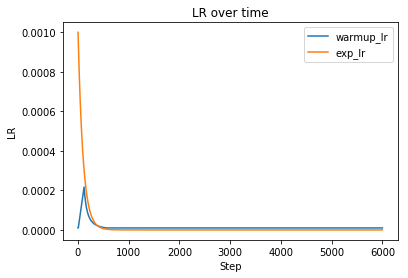

In [7]:
# Define the schedulers
get_warmup_lr = lambda e: max(min_lr, glimpse_net_size**(-0.5) * min(
    (e+1)**(-decay_rate), (e+1)*warmup_steps**(-(decay_rate+1))
))
get_exp_lr = lambda e: 0.99**e

# Get the actual LR schedulers
total_steps = steps_per_epoch * num_epochs
warmup_lr = [lr*get_warmup_lr(e) for e in range(total_steps)]
exp_lr = [1e-3*get_exp_lr(e) for e in range(total_steps)]

# Plot them
plt.plot(range(1, total_steps+1), warmup_lr)
plt.plot(range(1, total_steps+1), exp_lr)
plt.legend(['warmup_lr', 'exp_lr'])
plt.xlabel('Step'); plt.ylabel('LR')
plt.title('LR over time')
(sum(warmup_lr), sum(warmup_lr[warmup_steps:])), (sum(exp_lr), sum(exp_lr[warmup_steps:]))

Epoch   1/400) lr = 1e-05
 b    500/  3000 >> 152.2 ms/b | lr: 1.00e-05 | grad 2norm:  2.79 | grad inf norm:  2.160
       Weights || abs max:  0.32 (18832.13) | mean:  6.47e-05 ( 0.09) | var: 1.47e-03 ( 8808.23)
        Biases || abs max:  0.00 (2620900.75) | mean:  6.78e-05 (2022.93) | var: 1.64e-07 (2184957657088.00)
                  class loss: 2.292 | steps: 4.910 | reward:  0.134 | acc.: 13.37%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 158.8 ms/b | lr: 1.00e-05 | grad 2norm:  3.24 | grad inf norm:  2.530
       Weights || abs max:  0.32 (18383.94) | mean:  1.58e-04 ( 0.09) | var: 1.47e-03 (15719.09)
        Biases || abs max:  0.01 (44837.98) | mean:  3.88e-04 (40.26) | var: 1.11e-06 (16100440.00)
                  class loss: 2.277 | steps: 4.620 | reward:  0.167 | acc.: 16.66%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounte

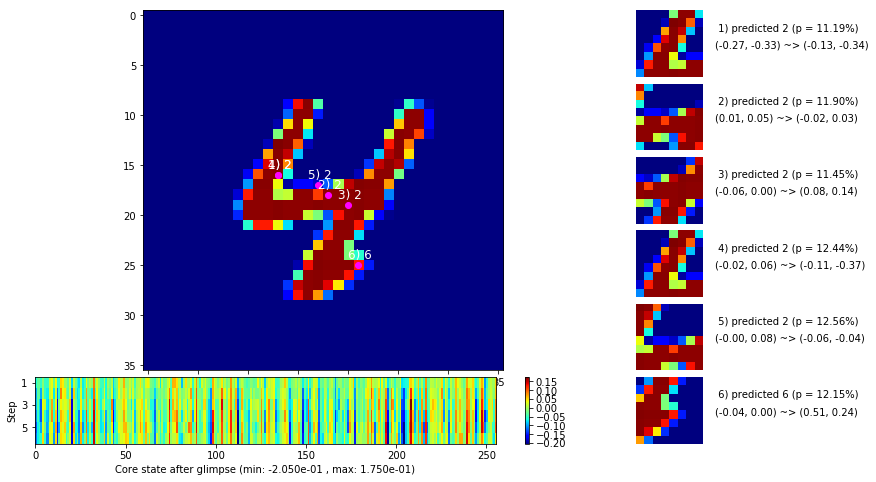

 b   1500/  3000 >> 140.7 ms/b | lr: 1.45e-05 | grad 2norm:  3.54 | grad inf norm:  2.694
       Weights || abs max:  0.32 (51388.49) | mean:  3.61e-04 ( 0.16) | var: 1.47e-03 (238211.33)
        Biases || abs max:  0.01 (14116.45) | mean:  1.05e-03 (19.72) | var: 3.70e-06 (2121978.50)
                  class loss: 2.252 | steps: 4.487 | reward:  0.209 | acc.: 20.91%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.7 ms/b | lr: 1.81e-05 | grad 2norm:  4.25 | grad inf norm:  2.616
       Weights || abs max:  0.32 (43450.62) | mean:  9.48e-04 ( 0.19) | var: 1.49e-03 (71100.20)
        Biases || abs max:  0.02 (12935.09) | mean:  2.79e-03 (15.03) | var: 1.42e-05 (3584127.50)
                  class loss: 2.168 | steps: 4.375 | reward:  0.270 | acc.: 26.96%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

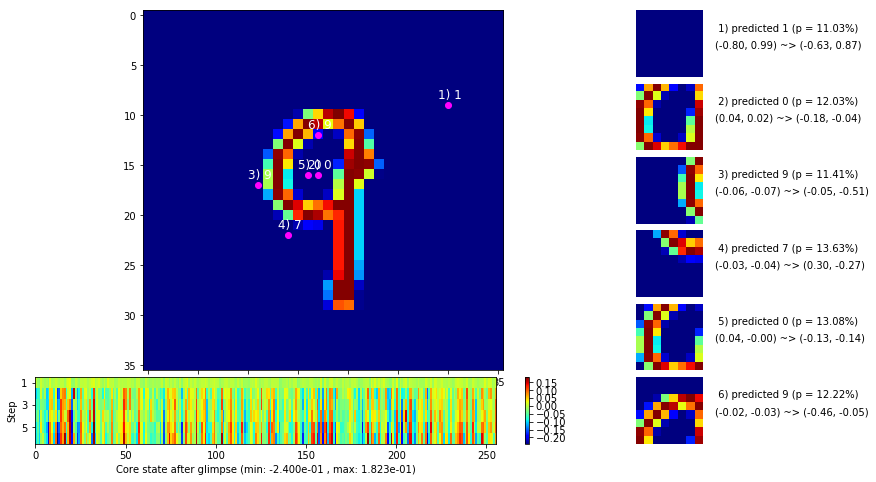

 b   2500/  3000 >> 137.1 ms/b | lr: 2.35e-05 | grad 2norm:  6.35 | grad inf norm:  2.341
       Weights || abs max:  0.32 (51234.11) | mean:  1.75e-03 ( 0.27) | var: 1.52e-03 (57911.34)
        Biases || abs max:  0.03 (232418.72) | mean:  5.15e-03 (182.03) | var: 3.31e-05 (17783369728.00)
                  class loss: 2.049 | steps: 4.469 | reward:  0.279 | acc.: 27.86%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.9 ms/b | lr: 2.71e-05 | grad 2norm:  7.90 | grad inf norm:  2.522
       Weights || abs max:  0.32 (43410.54) | mean:  2.10e-03 ( 0.27) | var: 1.54e-03 (26036.24)
        Biases || abs max:  0.04 (19352.81) | mean:  6.40e-03 (15.40) | var: 4.51e-05 (21972444.00)
                  class loss: 1.961 | steps: 4.391 | reward:  0.316 | acc.: 31.56%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0

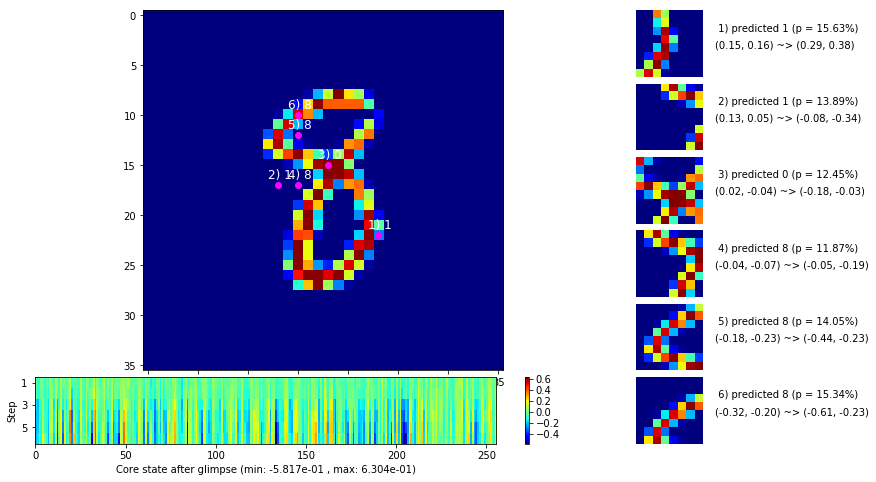

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


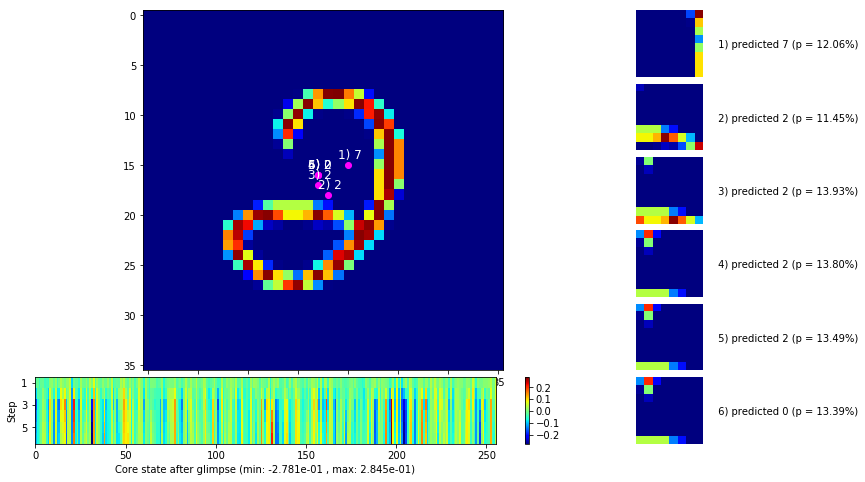


	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


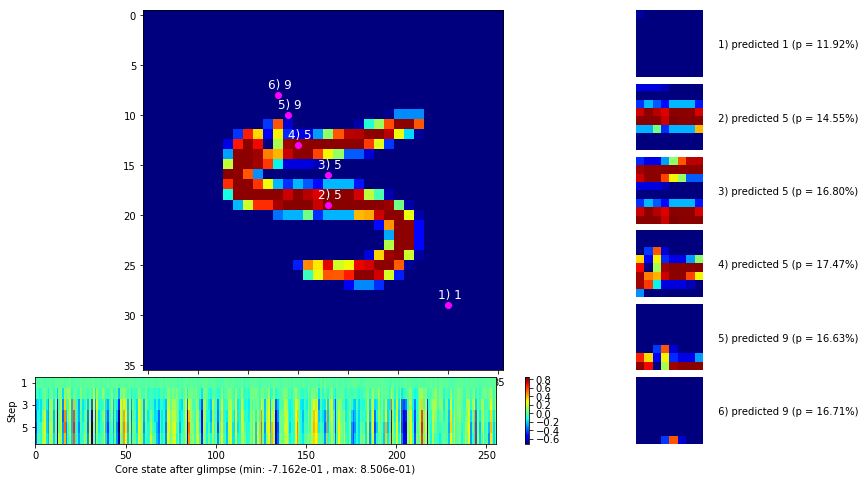

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


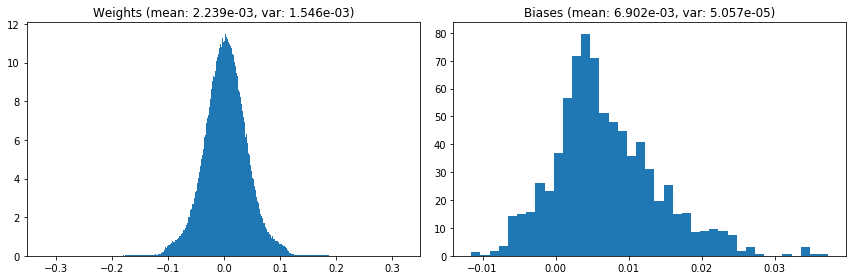

                                      Location network weights and biases


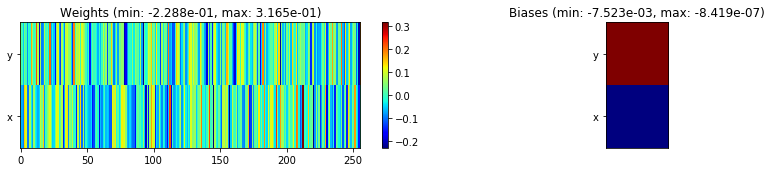

---------------------------------------------------------------------------------------------------------------
Elapsed time:  429.77 sec | TRAIN >> class loss: 2.1666 | steps:  4.542    | reward:  0.2289    | acc.: 22.887% 
                          | VAL   >> class loss: 1.7108 | steps:  3.697    | reward:  0.4084    | acc.: 40.840% 


Epoch   2/400) lr = 2.894e-05
 b    500/  3000 >> 133.4 ms/b | lr: 3.26e-05 | grad 2norm:  8.97 | grad inf norm:  2.562
       Weights || abs max:  0.32 (62008.89) | mean:  2.33e-03 ( 0.30) | var: 1.55e-03 (118069.62)
        Biases || abs max:  0.04 (18787.70) | mean:  7.31e-03 (13.99) | var: 5.54e-05 (12099448.00)
                  class loss: 1.946 | steps: 4.430 | reward:  0.316 | acc.: 31.57%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 3.62e-05 | grad 2norm:  9.28 | grad inf norm:  2.587
       Weights || abs max:  0.32 (144146.03) | mean:  2.55e-03 ( 0.44) 

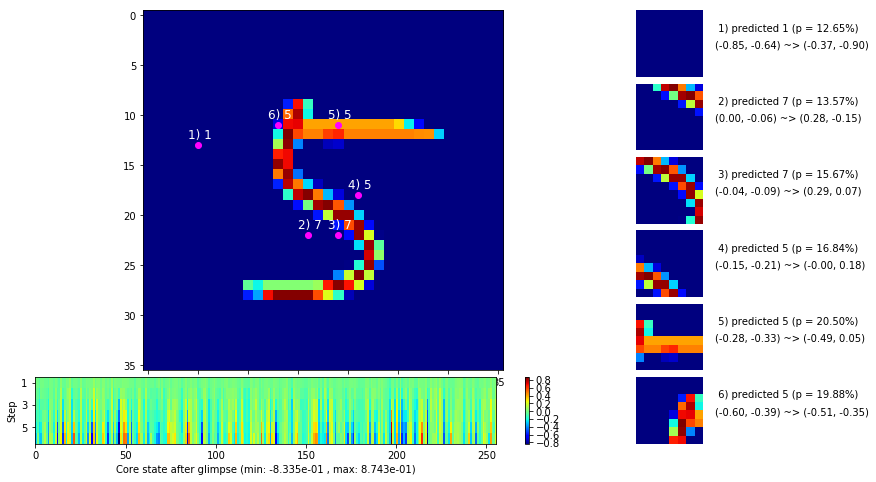

 b   1500/  3000 >> 133.7 ms/b | lr: 4.16e-05 | grad 2norm:  9.30 | grad inf norm:  2.536
       Weights || abs max:  0.32 (69114.52) | mean:  2.80e-03 ( 0.32) | var: 1.60e-03 (130271.48)
        Biases || abs max:  0.04 (16519.69) | mean:  9.41e-03 (12.41) | var: 8.69e-05 (5112848.50)
                  class loss: 1.934 | steps: 4.500 | reward:  0.311 | acc.: 31.12%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.7 ms/b | lr: 4.52e-05 | grad 2norm:  9.48 | grad inf norm:  2.431
       Weights || abs max:  0.32 (50247.21) | mean:  2.93e-03 ( 0.30) | var: 1.62e-03 (51173.57)
        Biases || abs max:  0.05 (21774.15) | mean:  1.02e-02 (15.21) | var: 1.06e-04 (10394009.00)
                  class loss: 1.948 | steps: 4.584 | reward:  0.300 | acc.: 29.96%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

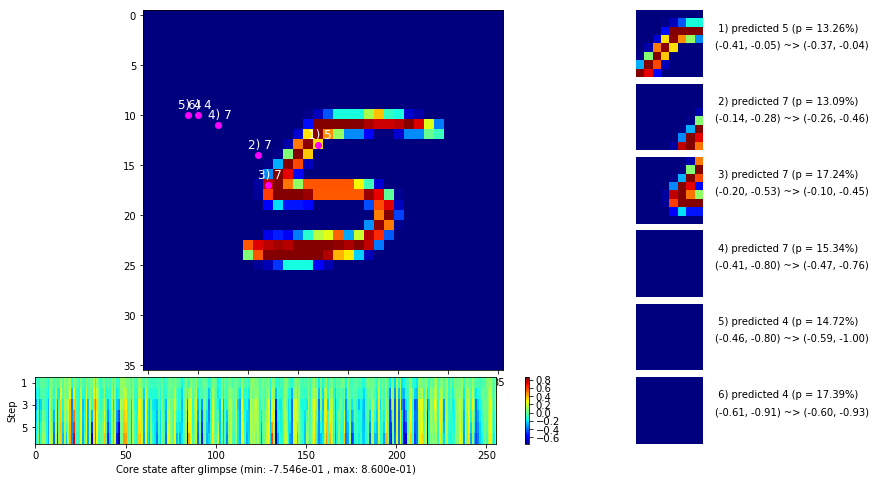

 b   2500/  3000 >> 141.7 ms/b | lr: 5.06e-05 | grad 2norm:  9.44 | grad inf norm:  2.366
       Weights || abs max:  0.32 (159476.45) | mean:  2.96e-03 ( 0.49) | var: 1.63e-03 (5634694.50)
        Biases || abs max:  0.06 (32205.53) | mean:  1.07e-02 (20.24) | var: 1.21e-04 (37057884.00)
                  class loss: 1.933 | steps: 4.595 | reward:  0.298 | acc.: 29.83%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 5.43e-05 | grad 2norm:  9.49 | grad inf norm:  2.405
       Weights || abs max:  0.32 (86085.77) | mean:  2.97e-03 ( 0.36) | var: 1.65e-03 (263211.34)
        Biases || abs max:  0.06 (48741.74) | mean:  1.11e-02 (27.90) | var: 1.35e-04 (44353768.00)
                  class loss: 1.895 | steps: 4.577 | reward:  0.321 | acc.: 32.06%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0,

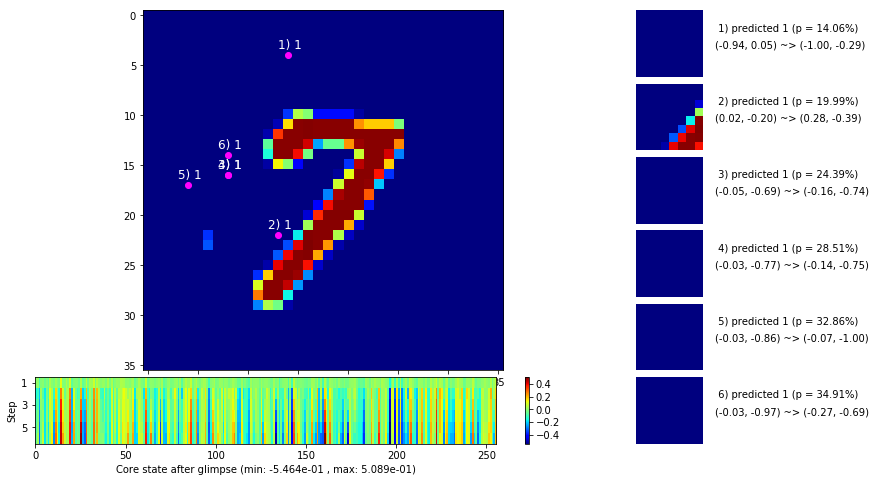

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


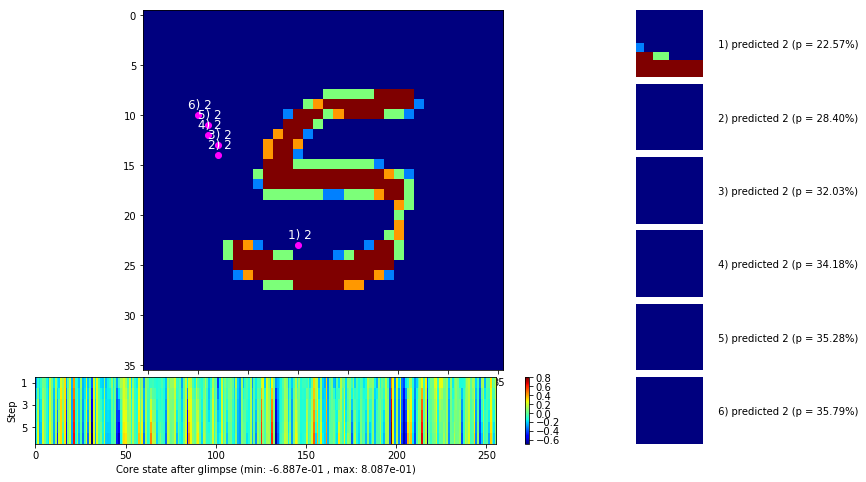


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


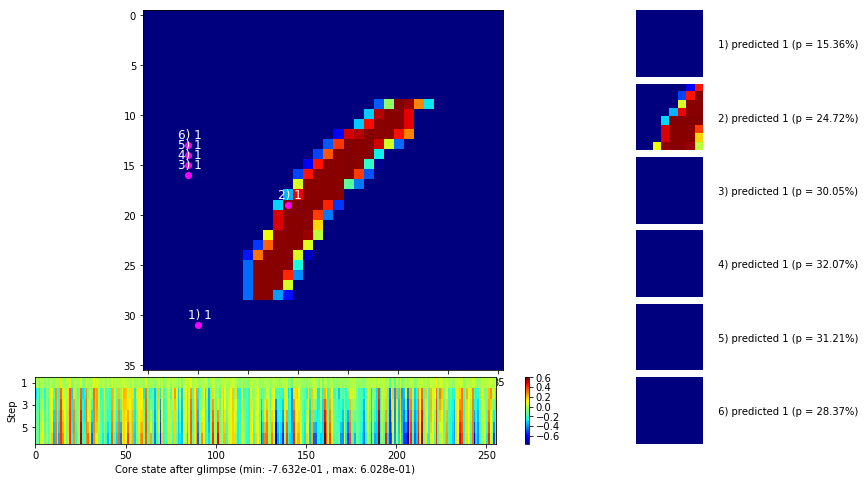

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


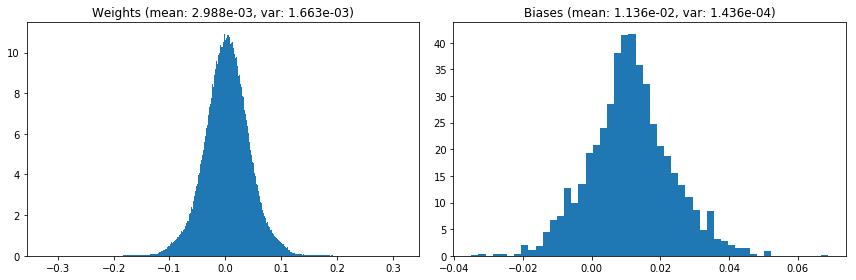

                                      Location network weights and biases


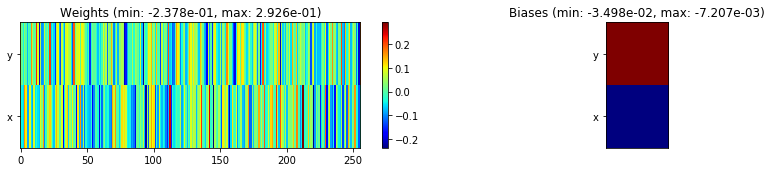

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.12 sec | TRAIN >> class loss: 1.9289 | steps:  4.518    | reward:  0.3120    | acc.: 31.205% 
                          | VAL   >> class loss: 1.7429 | steps:  4.313 :( | reward:  0.4022 :( | acc.: 40.220% :(


Epoch   3/400) lr = 5.606e-05
 b    500/  3000 >> 131.4 ms/b | lr: 5.97e-05 | grad 2norm:  9.86 | grad inf norm:  2.497
       Weights || abs max:  0.32 (86812.85) | mean:  2.98e-03 ( 0.36) | var: 1.67e-03 (773651.19)
        Biases || abs max:  0.07 (41173.54) | mean:  1.16e-02 (24.91) | var: 1.52e-04 (44559680.00)
                  class loss: 1.875 | steps: 4.584 | reward:  0.329 | acc.: 32.93%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 6.33e-05 | grad 2norm: 10.28 | grad inf norm:  2.534
       Weights || abs max:  0.32 (73641.60) | mean:  2.99e-03 ( 0.34)

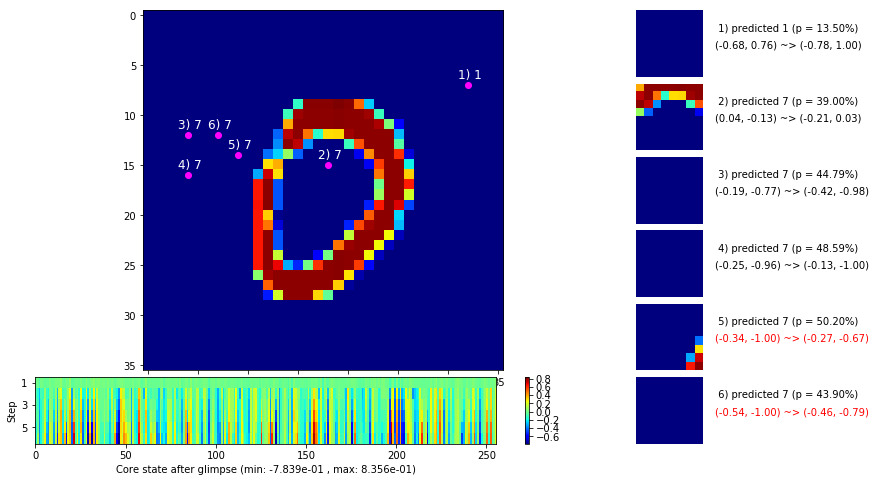

 b   1500/  3000 >> 132.6 ms/b | lr: 6.87e-05 | grad 2norm: 10.64 | grad inf norm:  2.476
       Weights || abs max:  0.32 (177948.48) | mean:  3.01e-03 ( 0.52) | var: 1.73e-03 (5442266.50)
        Biases || abs max:  0.09 (15860.16) | mean:  1.26e-02 (12.28) | var: 1.90e-04 (1132432.75)
                  class loss: 1.765 | steps: 4.518 | reward:  0.357 | acc.: 35.66%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.4 ms/b | lr: 7.23e-05 | grad 2norm: 10.86 | grad inf norm:  2.459
       Weights || abs max:  0.32 (102132.35) | mean:  2.99e-03 ( 0.40) | var: 1.76e-03 (328807.81)
        Biases || abs max:  0.10 (16789.54) | mean:  1.31e-02 (14.14) | var: 2.09e-04 (2693590.00)
                  class loss: 1.707 | steps: 4.441 | reward:  0.383 | acc.: 38.30%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

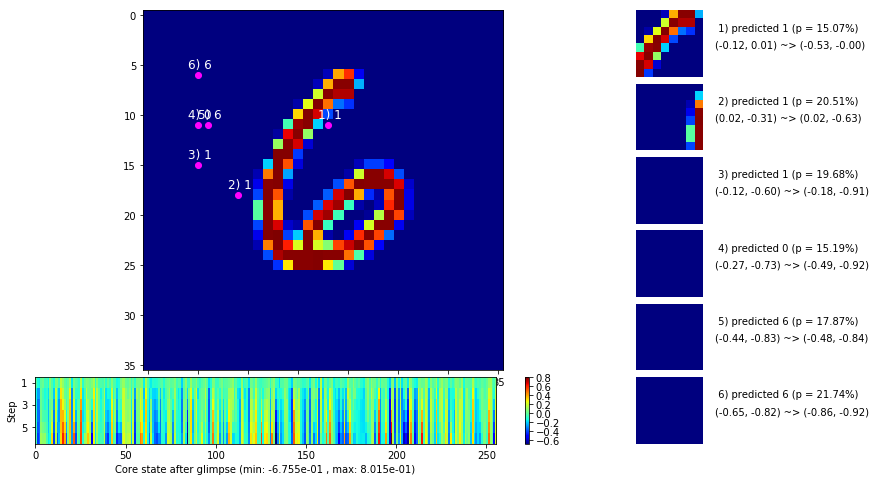

 b   2500/  3000 >> 132.1 ms/b | lr: 7.78e-05 | grad 2norm: 11.29 | grad inf norm:  2.529
       Weights || abs max:  0.32 (78290.70) | mean:  2.99e-03 ( 0.34) | var: 1.79e-03 (352053.91)
        Biases || abs max:  0.11 (25869.16) | mean:  1.36e-02 (16.87) | var: 2.30e-04 (40773132.00)
                  class loss: 1.632 | steps: 4.372 | reward:  0.414 | acc.: 41.41%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.1 ms/b | lr: 8.14e-05 | grad 2norm: 12.09 | grad inf norm:  2.688
       Weights || abs max:  0.32 (44393.83) | mean:  2.99e-03 ( 0.27) | var: 1.83e-03 (23014.18)
        Biases || abs max:  0.13 (10473.68) | mean:  1.42e-02 ( 9.13) | var: 2.52e-04 (1417918.38)
                  class loss: 1.532 | steps: 4.226 | reward:  0.452 | acc.: 45.17%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

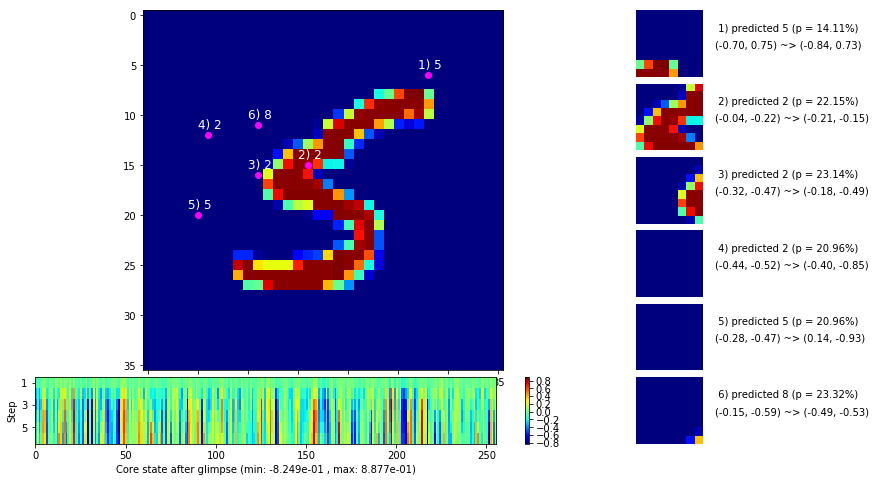

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


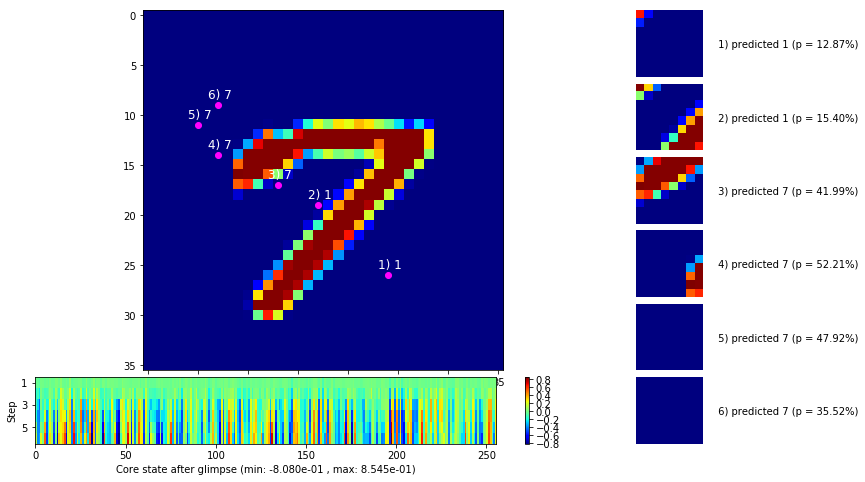


	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


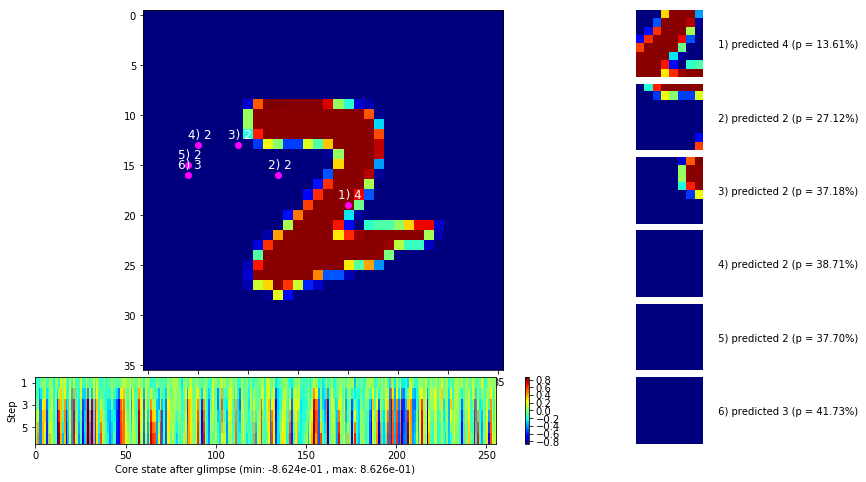

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


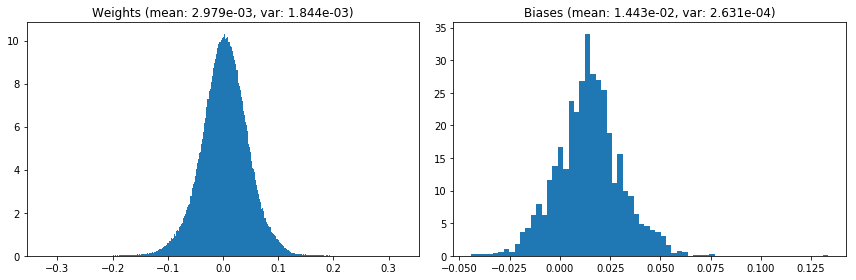

                                      Location network weights and biases


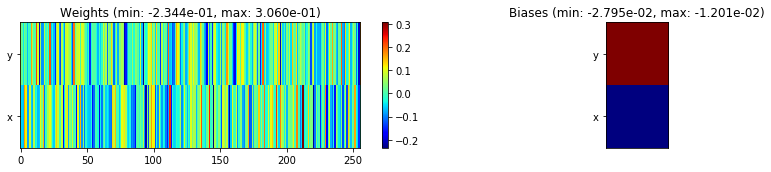

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.20 sec | TRAIN >> class loss: 1.7226 | steps:  4.451    | reward:  0.3800    | acc.: 38.005% 
                          | VAL   >> class loss: 1.2871 | steps:  3.746 :( | reward:  0.5632    | acc.: 56.320% 


Epoch   4/400) lr = 8.319e-05
 b    500/  3000 >> 141.7 ms/b | lr: 8.68e-05 | grad 2norm: 12.03 | grad inf norm:  2.644
       Weights || abs max:  0.32 (47025.55) | mean:  2.97e-03 ( 0.28) | var: 1.86e-03 (36374.96)
        Biases || abs max:  0.14 (32621.67) | mean:  1.47e-02 (27.21) | var: 2.72e-04 (249847744.00)
                  class loss: 1.503 | steps: 4.242 | reward:  0.460 | acc.: 45.96%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.9 ms/b | lr: 9.04e-05 | grad 2norm: 11.87 | grad inf norm:  2.599
       Weights || abs max:  0.33 (140011.64) | mean:  2.99e-03 ( 0.43) 

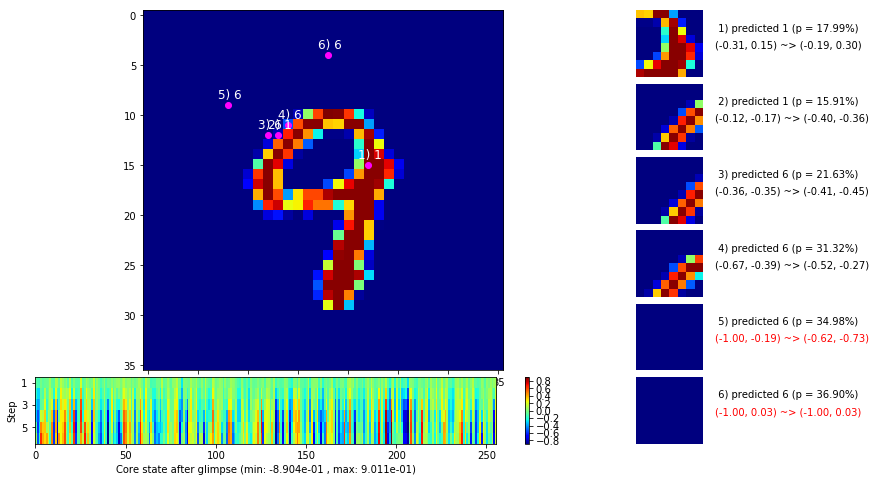

 b   1500/  3000 >> 133.1 ms/b | lr: 9.58e-05 | grad 2norm: 12.15 | grad inf norm:  2.603
       Weights || abs max:  0.33 (111960.45) | mean:  3.01e-03 ( 0.37) | var: 1.95e-03 (1718105.50)
        Biases || abs max:  0.17 ( 4261.71) | mean:  1.59e-02 ( 5.50) | var: 3.18e-04 (88013.72)
                  class loss: 1.367 | steps: 4.060 | reward:  0.510 | acc.: 50.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 9.95e-05 | grad 2norm: 11.73 | grad inf norm:  2.567
       Weights || abs max:  0.33 (52681.29) | mean:  3.04e-03 ( 0.28) | var: 2.00e-03 (214409.03)
        Biases || abs max:  0.19 ( 7835.09) | mean:  1.66e-02 ( 6.89) | var: 3.39e-04 (1645112.88)
                  class loss: 1.389 | steps: 4.018 | reward:  0.512 | acc.: 51.25%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

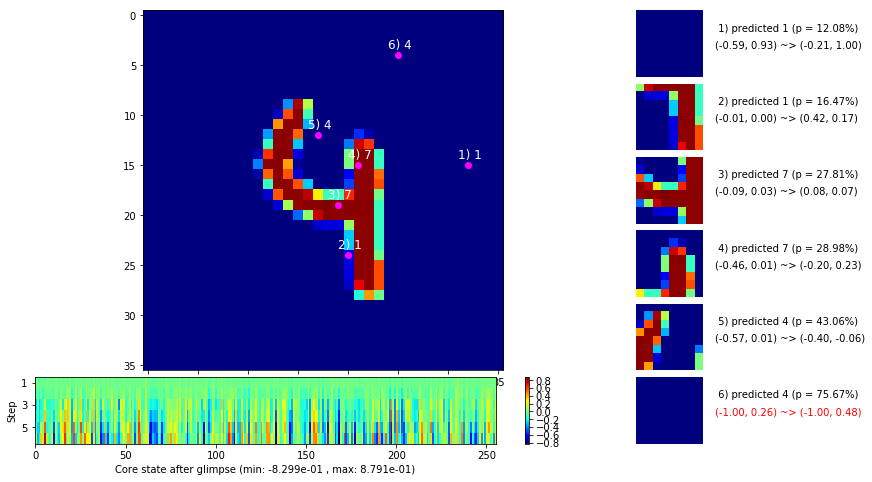

 b   2500/  3000 >> 134.5 ms/b | lr: 1.05e-04 | grad 2norm: 11.36 | grad inf norm:  2.602
       Weights || abs max:  0.33 (336067.00) | mean:  3.08e-03 ( 0.75) | var: 2.05e-03 (30518422.00)
        Biases || abs max:  0.20 ( 4225.93) | mean:  1.75e-02 ( 5.09) | var: 3.68e-04 (128502.36)
                  class loss: 1.455 | steps: 4.041 | reward:  0.485 | acc.: 48.54%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.4 ms/b | lr: 1.09e-04 | grad 2norm: 11.42 | grad inf norm:  2.622
       Weights || abs max:  0.34 (99006.10) | mean:  3.16e-03 ( 0.36) | var: 2.11e-03 (1268907.00)
        Biases || abs max:  0.21 ( 5225.49) | mean:  1.86e-02 ( 5.08) | var: 4.04e-04 (364967.84)
                  class loss: 1.461 | steps: 4.035 | reward:  0.488 | acc.: 48.84%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0

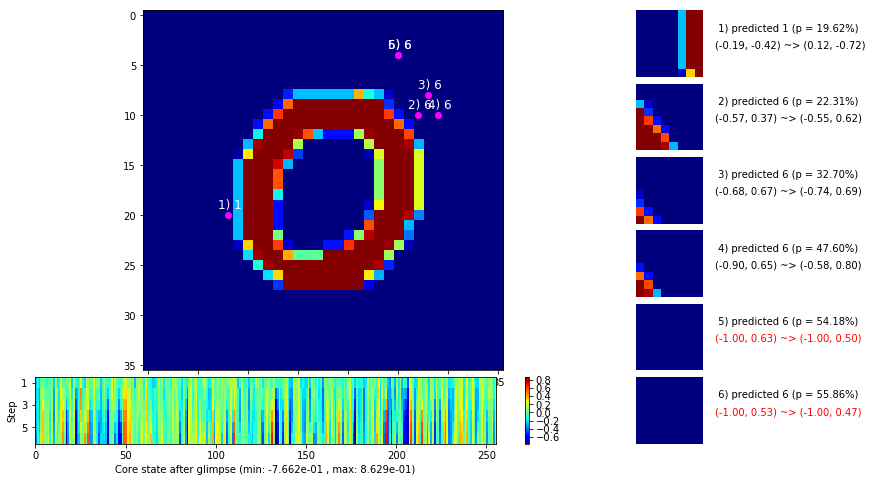

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


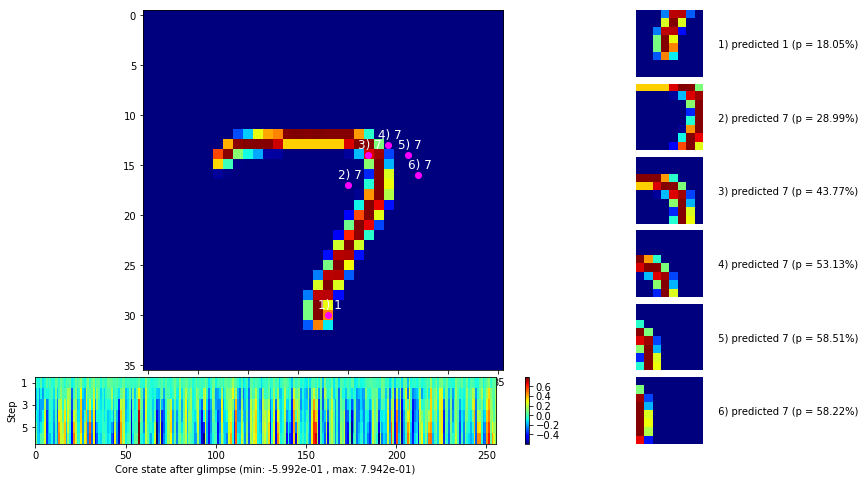


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


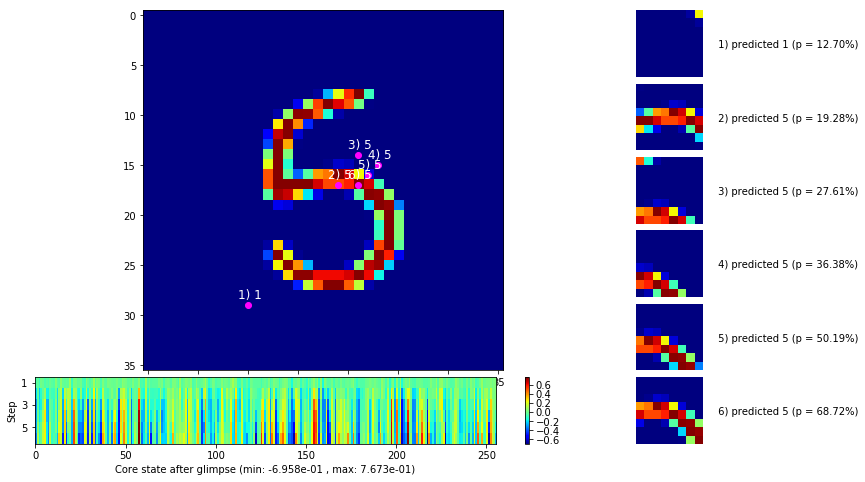

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


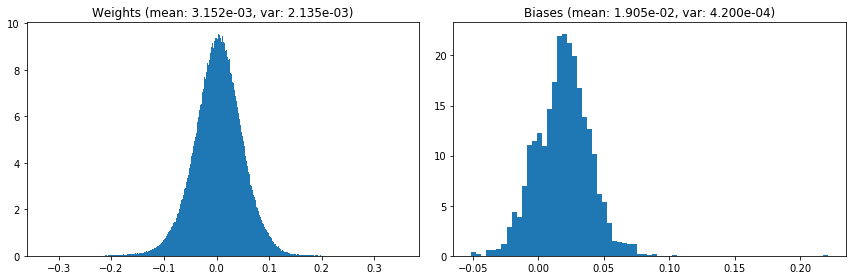

                                      Location network weights and biases


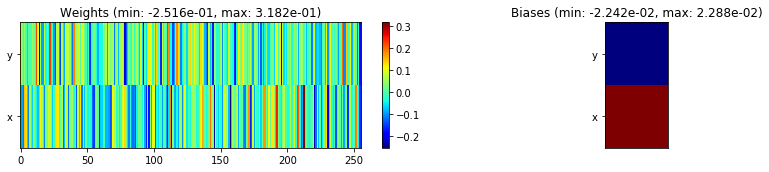

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.16 sec | TRAIN >> class loss: 1.4392 | steps:  4.098    | reward:  0.4884    | acc.: 48.840% 
                          | VAL   >> class loss: 1.2539 | steps:  3.581    | reward:  0.5752    | acc.: 57.520% 


Epoch   5/400) lr = 0.0001103
 b    500/  3000 >> 133.4 ms/b | lr: 1.14e-04 | grad 2norm: 11.45 | grad inf norm:  2.507
       Weights || abs max:  0.36 (90648.18) | mean:  3.12e-03 ( 0.36) | var: 2.16e-03 (814769.50)
        Biases || abs max:  0.23 ( 2980.21) | mean:  1.95e-02 ( 4.49) | var: 4.36e-04 (37009.95)
                  class loss: 1.443 | steps: 4.009 | reward:  0.494 | acc.: 49.41%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.2 ms/b | lr: 1.18e-04 | grad 2norm: 11.28 | grad inf norm:  2.443
       Weights || abs max:  0.37 (79175.31) | mean:  2.99e-03 ( 0.34) | va

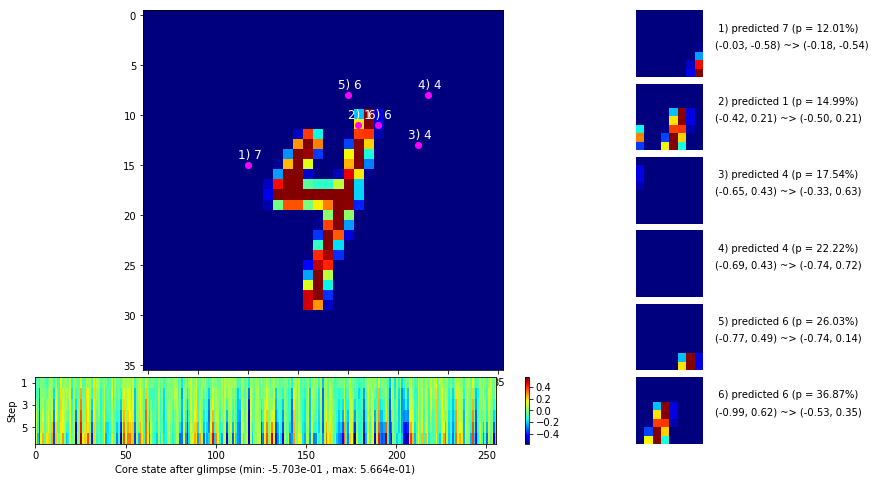

 b   1500/  3000 >> 135.3 ms/b | lr: 1.23e-04 | grad 2norm: 11.94 | grad inf norm:  2.503
       Weights || abs max:  0.38 (87844.31) | mean:  2.80e-03 ( 0.34) | var: 2.27e-03 (555317.31)
        Biases || abs max:  0.25 ( 5159.72) | mean:  2.08e-02 ( 5.15) | var: 4.97e-04 (471872.59)
                  class loss: 1.245 | steps: 3.816 | reward:  0.575 | acc.: 57.47%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 141.7 ms/b | lr: 1.27e-04 | grad 2norm: 12.09 | grad inf norm:  2.535
       Weights || abs max:  0.40 (113212.50) | mean:  2.61e-03 ( 0.38) | var: 2.33e-03 (1299475.00)
        Biases || abs max:  0.26 ( 2516.87) | mean:  2.15e-02 ( 3.65) | var: 5.25e-04 (23597.58)
                  class loss: 1.190 | steps: 3.749 | reward:  0.589 | acc.: 58.89%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

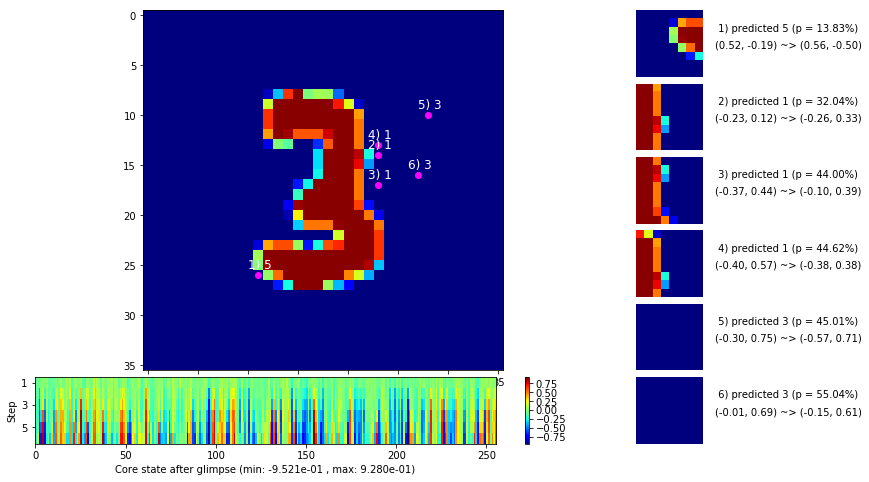

 b   2500/  3000 >> 133.9 ms/b | lr: 1.32e-04 | grad 2norm: 11.74 | grad inf norm:  2.536
       Weights || abs max:  0.41 (80637.80) | mean:  2.34e-03 ( 0.33) | var: 2.39e-03 (519087.97)
        Biases || abs max:  0.28 ( 3460.31) | mean:  2.19e-02 ( 5.14) | var: 5.47e-04 (58624.44)
                  class loss: 1.084 | steps: 3.661 | reward:  0.636 | acc.: 63.61%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 1.36e-04 | grad 2norm: 11.31 | grad inf norm:  2.490
       Weights || abs max:  0.43 (94680.36) | mean:  2.12e-03 ( 0.35) | var: 2.44e-03 (1667053.62)
        Biases || abs max:  0.31 ( 5200.73) | mean:  2.23e-02 ( 5.17) | var: 5.71e-04 (222172.98)
                  class loss: 0.996 | steps: 3.550 | reward:  0.665 | acc.: 66.46%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

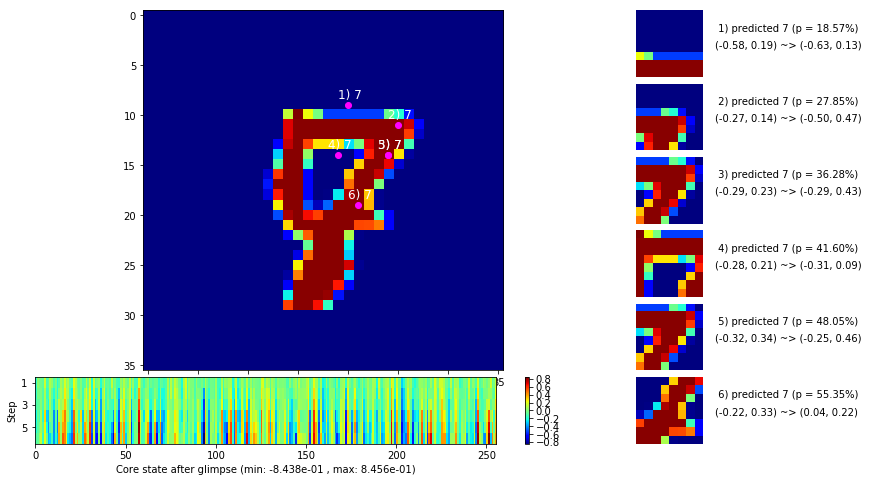

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


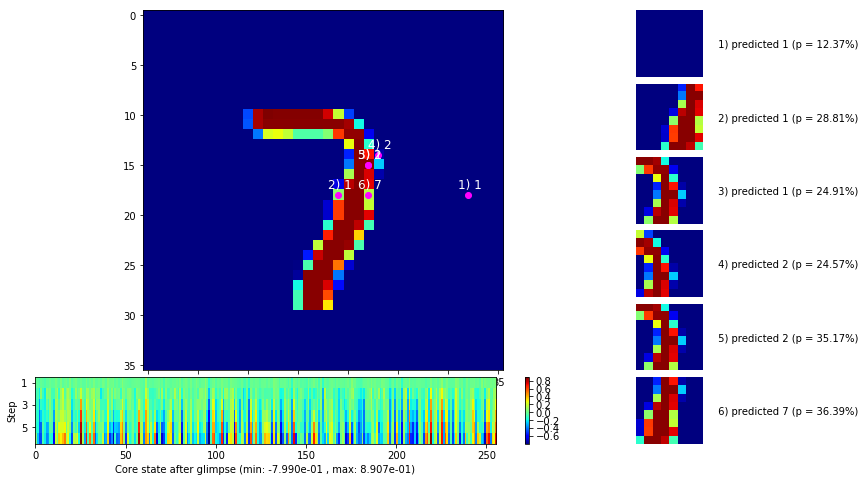


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


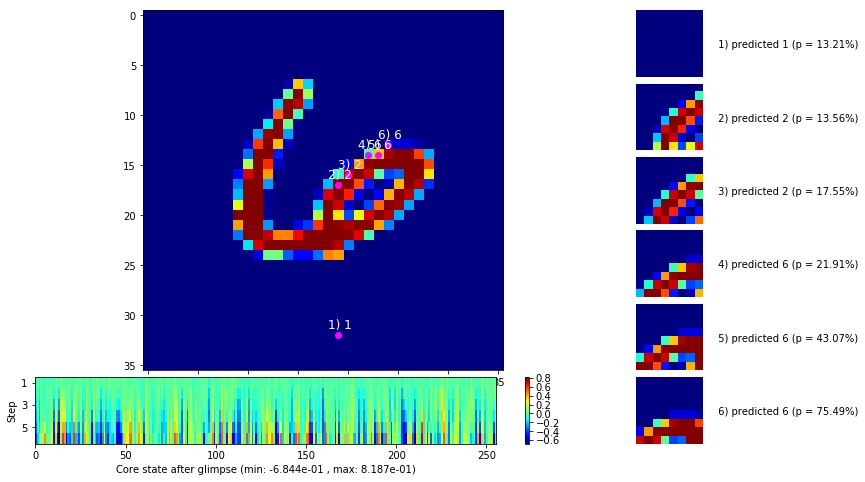

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


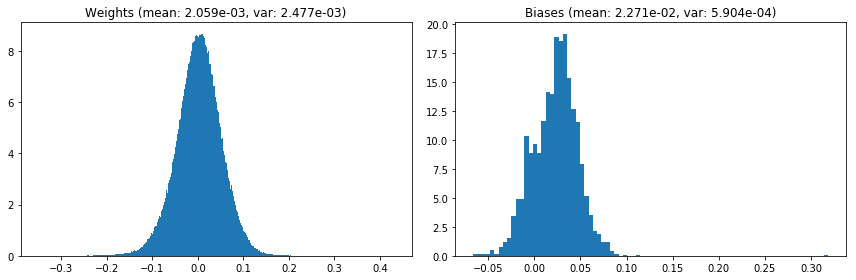

                                      Location network weights and biases


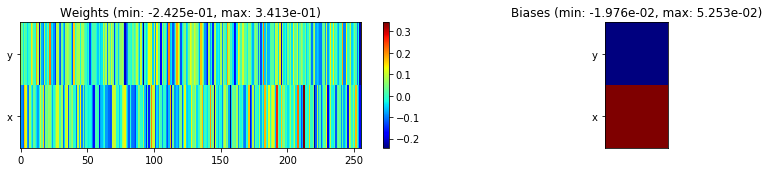

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.20 sec | TRAIN >> class loss: 1.2278 | steps:  3.792    | reward:  0.5772    | acc.: 57.717% 
                          | VAL   >> class loss: 0.8256 | steps:  3.159    | reward:  0.7312    | acc.: 73.120% 


Epoch   6/400) lr = 0.0001374
 b    500/  3000 >> 133.1 ms/b | lr: 1.41e-04 | grad 2norm: 11.06 | grad inf norm:  2.482
       Weights || abs max:  0.44 (48956.31) | mean:  1.98e-03 ( 0.27) | var: 2.51e-03 (48856.78)
        Biases || abs max:  0.33 (30656.84) | mean:  2.30e-02 (25.79) | var: 6.03e-04 (255849984.00)
                  class loss: 0.938 | steps: 3.455 | reward:  0.683 | acc.: 68.29%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.5 ms/b | lr: 1.45e-04 | grad 2norm: 10.62 | grad inf norm:  2.335
       Weights || abs max:  0.46 (65450.10) | mean:  1.82e-03 ( 0.30) |

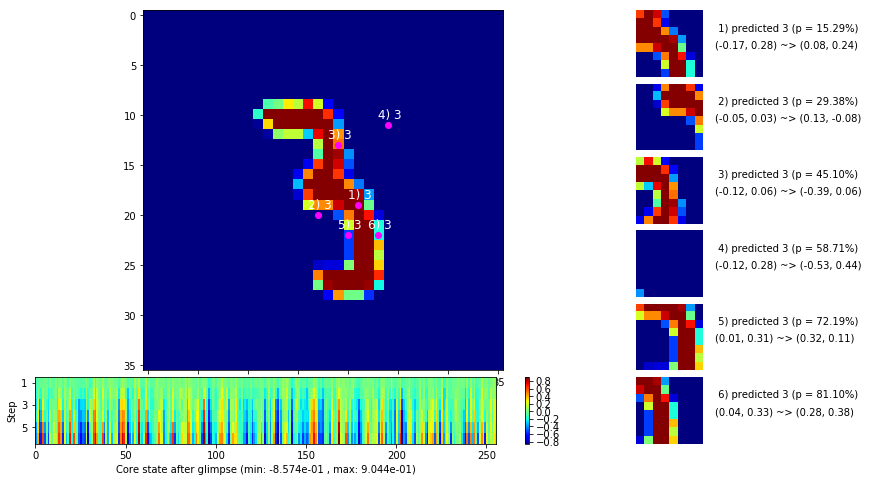

 b   1500/  3000 >> 134.7 ms/b | lr: 1.50e-04 | grad 2norm: 10.52 | grad inf norm:  2.364
       Weights || abs max:  0.47 (59042.86) | mean:  1.60e-03 ( 0.28) | var: 2.65e-03 (107851.96)
        Biases || abs max:  0.38 (10903.07) | mean:  2.42e-02 ( 7.84) | var: 6.70e-04 (4352796.50)
                  class loss: 0.858 | steps: 3.350 | reward:  0.714 | acc.: 71.37%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.9 ms/b | lr: 1.54e-04 | grad 2norm: 10.10 | grad inf norm:  2.293
       Weights || abs max:  0.49 (44312.41) | mean:  1.32e-03 ( 0.25) | var: 2.71e-03 (134764.41)
        Biases || abs max:  0.40 ( 3854.94) | mean:  2.46e-02 ( 4.84) | var: 7.00e-04 (80056.90)
                  class loss: 0.801 | steps: 3.268 | reward:  0.734 | acc.: 73.43%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

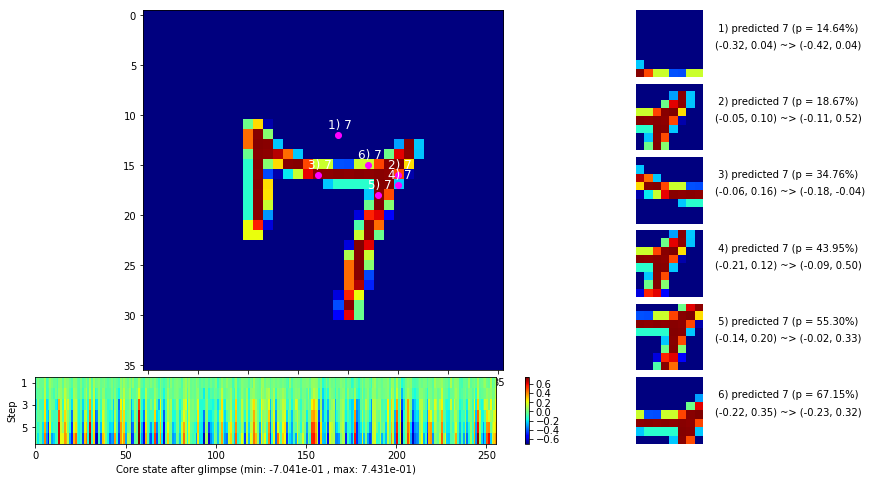

 b   2500/  3000 >> 135.0 ms/b | lr: 1.59e-04 | grad 2norm: 10.07 | grad inf norm:  2.278
       Weights || abs max:  0.50 (97657.59) | mean:  1.07e-03 ( 0.35) | var: 2.78e-03 (1744758.75)
        Biases || abs max:  0.43 ( 5297.17) | mean:  2.49e-02 ( 6.13) | var: 7.28e-04 (194775.56)
                  class loss: 0.749 | steps: 3.210 | reward:  0.752 | acc.: 75.19%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.7 ms/b | lr: 1.63e-04 | grad 2norm:  9.62 | grad inf norm:  2.256
       Weights || abs max:  0.51 (335874.62) | mean:  8.26e-04 ( 0.74) | var: 2.85e-03 (51605548.00)
        Biases || abs max:  0.45 ( 5060.39) | mean:  2.52e-02 ( 5.55) | var: 7.61e-04 (253265.67)
                  class loss: 0.728 | steps: 3.164 | reward:  0.764 | acc.: 76.38%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

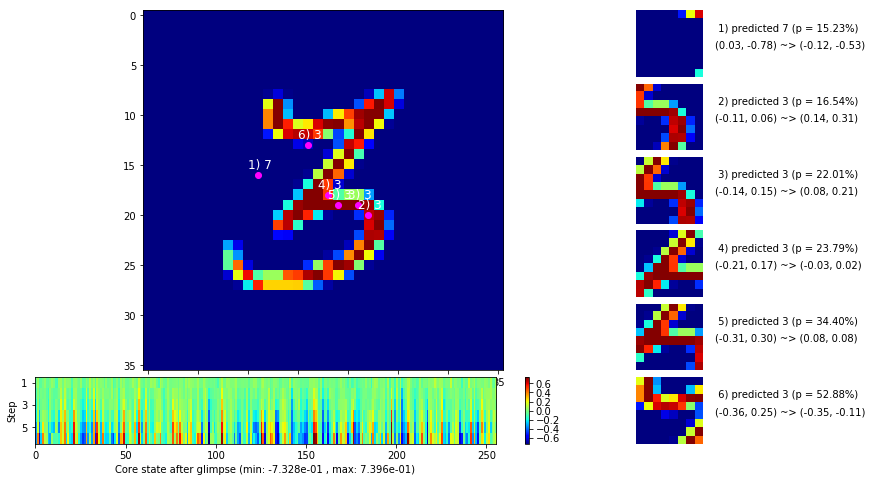

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


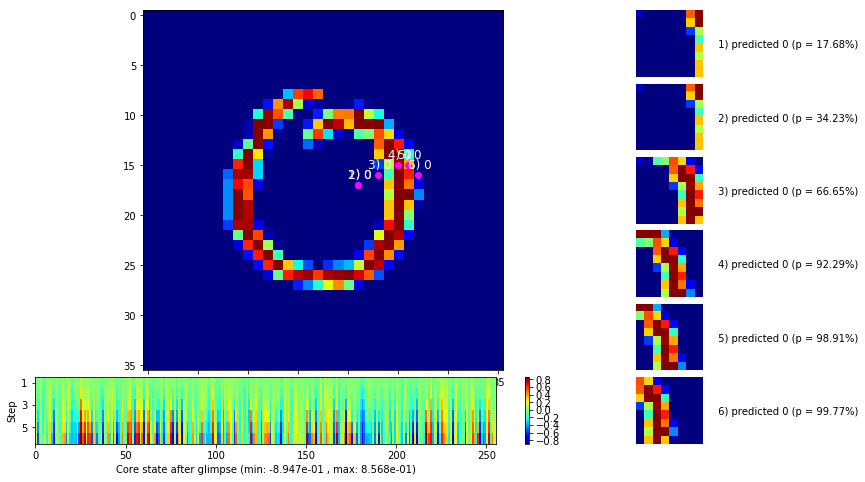


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


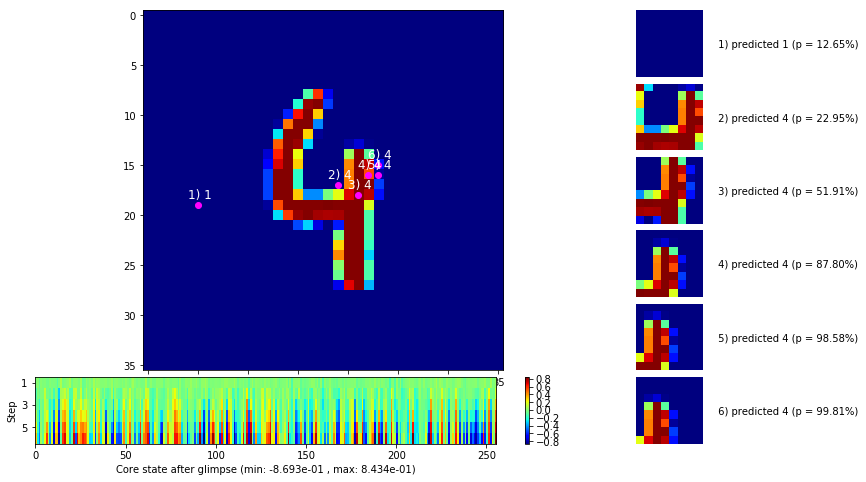

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


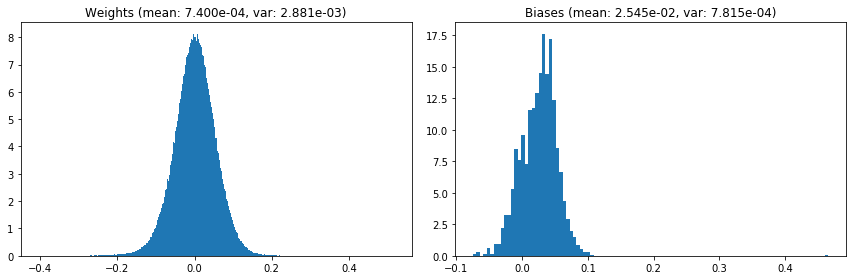

                                      Location network weights and biases


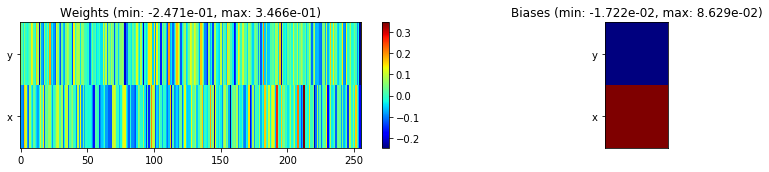

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.05 sec | TRAIN >> class loss: 0.8296 | steps:  3.308    | reward:  0.7250    | acc.: 72.502% 
                          | VAL   >> class loss: 0.6784 | steps:  2.925    | reward:  0.7794    | acc.: 77.940% 


Epoch   7/400) lr = 0.0001646
 b    500/  3000 >> 145.9 ms/b | lr: 1.68e-04 | grad 2norm:  9.29 | grad inf norm:  2.168
       Weights || abs max:  0.52 (41450.62) | mean:  6.78e-04 ( 0.24) | var: 2.91e-03 (23920.34)
        Biases || abs max:  0.48 ( 7506.94) | mean:  2.55e-02 ( 7.43) | var: 7.94e-04 (3869969.25)
                  class loss: 0.692 | steps: 3.105 | reward:  0.775 | acc.: 77.54%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.1 ms/b | lr: 1.72e-04 | grad 2norm:  9.16 | grad inf norm:  2.182
       Weights || abs max:  0.53 (77094.02) | mean:  5.59e-04 ( 0.30) | v

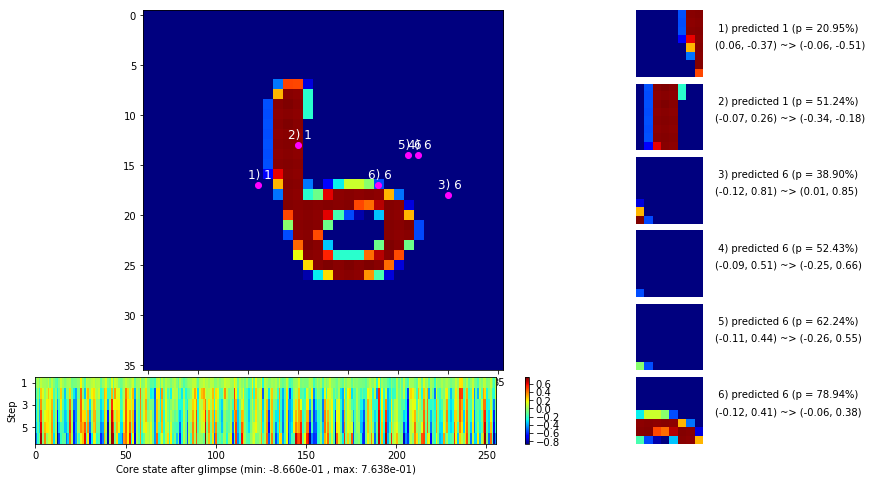

 b   1500/  3000 >> 134.5 ms/b | lr: 1.77e-04 | grad 2norm:  9.06 | grad inf norm:  2.116
       Weights || abs max:  0.54 (70655.38) | mean:  4.25e-04 ( 0.29) | var: 3.06e-03 (478933.94)
        Biases || abs max:  0.52 ( 8962.51) | mean:  2.61e-02 ( 7.07) | var: 8.55e-04 (1055222.00)
                  class loss: 0.644 | steps: 3.027 | reward:  0.786 | acc.: 78.59%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.3 ms/b | lr: 1.81e-04 | grad 2norm:  8.91 | grad inf norm:  2.138
       Weights || abs max:  0.54 (68049.02) | mean:  3.42e-04 ( 0.29) | var: 3.13e-03 (165798.27)
        Biases || abs max:  0.54 ( 7016.51) | mean:  2.65e-02 ( 7.67) | var: 8.97e-04 (846777.31)
                  class loss: 0.639 | steps: 3.014 | reward:  0.788 | acc.: 78.81%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

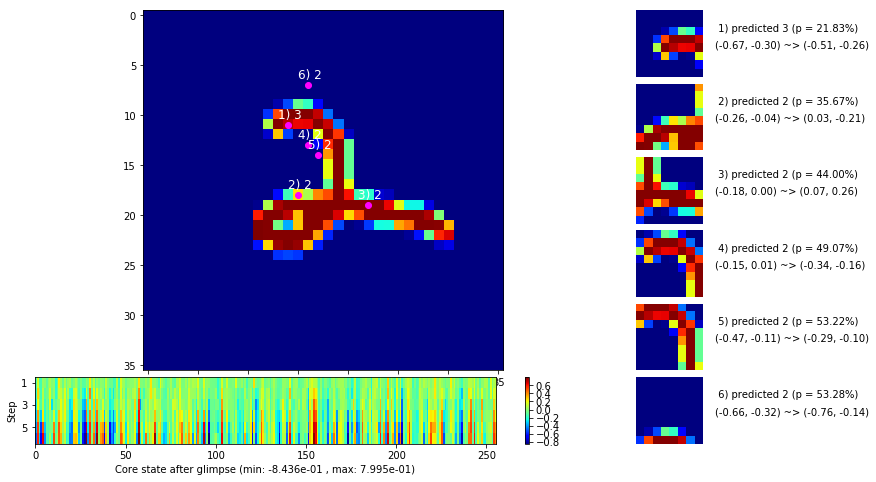

 b   2500/  3000 >> 134.7 ms/b | lr: 1.86e-04 | grad 2norm:  8.73 | grad inf norm:  2.109
       Weights || abs max:  0.55 (70056.73) | mean:  1.97e-04 ( 0.28) | var: 3.21e-03 (998651.00)
        Biases || abs max:  0.56 ( 5161.23) | mean:  2.67e-02 ( 6.20) | var: 9.31e-04 (627478.50)
                  class loss: 0.617 | steps: 2.972 | reward:  0.795 | acc.: 79.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.6 ms/b | lr: 1.90e-04 | grad 2norm:  8.49 | grad inf norm:  2.103
       Weights || abs max:  0.56 (59428.27) | mean:  3.90e-05 ( 0.27) | var: 3.28e-03 (235242.25)
        Biases || abs max:  0.58 (12893.19) | mean:  2.69e-02 (11.96) | var: 9.64e-04 (10272602.00)
                  class loss: 0.574 | steps: 2.876 | reward:  0.809 | acc.: 80.95%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

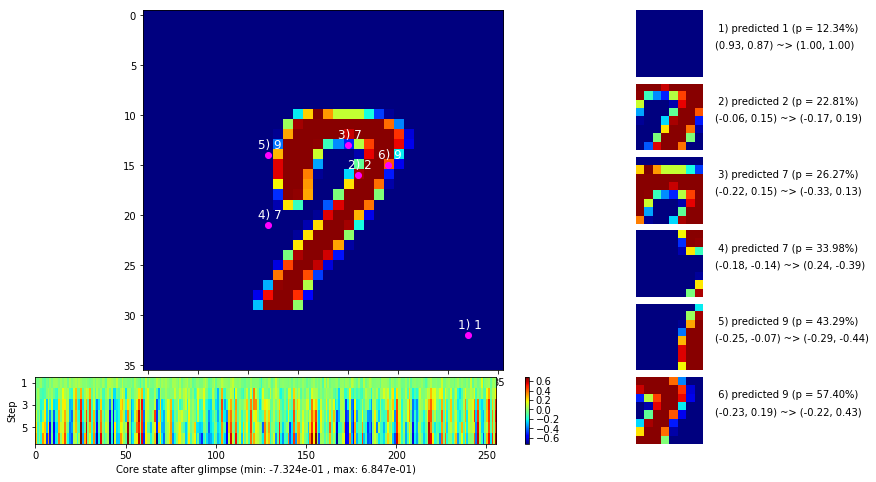

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


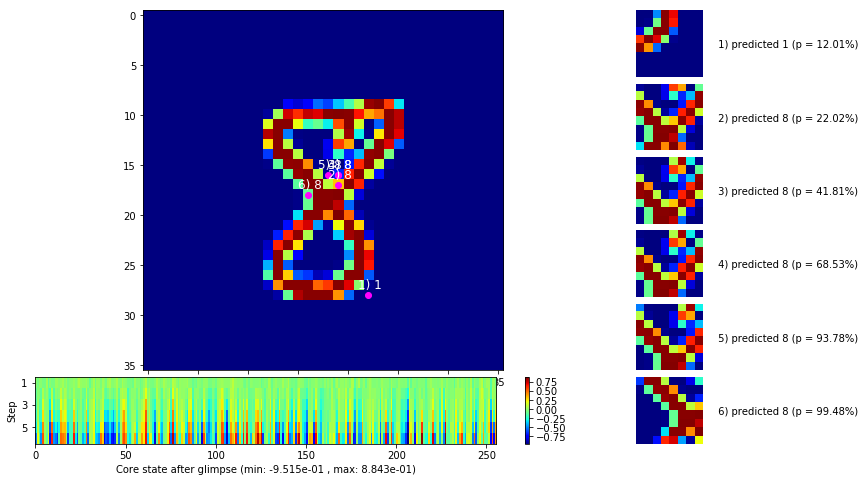


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


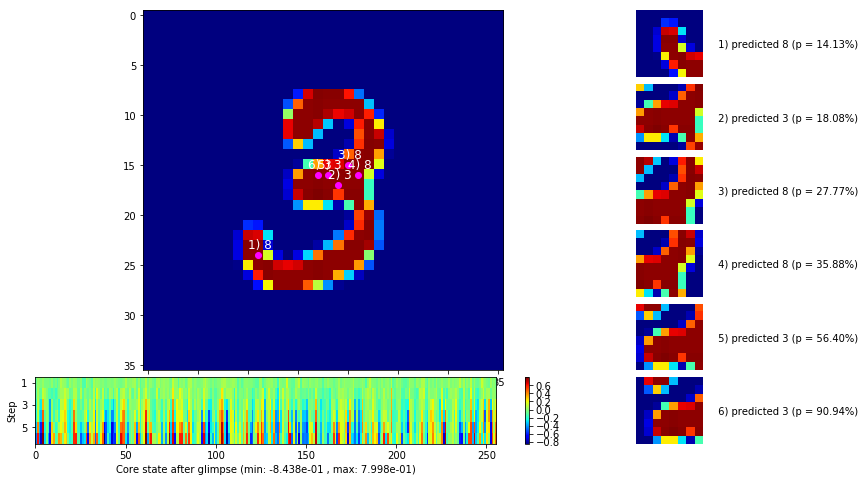

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


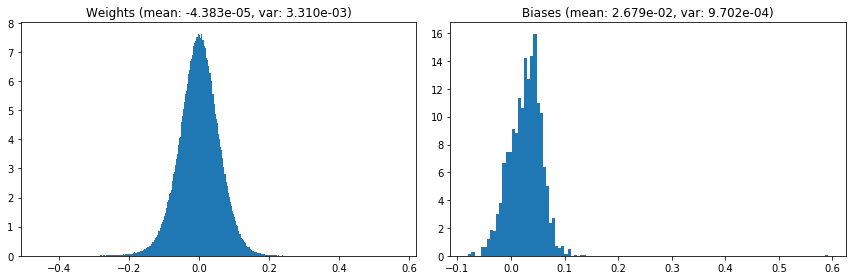

                                      Location network weights and biases


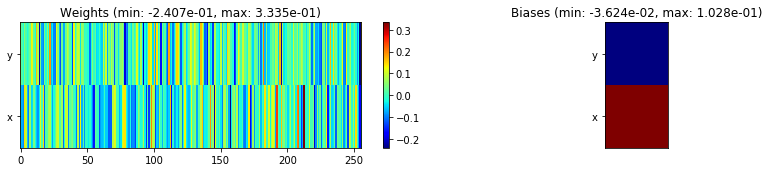

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.61 sec | TRAIN >> class loss: 0.6373 | steps:  3.011    | reward:  0.7896    | acc.: 78.963% 
                          | VAL   >> class loss: 0.5256 | steps:  2.620    | reward:  0.8302    | acc.: 83.020% 


Epoch   8/400) lr = 0.0001917
 b    500/  3000 >> 131.4 ms/b | lr: 1.95e-04 | grad 2norm:  8.02 | grad inf norm:  1.892
       Weights || abs max:  0.57 (72325.55) | mean: -1.28e-04 ( 0.28) | var: 3.35e-03 (466298.56)
        Biases || abs max:  0.60 ( 5245.31) | mean:  2.68e-02 ( 5.50) | var: 9.88e-04 (2592073.75)
                  class loss: 0.533 | steps: 2.828 | reward:  0.825 | acc.: 82.49%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 1.99e-04 | grad 2norm:  7.97 | grad inf norm:  1.966
       Weights || abs max:  0.58 (55021.69) | mean: -2.17e-04 ( 0.25) | 

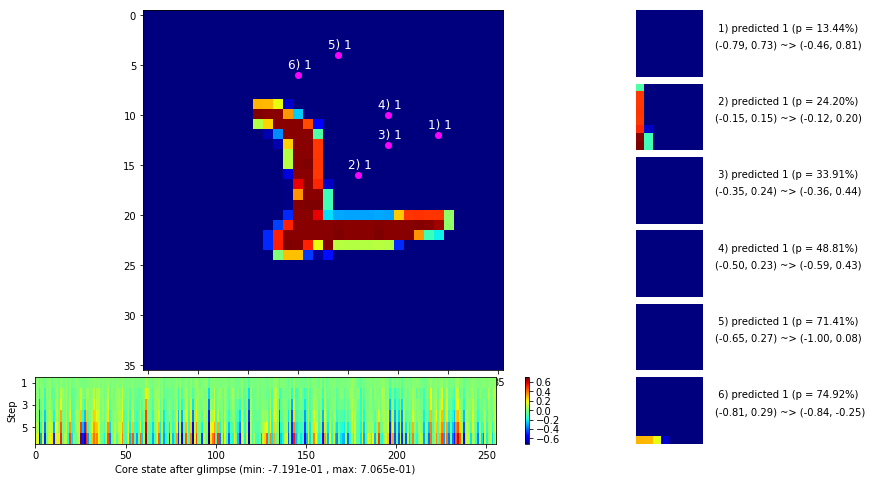

 b   1500/  3000 >> 136.5 ms/b | lr: 2.04e-04 | grad 2norm:  8.37 | grad inf norm:  2.023
       Weights || abs max:  0.59 (88304.85) | mean: -3.14e-04 ( 0.31) | var: 3.50e-03 (974765.62)
        Biases || abs max:  0.64 ( 3656.89) | mean:  2.72e-02 ( 4.61) | var: 1.06e-03 (147010.47)
                  class loss: 0.575 | steps: 2.830 | reward:  0.804 | acc.: 80.37%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.5 ms/b | lr: 2.08e-04 | grad 2norm:  8.05 | grad inf norm:  1.992
       Weights || abs max:  0.59 (48402.21) | mean: -4.88e-04 ( 0.24) | var: 3.57e-03 (66653.73)
        Biases || abs max:  0.65 (17071.57) | mean:  2.72e-02 (11.95) | var: 1.09e-03 (28165690.00)
                  class loss: 0.563 | steps: 2.836 | reward:  0.811 | acc.: 81.13%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

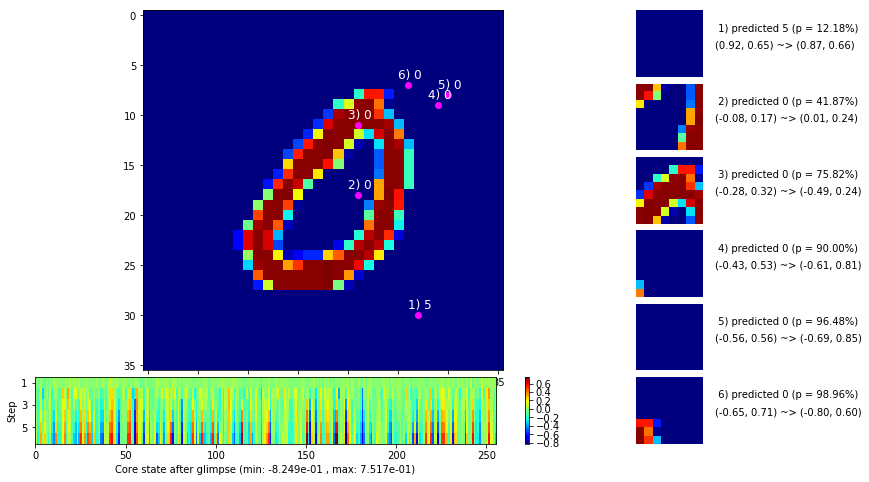

 b   2500/  3000 >> 132.0 ms/b | lr: 2.13e-04 | grad 2norm:  7.71 | grad inf norm:  1.971
       Weights || abs max:  0.61 (306146.22) | mean: -6.08e-04 ( 0.67) | var: 3.65e-03 (55986452.00)
        Biases || abs max:  0.67 ( 4823.78) | mean:  2.73e-02 ( 5.11) | var: 1.13e-03 (273291.22)
                  class loss: 0.534 | steps: 2.779 | reward:  0.825 | acc.: 82.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.1 ms/b | lr: 2.17e-04 | grad 2norm:  7.56 | grad inf norm:  1.900
       Weights || abs max:  0.61 (33502.96) | mean: -7.47e-04 ( 0.22) | var: 3.73e-03 (11523.69)
        Biases || abs max:  0.69 ( 8805.00) | mean:  2.73e-02 ( 7.72) | var: 1.16e-03 (6019577.50)
                  class loss: 0.512 | steps: 2.775 | reward:  0.835 | acc.: 83.54%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

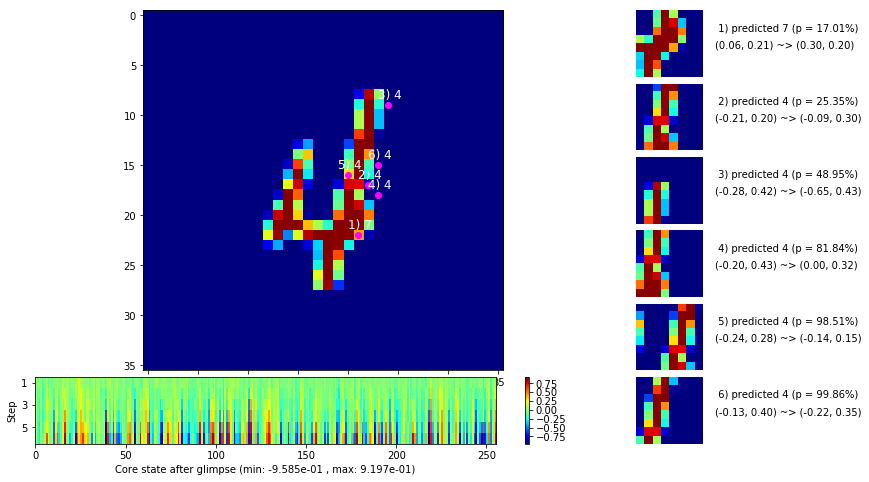

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


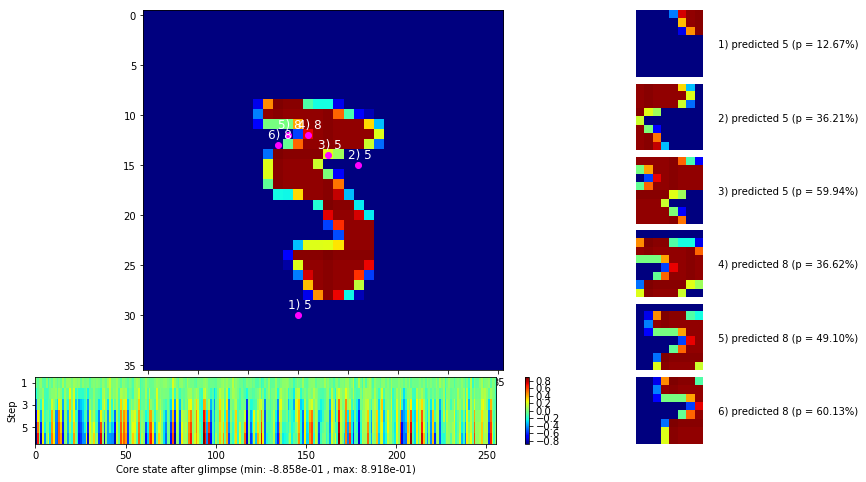


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


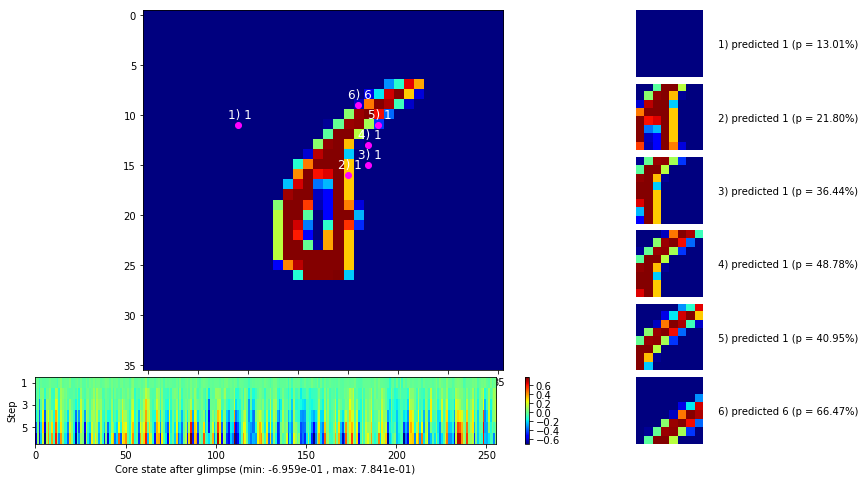

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


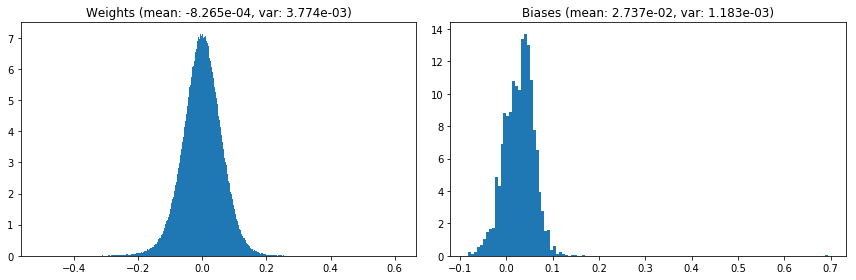

                                      Location network weights and biases


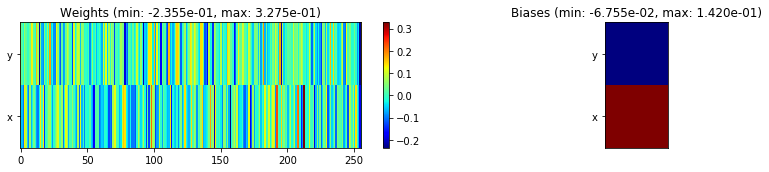

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.81 sec | TRAIN >> class loss: 0.5448 | steps:  2.810    | reward:  0.8203    | acc.: 82.025% 
                          | VAL   >> class loss: 0.5541 | steps:  2.579    | reward:  0.8242 :( | acc.: 82.420% :(


Epoch   9/400) lr = 0.0002134
 b    500/  3000 >> 132.7 ms/b | lr: 2.07e-04 | grad 2norm:  7.62 | grad inf norm:  1.894
       Weights || abs max:  0.62 (91029.61) | mean: -9.17e-04 ( 0.31) | var: 3.81e-03 (571325.31)
        Biases || abs max:  0.70 ( 2756.13) | mean:  2.73e-02 ( 3.92) | var: 1.19e-03 (28446.14)
                  class loss: 0.506 | steps: 2.735 | reward:  0.831 | acc.: 83.12%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.5 ms/b | lr: 2.00e-04 | grad 2norm:  7.45 | grad inf norm:  1.839
       Weights || abs max:  0.63 (43260.41) | mean: -1.07e-03 ( 0.23) | 

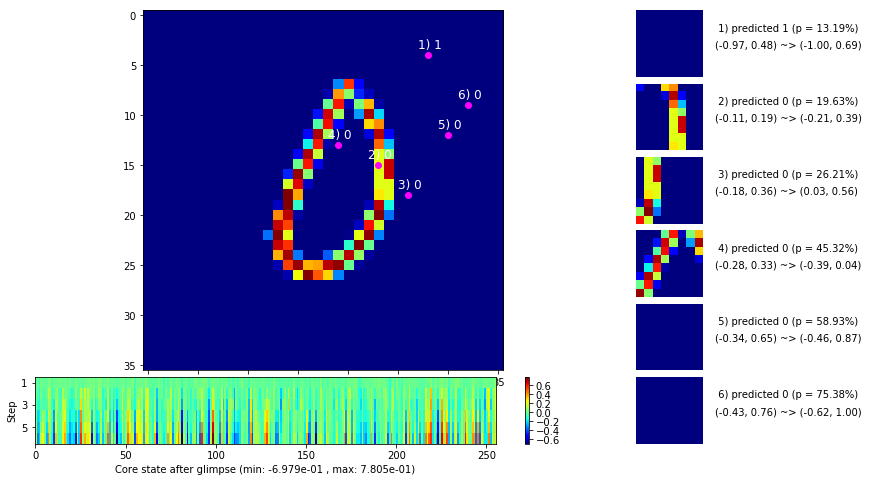

 b   1500/  3000 >> 134.5 ms/b | lr: 1.91e-04 | grad 2norm:  7.35 | grad inf norm:  1.902
       Weights || abs max:  0.63 (53960.81) | mean: -1.28e-03 ( 0.25) | var: 3.96e-03 (117335.80)
        Biases || abs max:  0.72 ( 3457.97) | mean:  2.73e-02 ( 4.28) | var: 1.25e-03 (88464.20)
                  class loss: 0.504 | steps: 2.744 | reward:  0.840 | acc.: 83.96%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.9 ms/b | lr: 1.85e-04 | grad 2norm:  7.23 | grad inf norm:  1.798
       Weights || abs max:  0.64 (56030.52) | mean: -1.35e-03 ( 0.25) | var: 4.02e-03 (139094.86)
        Biases || abs max:  0.73 ( 5915.62) | mean:  2.73e-02 ( 5.35) | var: 1.29e-03 (417308.09)
                  class loss: 0.497 | steps: 2.748 | reward:  0.837 | acc.: 83.68%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

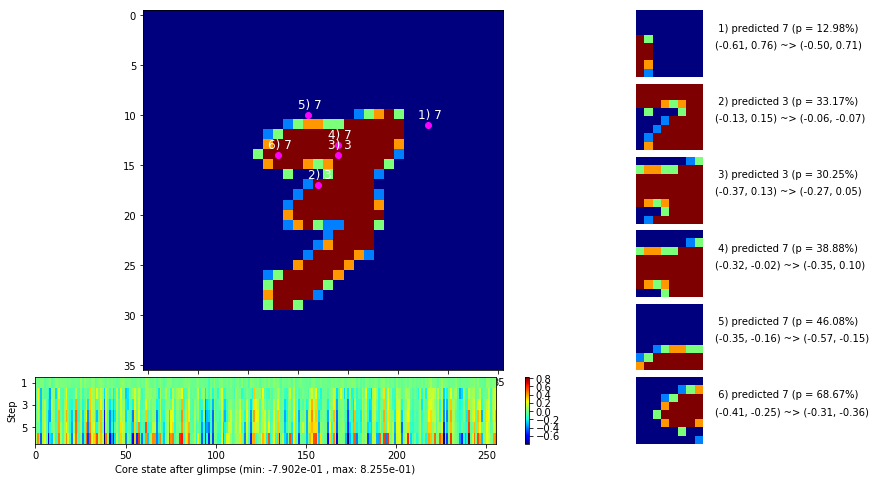

 b   2500/  3000 >> 134.2 ms/b | lr: 1.77e-04 | grad 2norm:  7.13 | grad inf norm:  1.810
       Weights || abs max:  0.64 (152946.22) | mean: -1.47e-03 ( 0.41) | var: 4.09e-03 (4886853.00)
        Biases || abs max:  0.73 ( 5540.13) | mean:  2.71e-02 ( 5.14) | var: 1.31e-03 (474136.34)
                  class loss: 0.478 | steps: 2.709 | reward:  0.846 | acc.: 84.63%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.8 ms/b | lr: 1.71e-04 | grad 2norm:  7.32 | grad inf norm:  1.819
       Weights || abs max:  0.64 (83764.38) | mean: -1.60e-03 ( 0.29) | var: 4.14e-03 (1533147.12)
        Biases || abs max:  0.74 ( 2833.02) | mean:  2.70e-02 ( 3.36) | var: 1.32e-03 (119988.76)
                  class loss: 0.480 | steps: 2.735 | reward:  0.842 | acc.: 84.16%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

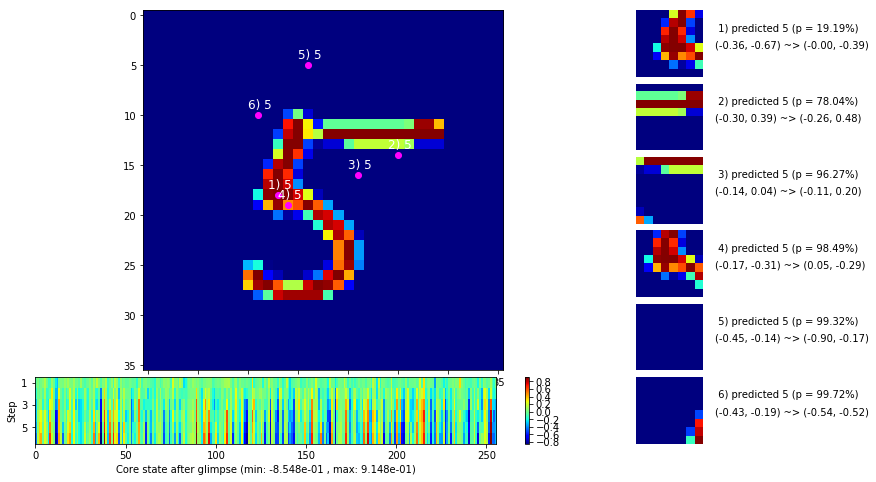

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


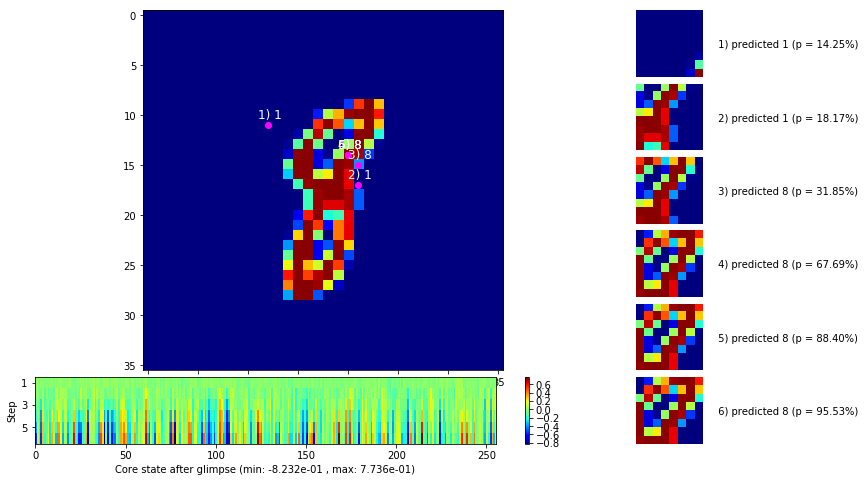


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


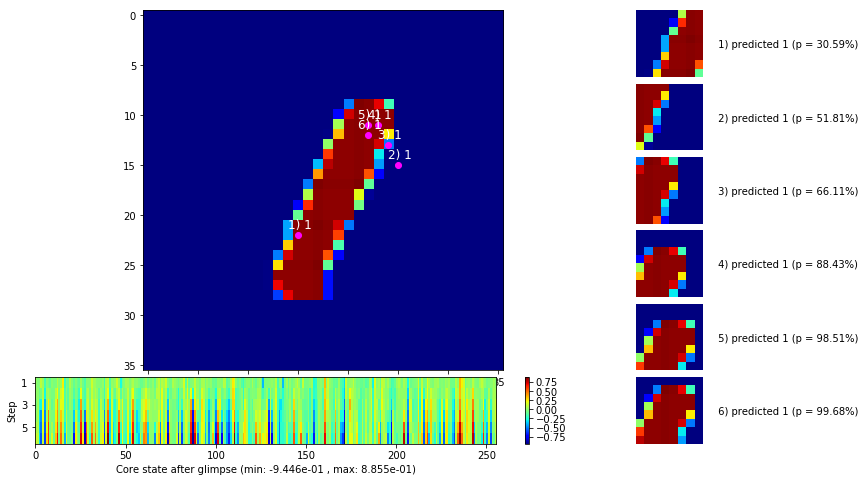

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


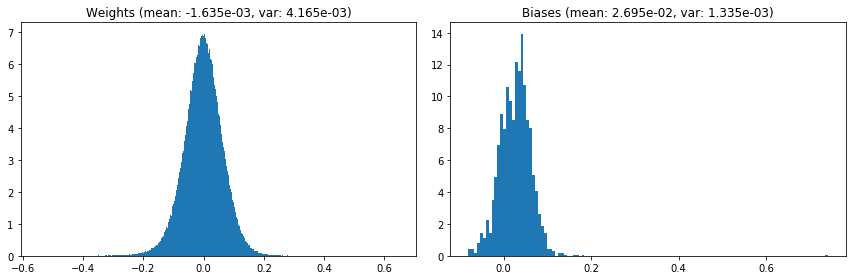

                                      Location network weights and biases


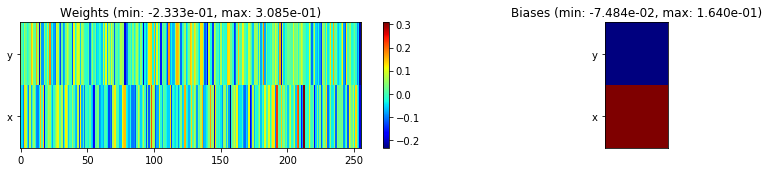

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.39 sec | TRAIN >> class loss: 0.4932 | steps:  2.732    | reward:  0.8393    | acc.: 83.928% 
                          | VAL   >> class loss: 0.4644 | steps:  2.475    | reward:  0.8480    | acc.: 84.800% 


Epoch  10/400) lr = 0.000169
 b    500/  3000 >> 134.3 ms/b | lr: 1.64e-04 | grad 2norm:  7.05 | grad inf norm:  1.724
       Weights || abs max:  0.65 (51975.83) | mean: -1.66e-03 ( 0.24) | var: 4.19e-03 (78199.42)
        Biases || abs max:  0.75 ( 5276.59) | mean:  2.71e-02 ( 5.10) | var: 1.34e-03 (730966.00)
                  class loss: 0.464 | steps: 2.682 | reward:  0.845 | acc.: 84.51%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.6 ms/b | lr: 1.59e-04 | grad 2norm:  7.24 | grad inf norm:  1.813
       Weights || abs max:  0.66 (36415.95) | mean: -1.72e-03 ( 0.21) | var

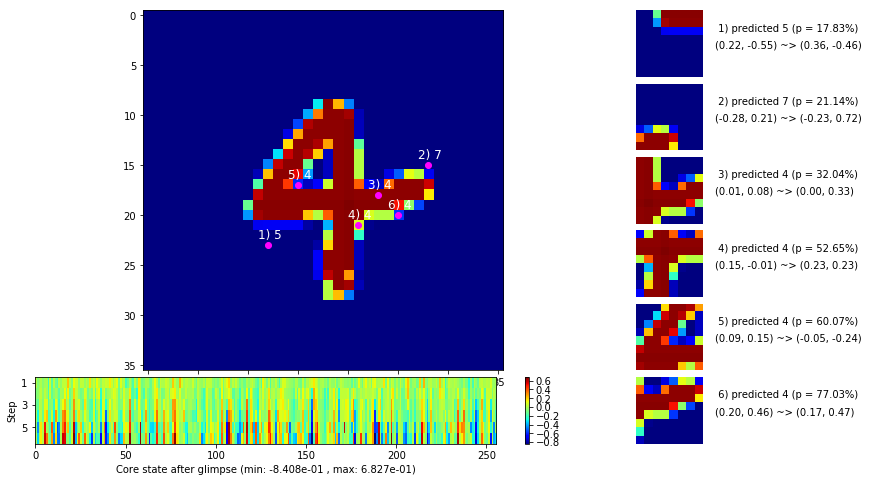

 b   1500/  3000 >> 132.3 ms/b | lr: 1.53e-04 | grad 2norm:  6.98 | grad inf norm:  1.748
       Weights || abs max:  0.66 (90161.33) | mean: -1.77e-03 ( 0.30) | var: 4.30e-03 (792263.75)
        Biases || abs max:  0.76 ( 3640.03) | mean:  2.71e-02 ( 4.20) | var: 1.39e-03 (142954.66)
                  class loss: 0.440 | steps: 2.643 | reward:  0.857 | acc.: 85.70%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.9 ms/b | lr: 1.49e-04 | grad 2norm:  6.97 | grad inf norm:  1.712
       Weights || abs max:  0.67 (60248.41) | mean: -1.82e-03 ( 0.24) | var: 4.35e-03 (274456.03)
        Biases || abs max:  0.76 (12558.19) | mean:  2.72e-02 (10.97) | var: 1.41e-03 (30941898.00)
                  class loss: 0.438 | steps: 2.638 | reward:  0.858 | acc.: 85.81%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

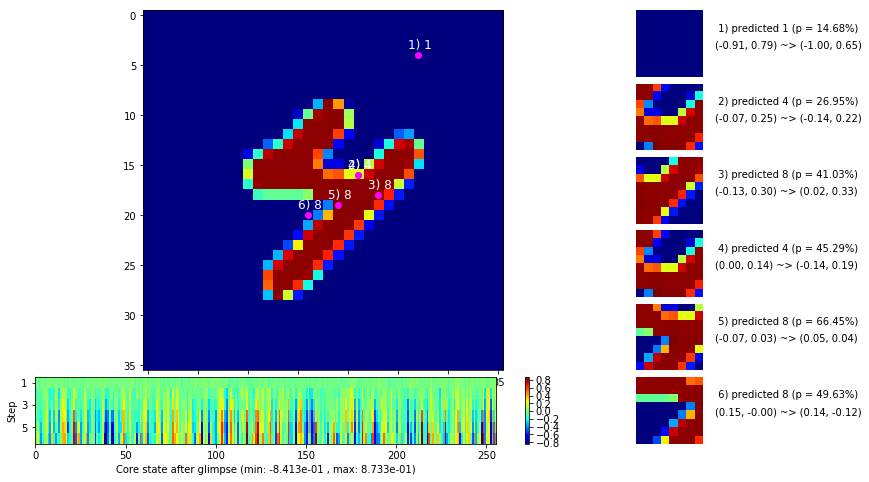

 b   2500/  3000 >> 132.2 ms/b | lr: 1.43e-04 | grad 2norm:  7.10 | grad inf norm:  1.745
       Weights || abs max:  0.67 (56081.27) | mean: -1.84e-03 ( 0.24) | var: 4.39e-03 (150180.58)
        Biases || abs max:  0.77 ( 6993.08) | mean:  2.71e-02 ( 6.22) | var: 1.42e-03 (1245836.50)
                  class loss: 0.447 | steps: 2.665 | reward:  0.856 | acc.: 85.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.2 ms/b | lr: 1.39e-04 | grad 2norm:  6.87 | grad inf norm:  1.668
       Weights || abs max:  0.68 (73883.70) | mean: -1.90e-03 ( 0.27) | var: 4.43e-03 (331017.03)
        Biases || abs max:  0.78 (10526.74) | mean:  2.70e-02 ( 7.65) | var: 1.43e-03 (4717101.50)
                  class loss: 0.437 | steps: 2.634 | reward:  0.858 | acc.: 85.76%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

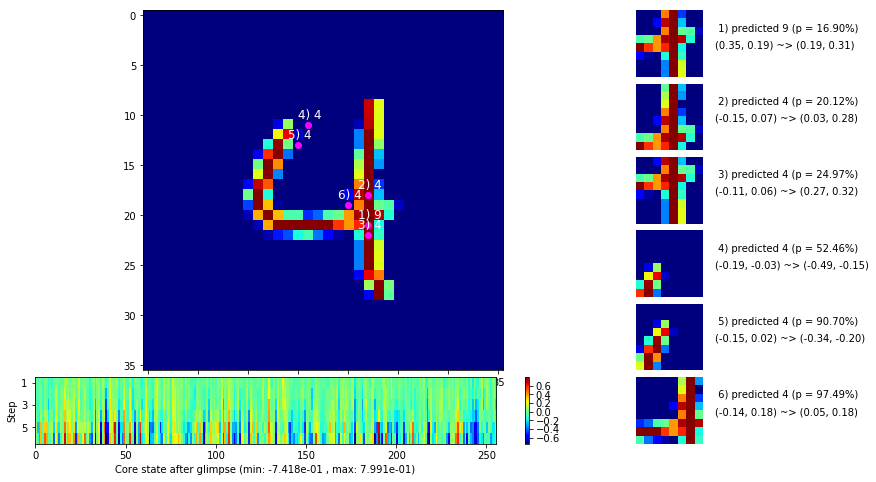

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


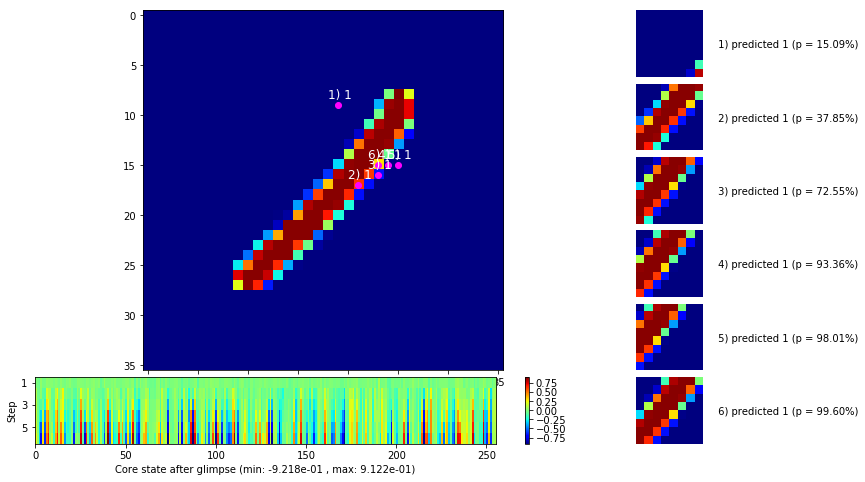


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


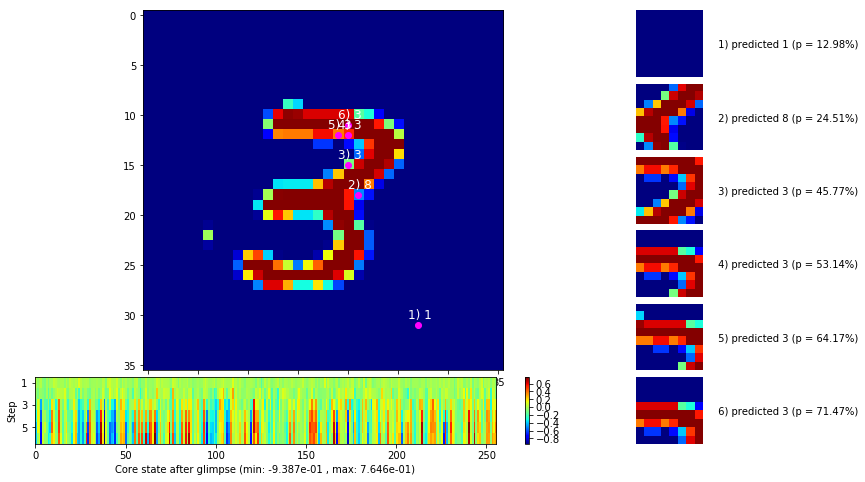

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


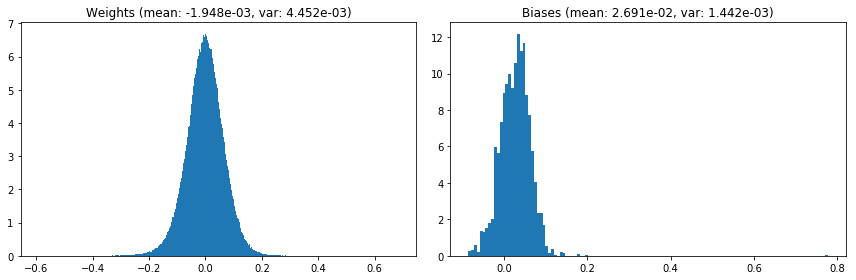

                                      Location network weights and biases


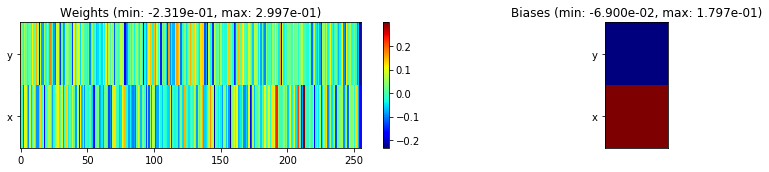

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.26 sec | TRAIN >> class loss: 0.4473 | steps:  2.659    | reward:  0.8534    | acc.: 85.340% 
                          | VAL   >> class loss: 0.4752 | steps:  2.426    | reward:  0.8432 :( | acc.: 84.320% :(


Epoch  11/400) lr = 0.0001371
 b    500/  3000 >> 131.8 ms/b | lr: 1.33e-04 | grad 2norm:  6.88 | grad inf norm:  1.746
       Weights || abs max:  0.69 (327599.97) | mean: -1.92e-03 ( 0.69) | var: 4.47e-03 (35876676.00)
        Biases || abs max:  0.78 ( 4750.08) | mean:  2.70e-02 ( 4.75) | var: 1.46e-03 (246479.42)
                  class loss: 0.422 | steps: 2.653 | reward:  0.859 | acc.: 85.88%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.6 ms/b | lr: 1.30e-04 | grad 2norm:  6.76 | grad inf norm:  1.704
       Weights || abs max:  0.69 (38679.22) | mean: -1.98e-03 ( 0.21

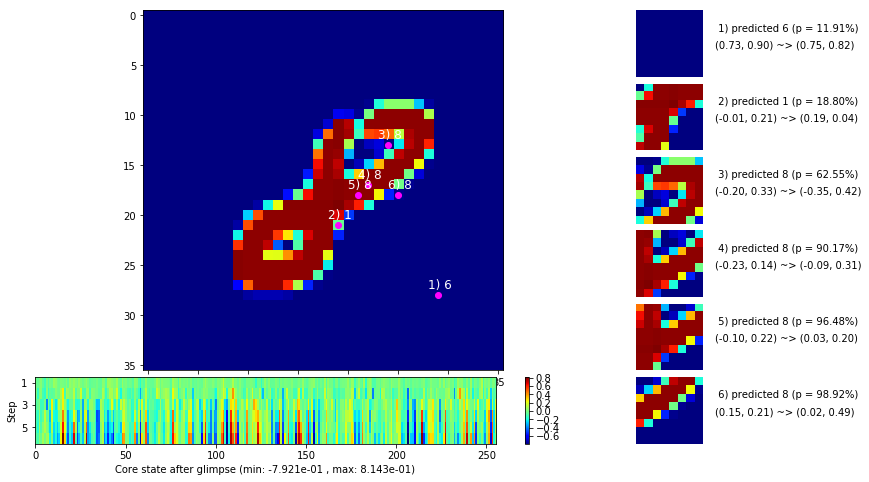

 b   1500/  3000 >> 140.8 ms/b | lr: 1.25e-04 | grad 2norm:  6.85 | grad inf norm:  1.745
       Weights || abs max:  0.70 (132958.11) | mean: -2.01e-03 ( 0.37) | var: 4.55e-03 (3720900.75)
        Biases || abs max:  0.79 ( 6026.49) | mean:  2.70e-02 ( 4.80) | var: 1.49e-03 (1975775.62)
                  class loss: 0.432 | steps: 2.639 | reward:  0.859 | acc.: 85.88%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.2 ms/b | lr: 1.22e-04 | grad 2norm:  6.83 | grad inf norm:  1.686
       Weights || abs max:  0.70 (318450.84) | mean: -2.08e-03 ( 0.68) | var: 4.58e-03 (51405200.00)
        Biases || abs max:  0.79 (12178.35) | mean:  2.71e-02 ( 7.53) | var: 1.52e-03 (15058984.00)
                  class loss: 0.409 | steps: 2.625 | reward:  0.865 | acc.: 86.46%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.

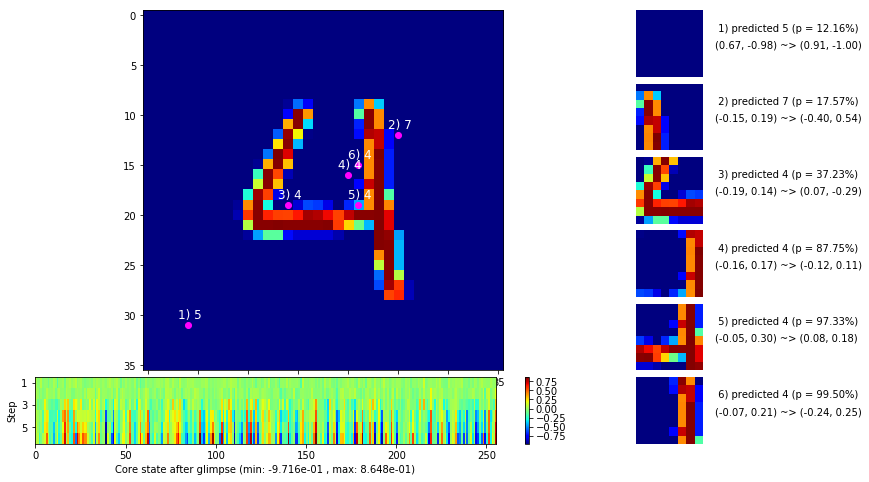

 b   2500/  3000 >> 133.1 ms/b | lr: 1.18e-04 | grad 2norm:  6.84 | grad inf norm:  1.732
       Weights || abs max:  0.70 (50938.00) | mean: -2.13e-03 ( 0.23) | var: 4.62e-03 (98988.74)
        Biases || abs max:  0.80 ( 7764.44) | mean:  2.71e-02 ( 6.22) | var: 1.53e-03 (2098526.00)
                  class loss: 0.417 | steps: 2.623 | reward:  0.863 | acc.: 86.27%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.0 ms/b | lr: 1.15e-04 | grad 2norm:  6.68 | grad inf norm:  1.693
       Weights || abs max:  0.70 (55348.00) | mean: -2.21e-03 ( 0.23) | var: 4.65e-03 (208378.16)
        Biases || abs max:  0.80 ( 7782.84) | mean:  2.70e-02 ( 5.11) | var: 1.55e-03 (4807925.50)
                  class loss: 0.399 | steps: 2.612 | reward:  0.871 | acc.: 87.05%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

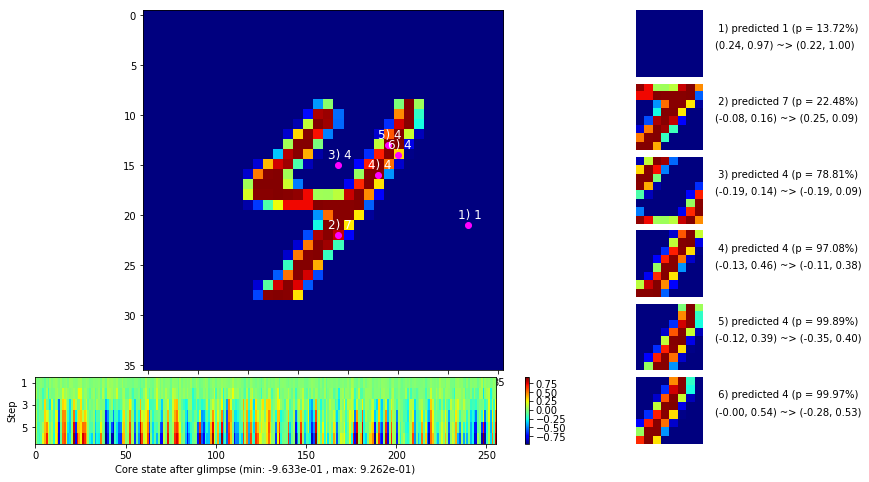

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


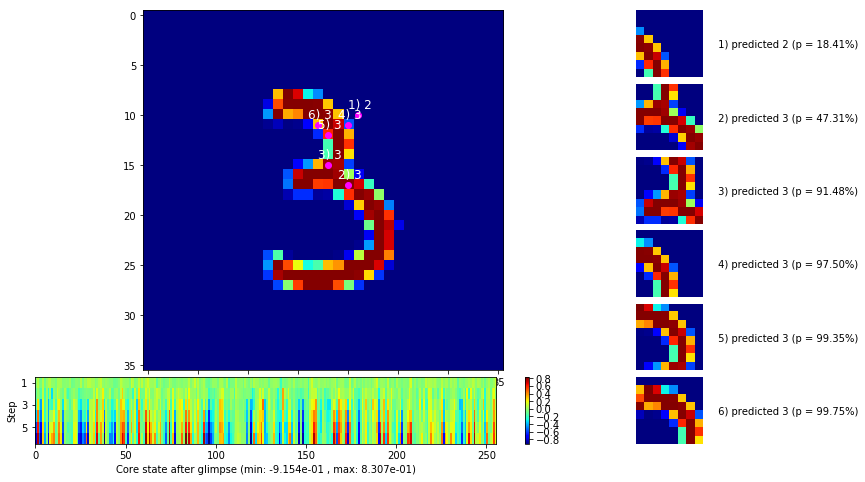


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


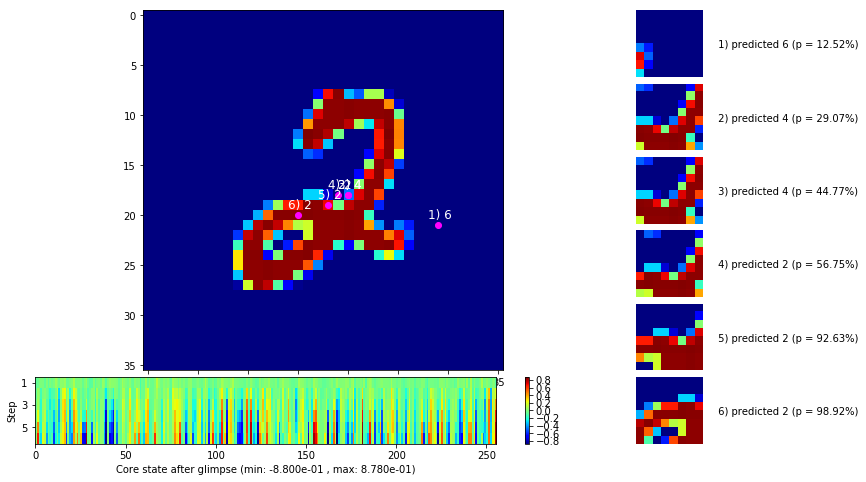

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


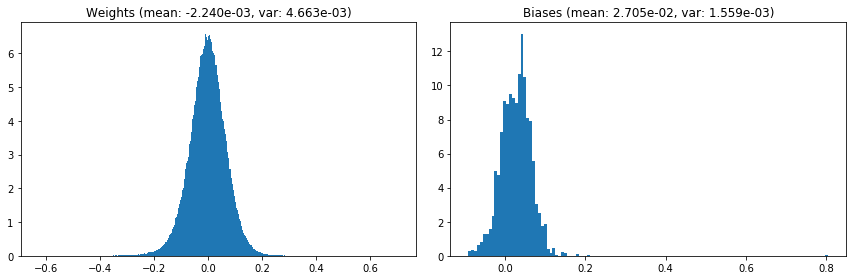

                                      Location network weights and biases


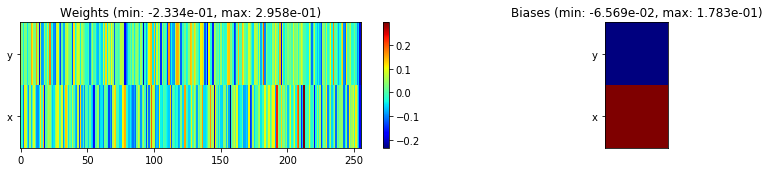

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.30 sec | TRAIN >> class loss: 0.4163 | steps:  2.631    | reward:  0.8636    | acc.: 86.355% 
                          | VAL   >> class loss: 0.3814 | steps:  2.386    | reward:  0.8776    | acc.: 87.760% 


Epoch  12/400) lr = 0.0001134
 b    500/  3000 >> 133.3 ms/b | lr: 1.11e-04 | grad 2norm:  6.53 | grad inf norm:  1.583
       Weights || abs max:  0.71 (53795.48) | mean: -2.24e-03 ( 0.23) | var: 4.68e-03 (105927.55)
        Biases || abs max:  0.81 (10686.85) | mean:  2.71e-02 ( 8.55) | var: 1.56e-03 (11014631.00)
                  class loss: 0.377 | steps: 2.589 | reward:  0.878 | acc.: 87.78%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.5 ms/b | lr: 1.08e-04 | grad 2norm:  6.55 | grad inf norm:  1.593
       Weights || abs max:  0.71 (36870.21) | mean: -2.26e-03 ( 0.21) |

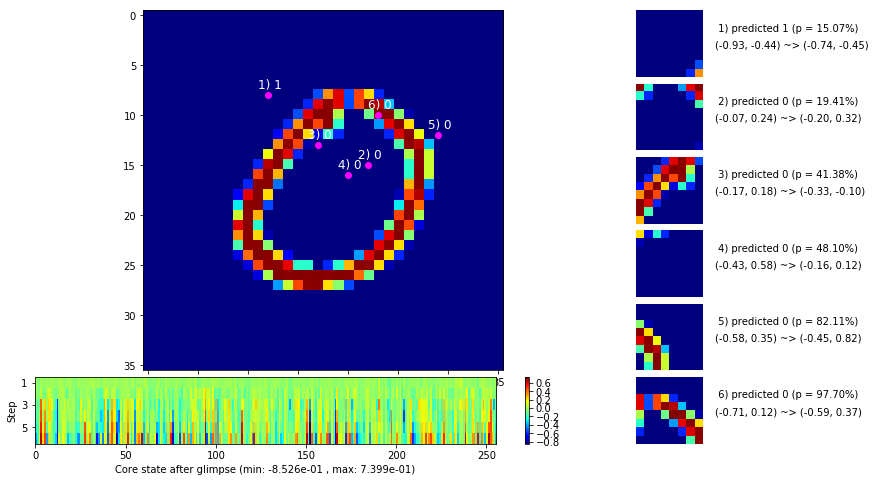

 b   1500/  3000 >> 134.4 ms/b | lr: 1.04e-04 | grad 2norm:  6.71 | grad inf norm:  1.679
       Weights || abs max:  0.72 (30626.71) | mean: -2.27e-03 ( 0.19) | var: 4.74e-03 (15921.64)
        Biases || abs max:  0.82 ( 1920.36) | mean:  2.71e-02 ( 2.50) | var: 1.59e-03 (14704.54)
                  class loss: 0.385 | steps: 2.589 | reward:  0.875 | acc.: 87.55%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.5 ms/b | lr: 1.02e-04 | grad 2norm:  6.54 | grad inf norm:  1.606
       Weights || abs max:  0.72 (39528.55) | mean: -2.32e-03 ( 0.20) | var: 4.77e-03 (55995.07)
        Biases || abs max:  0.82 ( 2856.71) | mean:  2.69e-02 ( 3.15) | var: 1.59e-03 (42196.34)
                  class loss: 0.401 | steps: 2.609 | reward:  0.870 | acc.: 87.01%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

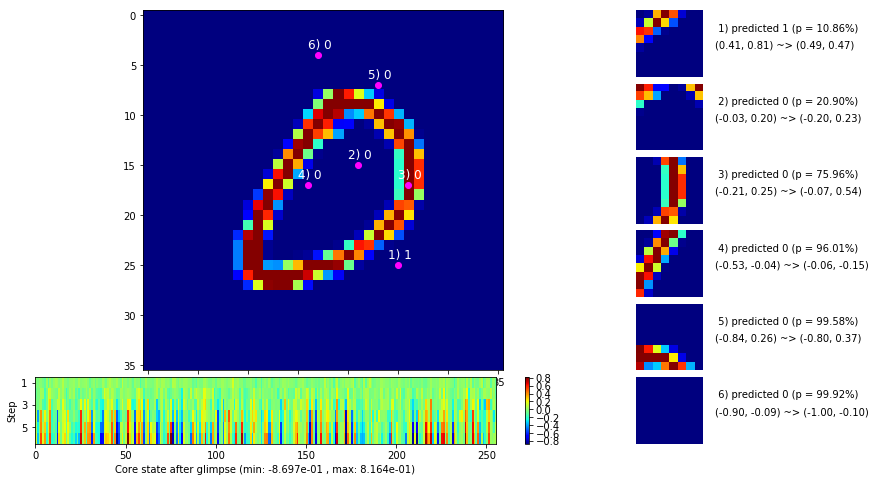

 b   2500/  3000 >> 132.6 ms/b | lr: 9.86e-05 | grad 2norm:  6.68 | grad inf norm:  1.619
       Weights || abs max:  0.72 (97447.20) | mean: -2.33e-03 ( 0.31) | var: 4.79e-03 (1605573.00)
        Biases || abs max:  0.82 ( 7104.76) | mean:  2.69e-02 ( 4.54) | var: 1.61e-03 (2464063.50)
                  class loss: 0.385 | steps: 2.602 | reward:  0.877 | acc.: 87.74%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 148.2 ms/b | lr: 9.65e-05 | grad 2norm:  6.50 | grad inf norm:  1.603
       Weights || abs max:  0.72 (31376.25) | mean: -2.35e-03 ( 0.19) | var: 4.82e-03 (12936.49)
        Biases || abs max:  0.82 ( 5223.00) | mean:  2.69e-02 ( 4.04) | var: 1.62e-03 (540962.12)
                  class loss: 0.381 | steps: 2.578 | reward:  0.877 | acc.: 87.67%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

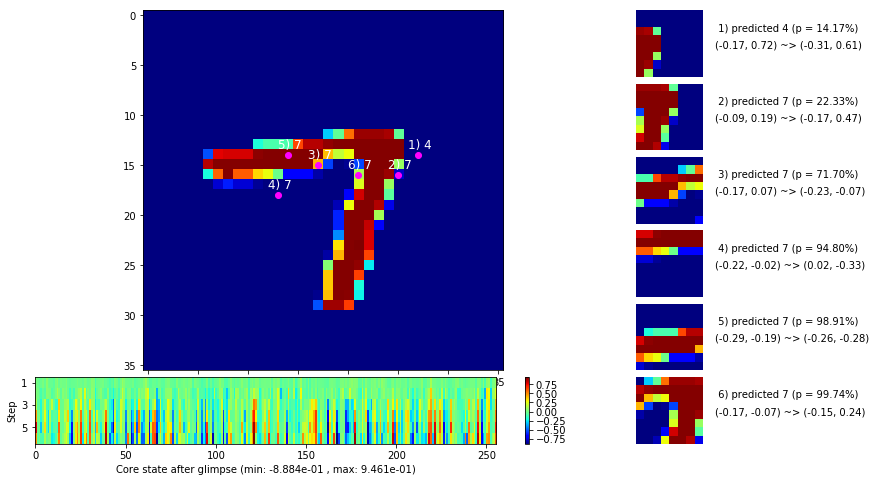

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


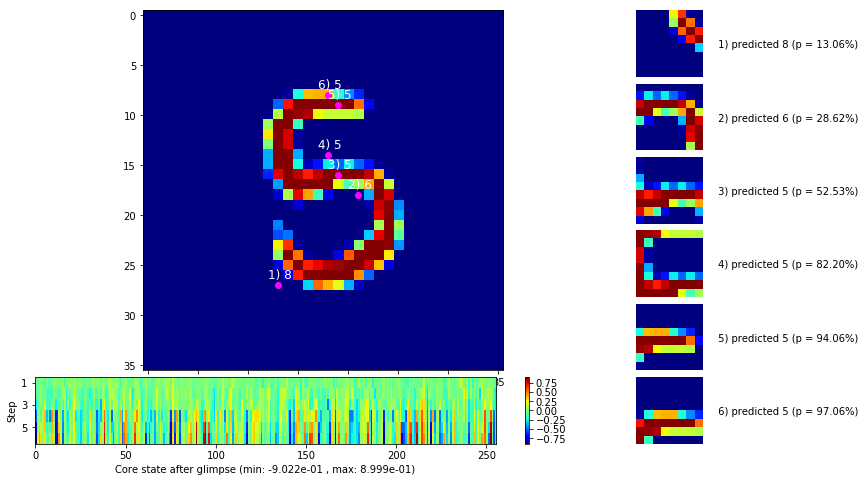


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


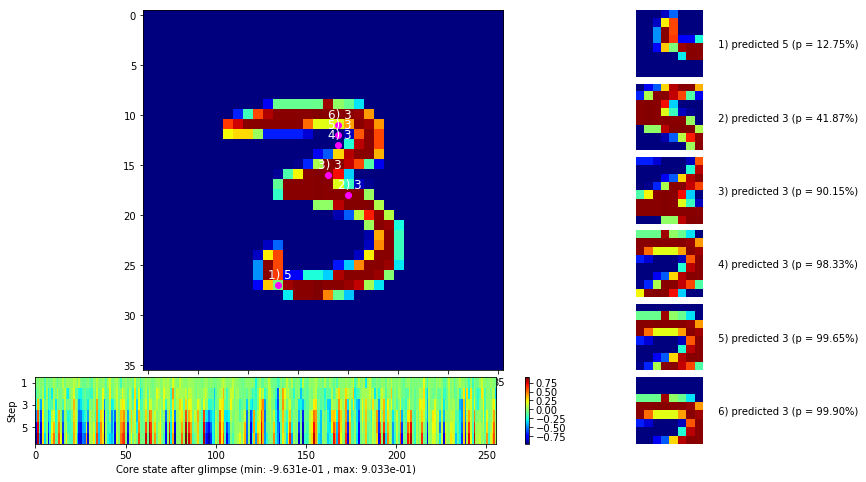

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


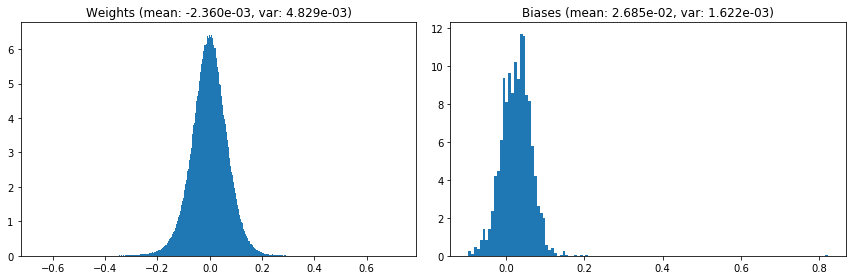

                                      Location network weights and biases


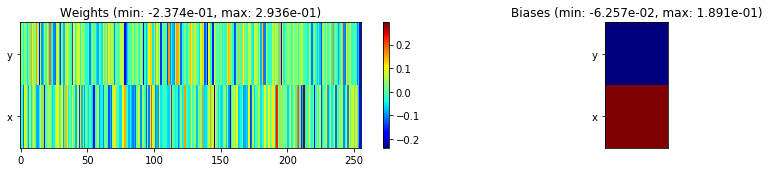

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.88 sec | TRAIN >> class loss: 0.3843 | steps:  2.593    | reward:  0.8761    | acc.: 87.608% 
                          | VAL   >> class loss: 0.3392 | steps:  2.308    | reward:  0.8896    | acc.: 88.960% 


Epoch  13/400) lr = 9.539e-05
 b    500/  3000 >> 132.0 ms/b | lr: 9.33e-05 | grad 2norm:  6.52 | grad inf norm:  1.638
       Weights || abs max:  0.72 (34611.86) | mean: -2.35e-03 ( 0.20) | var: 4.84e-03 (19535.50)
        Biases || abs max:  0.83 ( 1980.78) | mean:  2.70e-02 ( 2.64) | var: 1.63e-03 (13243.67)
                  class loss: 0.363 | steps: 2.589 | reward:  0.880 | acc.: 88.03%
                 --------------------------------------------------------------------------------


H:\Users\Andrew\Anaconda3\envs\conda_jupyter\lib\site-packages\numpy\lib\nanfunctions.py:1315: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


 b   1000/  3000 >> 131.7 ms/b | lr: 9.13e-05 | grad 2norm:  6.39 | grad inf norm:  1.563
       Weights || abs max:  0.72 (     inf) | mean: -2.31e-03 (  inf) | var: 4.87e-03 (     nan)
        Biases || abs max:  0.83 ( 4584.02) | mean:  2.71e-02 ( 4.55) | var: 1.65e-03 (2685340.25)
                  class loss: 0.355 | steps: 2.549 | reward:  0.886 | acc.: 88.60%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
	                | Baseline rewards:   [0.911, 0.913, 0.984, 0.967, 1.012, 1.101]


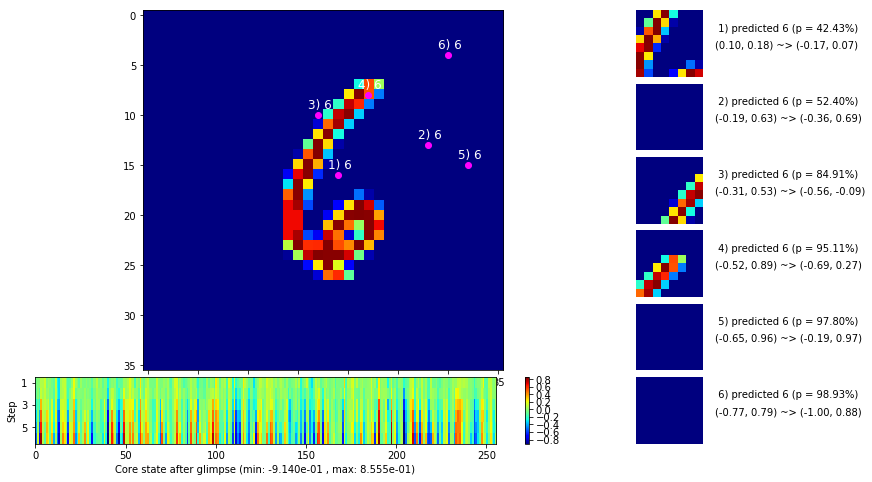

 b   1500/  3000 >> 134.2 ms/b | lr: 8.84e-05 | grad 2norm:  6.73 | grad inf norm:  1.652
       Weights || abs max:  0.72 (99318.09) | mean: -2.31e-03 ( 0.32) | var: 4.89e-03 (735892.88)
        Biases || abs max:  0.83 ( 4445.42) | mean:  2.72e-02 ( 4.07) | var: 1.66e-03 (267299.59)
                  class loss: 0.385 | steps: 2.598 | reward:  0.872 | acc.: 87.19%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.4 ms/b | lr: 8.66e-05 | grad 2norm:  6.64 | grad inf norm:  1.668
       Weights || abs max:  0.73 (30635.36) | mean: -2.31e-03 ( 0.20) | var: 4.92e-03 (14111.57)
        Biases || abs max:  0.83 ( 1762.67) | mean:  2.73e-02 ( 2.32) | var: 1.68e-03 (24747.44)
                  class loss: 0.369 | steps: 2.588 | reward:  0.879 | acc.: 87.88%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

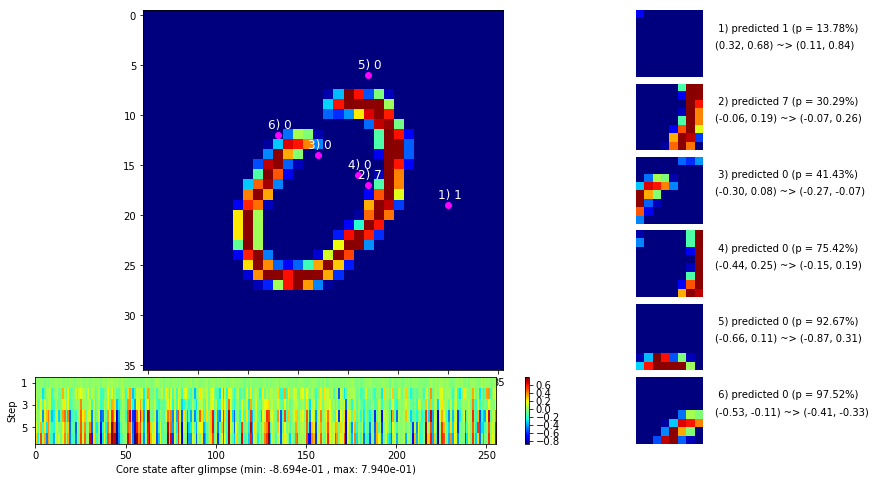

 b   2500/  3000 >> 132.8 ms/b | lr: 8.39e-05 | grad 2norm:  6.48 | grad inf norm:  1.543
       Weights || abs max:  0.73 (60494.00) | mean: -2.32e-03 ( 0.25) | var: 4.94e-03 (265956.06)
        Biases || abs max:  0.83 ( 4509.30) | mean:  2.74e-02 ( 4.17) | var: 1.69e-03 (159453.78)
                  class loss: 0.351 | steps: 2.564 | reward:  0.886 | acc.: 88.59%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.1 ms/b | lr: 8.22e-05 | grad 2norm:  6.61 | grad inf norm:  1.574
       Weights || abs max:  0.73 (47945.55) | mean: -2.36e-03 ( 0.23) | var: 4.96e-03 (59318.97)
        Biases || abs max:  0.83 ( 3781.36) | mean:  2.73e-02 ( 3.50) | var: 1.70e-03 (113275.48)
                  class loss: 0.371 | steps: 2.576 | reward:  0.880 | acc.: 87.97%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

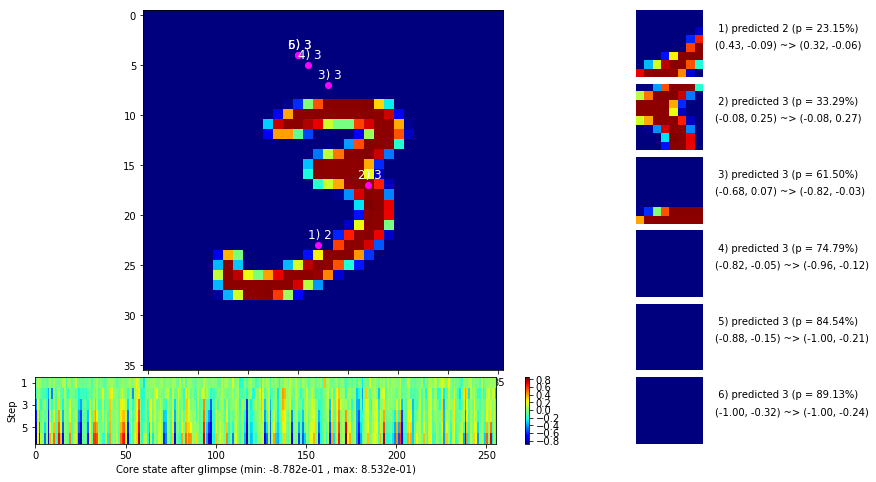

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


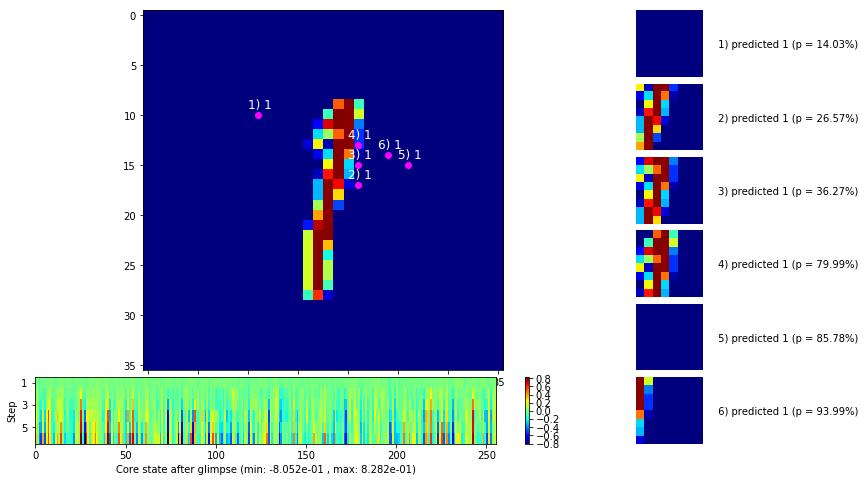


	Target class: 7  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


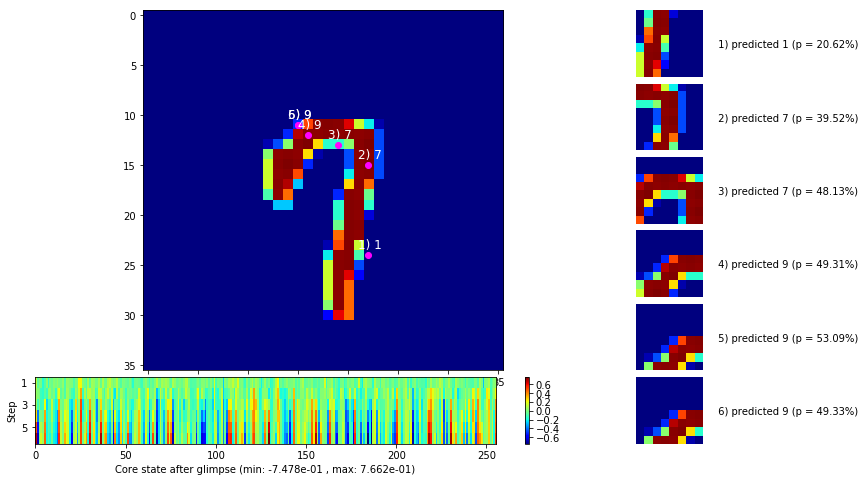

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


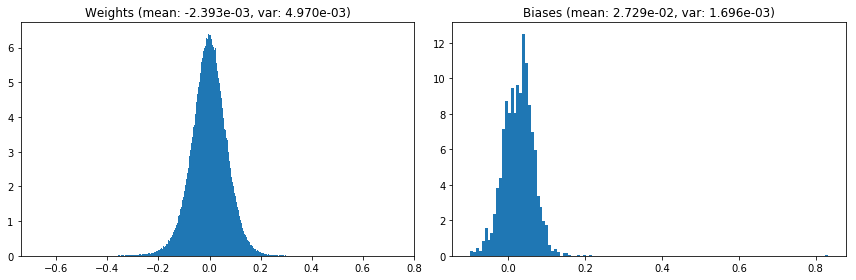

                                      Location network weights and biases


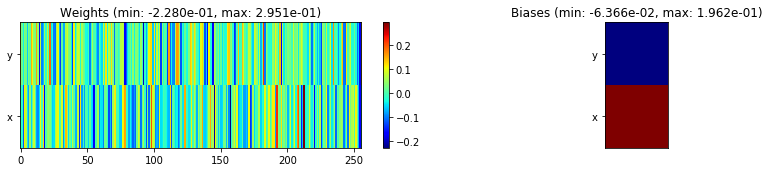

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.59 sec | TRAIN >> class loss: 0.3657 | steps:  2.577    | reward:  0.8804    | acc.: 88.043% 
                          | VAL   >> class loss: 0.3156 | steps:  2.324 :( | reward:  0.8988    | acc.: 89.880% 


Epoch  14/400) lr = 8.135e-05
 b    500/  3000 >> 131.9 ms/b | lr: 7.97e-05 | grad 2norm:  6.42 | grad inf norm:  1.542
       Weights || abs max:  0.73 (45623.21) | mean: -2.36e-03 ( 0.22) | var: 4.98e-03 (58828.67)
        Biases || abs max:  0.83 (141045.83) | mean:  2.74e-02 (57.06) | var: 1.71e-03 (3487319296.00)
                  class loss: 0.353 | steps: 2.566 | reward:  0.887 | acc.: 88.68%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.4 ms/b | lr: 7.81e-05 | grad 2norm:  6.71 | grad inf norm:  1.656
       Weights || abs max:  0.74 (952934.94) | mean: -2.36e-03 ( 1.73

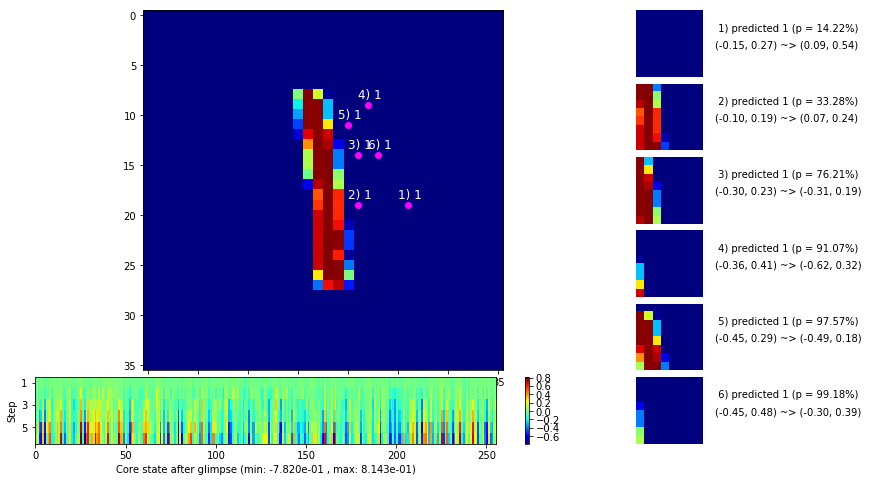

 b   1500/  3000 >> 142.4 ms/b | lr: 7.58e-05 | grad 2norm:  6.42 | grad inf norm:  1.546
       Weights || abs max:  0.74 (82900.73) | mean: -2.35e-03 ( 0.28) | var: 5.02e-03 (1468740.12)
        Biases || abs max:  0.84 ( 2656.64) | mean:  2.75e-02 ( 2.97) | var: 1.72e-03 (63629.54)
                  class loss: 0.357 | steps: 2.551 | reward:  0.884 | acc.: 88.40%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.5 ms/b | lr: 7.44e-05 | grad 2norm:  6.46 | grad inf norm:  1.540
       Weights || abs max:  0.74 (30635.68) | mean: -2.34e-03 ( 0.20) | var: 5.04e-03 (19261.20)
        Biases || abs max:  0.84 (21948.85) | mean:  2.76e-02 (10.65) | var: 1.74e-03 (73922232.00)
                  class loss: 0.351 | steps: 2.525 | reward:  0.886 | acc.: 88.57%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

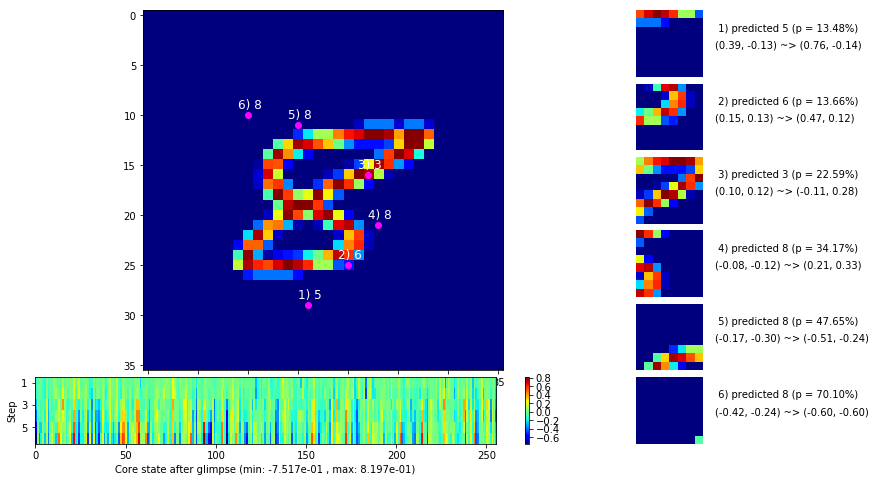

 b   2500/  3000 >> 134.2 ms/b | lr: 7.22e-05 | grad 2norm:  6.51 | grad inf norm:  1.589
       Weights || abs max:  0.74 (362234.50) | mean: -2.34e-03 ( 0.75) | var: 5.06e-03 (83047960.00)
        Biases || abs max:  0.84 ( 6365.77) | mean:  2.76e-02 ( 4.40) | var: 1.75e-03 (1207319.75)
                  class loss: 0.350 | steps: 2.531 | reward:  0.889 | acc.: 88.92%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.5 ms/b | lr: 7.09e-05 | grad 2norm:  6.45 | grad inf norm:  1.549
       Weights || abs max:  0.74 (47583.77) | mean: -2.34e-03 ( 0.23) | var: 5.07e-03 (48989.51)
        Biases || abs max:  0.84 ( 3040.73) | mean:  2.77e-02 ( 2.86) | var: 1.76e-03 (269797.78)
                  class loss: 0.356 | steps: 2.543 | reward:  0.885 | acc.: 88.53%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

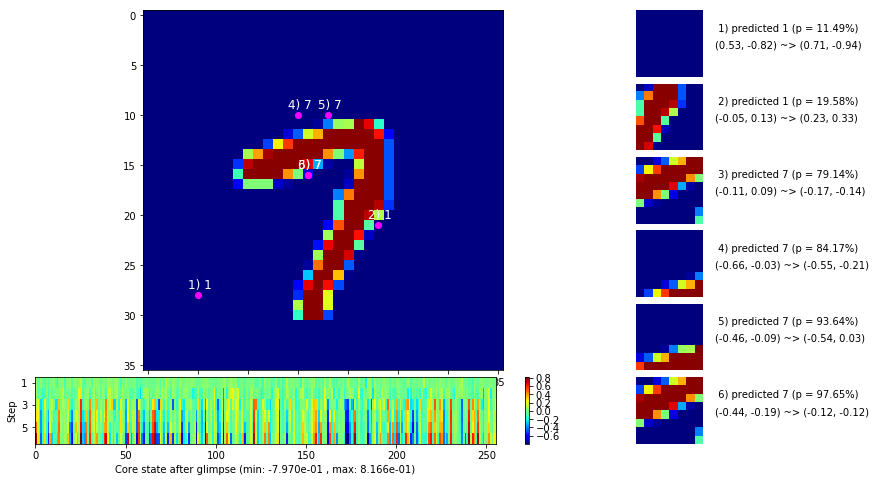

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


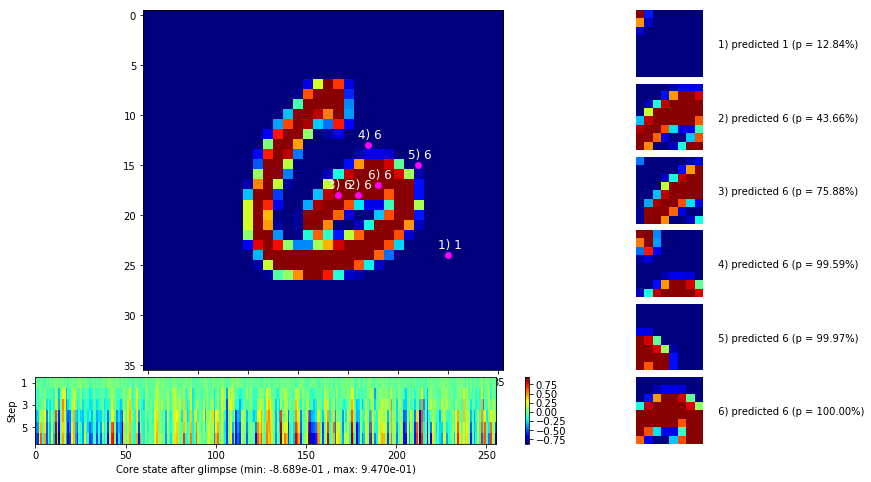


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


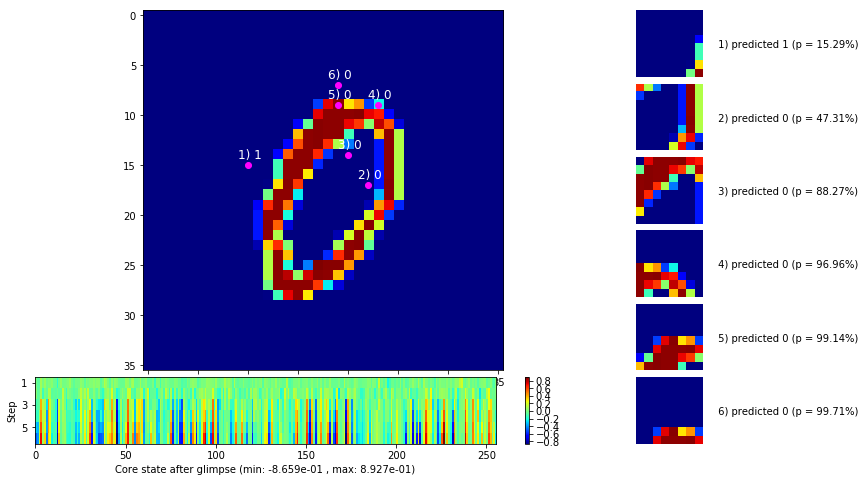

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


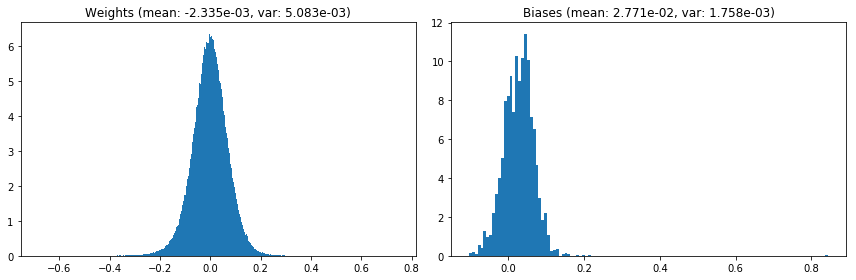

                                      Location network weights and biases


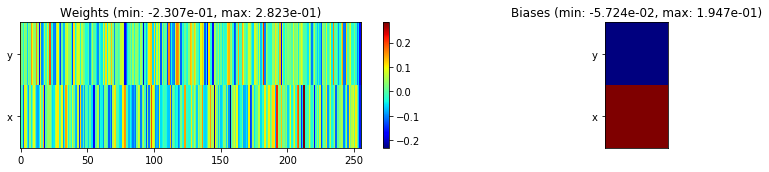

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.46 sec | TRAIN >> class loss: 0.3552 | steps:  2.547    | reward:  0.8851    | acc.: 88.513% 
                          | VAL   >> class loss: 0.3116 | steps:  2.298    | reward:  0.9004    | acc.: 90.040% 


Epoch  15/400) lr = 7.019e-05
 b    500/  3000 >> 131.3 ms/b | lr: 6.89e-05 | grad 2norm:  6.51 | grad inf norm:  1.545
       Weights || abs max:  0.75 (59916.54) | mean: -2.32e-03 ( 0.24) | var: 5.09e-03 (208051.47)
        Biases || abs max:  0.85 ( 1919.82) | mean:  2.78e-02 ( 2.30) | var: 1.77e-03 (44208.38)
                  class loss: 0.351 | steps: 2.557 | reward:  0.886 | acc.: 88.61%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 130.8 ms/b | lr: 6.76e-05 | grad 2norm:  6.63 | grad inf norm:  1.648
       Weights || abs max:  0.75 (31455.74) | mean: -2.33e-03 ( 0.19) | va

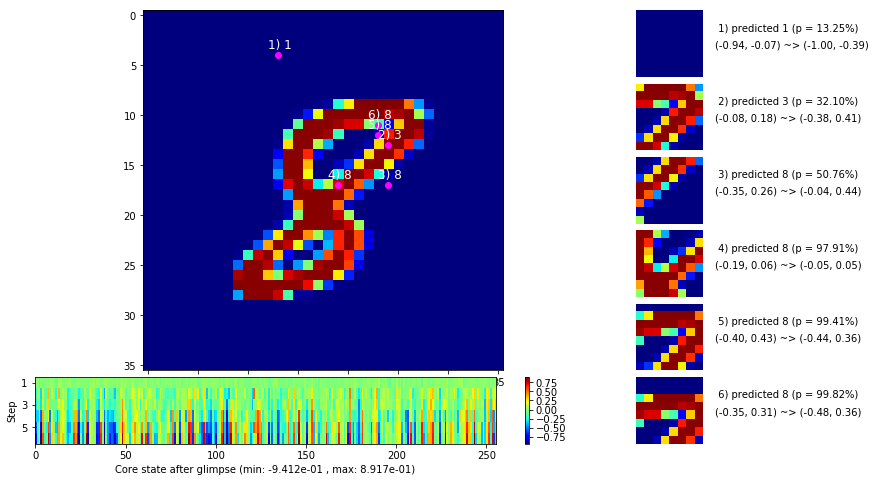

 b   1500/  3000 >> 133.6 ms/b | lr: 6.58e-05 | grad 2norm:  6.67 | grad inf norm:  1.656
       Weights || abs max:  0.75 (37980.10) | mean: -2.35e-03 ( 0.21) | var: 5.12e-03 (29737.38)
        Biases || abs max:  0.85 ( 3034.13) | mean:  2.77e-02 ( 3.07) | var: 1.78e-03 (259519.75)
                  class loss: 0.366 | steps: 2.551 | reward:  0.881 | acc.: 88.13%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.7 ms/b | lr: 6.46e-05 | grad 2norm:  6.36 | grad inf norm:  1.503
       Weights || abs max:  0.75 (92309.83) | mean: -2.39e-03 ( 0.30) | var: 5.14e-03 (548650.12)
        Biases || abs max:  0.85 ( 4801.48) | mean:  2.76e-02 ( 4.55) | var: 1.79e-03 (734044.25)
                  class loss: 0.348 | steps: 2.525 | reward:  0.887 | acc.: 88.75%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

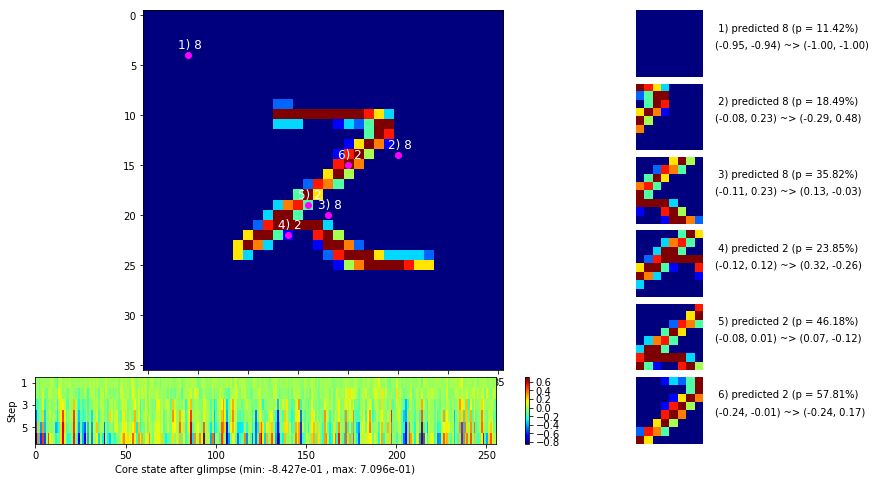

 b   2500/  3000 >> 138.4 ms/b | lr: 6.28e-05 | grad 2norm:  6.40 | grad inf norm:  1.536
       Weights || abs max:  0.75 (43317.62) | mean: -2.42e-03 ( 0.22) | var: 5.15e-03 (88229.76)
        Biases || abs max:  0.85 ( 2772.82) | mean:  2.76e-02 ( 3.12) | var: 1.79e-03 (39314.72)
                  class loss: 0.356 | steps: 2.553 | reward:  0.885 | acc.: 88.46%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.2 ms/b | lr: 6.17e-05 | grad 2norm:  6.55 | grad inf norm:  1.563
       Weights || abs max:  0.75 (374450.12) | mean: -2.40e-03 ( 0.77) | var: 5.16e-03 (34295756.00)
        Biases || abs max:  0.85 ( 3737.92) | mean:  2.77e-02 ( 3.66) | var: 1.81e-03 (158975.83)
                  class loss: 0.358 | steps: 2.571 | reward:  0.886 | acc.: 88.57%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

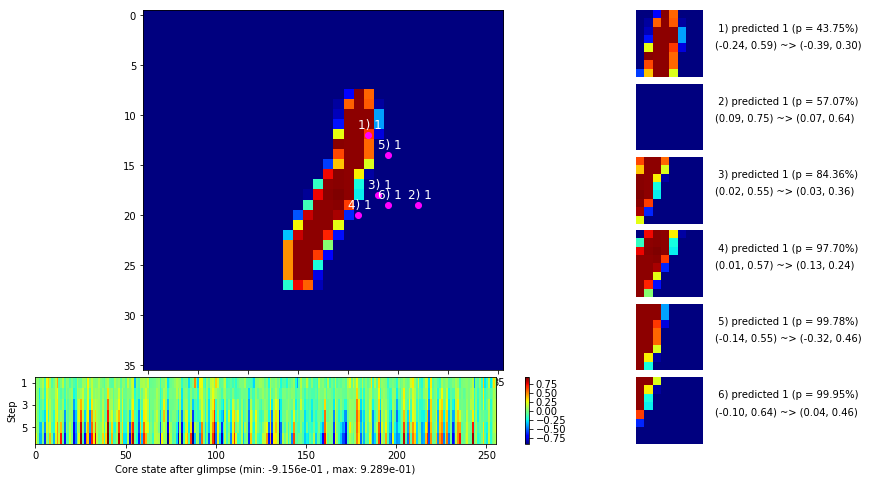

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


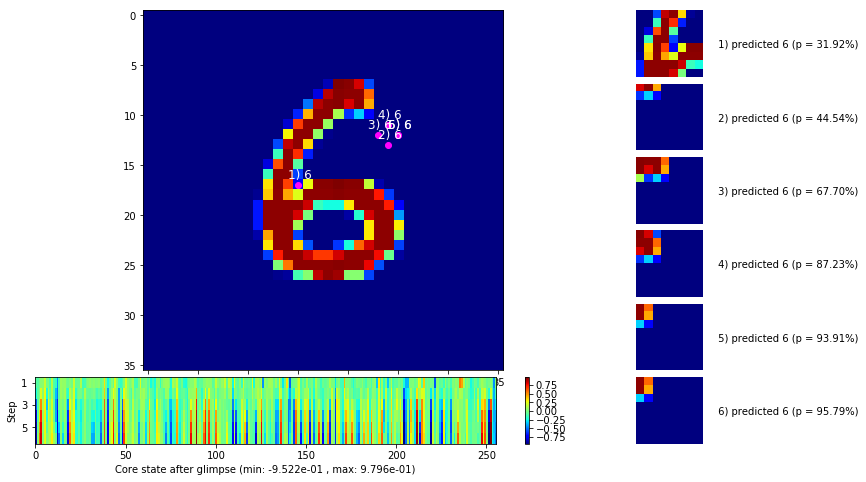


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


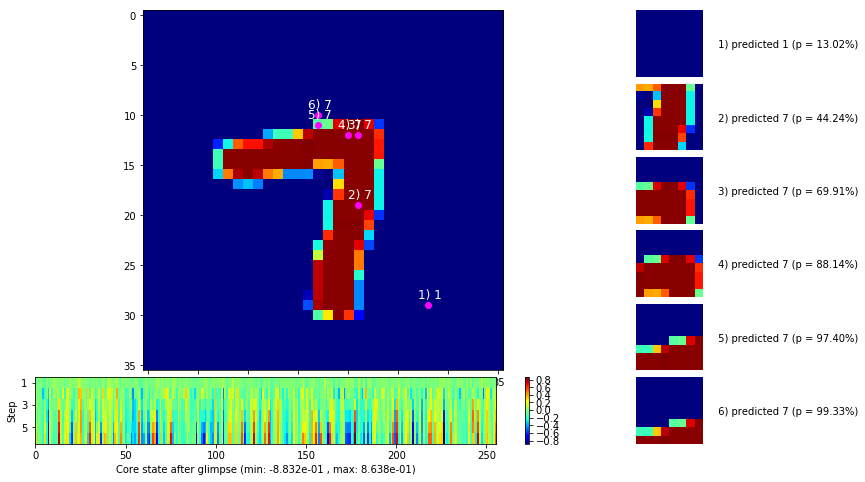

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


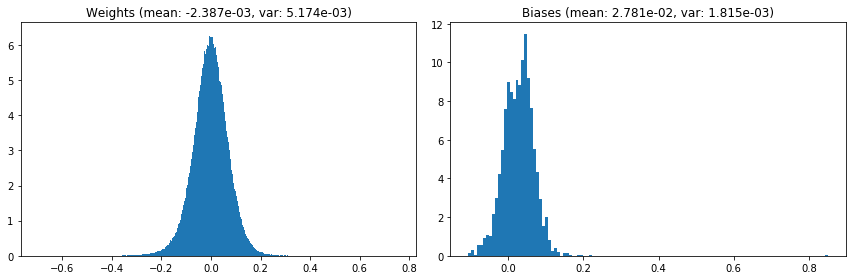

                                      Location network weights and biases


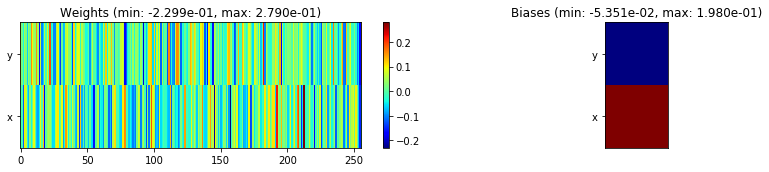

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.64 sec | TRAIN >> class loss: 0.3554 | steps:  2.550 :( | reward:  0.8851 :( | acc.: 88.510% :(
                          | VAL   >> class loss: 0.2852 | steps:  2.288    | reward:  0.9078    | acc.: 90.780% 


Epoch  16/400) lr = 6.118e-05
 b    500/  3000 >> 131.8 ms/b | lr: 6.01e-05 | grad 2norm:  6.65 | grad inf norm:  1.594
       Weights || abs max:  0.76 (50467.32) | mean: -2.39e-03 ( 0.23) | var: 5.18e-03 (50670.18)
        Biases || abs max:  0.85 ( 4722.69) | mean:  2.78e-02 ( 3.56) | var: 1.82e-03 (323786.06)
                  class loss: 0.355 | steps: 2.564 | reward:  0.884 | acc.: 88.41%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 5.91e-05 | grad 2norm:  6.42 | grad inf norm:  1.619
       Weights || abs max:  0.76 (40386.84) | mean: -2.41e-03 ( 0.21) | 

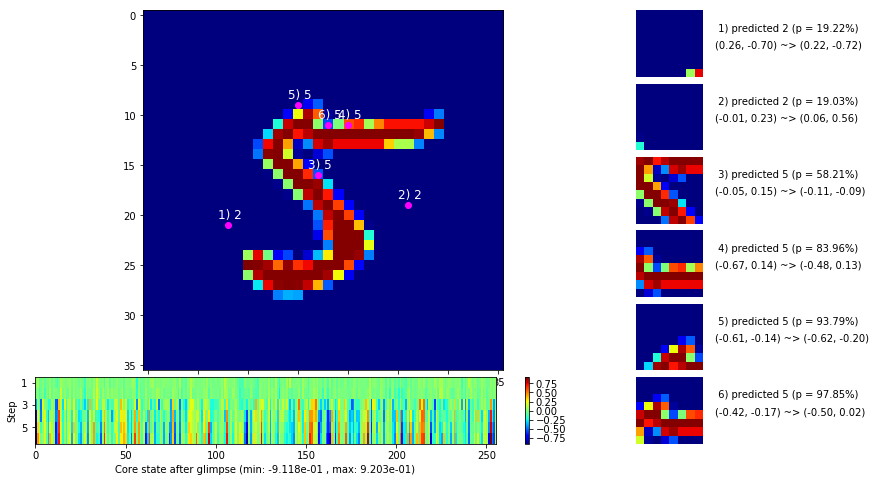

 b   1500/  3000 >> 132.7 ms/b | lr: 5.76e-05 | grad 2norm:  6.63 | grad inf norm:  1.670
       Weights || abs max:  0.76 (85175.14) | mean: -2.43e-03 ( 0.29) | var: 5.20e-03 (554555.50)
        Biases || abs max:  0.85 ( 4596.86) | mean:  2.78e-02 ( 4.21) | var: 1.83e-03 (237576.19)
                  class loss: 0.368 | steps: 2.574 | reward:  0.881 | acc.: 88.15%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 5.66e-05 | grad 2norm:  6.52 | grad inf norm:  1.590
       Weights || abs max:  0.76 (40976.81) | mean: -2.41e-03 ( 0.21) | var: 5.22e-03 (34300.91)
        Biases || abs max:  0.85 ( 6102.53) | mean:  2.79e-02 ( 4.72) | var: 1.84e-03 (1075076.62)
                  class loss: 0.349 | steps: 2.562 | reward:  0.884 | acc.: 88.44%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

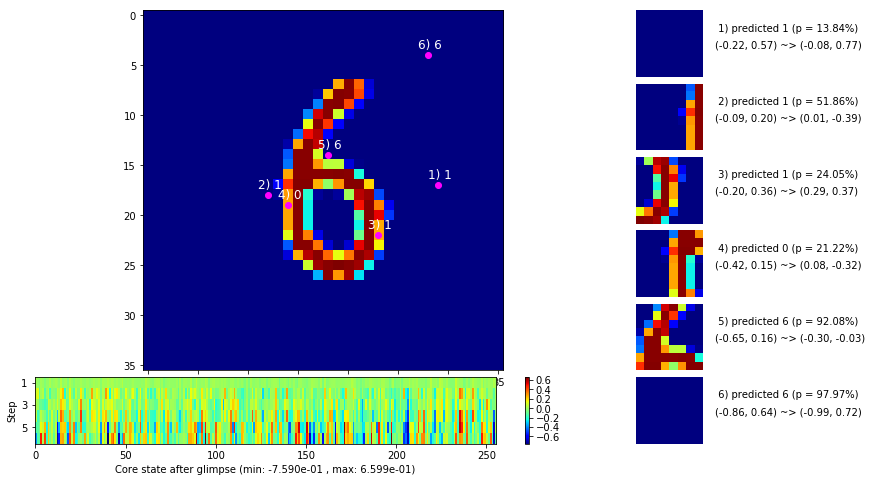

 b   2500/  3000 >> 134.9 ms/b | lr: 5.52e-05 | grad 2norm:  6.39 | grad inf norm:  1.567
       Weights || abs max:  0.76 (58582.80) | mean: -2.42e-03 ( 0.25) | var: 5.23e-03 (280697.44)
        Biases || abs max:  0.85 ( 2046.79) | mean:  2.80e-02 ( 2.89) | var: 1.84e-03 (17960.18)
                  class loss: 0.343 | steps: 2.541 | reward:  0.888 | acc.: 88.82%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.7 ms/b | lr: 5.43e-05 | grad 2norm:  6.39 | grad inf norm:  1.598
       Weights || abs max:  0.76 (76912.23) | mean: -2.41e-03 ( 0.28) | var: 5.25e-03 (322647.12)
        Biases || abs max:  0.86 ( 5720.62) | mean:  2.81e-02 ( 4.39) | var: 1.85e-03 (515542.59)
                  class loss: 0.344 | steps: 2.529 | reward:  0.888 | acc.: 88.82%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

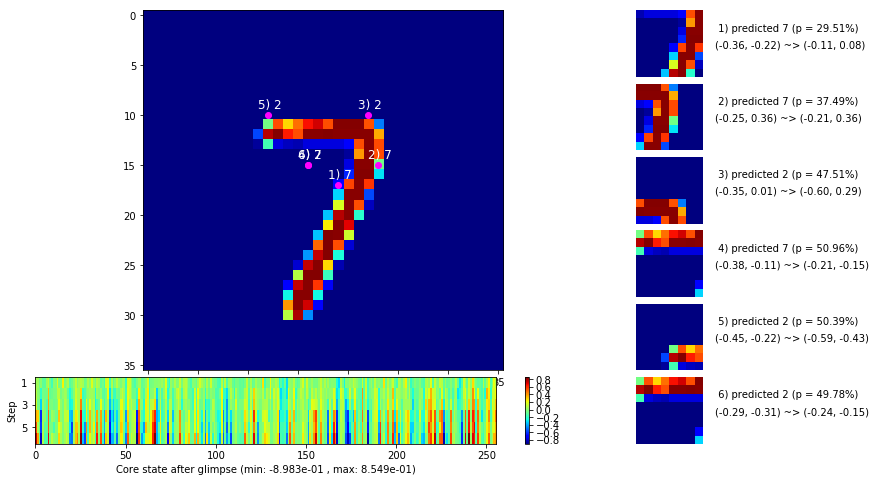

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


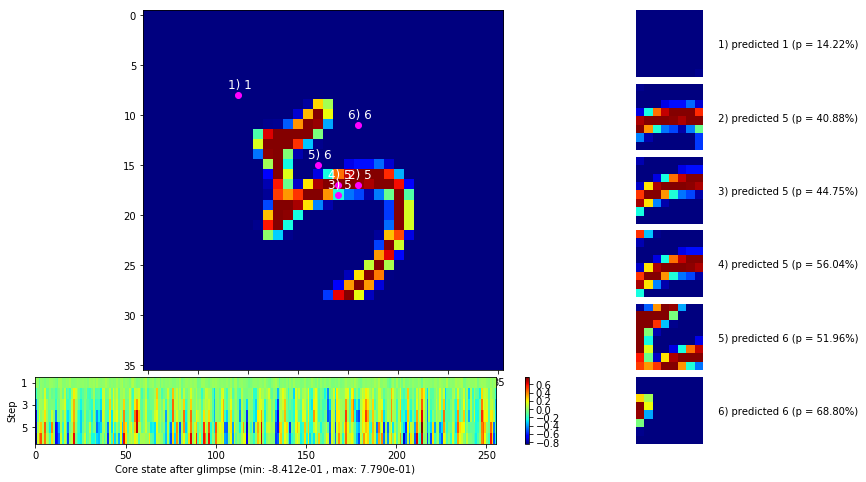


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


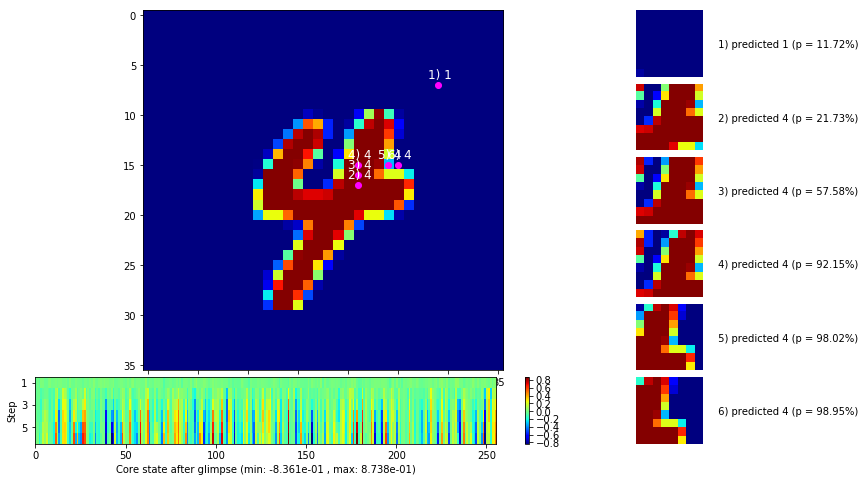

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


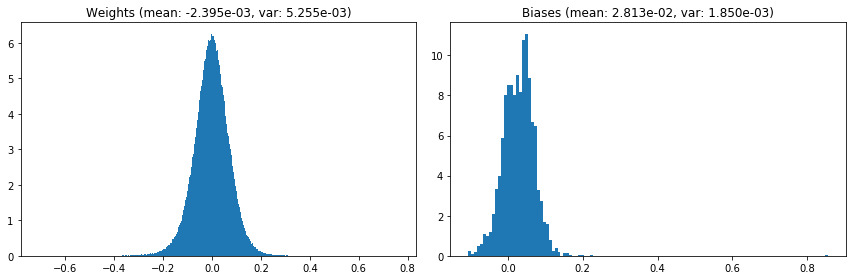

                                      Location network weights and biases


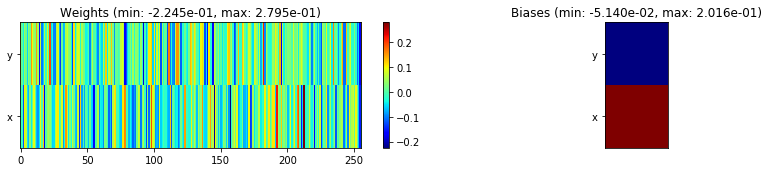

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.26 sec | TRAIN >> class loss: 0.3506 | steps:  2.551 :( | reward:  0.8853    | acc.: 88.533% 
                          | VAL   >> class loss: 0.2842 | steps:  2.270    | reward:  0.9084    | acc.: 90.840% 


Epoch  17/400) lr = 5.38e-05
 b    500/  3000 >> 132.5 ms/b | lr: 5.29e-05 | grad 2norm:  6.55 | grad inf norm:  1.620
       Weights || abs max:  0.76 (56354.90) | mean: -2.41e-03 ( 0.25) | var: 5.26e-03 (207025.23)
        Biases || abs max:  0.86 ( 2365.18) | mean:  2.81e-02 ( 3.18) | var: 1.85e-03 (16787.83)
                  class loss: 0.351 | steps: 2.536 | reward:  0.884 | acc.: 88.43%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.1 ms/b | lr: 5.21e-05 | grad 2norm:  6.67 | grad inf norm:  1.571
       Weights || abs max:  0.76 (50120.28) | mean: -2.41e-03 ( 0.23) | var

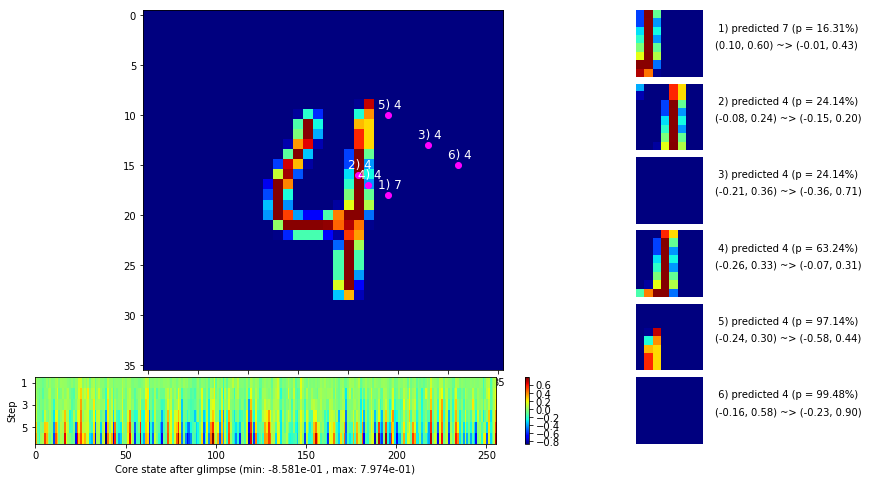

 b   1500/  3000 >> 136.6 ms/b | lr: 5.08e-05 | grad 2norm:  6.37 | grad inf norm:  1.535
       Weights || abs max:  0.77 (51697.98) | mean: -2.43e-03 ( 0.24) | var: 5.28e-03 (60320.40)
        Biases || abs max:  0.86 ( 9761.17) | mean:  2.81e-02 ( 6.85) | var: 1.86e-03 (1404762.25)
                  class loss: 0.335 | steps: 2.510 | reward:  0.892 | acc.: 89.16%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.6 ms/b | lr: 5.00e-05 | grad 2norm:  6.42 | grad inf norm:  1.562
       Weights || abs max:  0.77 (54699.59) | mean: -2.44e-03 ( 0.24) | var: 5.29e-03 (108759.85)
        Biases || abs max:  0.86 ( 4743.50) | mean:  2.80e-02 ( 4.31) | var: 1.87e-03 (126023.01)
                  class loss: 0.333 | steps: 2.518 | reward:  0.890 | acc.: 89.00%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

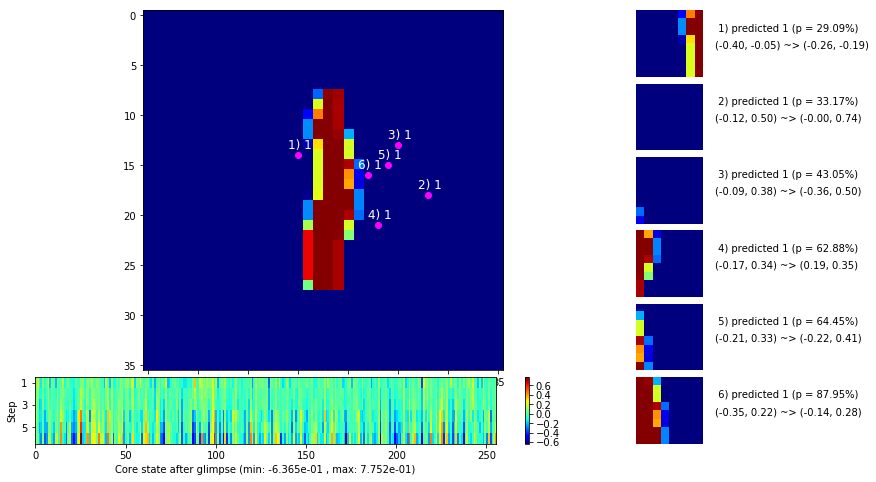

 b   2500/  3000 >> 133.8 ms/b | lr: 4.88e-05 | grad 2norm:  6.52 | grad inf norm:  1.617
       Weights || abs max:  0.77 (169361.78) | mean: -2.45e-03 ( 0.43) | var: 5.30e-03 (13104657.00)
        Biases || abs max:  0.86 ( 4961.75) | mean:  2.80e-02 ( 4.91) | var: 1.88e-03 (73601.28)
                  class loss: 0.338 | steps: 2.546 | reward:  0.889 | acc.: 88.89%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 4.81e-05 | grad 2norm:  6.57 | grad inf norm:  1.614
       Weights || abs max:  0.77 (47546.99) | mean: -2.44e-03 ( 0.23) | var: 5.31e-03 (49488.38)
        Biases || abs max:  0.86 (11970.08) | mean:  2.81e-02 ( 8.46) | var: 1.88e-03 (4601817.00)
                  class loss: 0.342 | steps: 2.523 | reward:  0.889 | acc.: 88.88%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

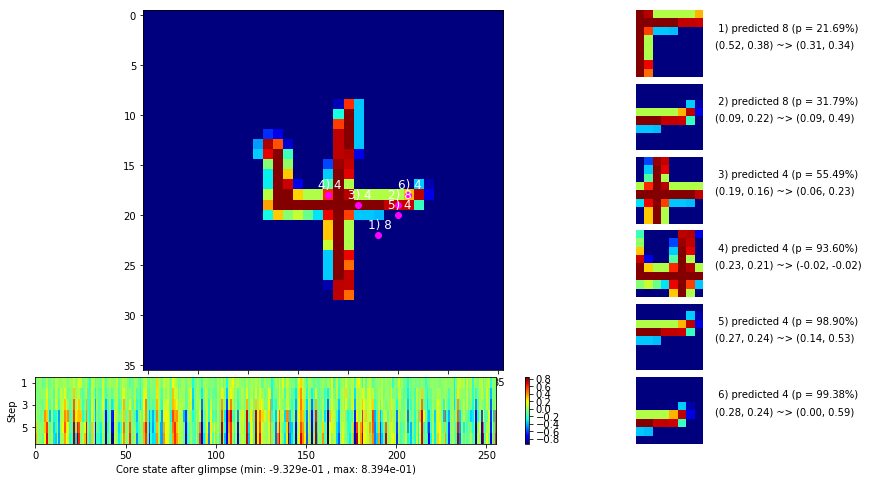

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


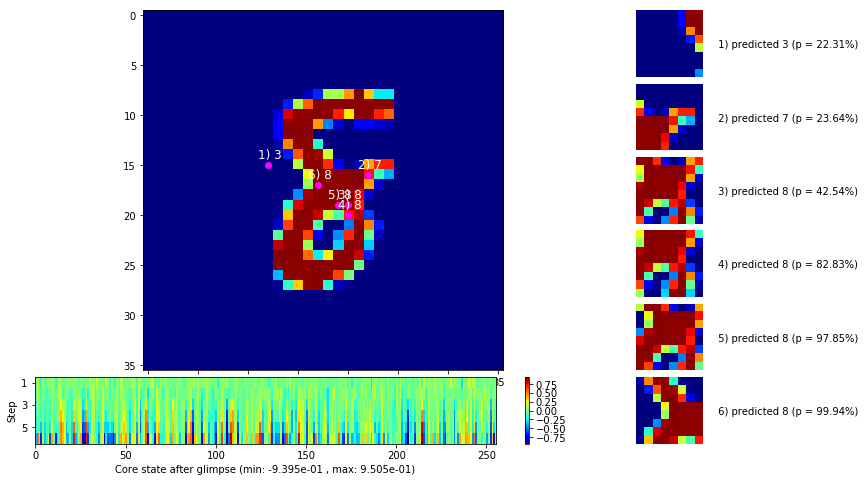


	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


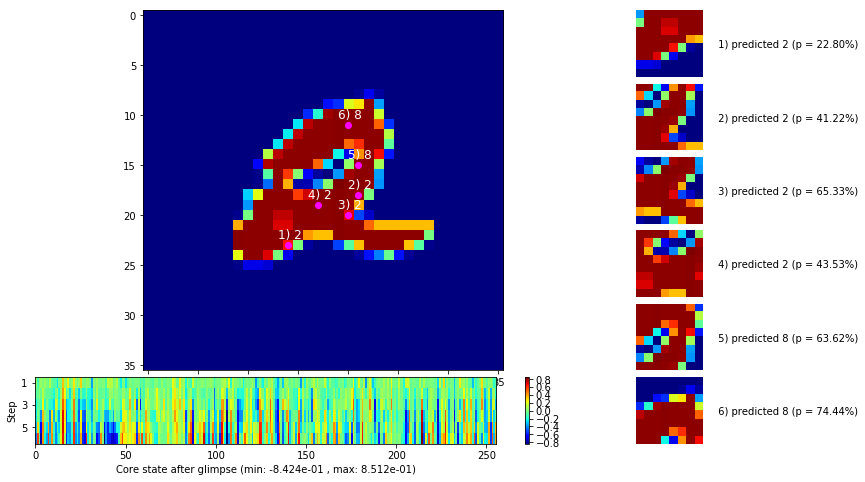

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


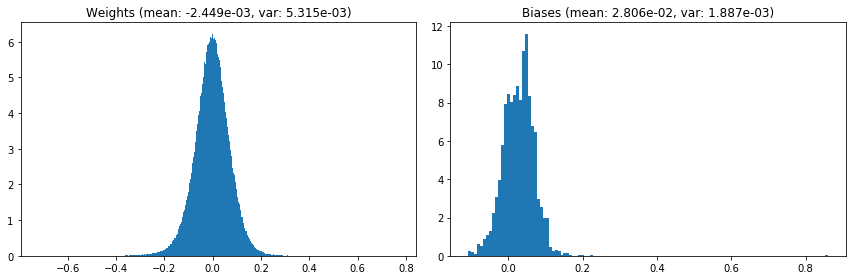

                                      Location network weights and biases


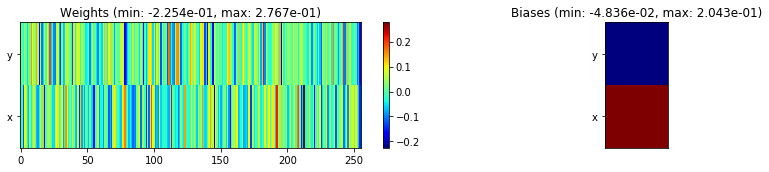

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.13 sec | TRAIN >> class loss: 0.3400 | steps:  2.526    | reward:  0.8888    | acc.: 88.882% 
                          | VAL   >> class loss: 0.2764 | steps:  2.279 :( | reward:  0.9082 :( | acc.: 90.820% :(


Epoch  18/400) lr = 4.768e-05
 b    500/  3000 >> 130.8 ms/b | lr: 4.69e-05 | grad 2norm:  6.38 | grad inf norm:  1.556
       Weights || abs max:  0.77 (44374.13) | mean: -2.44e-03 ( 0.22) | var: 5.32e-03 (99592.09)
        Biases || abs max:  0.86 ( 9387.24) | mean:  2.81e-02 ( 5.88) | var: 1.89e-03 (2360639.50)
                  class loss: 0.325 | steps: 2.524 | reward:  0.894 | acc.: 89.42%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.8 ms/b | lr: 4.62e-05 | grad 2norm:  6.45 | grad inf norm:  1.494
       Weights || abs max:  0.77 (46803.23) | mean: -2.45e-03 ( 0.22) |

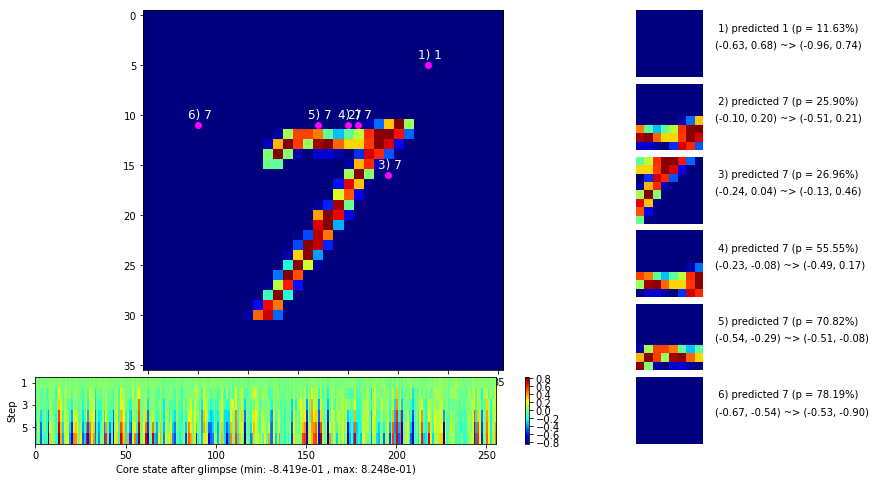

 b   1500/  3000 >> 133.8 ms/b | lr: 4.52e-05 | grad 2norm:  6.45 | grad inf norm:  1.538
       Weights || abs max:  0.77 (41936.96) | mean: -2.46e-03 ( 0.21) | var: 5.34e-03 (55100.19)
        Biases || abs max:  0.86 ( 7424.06) | mean:  2.81e-02 ( 4.64) | var: 1.90e-03 (1395372.12)
                  class loss: 0.337 | steps: 2.529 | reward:  0.889 | acc.: 88.90%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 4.45e-05 | grad 2norm:  6.45 | grad inf norm:  1.631
       Weights || abs max:  0.77 (57939.83) | mean: -2.45e-03 ( 0.24) | var: 5.35e-03 (358166.66)
        Biases || abs max:  0.86 ( 2576.97) | mean:  2.81e-02 ( 2.75) | var: 1.91e-03 (20475.66)
                  class loss: 0.350 | steps: 2.531 | reward:  0.887 | acc.: 88.74%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

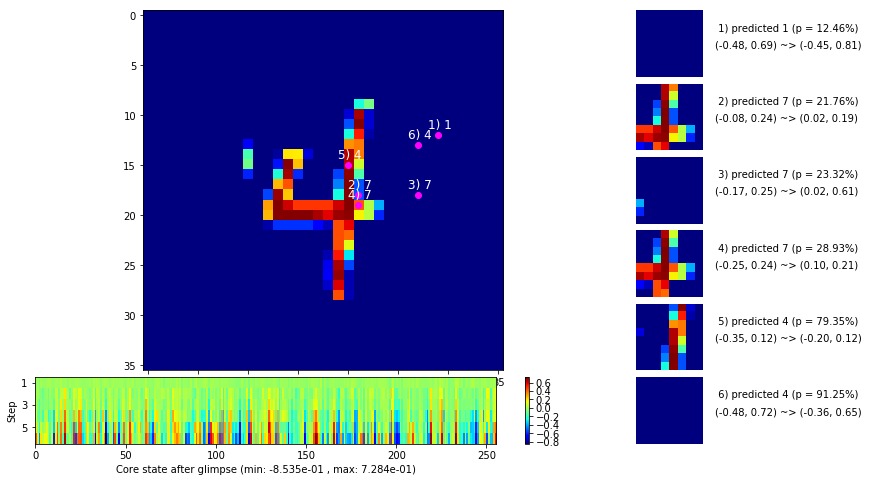

 b   2500/  3000 >> 146.3 ms/b | lr: 4.35e-05 | grad 2norm:  6.56 | grad inf norm:  1.669
       Weights || abs max:  0.77 (69001.38) | mean: -2.45e-03 ( 0.26) | var: 5.36e-03 (408752.25)
        Biases || abs max:  0.86 ( 3477.14) | mean:  2.81e-02 ( 2.81) | var: 1.91e-03 (125017.70)
                  class loss: 0.339 | steps: 2.526 | reward:  0.887 | acc.: 88.66%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.3 ms/b | lr: 4.29e-05 | grad 2norm:  6.37 | grad inf norm:  1.510
       Weights || abs max:  0.77 (153960.50) | mean: -2.44e-03 ( 0.40) | var: 5.37e-03 (6172896.50)
        Biases || abs max:  0.86 ( 1910.37) | mean:  2.82e-02 ( 2.02) | var: 1.92e-03 (62221.87)
                  class loss: 0.316 | steps: 2.511 | reward:  0.897 | acc.: 89.72%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

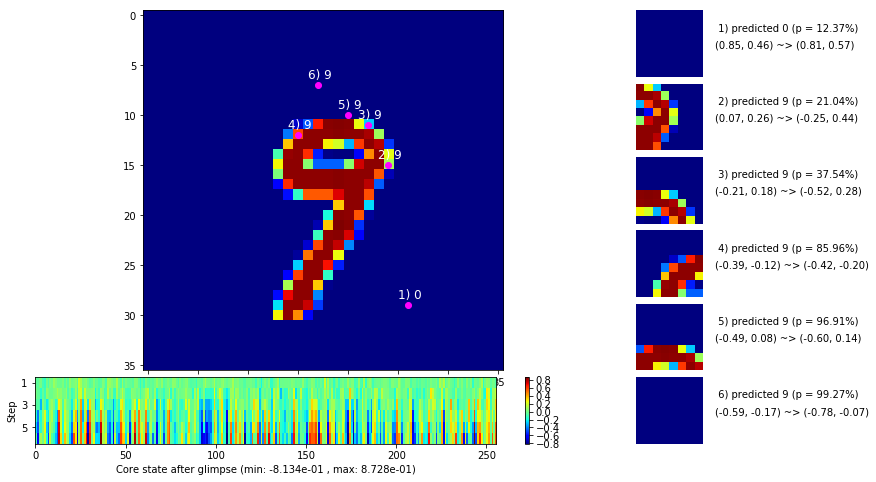

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


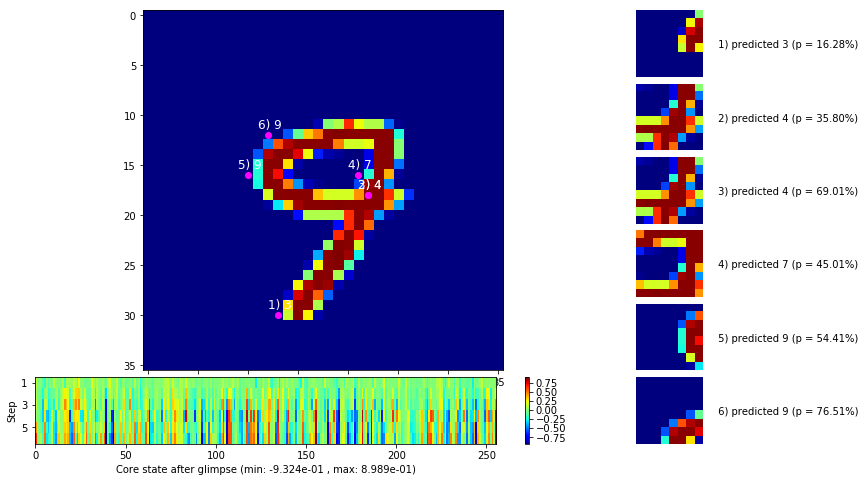


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


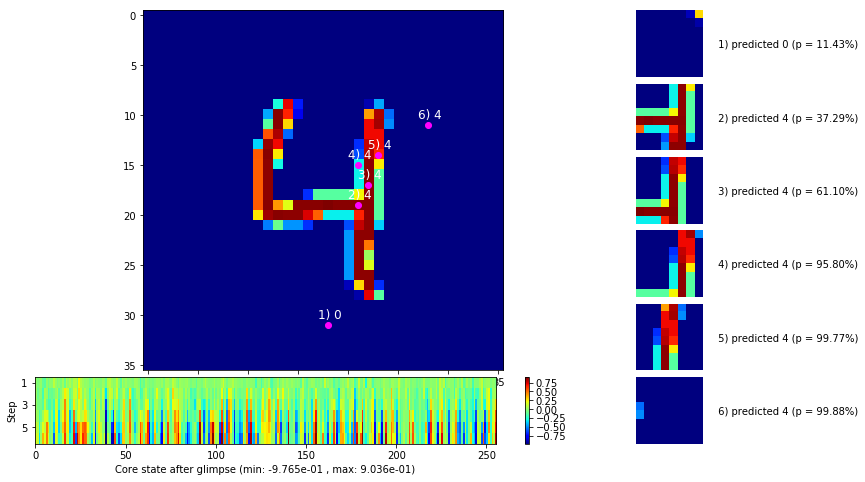

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


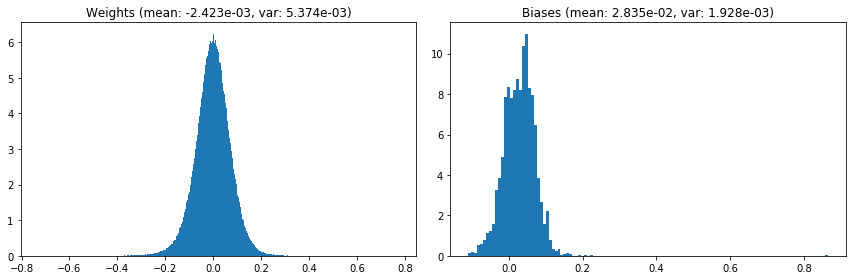

                                      Location network weights and biases


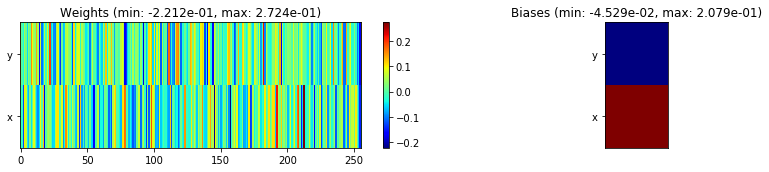

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.22 sec | TRAIN >> class loss: 0.3344 | steps:  2.526 :( | reward:  0.8909    | acc.: 89.093% 
                          | VAL   >> class loss: 0.2655 | steps:  2.275 :( | reward:  0.9106    | acc.: 91.060% 


Epoch  19/400) lr = 4.255e-05
 b    500/  3000 >> 131.1 ms/b | lr: 4.19e-05 | grad 2norm:  6.45 | grad inf norm:  1.531
       Weights || abs max:  0.77 (30651.76) | mean: -2.44e-03 ( 0.20) | var: 5.38e-03 (10109.54)
        Biases || abs max:  0.87 ( 1564.53) | mean:  2.83e-02 ( 2.32) | var: 1.92e-03 (33604.63)
                  class loss: 0.326 | steps: 2.548 | reward:  0.892 | acc.: 89.17%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.2 ms/b | lr: 4.13e-05 | grad 2norm:  6.47 | grad inf norm:  1.546
       Weights || abs max:  0.77 (53385.28) | mean: -2.45e-03 ( 0.24) | var

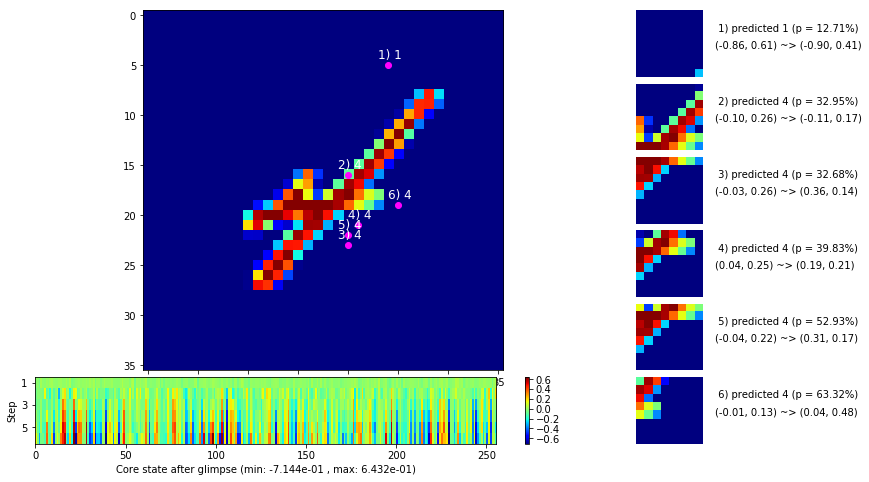

 b   1500/  3000 >> 133.8 ms/b | lr: 4.04e-05 | grad 2norm:  6.42 | grad inf norm:  1.572
       Weights || abs max:  0.78 (132605.80) | mean: -2.45e-03 ( 0.38) | var: 5.39e-03 (3415436.75)
        Biases || abs max:  0.87 ( 2088.70) | mean:  2.82e-02 ( 2.25) | var: 1.92e-03 (85749.98)
                  class loss: 0.330 | steps: 2.535 | reward:  0.893 | acc.: 89.31%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.1 ms/b | lr: 3.99e-05 | grad 2norm:  6.35 | grad inf norm:  1.547
       Weights || abs max:  0.77 (65980.59) | mean: -2.46e-03 ( 0.26) | var: 5.40e-03 (194566.12)
        Biases || abs max:  0.87 ( 1615.14) | mean:  2.82e-02 ( 2.03) | var: 1.93e-03 (21720.15)
                  class loss: 0.328 | steps: 2.536 | reward:  0.892 | acc.: 89.22%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

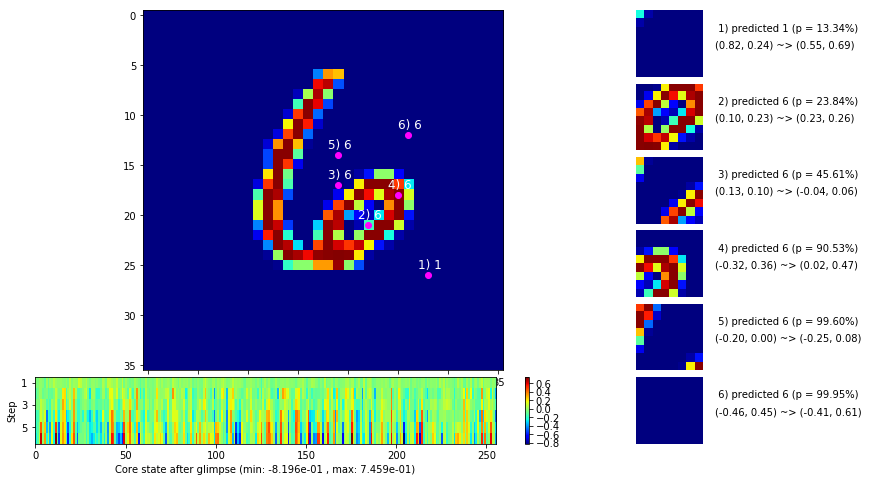

 b   2500/  3000 >> 132.0 ms/b | lr: 3.90e-05 | grad 2norm:  6.50 | grad inf norm:  1.557
       Weights || abs max:  0.78 (79531.47) | mean: -2.46e-03 ( 0.29) | var: 5.41e-03 (447377.50)
        Biases || abs max:  0.87 ( 1838.89) | mean:  2.83e-02 ( 2.24) | var: 1.94e-03 (14680.17)
                  class loss: 0.332 | steps: 2.548 | reward:  0.892 | acc.: 89.25%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.6 ms/b | lr: 3.85e-05 | grad 2norm:  6.32 | grad inf norm:  1.518
       Weights || abs max:  0.78 (69529.50) | mean: -2.47e-03 ( 0.27) | var: 5.42e-03 (347951.06)
        Biases || abs max:  0.87 ( 5583.06) | mean:  2.82e-02 ( 4.34) | var: 1.94e-03 (1968349.38)
                  class loss: 0.327 | steps: 2.504 | reward:  0.895 | acc.: 89.49%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

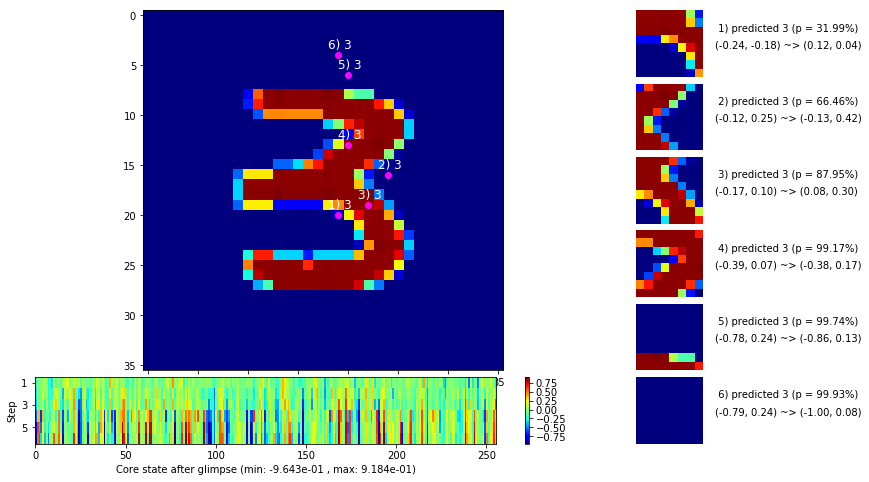

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


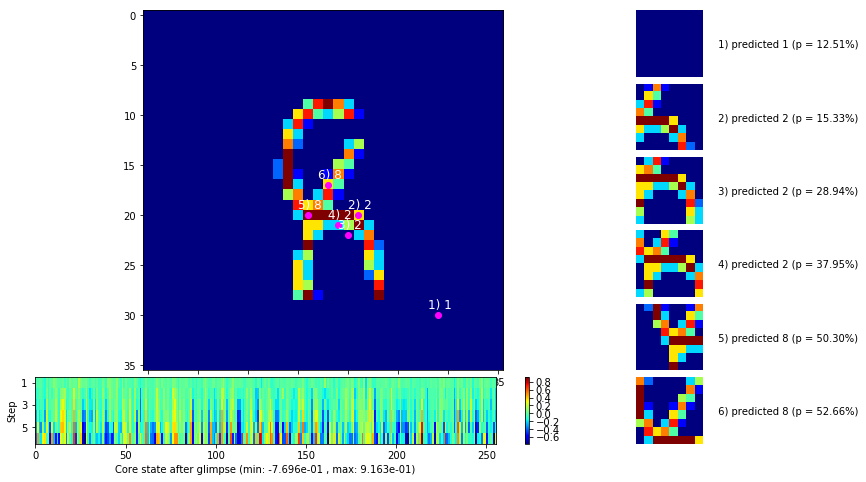


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


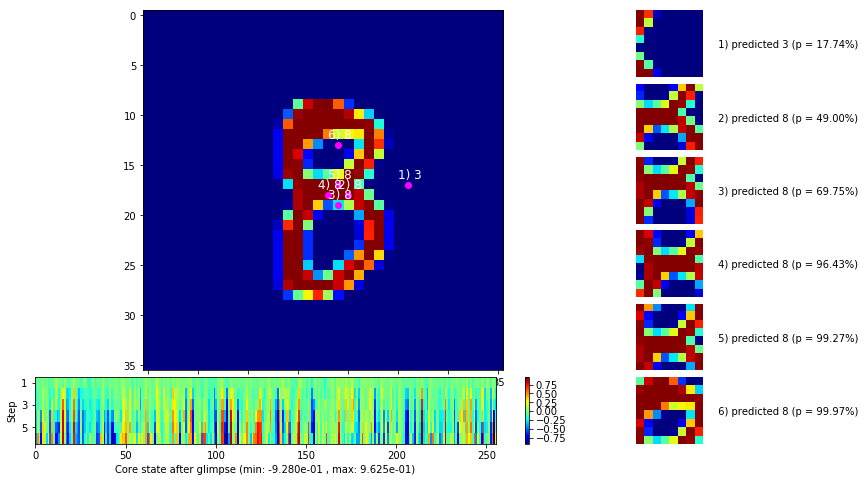

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


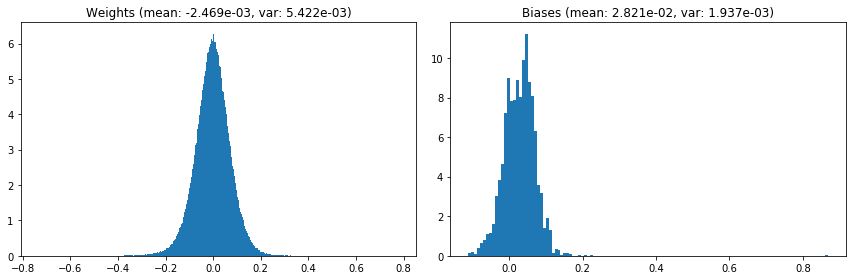

                                      Location network weights and biases


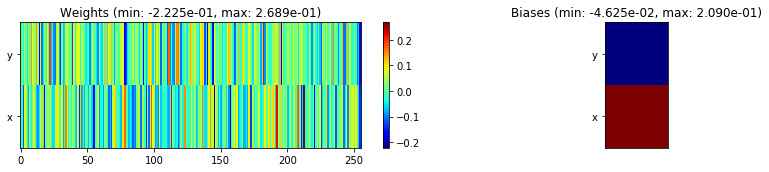

---------------------------------------------------------------------------------------------------------------
Elapsed time:  396.44 sec | TRAIN >> class loss: 0.3304 | steps:  2.536 :( | reward:  0.8927    | acc.: 89.272% 
                          | VAL   >> class loss: 0.2649 | steps:  2.292 :( | reward:  0.9168    | acc.: 91.680% 


Epoch  20/400) lr = 3.82e-05
 b    500/  3000 >> 132.5 ms/b | lr: 3.77e-05 | grad 2norm:  6.28 | grad inf norm:  1.490
       Weights || abs max:  0.78 (37835.18) | mean: -2.45e-03 ( 0.21) | var: 5.43e-03 (17540.84)
        Biases || abs max:  0.87 ( 2989.29) | mean:  2.83e-02 ( 3.07) | var: 1.94e-03 (60167.96)
                  class loss: 0.321 | steps: 2.521 | reward:  0.897 | acc.: 89.70%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.8 ms/b | lr: 3.72e-05 | grad 2norm:  6.48 | grad inf norm:  1.567
       Weights || abs max:  0.78 (48235.05) | mean: -2.45e-03 ( 0.23) | var:

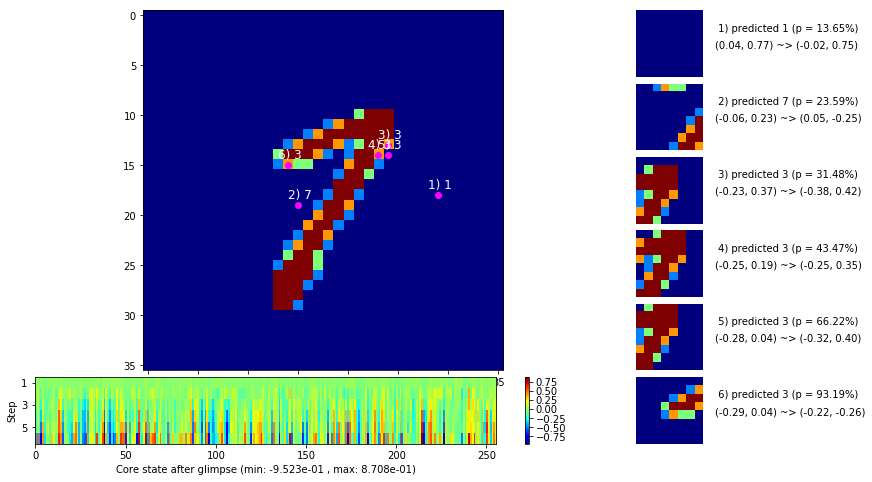

 b   1500/  3000 >> 133.8 ms/b | lr: 3.64e-05 | grad 2norm:  6.47 | grad inf norm:  1.570
       Weights || abs max:  0.78 (69463.31) | mean: -2.45e-03 ( 0.26) | var: 5.44e-03 (342859.12)
        Biases || abs max:  0.87 (10787.32) | mean:  2.83e-02 ( 6.65) | var: 1.95e-03 (895820.94)
                  class loss: 0.332 | steps: 2.549 | reward:  0.890 | acc.: 88.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.1 ms/b | lr: 3.59e-05 | grad 2norm:  6.40 | grad inf norm:  1.529
       Weights || abs max:  0.78 (32513.55) | mean: -2.44e-03 ( 0.20) | var: 5.45e-03 (21260.17)
        Biases || abs max:  0.87 ( 3199.88) | mean:  2.84e-02 ( 3.59) | var: 1.96e-03 (278866.12)
                  class loss: 0.321 | steps: 2.548 | reward:  0.894 | acc.: 89.39%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

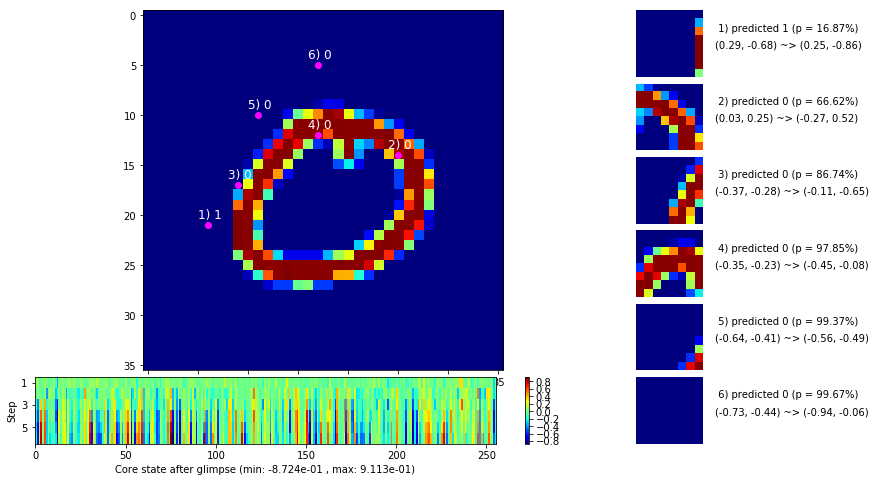

 b   2500/  3000 >> 134.6 ms/b | lr: 3.52e-05 | grad 2norm:  6.75 | grad inf norm:  1.631
       Weights || abs max:  0.78 (57564.25) | mean: -2.46e-03 ( 0.24) | var: 5.45e-03 (258695.06)
        Biases || abs max:  0.87 ( 2481.68) | mean:  2.83e-02 ( 2.54) | var: 1.96e-03 (24483.33)
                  class loss: 0.365 | steps: 2.562 | reward:  0.881 | acc.: 88.14%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.5 ms/b | lr: 3.47e-05 | grad 2norm:  6.55 | grad inf norm:  1.594
       Weights || abs max:  0.78 (79905.98) | mean: -2.46e-03 ( 0.29) | var: 5.46e-03 (242639.58)
        Biases || abs max:  0.87 ( 6471.72) | mean:  2.83e-02 ( 4.27) | var: 1.96e-03 (361424.53)
                  class loss: 0.349 | steps: 2.525 | reward:  0.886 | acc.: 88.60%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

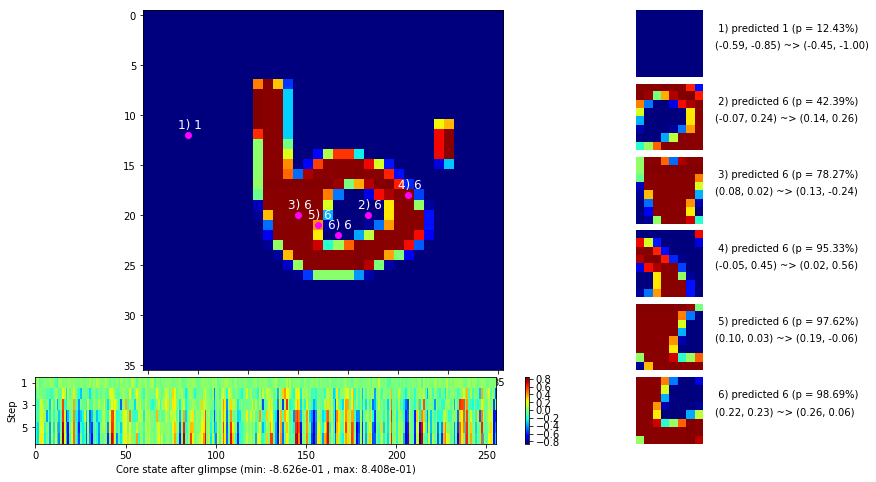

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


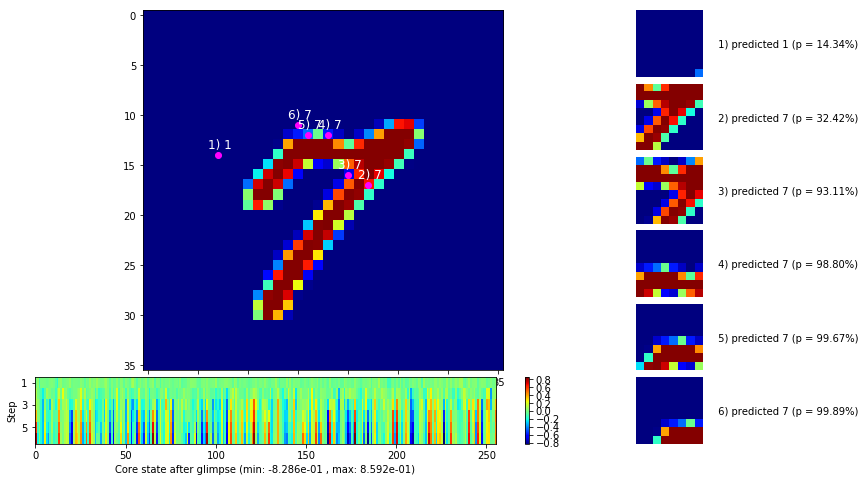


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


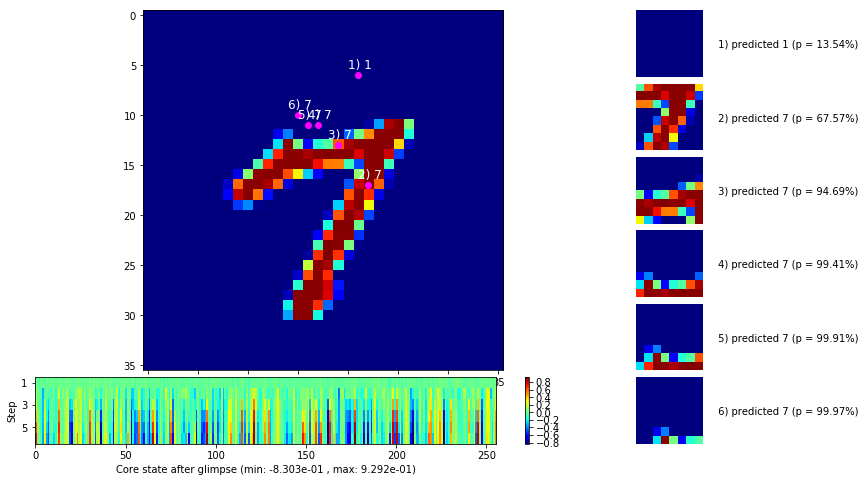

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


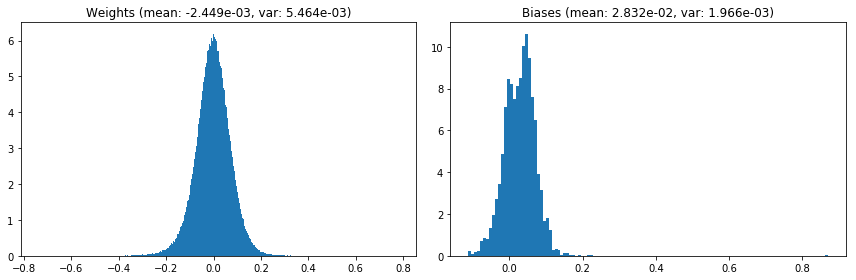

                                      Location network weights and biases


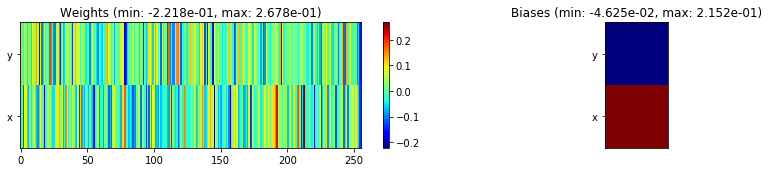

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.67 sec | TRAIN >> class loss: 0.3378 | steps:  2.544 :( | reward:  0.8894 :( | acc.: 88.943% :(
                          | VAL   >> class loss: 0.2961 | steps:  2.298 :( | reward:  0.8986 :( | acc.: 89.860% :(


Epoch  21/400) lr = 3.449e-05
 b    500/  3000 >> 132.5 ms/b | lr: 3.40e-05 | grad 2norm:  6.55 | grad inf norm:  1.626
       Weights || abs max:  0.78 (37759.10) | mean: -2.45e-03 ( 0.21) | var: 5.47e-03 (14980.52)
        Biases || abs max:  0.87 ( 2776.17) | mean:  2.83e-02 ( 3.34) | var: 1.97e-03 (493959.25)
                  class loss: 0.360 | steps: 2.558 | reward:  0.881 | acc.: 88.11%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.8 ms/b | lr: 3.36e-05 | grad 2norm:  6.64 | grad inf norm:  1.594
       Weights || abs max:  0.78 (55209.37) | mean: -2.45e-03 ( 0.24) 

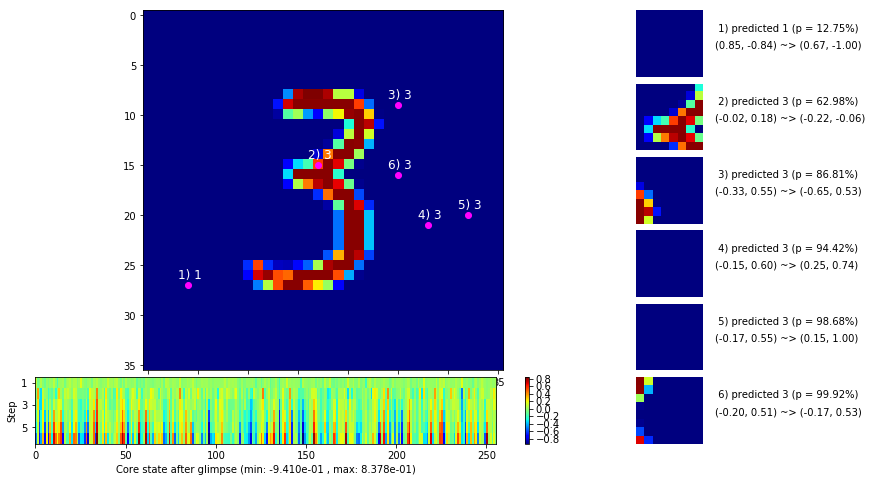

 b   1500/  3000 >> 132.4 ms/b | lr: 3.29e-05 | grad 2norm:  6.60 | grad inf norm:  1.560
       Weights || abs max:  0.78 (59754.71) | mean: -2.45e-03 ( 0.24) | var: 5.48e-03 (196507.20)
        Biases || abs max:  0.87 ( 8739.10) | mean:  2.84e-02 ( 5.08) | var: 1.98e-03 (2569868.50)
                  class loss: 0.359 | steps: 2.573 | reward:  0.883 | acc.: 88.33%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.6 ms/b | lr: 3.25e-05 | grad 2norm:  6.55 | grad inf norm:  1.592
       Weights || abs max:  0.79 (38966.52) | mean: -2.44e-03 ( 0.21) | var: 5.49e-03 (38386.61)
        Biases || abs max:  0.87 ( 9424.53) | mean:  2.85e-02 ( 5.43) | var: 1.98e-03 (755679.75)
                  class loss: 0.346 | steps: 2.546 | reward:  0.888 | acc.: 88.78%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

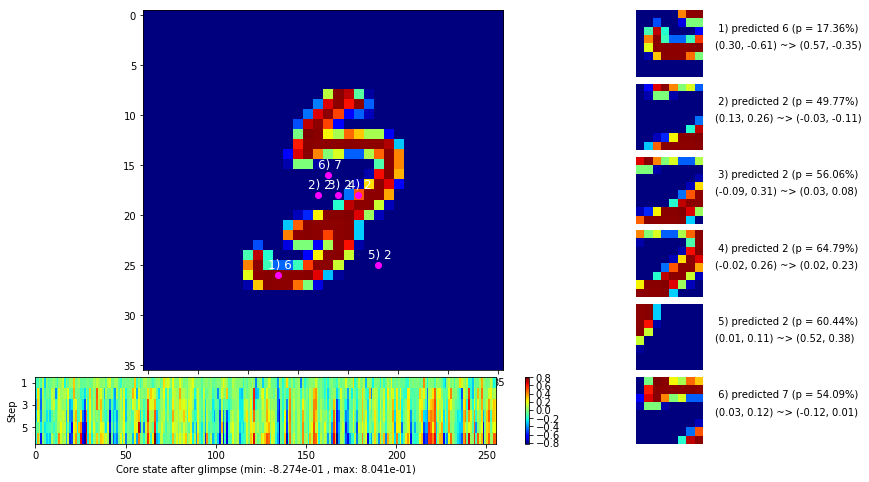

 b   2500/  3000 >> 142.2 ms/b | lr: 3.19e-05 | grad 2norm:  6.71 | grad inf norm:  1.635
       Weights || abs max:  0.79 (46790.52) | mean: -2.42e-03 ( 0.23) | var: 5.50e-03 (50099.07)
        Biases || abs max:  0.87 ( 4077.14) | mean:  2.85e-02 ( 3.33) | var: 1.98e-03 (76845.84)
                  class loss: 0.356 | steps: 2.540 | reward:  0.880 | acc.: 88.00%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.3 ms/b | lr: 3.15e-05 | grad 2norm:  6.62 | grad inf norm:  1.640
       Weights || abs max:  0.79 (30139.92) | mean: -2.43e-03 ( 0.19) | var: 5.50e-03 (12993.50)
        Biases || abs max:  0.87 ( 5832.04) | mean:  2.85e-02 ( 3.86) | var: 1.99e-03 (318152.31)
                  class loss: 0.359 | steps: 2.550 | reward:  0.881 | acc.: 88.14%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

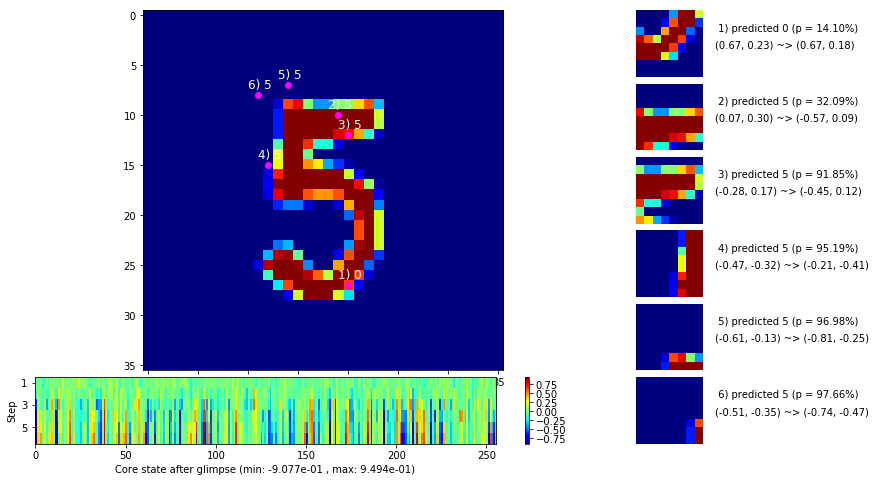

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


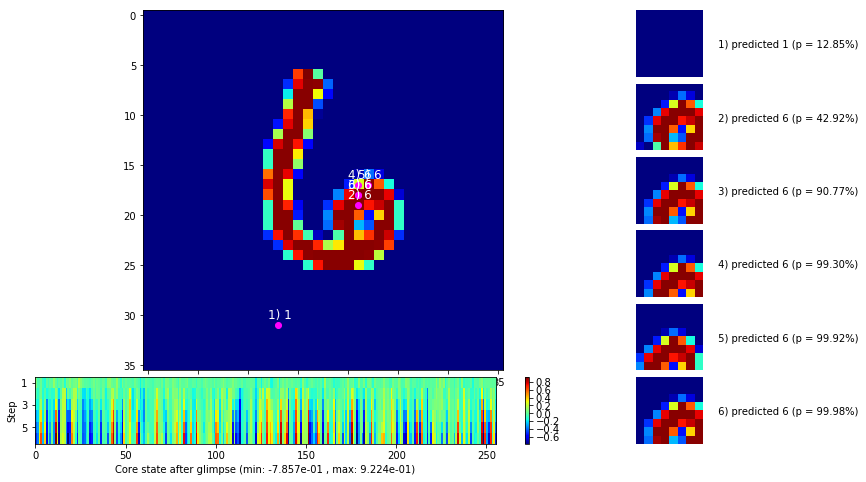


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


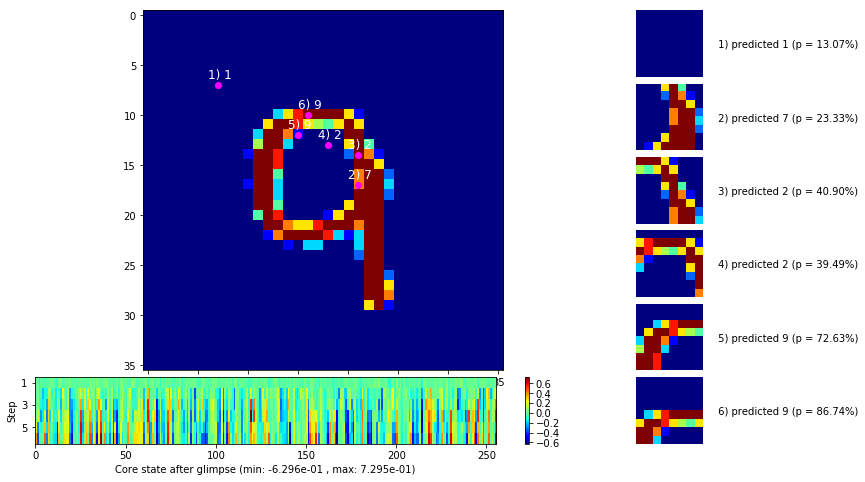

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


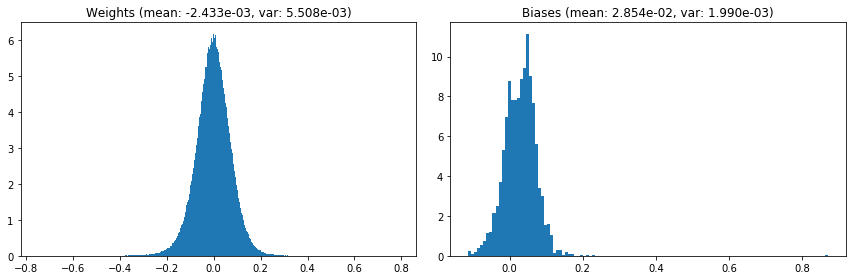

                                      Location network weights and biases


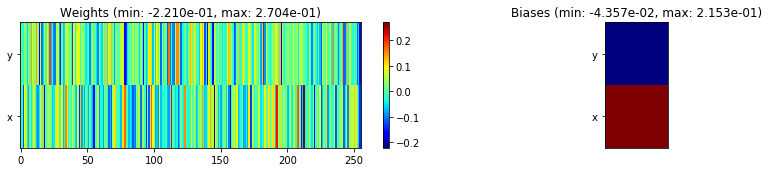

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.02 sec | TRAIN >> class loss: 0.3562 | steps:  2.554 :( | reward:  0.8826 :( | acc.: 88.257% :(
                          | VAL   >> class loss: 0.2958 | steps:  2.291 :( | reward:  0.9040 :( | acc.: 90.400% :(


Epoch  22/400) lr = 3.13e-05
 b    500/  3000 >> 133.3 ms/b | lr: 3.09e-05 | grad 2norm:  6.53 | grad inf norm:  1.543
       Weights || abs max:  0.79 (51727.68) | mean: -2.43e-03 ( 0.24) | var: 5.51e-03 (55213.03)
        Biases || abs max:  0.87 ( 9353.19) | mean:  2.86e-02 ( 5.52) | var: 1.99e-03 (4979924.00)
                  class loss: 0.345 | steps: 2.525 | reward:  0.888 | acc.: 88.77%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.3 ms/b | lr: 3.05e-05 | grad 2norm:  6.60 | grad inf norm:  1.536
       Weights || abs max:  0.79 (33048.38) | mean: -2.42e-03 ( 0.20) 

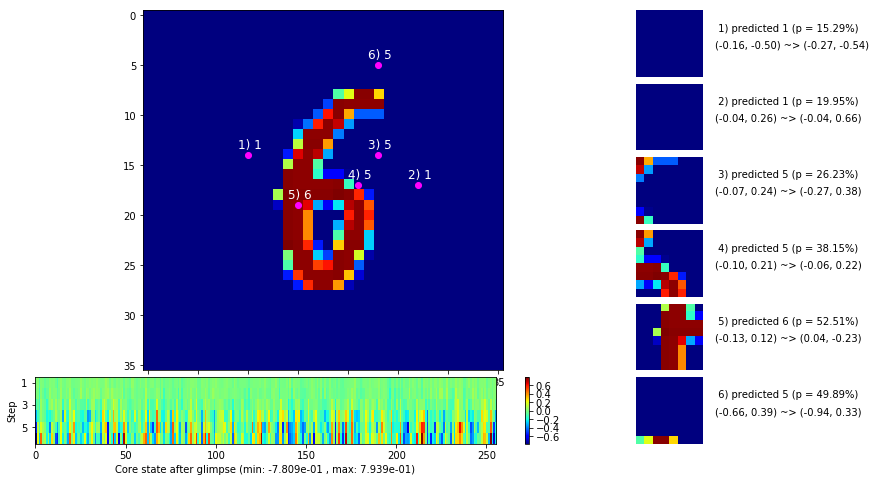

 b   1500/  3000 >> 134.0 ms/b | lr: 3.00e-05 | grad 2norm:  6.54 | grad inf norm:  1.517
       Weights || abs max:  0.79 (74400.29) | mean: -2.42e-03 ( 0.28) | var: 5.53e-03 (374680.53)
        Biases || abs max:  0.87 ( 8030.54) | mean:  2.87e-02 ( 4.70) | var: 2.00e-03 (3796569.25)
                  class loss: 0.348 | steps: 2.528 | reward:  0.888 | acc.: 88.80%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.6 ms/b | lr: 2.96e-05 | grad 2norm:  6.68 | grad inf norm:  1.602
       Weights || abs max:  0.79 (46173.48) | mean: -2.43e-03 ( 0.23) | var: 5.53e-03 (50598.84)
        Biases || abs max:  0.87 ( 6094.38) | mean:  2.86e-02 ( 4.08) | var: 2.00e-03 (686963.94)
                  class loss: 0.367 | steps: 2.555 | reward:  0.882 | acc.: 88.20%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

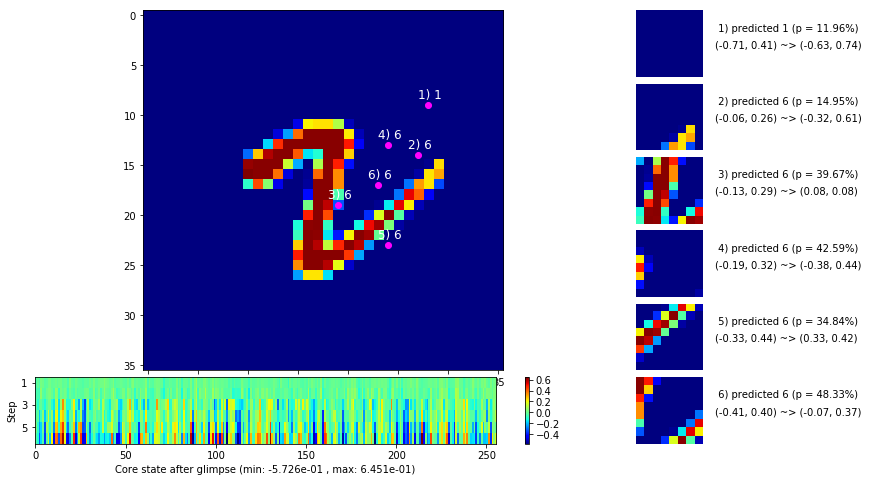

 b   2500/  3000 >> 134.1 ms/b | lr: 2.90e-05 | grad 2norm:  6.78 | grad inf norm:  1.578
       Weights || abs max:  0.79 (44166.05) | mean: -2.44e-03 ( 0.22) | var: 5.54e-03 (89642.27)
        Biases || abs max:  0.87 ( 5268.94) | mean:  2.86e-02 ( 4.12) | var: 2.01e-03 (612073.56)
                  class loss: 0.357 | steps: 2.535 | reward:  0.882 | acc.: 88.17%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.5 ms/b | lr: 2.87e-05 | grad 2norm:  6.56 | grad inf norm:  1.583
       Weights || abs max:  0.79 (44424.44) | mean: -2.45e-03 ( 0.22) | var: 5.54e-03 (60962.02)
        Biases || abs max:  0.87 (11292.08) | mean:  2.86e-02 ( 6.44) | var: 2.01e-03 (5328664.50)
                  class loss: 0.359 | steps: 2.520 | reward:  0.886 | acc.: 88.59%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

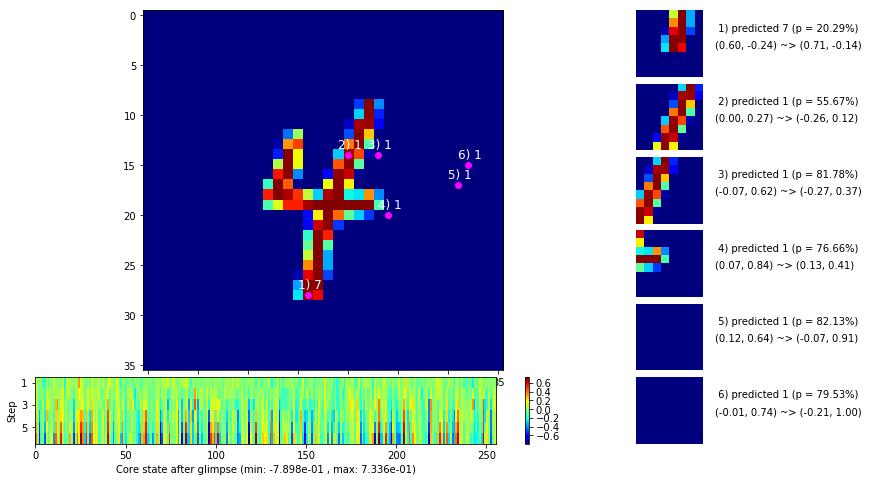

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


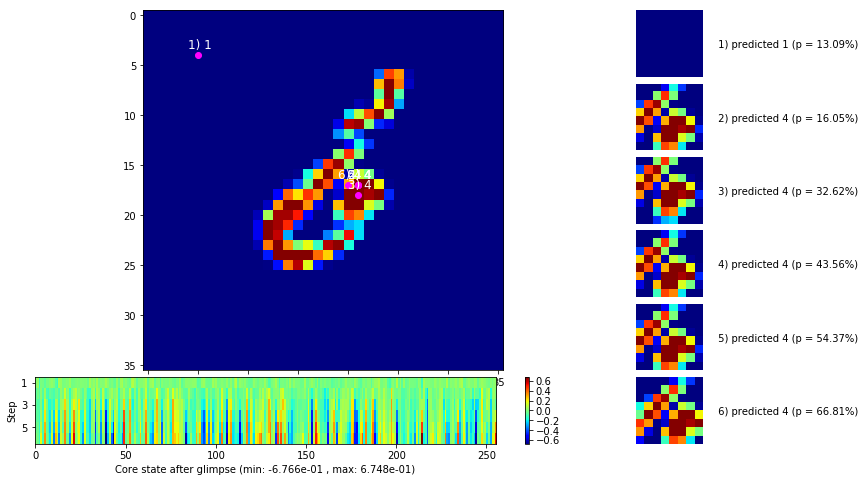


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


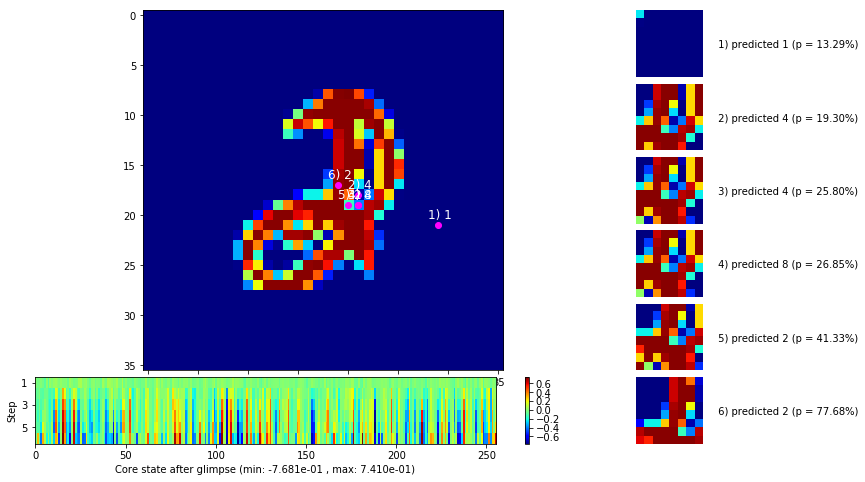

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


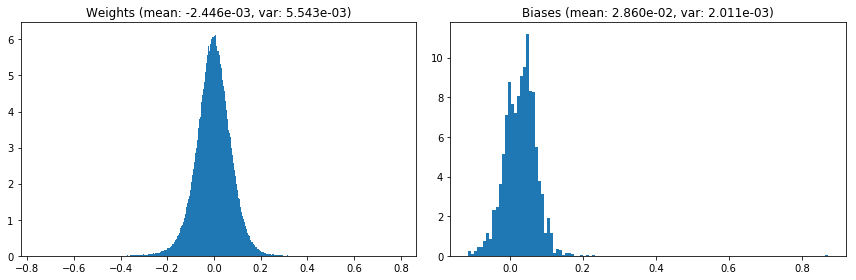

                                      Location network weights and biases


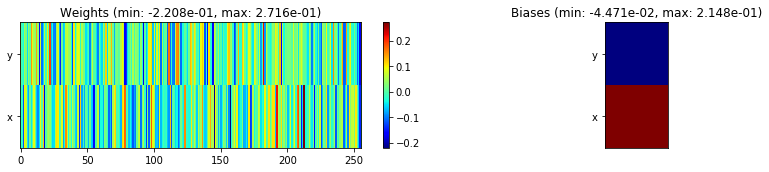

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.41 sec | TRAIN >> class loss: 0.3540 | steps:  2.537 :( | reward:  0.8851 :( | acc.: 88.510% :(
                          | VAL   >> class loss: 0.2895 | steps:  2.303 :( | reward:  0.9028 :( | acc.: 90.280% :(


Epoch  23/400) lr = 2.852e-05
 b    500/  3000 >> 137.4 ms/b | lr: 2.82e-05 | grad 2norm:  6.64 | grad inf norm:  1.643
       Weights || abs max:  0.79 (34574.12) | mean: -2.44e-03 ( 0.21) | var: 5.55e-03 (19808.98)
        Biases || abs max:  0.87 ( 2163.48) | mean:  2.87e-02 ( 2.45) | var: 2.02e-03 (11812.54)
                  class loss: 0.343 | steps: 2.541 | reward:  0.886 | acc.: 88.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.8 ms/b | lr: 2.78e-05 | grad 2norm:  6.62 | grad inf norm:  1.594
       Weights || abs max:  0.79 (43221.49) | mean: -2.43e-03 ( 0.22) |

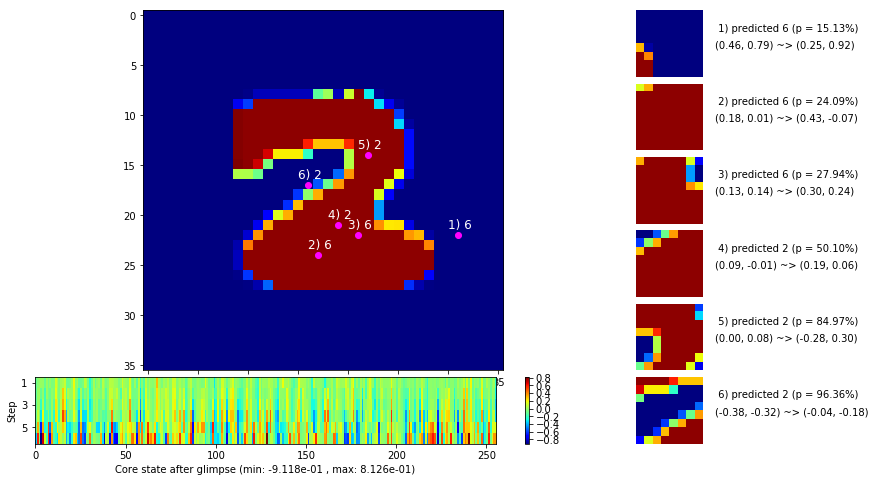

 b   1500/  3000 >> 132.4 ms/b | lr: 2.74e-05 | grad 2norm:  6.60 | grad inf norm:  1.581
       Weights || abs max:  0.79 (91359.12) | mean: -2.43e-03 ( 0.31) | var: 5.56e-03 (1075769.25)
        Biases || abs max:  0.87 ( 3370.18) | mean:  2.88e-02 ( 3.19) | var: 2.03e-03 (81050.26)
                  class loss: 0.353 | steps: 2.550 | reward:  0.888 | acc.: 88.80%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 2.70e-05 | grad 2norm:  6.85 | grad inf norm:  1.634
       Weights || abs max:  0.79 (103626.69) | mean: -2.44e-03 ( 0.32) | var: 5.56e-03 (1494267.25)
        Biases || abs max:  0.87 ( 3498.58) | mean:  2.88e-02 ( 3.21) | var: 2.03e-03 (152912.33)
                  class loss: 0.358 | steps: 2.526 | reward:  0.881 | acc.: 88.07%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

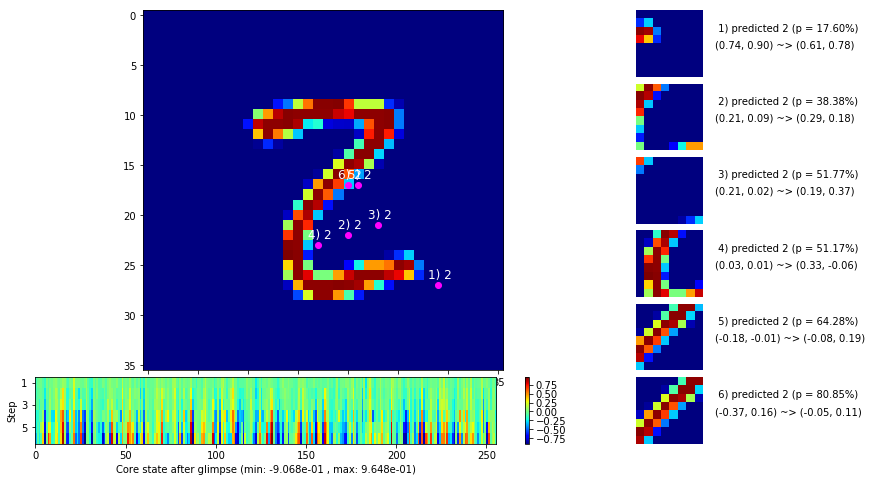

 b   2500/  3000 >> 134.8 ms/b | lr: 2.66e-05 | grad 2norm:  6.52 | grad inf norm:  1.532
       Weights || abs max:  0.79 (98765.34) | mean: -2.44e-03 ( 0.31) | var: 5.57e-03 (2909930.00)
        Biases || abs max:  0.87 ( 7739.34) | mean:  2.88e-02 ( 5.12) | var: 2.03e-03 (310567.38)
                  class loss: 0.338 | steps: 2.506 | reward:  0.891 | acc.: 89.06%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.4 ms/b | lr: 2.63e-05 | grad 2norm:  6.59 | grad inf norm:  1.538
       Weights || abs max:  0.79 (54462.36) | mean: -2.44e-03 ( 0.24) | var: 5.57e-03 (139135.73)
        Biases || abs max:  0.87 ( 8950.25) | mean:  2.88e-02 ( 5.95) | var: 2.04e-03 (2004390.62)
                  class loss: 0.342 | steps: 2.542 | reward:  0.887 | acc.: 88.72%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

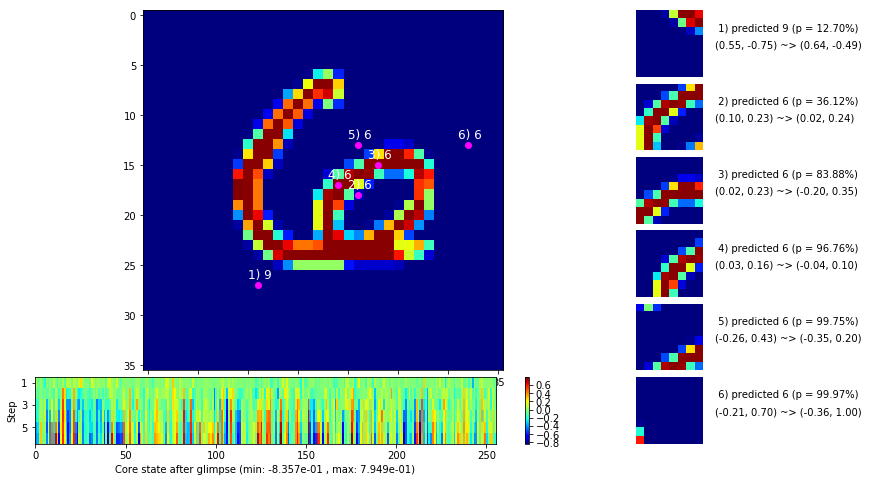

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


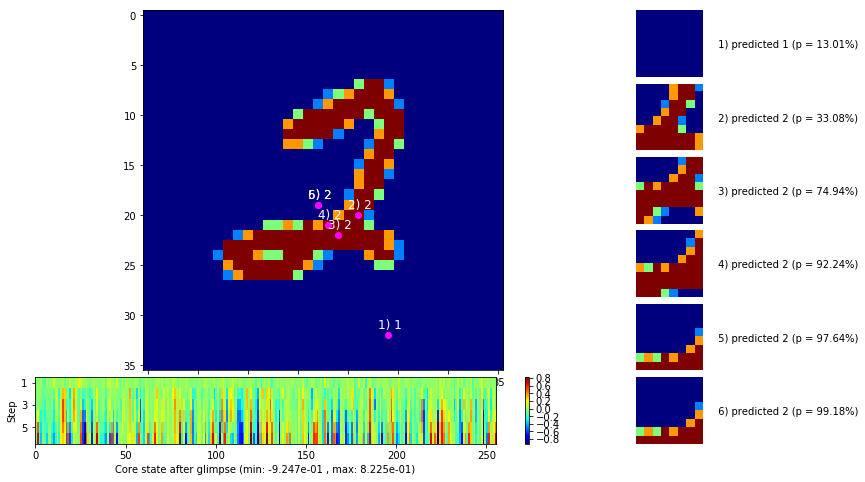


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


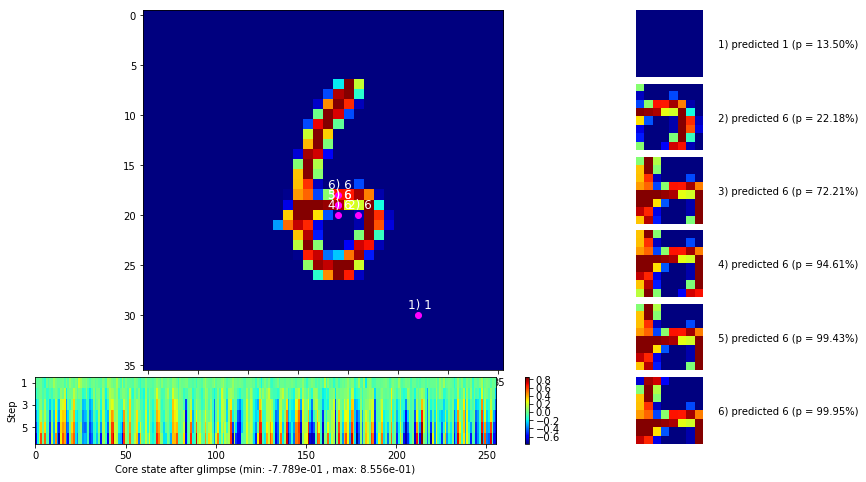

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


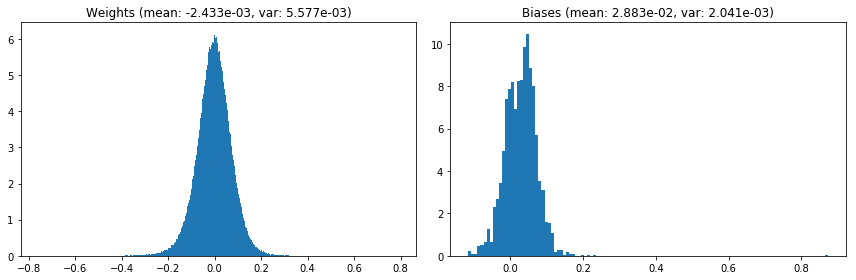

                                      Location network weights and biases


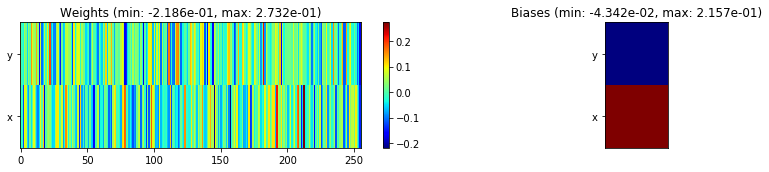

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.15 sec | TRAIN >> class loss: 0.3463 | steps:  2.533 :( | reward:  0.8871 :( | acc.: 88.705% :(
                          | VAL   >> class loss: 0.2786 | steps:  2.281 :( | reward:  0.9094 :( | acc.: 90.940% :(


Epoch  24/400) lr = 2.61e-05
 b    500/  3000 >> 134.0 ms/b | lr: 2.58e-05 | grad 2norm:  6.72 | grad inf norm:  1.630
       Weights || abs max:  0.79 (39933.52) | mean: -2.43e-03 ( 0.22) | var: 5.58e-03 (42904.43)
        Biases || abs max:  0.87 ( 3373.61) | mean:  2.88e-02 ( 3.59) | var: 2.04e-03 (74991.07)
                  class loss: 0.339 | steps: 2.525 | reward:  0.888 | acc.: 88.83%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 2.55e-05 | grad 2norm:  6.60 | grad inf norm:  1.617
       Weights || abs max:  0.79 (103299.59) | mean: -2.44e-03 ( 0.32) |

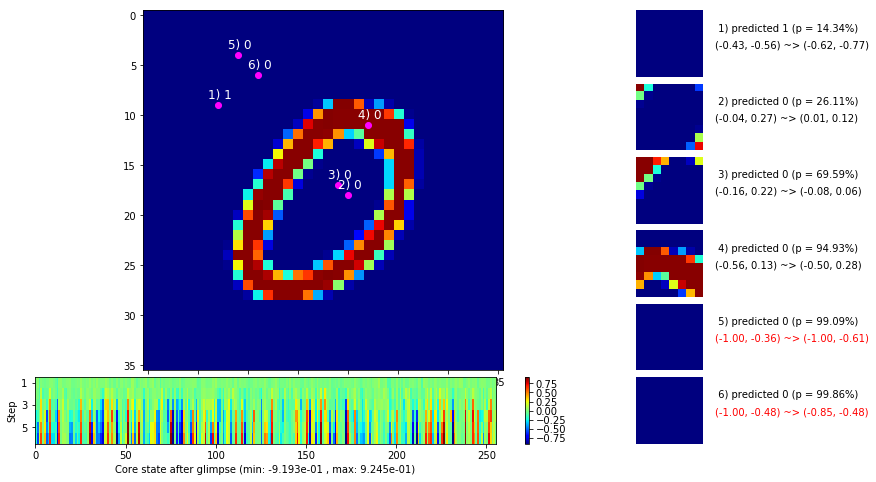

 b   1500/  3000 >> 132.4 ms/b | lr: 2.51e-05 | grad 2norm:  6.69 | grad inf norm:  1.612
       Weights || abs max:  0.79 (208872.22) | mean: -2.44e-03 ( 0.50) | var: 5.59e-03 (21029648.00)
        Biases || abs max:  0.87 ( 5138.80) | mean:  2.88e-02 ( 3.73) | var: 2.04e-03 (306479.44)
                  class loss: 0.345 | steps: 2.543 | reward:  0.883 | acc.: 88.32%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 140.3 ms/b | lr: 2.48e-05 | grad 2norm:  6.53 | grad inf norm:  1.579
       Weights || abs max:  0.79 (93563.47) | mean: -2.44e-03 ( 0.32) | var: 5.59e-03 (1290470.25)
        Biases || abs max:  0.87 ( 3838.37) | mean:  2.88e-02 ( 3.31) | var: 2.05e-03 (619494.56)
                  class loss: 0.354 | steps: 2.526 | reward:  0.887 | acc.: 88.72%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

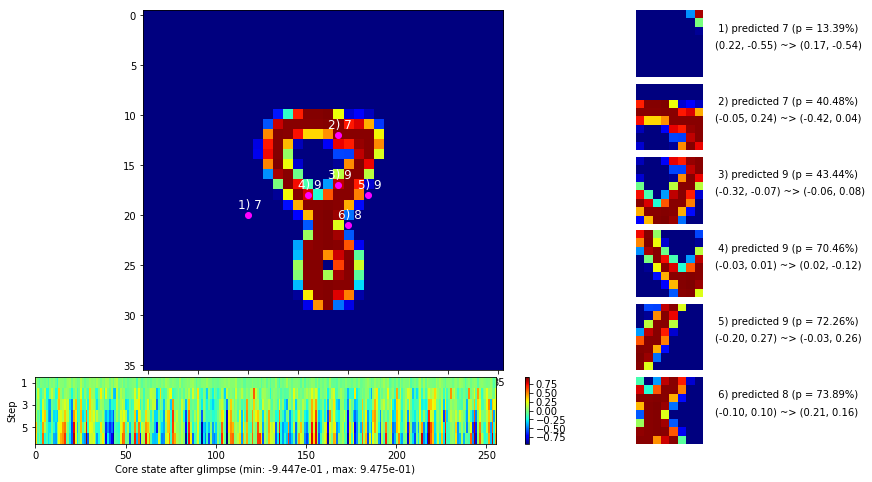

 b   2500/  3000 >> 133.6 ms/b | lr: 2.44e-05 | grad 2norm:  6.67 | grad inf norm:  1.539
       Weights || abs max:  0.79 (38265.05) | mean: -2.42e-03 ( 0.23) | var: 5.60e-03 (17280.59)
        Biases || abs max:  0.87 ( 7434.51) | mean:  2.88e-02 ( 4.84) | var: 2.05e-03 (527040.00)
                  class loss: 0.351 | steps: 2.532 | reward:  0.884 | acc.: 88.42%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.0 ms/b | lr: 2.41e-05 | grad 2norm:  6.66 | grad inf norm:  1.616
       Weights || abs max:  0.79 (80737.84) | mean: -2.43e-03 ( 0.29) | var: 5.60e-03 (1320397.75)
        Biases || abs max:  0.87 ( 5878.26) | mean:  2.88e-02 ( 3.87) | var: 2.05e-03 (1316800.50)
                  class loss: 0.357 | steps: 2.550 | reward:  0.883 | acc.: 88.29%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

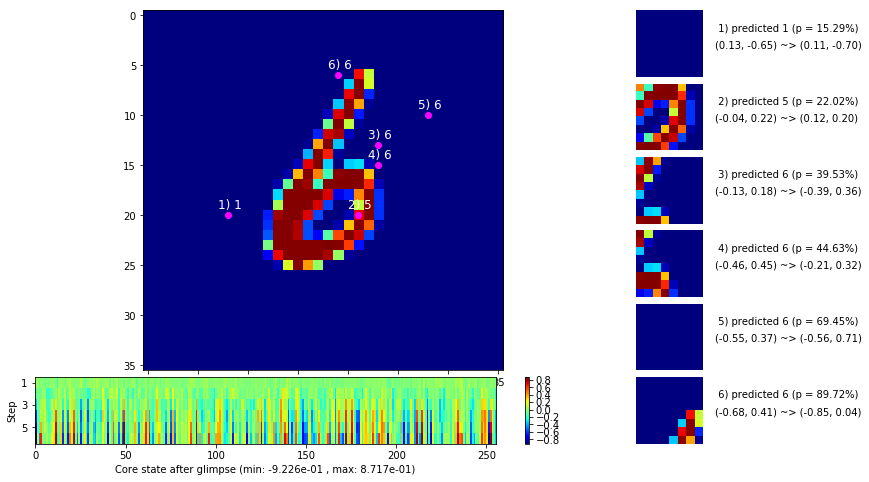

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


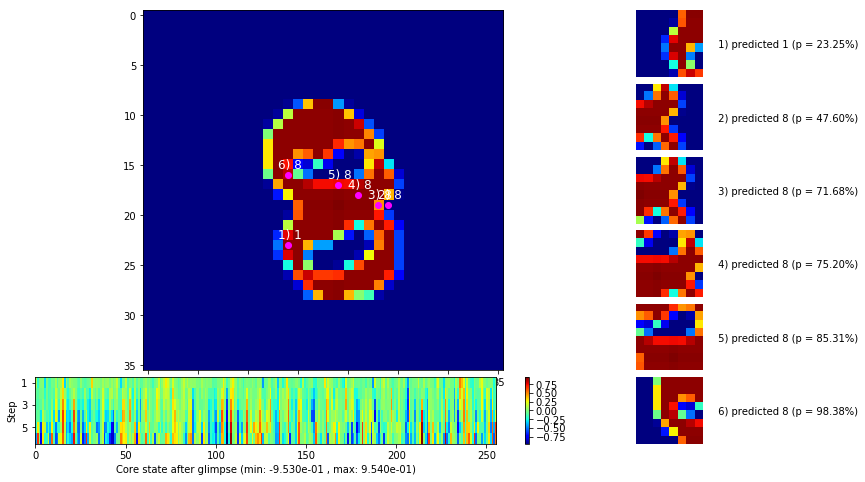


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


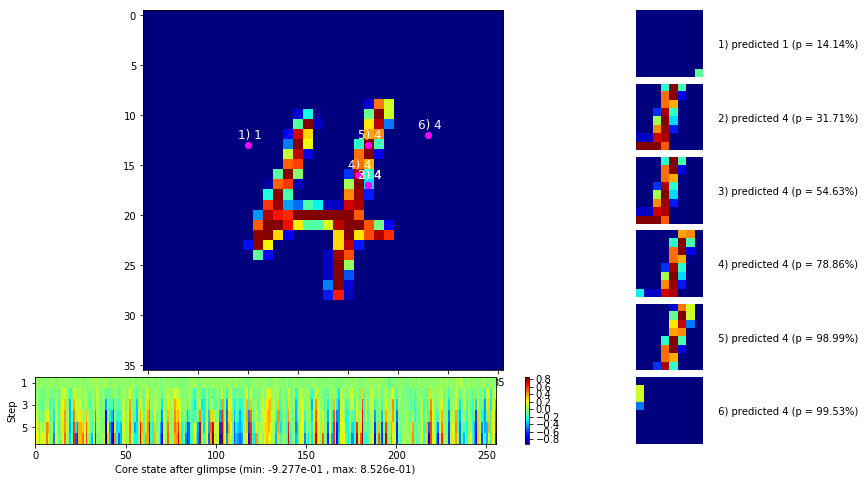

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


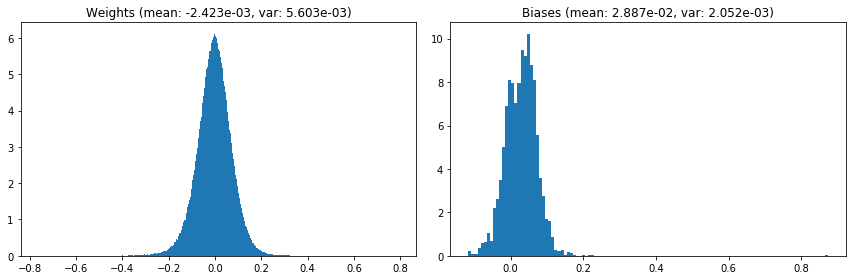

                                      Location network weights and biases


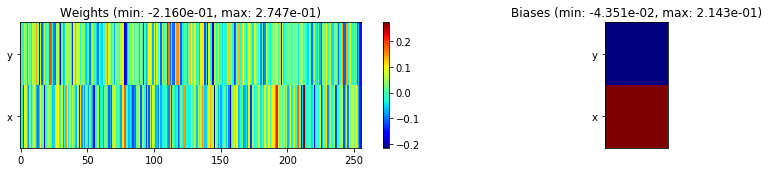

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.68 sec | TRAIN >> class loss: 0.3485 | steps:  2.535 :( | reward:  0.8853 :( | acc.: 88.528% :(
                          | VAL   >> class loss: 0.2864 | steps:  2.281 :( | reward:  0.9078 :( | acc.: 90.780% :(


Epoch  25/400) lr = 2.398e-05
 b    500/  3000 >> 131.8 ms/b | lr: 2.37e-05 | grad 2norm:  6.67 | grad inf norm:  1.569
       Weights || abs max:  0.79 (308164.94) | mean: -2.42e-03 ( 0.66) | var: 5.61e-03 (55672540.00)
        Biases || abs max:  0.87 ( 4326.77) | mean:  2.89e-02 ( 3.25) | var: 2.05e-03 (401541.12)
                  class loss: 0.343 | steps: 2.509 | reward:  0.886 | acc.: 88.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.5 ms/b | lr: 2.35e-05 | grad 2norm:  6.68 | grad inf norm:  1.573
       Weights || abs max:  0.79 (42892.33) | mean: -2.43e-03 ( 0.

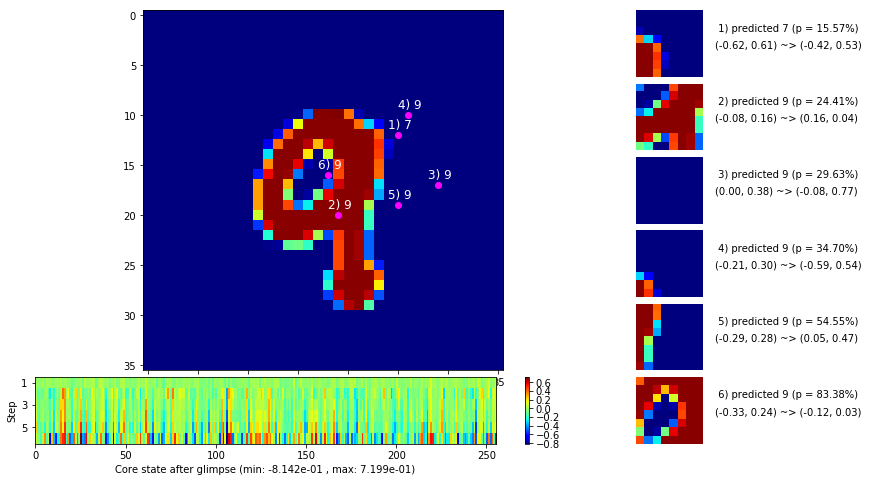

 b   1500/  3000 >> 132.2 ms/b | lr: 2.31e-05 | grad 2norm:  6.61 | grad inf norm:  1.584
       Weights || abs max:  0.79 (57736.69) | mean: -2.44e-03 ( 0.25) | var: 5.61e-03 (121107.73)
        Biases || abs max:  0.87 ( 2976.63) | mean:  2.89e-02 ( 3.37) | var: 2.06e-03 (33228.77)
                  class loss: 0.356 | steps: 2.545 | reward:  0.883 | acc.: 88.27%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.2 ms/b | lr: 2.28e-05 | grad 2norm:  6.57 | grad inf norm:  1.624
       Weights || abs max:  0.79 (57556.42) | mean: -2.44e-03 ( 0.25) | var: 5.62e-03 (409123.78)
        Biases || abs max:  0.87 ( 5798.90) | mean:  2.89e-02 ( 4.21) | var: 2.06e-03 (1349281.88)
                  class loss: 0.351 | steps: 2.534 | reward:  0.886 | acc.: 88.59%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

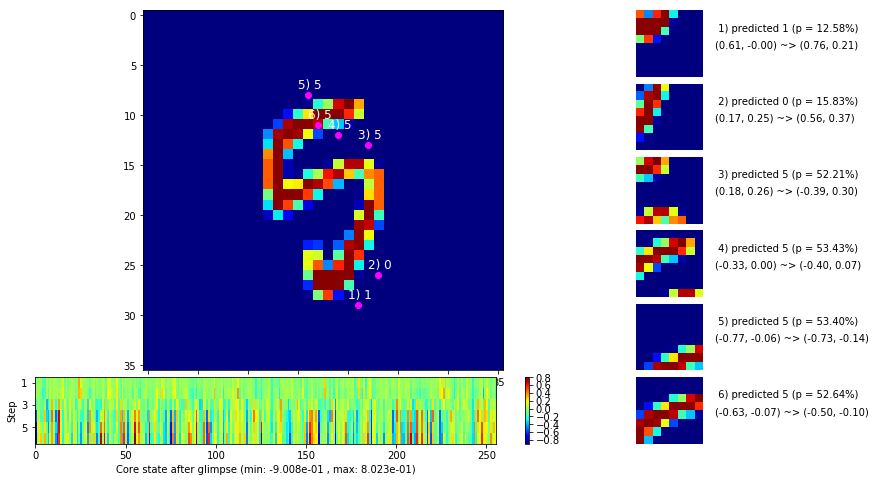

 b   2500/  3000 >> 133.7 ms/b | lr: 2.25e-05 | grad 2norm:  6.63 | grad inf norm:  1.585
       Weights || abs max:  0.79 (43811.01) | mean: -2.43e-03 ( 0.23) | var: 5.63e-03 (36921.02)
        Biases || abs max:  0.87 ( 4947.01) | mean:  2.89e-02 ( 3.59) | var: 2.07e-03 (228305.19)
                  class loss: 0.352 | steps: 2.547 | reward:  0.884 | acc.: 88.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.5 ms/b | lr: 2.22e-05 | grad 2norm:  6.64 | grad inf norm:  1.553
       Weights || abs max:  0.79 (111783.69) | mean: -2.43e-03 ( 0.35) | var: 5.63e-03 (1946399.88)
        Biases || abs max:  0.87 ( 1907.36) | mean:  2.89e-02 ( 2.45) | var: 2.07e-03 ( 8375.47)
                  class loss: 0.353 | steps: 2.557 | reward:  0.883 | acc.: 88.27%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

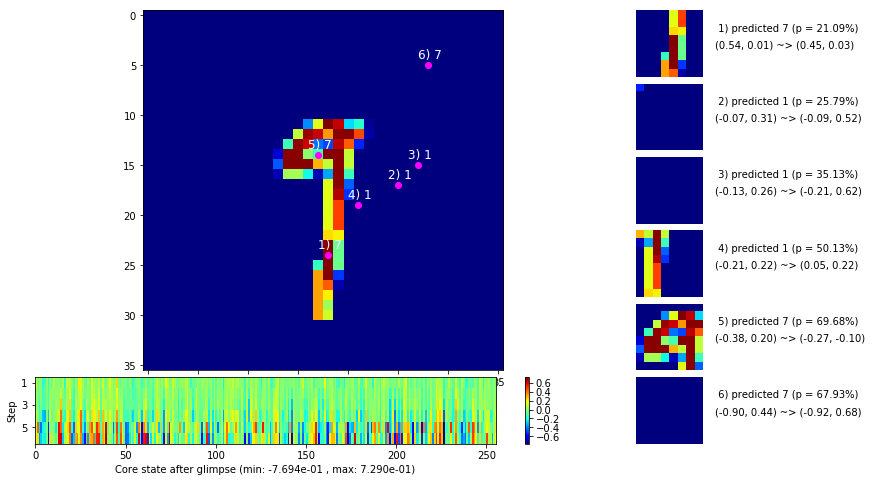

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


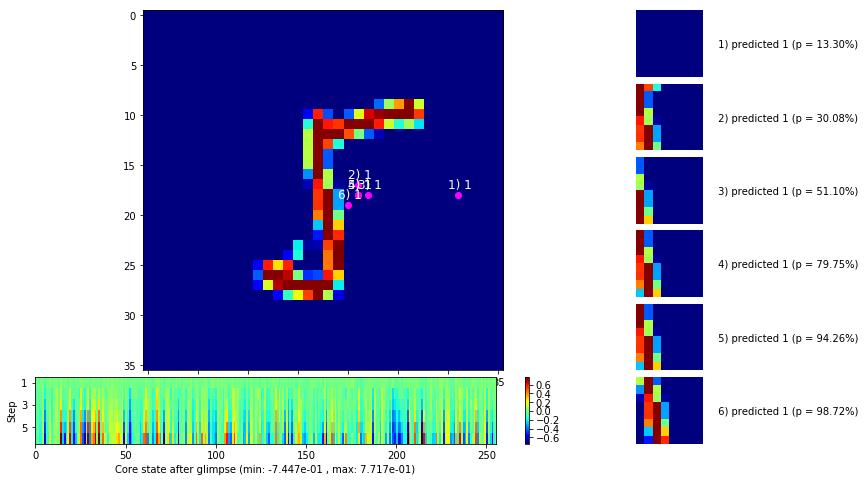


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


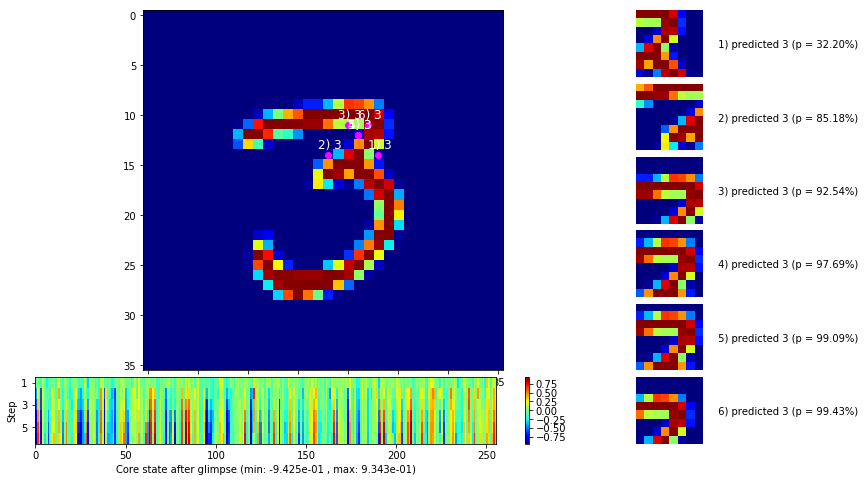

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


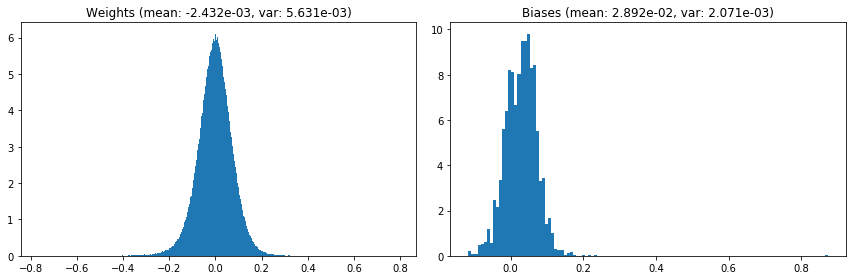

                                      Location network weights and biases


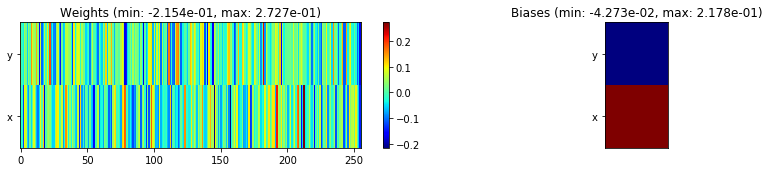

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.97 sec | TRAIN >> class loss: 0.3515 | steps:  2.539 :( | reward:  0.8840 :( | acc.: 88.397% :(
                          | VAL   >> class loss: 0.2782 | steps:  2.245    | reward:  0.9090 :( | acc.: 90.900% :(


Epoch  26/400) lr = 2.21e-05
 b    500/  3000 >> 140.7 ms/b | lr: 2.19e-05 | grad 2norm:  6.61 | grad inf norm:  1.556
       Weights || abs max:  0.79 (42653.71) | mean: -2.43e-03 ( 0.23) | var: 5.63e-03 (50076.59)
        Biases || abs max:  0.87 ( 5237.54) | mean:  2.89e-02 ( 3.87) | var: 2.07e-03 (1195285.38)
                  class loss: 0.347 | steps: 2.550 | reward:  0.887 | acc.: 88.69%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.5 ms/b | lr: 2.16e-05 | grad 2norm:  6.63 | grad inf norm:  1.581
       Weights || abs max:  0.79 (34020.20) | mean: -2.44e-03 ( 0.21) 

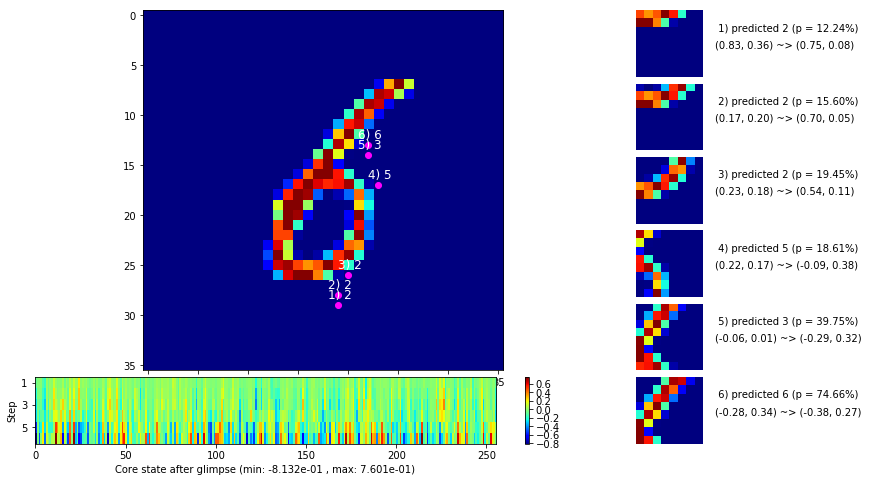

 b   1500/  3000 >> 135.2 ms/b | lr: 2.13e-05 | grad 2norm:  6.73 | grad inf norm:  1.640
       Weights || abs max:  0.79 (149195.97) | mean: -2.43e-03 ( 0.41) | var: 5.64e-03 (4770562.00)
        Biases || abs max:  0.87 ( 5624.98) | mean:  2.90e-02 ( 4.18) | var: 2.08e-03 (470814.00)
                  class loss: 0.360 | steps: 2.546 | reward:  0.882 | acc.: 88.18%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.1 ms/b | lr: 2.11e-05 | grad 2norm:  6.69 | grad inf norm:  1.619
       Weights || abs max:  0.80 (307870.66) | mean: -2.43e-03 ( 0.67) | var: 5.65e-03 (49019288.00)
        Biases || abs max:  0.87 ( 6950.80) | mean:  2.90e-02 ( 6.10) | var: 2.08e-03 (3308706.75)
                  class loss: 0.358 | steps: 2.540 | reward:  0.880 | acc.: 88.02%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [0.0, 0.0, 0.0, 0.0,

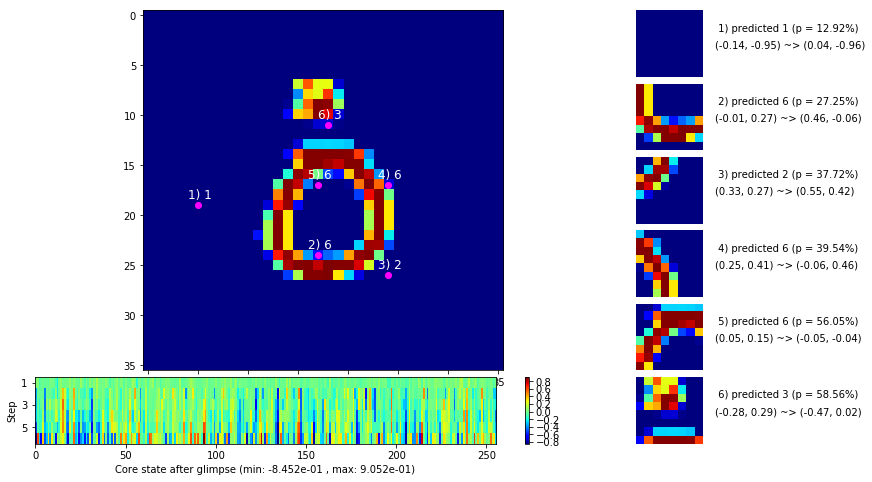

 b   2500/  3000 >> 134.1 ms/b | lr: 2.08e-05 | grad 2norm:  6.70 | grad inf norm:  1.580
       Weights || abs max:  0.80 (162550.75) | mean: -2.44e-03 ( 0.43) | var: 5.65e-03 (6492117.50)
        Biases || abs max:  0.87 ( 6052.12) | mean:  2.90e-02 ( 5.01) | var: 2.08e-03 (191823.33)
                  class loss: 0.354 | steps: 2.543 | reward:  0.881 | acc.: 88.06%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.6 ms/b | lr: 2.05e-05 | grad 2norm:  6.58 | grad inf norm:  1.519
       Weights || abs max:  0.80 (64904.39) | mean: -2.44e-03 ( 0.27) | var: 5.65e-03 (157282.64)
        Biases || abs max:  0.87 ( 4978.63) | mean:  2.90e-02 ( 4.23) | var: 2.08e-03 (649625.75)
                  class loss: 0.338 | steps: 2.552 | reward:  0.887 | acc.: 88.72%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

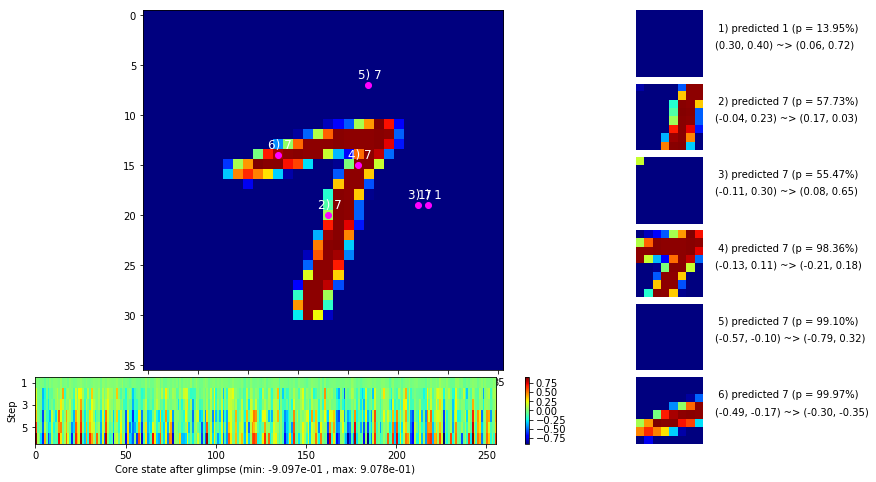

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


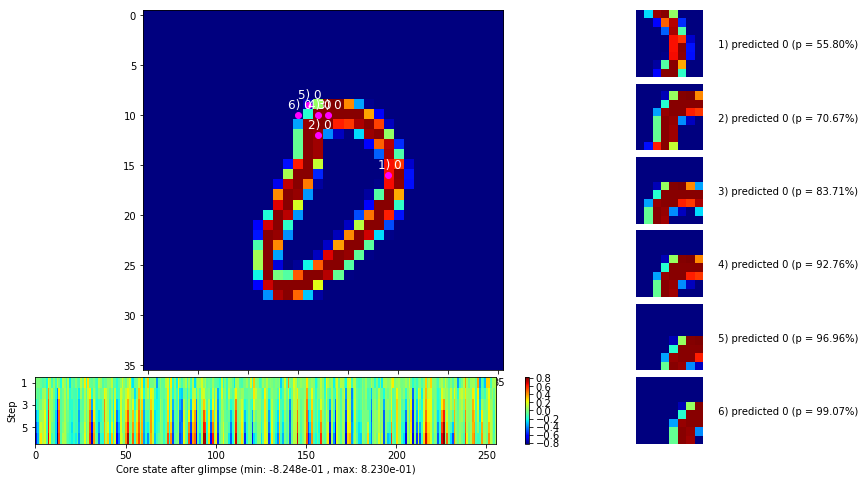


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


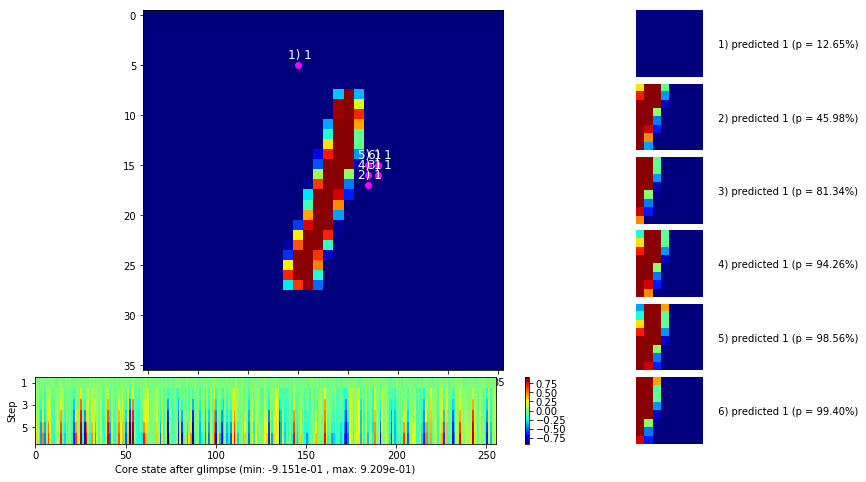

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


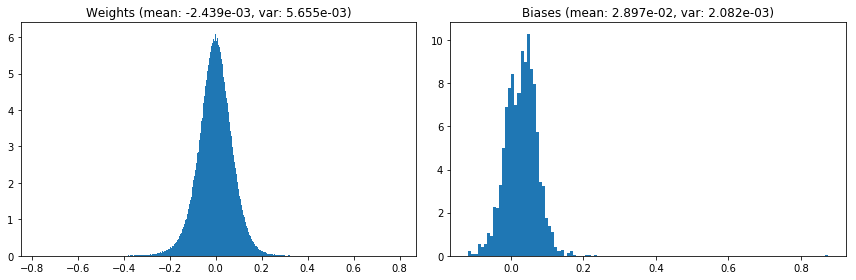

                                      Location network weights and biases


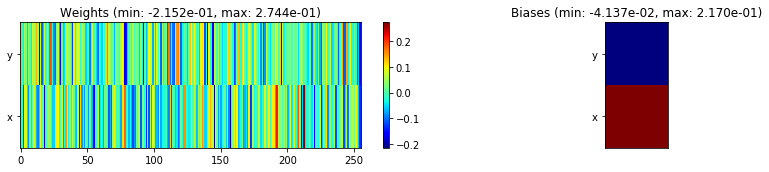

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.18 sec | TRAIN >> class loss: 0.3515 | steps:  2.544 :( | reward:  0.8837 :( | acc.: 88.365% :(
                          | VAL   >> class loss: 0.2825 | steps:  2.278 :( | reward:  0.9042 :( | acc.: 90.420% :(


Epoch  27/400) lr = 2.044e-05
 b    500/  3000 >> 131.7 ms/b | lr: 2.02e-05 | grad 2norm:  6.69 | grad inf norm:  1.586
       Weights || abs max:  0.80 (76795.37) | mean: -2.44e-03 ( 0.28) | var: 5.66e-03 (1101269.00)
        Biases || abs max:  0.87 ( 2479.36) | mean:  2.90e-02 ( 2.93) | var: 2.08e-03 (112114.16)
                  class loss: 0.355 | steps: 2.524 | reward:  0.883 | acc.: 88.34%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.7 ms/b | lr: 2.00e-05 | grad 2norm:  6.57 | grad inf norm:  1.567
       Weights || abs max:  0.80 (31594.43) | mean: -2.44e-03 ( 0.20

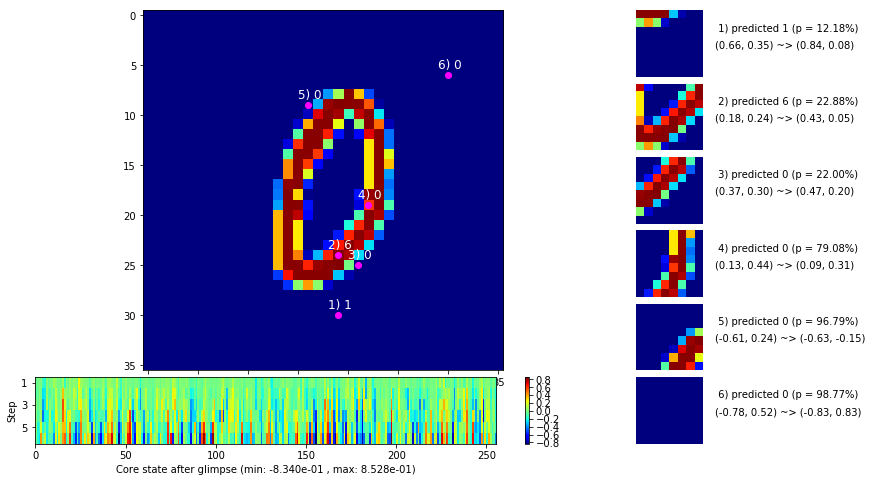

 b   1500/  3000 >> 133.5 ms/b | lr: 1.97e-05 | grad 2norm:  6.43 | grad inf norm:  1.533
       Weights || abs max:  0.80 (61611.66) | mean: -2.42e-03 ( 0.26) | var: 5.67e-03 (111168.84)
        Biases || abs max:  0.88 ( 5912.42) | mean:  2.91e-02 ( 4.86) | var: 2.09e-03 (553566.44)
                  class loss: 0.332 | steps: 2.520 | reward:  0.894 | acc.: 89.42%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.3 ms/b | lr: 1.95e-05 | grad 2norm:  6.62 | grad inf norm:  1.536
       Weights || abs max:  0.80 (86425.78) | mean: -2.43e-03 ( 0.30) | var: 5.67e-03 (1640523.62)
        Biases || abs max:  0.88 ( 9658.58) | mean:  2.91e-02 ( 5.68) | var: 2.10e-03 (1561993.00)
                  class loss: 0.339 | steps: 2.540 | reward:  0.891 | acc.: 89.10%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

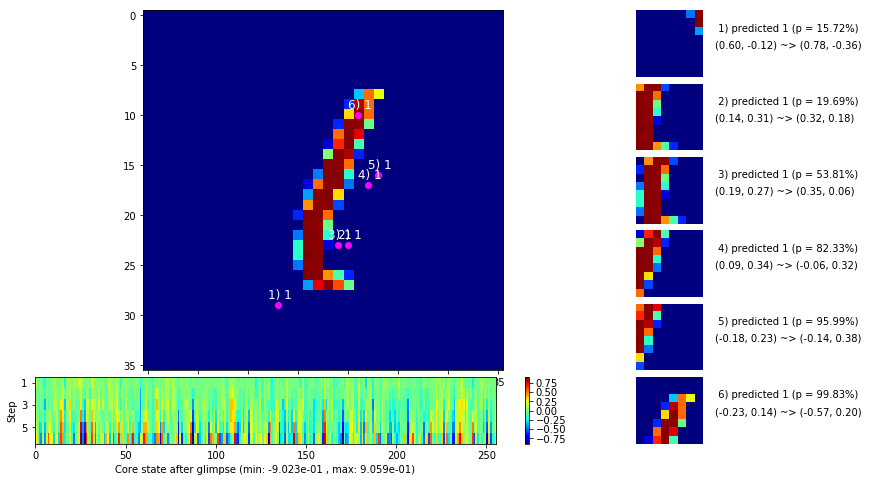

 b   2500/  3000 >> 132.4 ms/b | lr: 1.92e-05 | grad 2norm:  6.48 | grad inf norm:  1.512
       Weights || abs max:  0.80 (67701.66) | mean: -2.43e-03 ( 0.27) | var: 5.67e-03 (157026.86)
        Biases || abs max:  0.88 ( 4828.27) | mean:  2.91e-02 ( 3.67) | var: 2.10e-03 (817306.94)
                  class loss: 0.334 | steps: 2.508 | reward:  0.892 | acc.: 89.20%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.9 ms/b | lr: 1.91e-05 | grad 2norm:  6.72 | grad inf norm:  1.593
       Weights || abs max:  0.80 (80764.32) | mean: -2.43e-03 ( 0.29) | var: 5.68e-03 (259550.72)
        Biases || abs max:  0.88 ( 3542.95) | mean:  2.91e-02 ( 3.04) | var: 2.10e-03 (133520.91)
                  class loss: 0.352 | steps: 2.541 | reward:  0.883 | acc.: 88.34%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

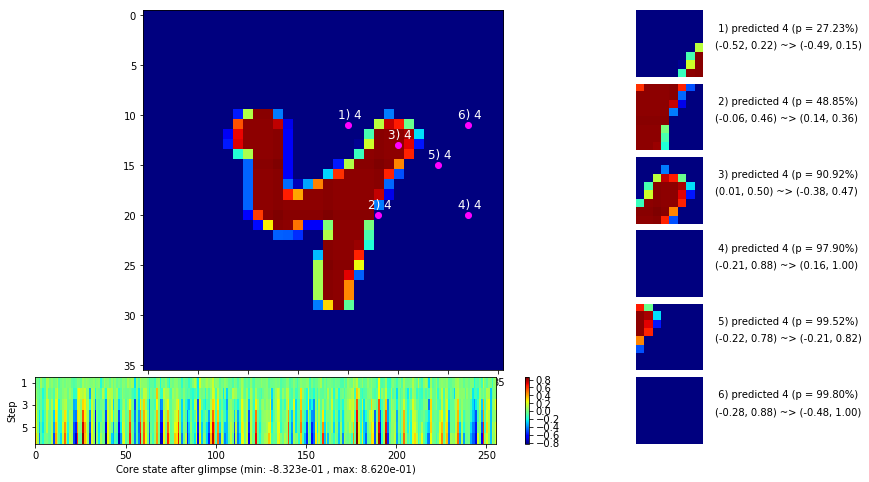

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


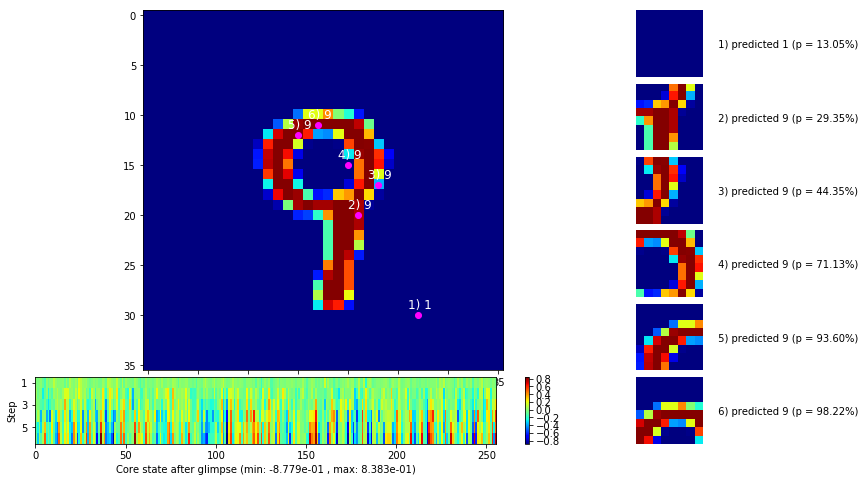


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


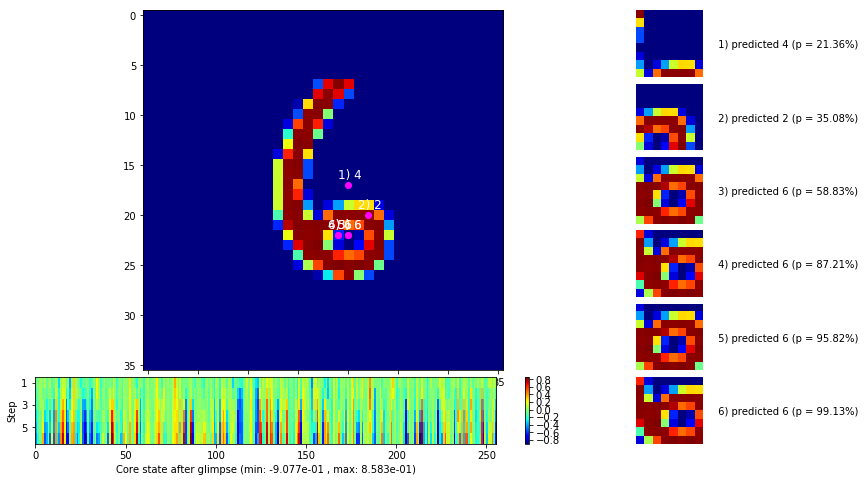

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


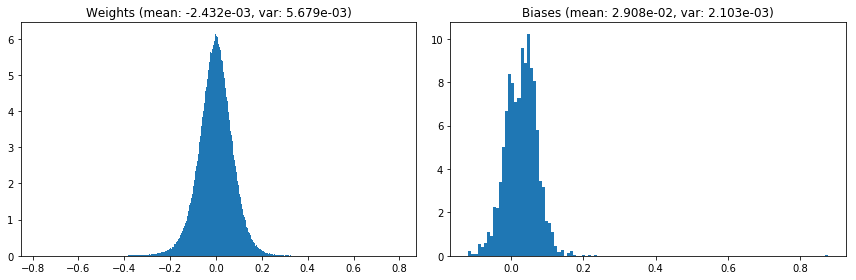

                                      Location network weights and biases


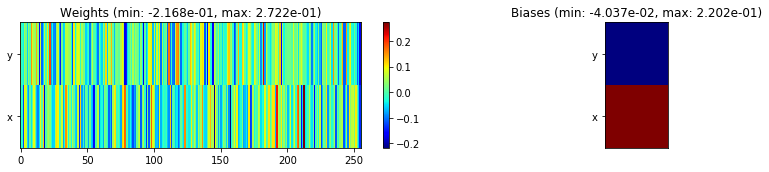

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.42 sec | TRAIN >> class loss: 0.3416 | steps:  2.528 :( | reward:  0.8885 :( | acc.: 88.852% :(
                          | VAL   >> class loss: 0.2922 | steps:  2.291 :( | reward:  0.9034 :( | acc.: 90.340% :(


Epoch  28/400) lr = 1.896e-05
 b    500/  3000 >> 130.9 ms/b | lr: 1.88e-05 | grad 2norm:  6.55 | grad inf norm:  1.547
       Weights || abs max:  0.80 (49093.96) | mean: -2.43e-03 ( 0.24) | var: 5.68e-03 (94656.78)
        Biases || abs max:  0.88 ( 6537.16) | mean:  2.91e-02 ( 4.48) | var: 2.10e-03 (786163.62)
                  class loss: 0.341 | steps: 2.514 | reward:  0.888 | acc.: 88.82%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.9 ms/b | lr: 1.86e-05 | grad 2norm:  6.54 | grad inf norm:  1.577
       Weights || abs max:  0.80 (41745.77) | mean: -2.42e-03 ( 0.21) 

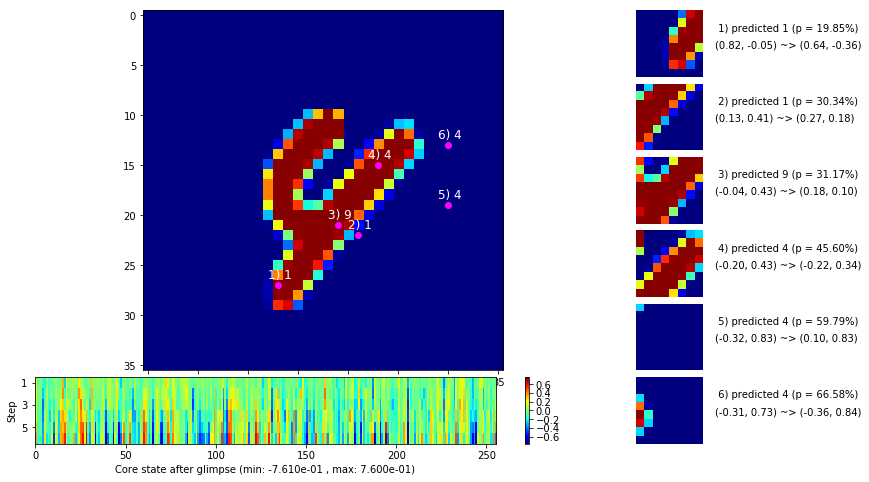

 b   1500/  3000 >> 134.3 ms/b | lr: 1.83e-05 | grad 2norm:  6.69 | grad inf norm:  1.573
       Weights || abs max:  0.80 (42418.49) | mean: -2.42e-03 ( 0.23) | var: 5.69e-03 (36898.95)
        Biases || abs max:  0.88 ( 2529.28) | mean:  2.92e-02 ( 2.59) | var: 2.11e-03 (18264.85)
                  class loss: 0.343 | steps: 2.528 | reward:  0.884 | acc.: 88.45%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.3 ms/b | lr: 1.81e-05 | grad 2norm:  6.59 | grad inf norm:  1.587
       Weights || abs max:  0.80 (60655.42) | mean: -2.43e-03 ( 0.26) | var: 5.69e-03 (138279.69)
        Biases || abs max:  0.88 ( 3166.96) | mean:  2.92e-02 ( 2.93) | var: 2.11e-03 (93709.74)
                  class loss: 0.340 | steps: 2.507 | reward:  0.889 | acc.: 88.93%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

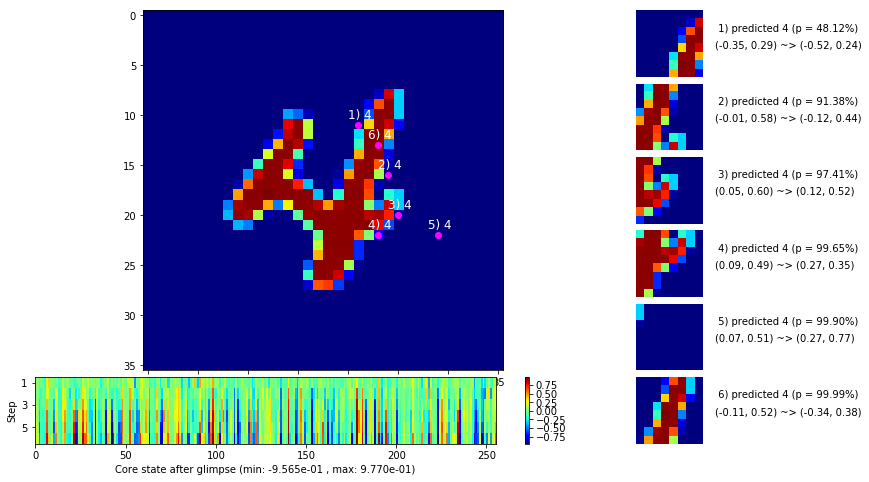

 b   2500/  3000 >> 134.2 ms/b | lr: 1.79e-05 | grad 2norm:  6.76 | grad inf norm:  1.639
       Weights || abs max:  0.80 (76191.86) | mean: -2.43e-03 ( 0.31) | var: 5.70e-03 (632736.31)
        Biases || abs max:  0.88 ( 6726.30) | mean:  2.92e-02 ( 4.78) | var: 2.11e-03 (215998.17)
                  class loss: 0.356 | steps: 2.532 | reward:  0.883 | acc.: 88.29%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.8 ms/b | lr: 1.77e-05 | grad 2norm:  6.73 | grad inf norm:  1.657
       Weights || abs max:  0.80 (51122.16) | mean: -2.43e-03 ( 0.24) | var: 5.70e-03 (82094.63)
        Biases || abs max:  0.88 ( 4982.81) | mean:  2.92e-02 ( 3.98) | var: 2.11e-03 (113602.27)
                  class loss: 0.356 | steps: 2.518 | reward:  0.883 | acc.: 88.32%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

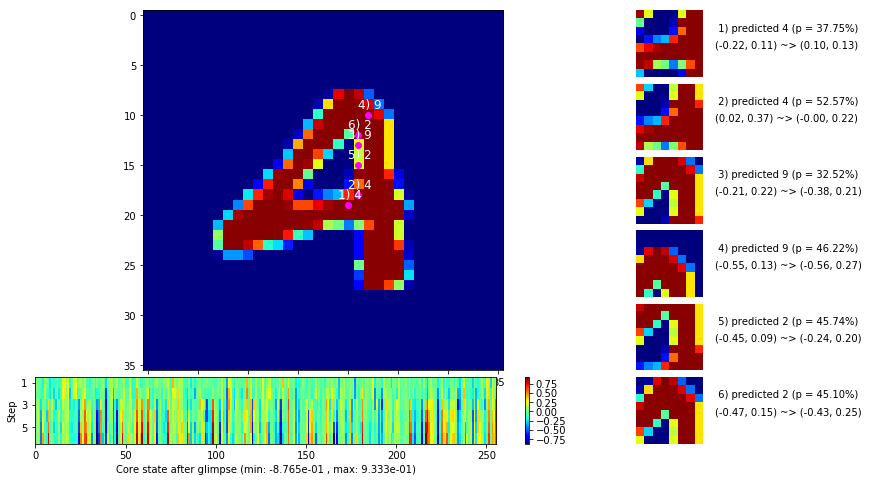

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


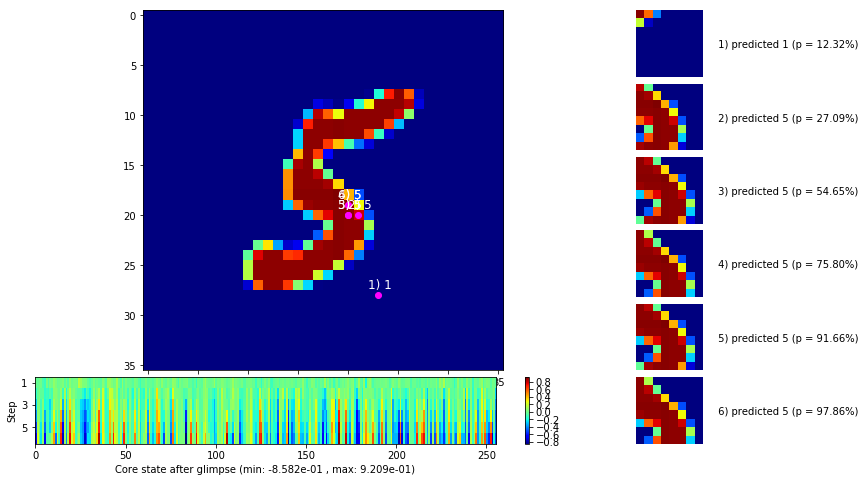


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


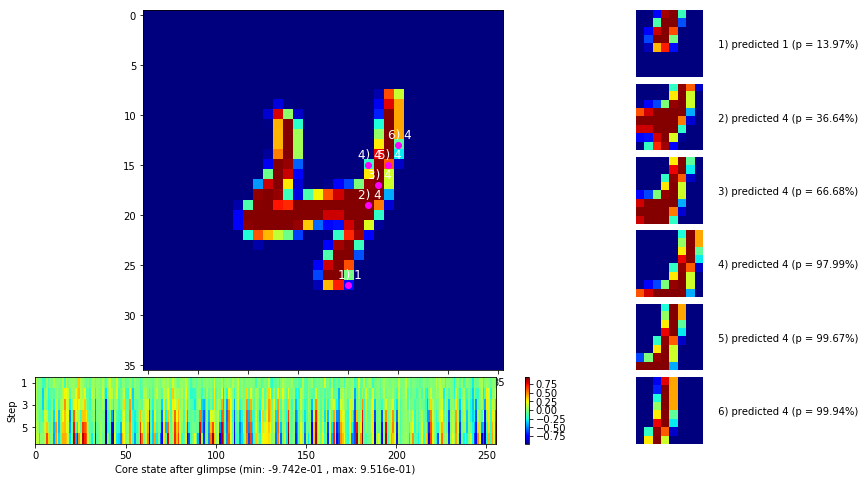

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


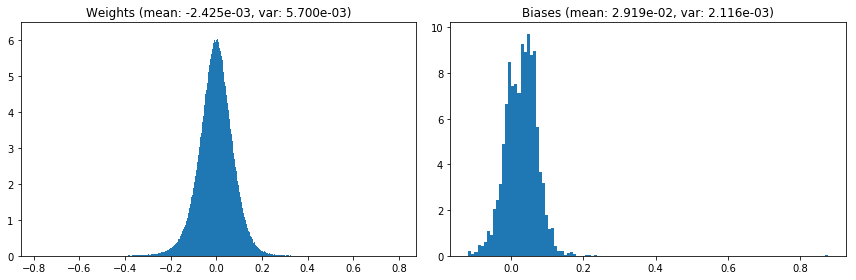

                                      Location network weights and biases


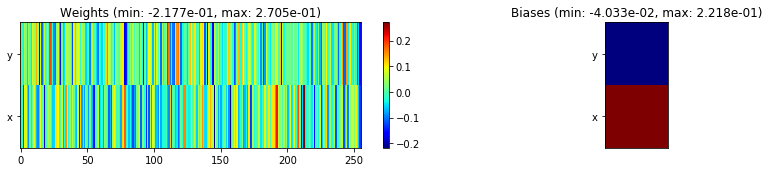

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.83 sec | TRAIN >> class loss: 0.3463 | steps:  2.519    | reward:  0.8856 :( | acc.: 88.560% :(
                          | VAL   >> class loss: 0.2945 | steps:  2.282 :( | reward:  0.9064 :( | acc.: 90.640% :(


Epoch  29/400) lr = 1.763e-05
 b    500/  3000 >> 136.6 ms/b | lr: 1.75e-05 | grad 2norm:  6.54 | grad inf norm:  1.545
       Weights || abs max:  0.80 (38363.10) | mean: -2.42e-03 ( 0.22) | var: 5.70e-03 (24296.92)
        Biases || abs max:  0.88 ( 3548.80) | mean:  2.92e-02 ( 3.01) | var: 2.12e-03 (227243.58)
                  class loss: 0.339 | steps: 2.523 | reward:  0.890 | acc.: 88.98%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.2 ms/b | lr: 1.73e-05 | grad 2norm:  6.72 | grad inf norm:  1.592
       Weights || abs max:  0.80 (29406.93) | mean: -2.43e-03 ( 0.20) 

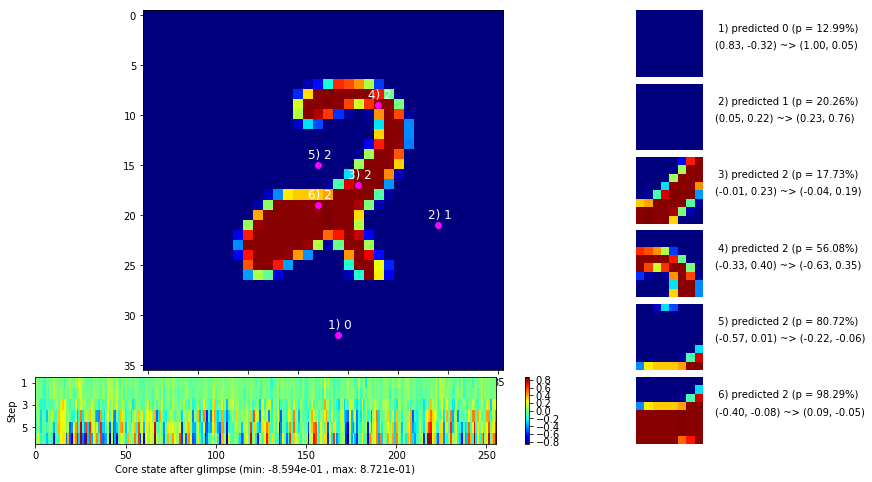

 b   1500/  3000 >> 134.7 ms/b | lr: 1.71e-05 | grad 2norm:  6.56 | grad inf norm:  1.625
       Weights || abs max:  0.80 (57402.10) | mean: -2.43e-03 ( 0.25) | var: 5.71e-03 (284339.53)
        Biases || abs max:  0.88 ( 2758.26) | mean:  2.92e-02 ( 2.94) | var: 2.12e-03 (21736.07)
                  class loss: 0.353 | steps: 2.515 | reward:  0.886 | acc.: 88.65%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.7 ms/b | lr: 1.69e-05 | grad 2norm:  6.56 | grad inf norm:  1.544
       Weights || abs max:  0.80 (42964.11) | mean: -2.44e-03 ( 0.22) | var: 5.71e-03 (44940.52)
        Biases || abs max:  0.88 ( 3228.59) | mean:  2.92e-02 ( 2.89) | var: 2.12e-03 (39512.66)
                  class loss: 0.343 | steps: 2.530 | reward:  0.887 | acc.: 88.75%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

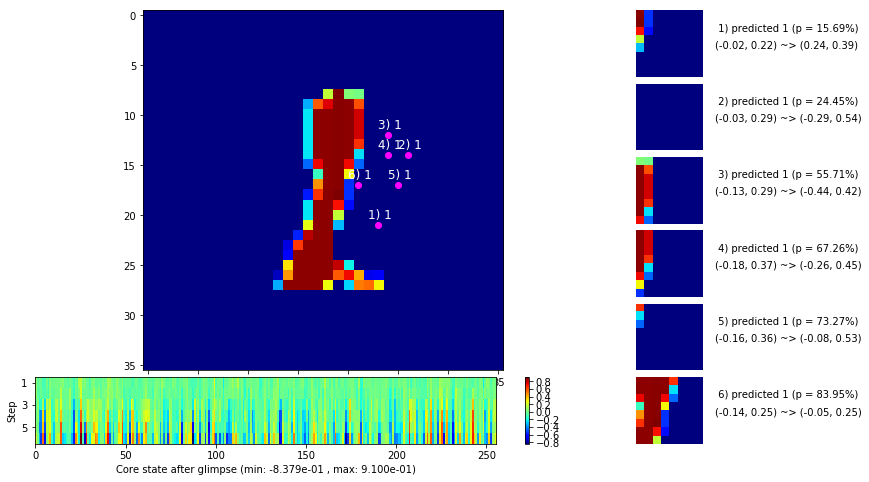

 b   2500/  3000 >> 134.5 ms/b | lr: 1.67e-05 | grad 2norm:  6.61 | grad inf norm:  1.635
       Weights || abs max:  0.80 (94692.65) | mean: -2.43e-03 ( 0.31) | var: 5.71e-03 (742580.31)
        Biases || abs max:  0.88 ( 3119.52) | mean:  2.92e-02 ( 2.89) | var: 2.12e-03 (37559.34)
                  class loss: 0.341 | steps: 2.518 | reward:  0.889 | acc.: 88.90%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.9 ms/b | lr: 1.65e-05 | grad 2norm:  6.70 | grad inf norm:  1.678
       Weights || abs max:  0.80 (65454.78) | mean: -2.43e-03 ( 0.27) | var: 5.72e-03 (127837.38)
        Biases || abs max:  0.88 ( 7846.68) | mean:  2.92e-02 ( 4.81) | var: 2.13e-03 (1943629.62)
                  class loss: 0.350 | steps: 2.540 | reward:  0.885 | acc.: 88.47%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

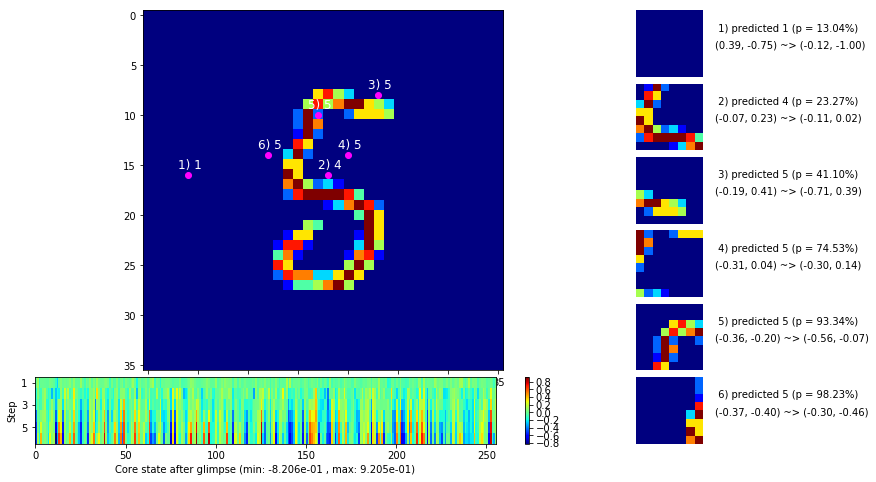

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


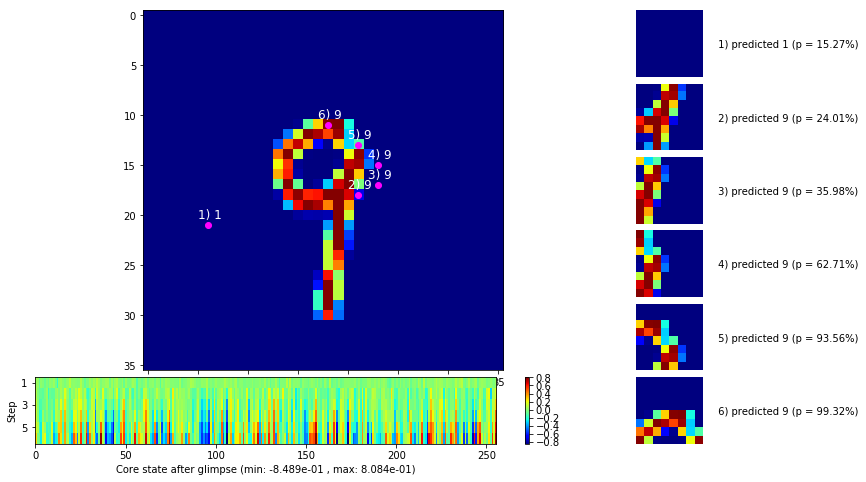


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


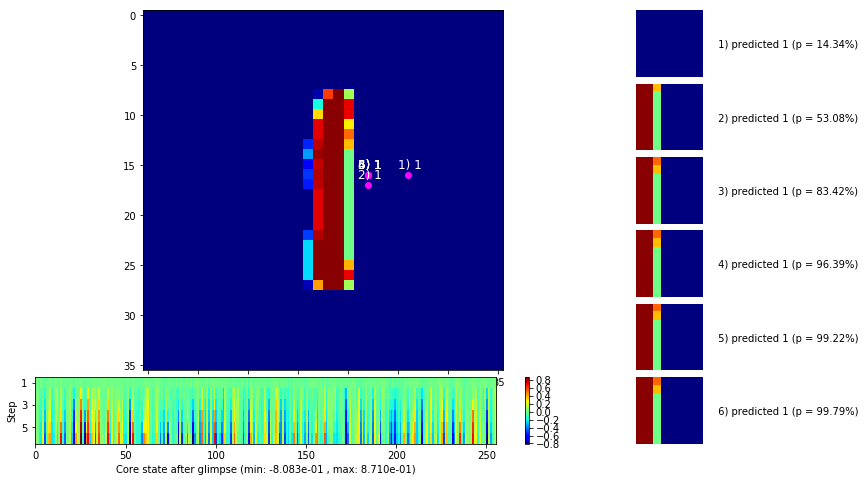

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


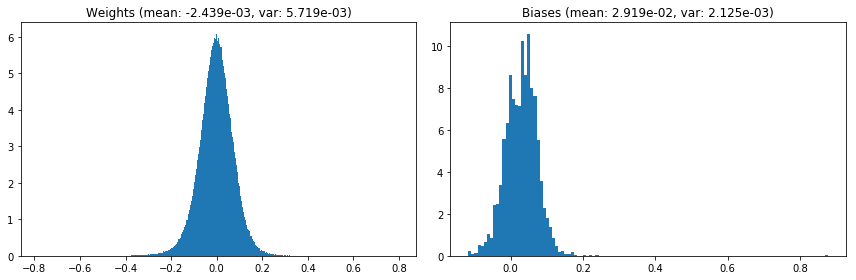

                                      Location network weights and biases


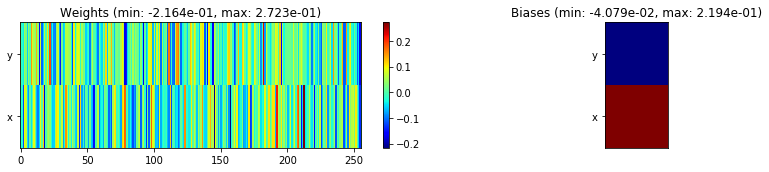

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.37 sec | TRAIN >> class loss: 0.3460 | steps:  2.528 :( | reward:  0.8869 :( | acc.: 88.688% :(
                          | VAL   >> class loss: 0.2912 | steps:  2.275 :( | reward:  0.9064 :( | acc.: 90.640% :(


Epoch  30/400) lr = 1.644e-05
 b    500/  3000 >> 131.4 ms/b | lr: 1.63e-05 | grad 2norm:  6.55 | grad inf norm:  1.585
       Weights || abs max:  0.80 (69367.87) | mean: -2.43e-03 ( 0.26) | var: 5.72e-03 (244736.39)
        Biases || abs max:  0.88 ( 7560.01) | mean:  2.92e-02 ( 4.72) | var: 2.13e-03 (421470.53)
                  class loss: 0.335 | steps: 2.525 | reward:  0.888 | acc.: 88.82%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.6 ms/b | lr: 1.61e-05 | grad 2norm:  6.73 | grad inf norm:  1.601
       Weights || abs max:  0.80 (443515.44) | mean: -2.43e-03 ( 0.88

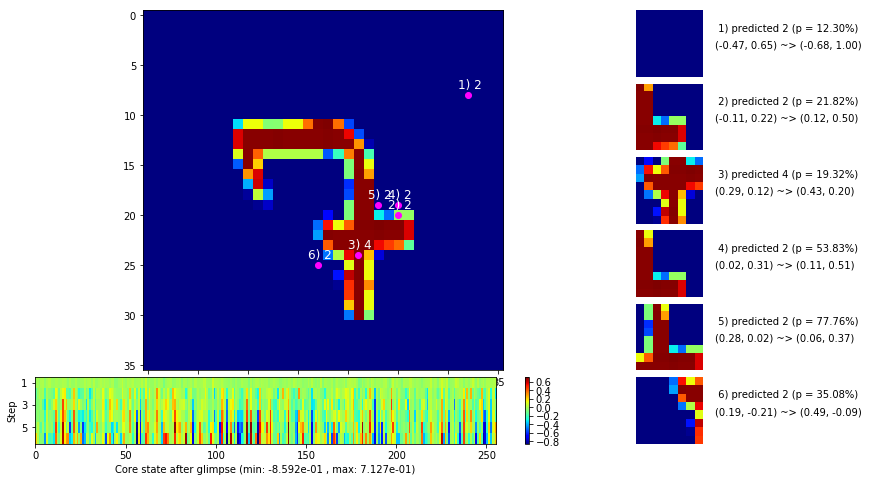

 b   1500/  3000 >> 139.9 ms/b | lr: 1.59e-05 | grad 2norm:  6.62 | grad inf norm:  1.551
       Weights || abs max:  0.80 (80041.96) | mean: -2.43e-03 ( 0.28) | var: 5.73e-03 (1469015.75)
        Biases || abs max:  0.88 ( 5457.01) | mean:  2.93e-02 ( 4.35) | var: 2.13e-03 (152484.42)
                  class loss: 0.341 | steps: 2.545 | reward:  0.888 | acc.: 88.83%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.5 ms/b | lr: 1.58e-05 | grad 2norm:  6.64 | grad inf norm:  1.607
       Weights || abs max:  0.80 (37737.70) | mean: -2.42e-03 ( 0.20) | var: 5.73e-03 (35341.45)
        Biases || abs max:  0.88 (15371.23) | mean:  2.93e-02 ( 8.44) | var: 2.14e-03 (15320891.00)
                  class loss: 0.339 | steps: 2.515 | reward:  0.889 | acc.: 88.93%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

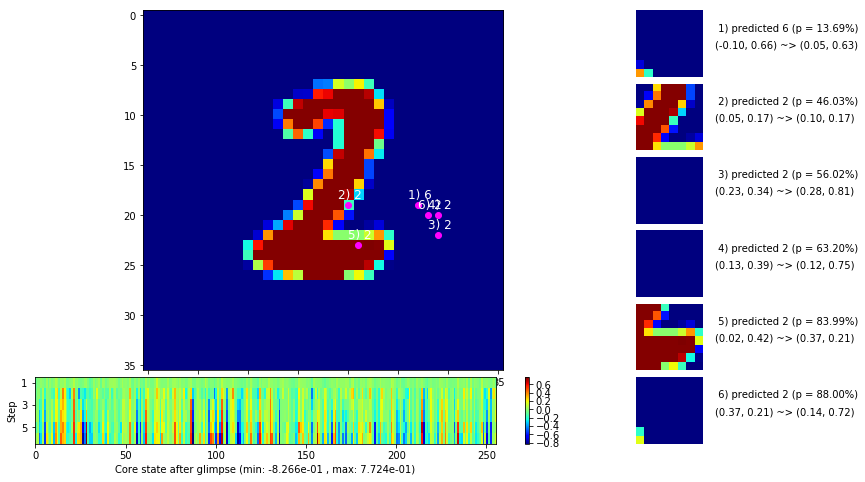

 b   2500/  3000 >> 134.4 ms/b | lr: 1.56e-05 | grad 2norm:  6.85 | grad inf norm:  1.633
       Weights || abs max:  0.80 (76740.27) | mean: -2.42e-03 ( 0.27) | var: 5.73e-03 (1725558.50)
        Biases || abs max:  0.88 (12146.49) | mean:  2.93e-02 ( 7.13) | var: 2.14e-03 (3829868.25)
                  class loss: 0.354 | steps: 2.543 | reward:  0.879 | acc.: 87.89%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.7 ms/b | lr: 1.54e-05 | grad 2norm:  6.82 | grad inf norm:  1.593
       Weights || abs max:  0.80 (47413.81) | mean: -2.42e-03 ( 0.23) | var: 5.74e-03 (51559.89)
        Biases || abs max:  0.88 (13675.10) | mean:  2.93e-02 ( 7.49) | var: 2.14e-03 (4177909.75)
                  class loss: 0.344 | steps: 2.540 | reward:  0.883 | acc.: 88.32%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

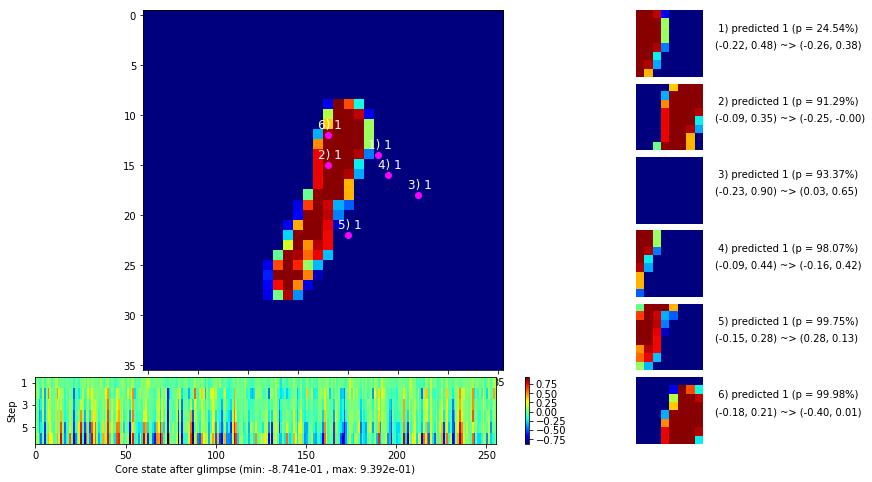

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


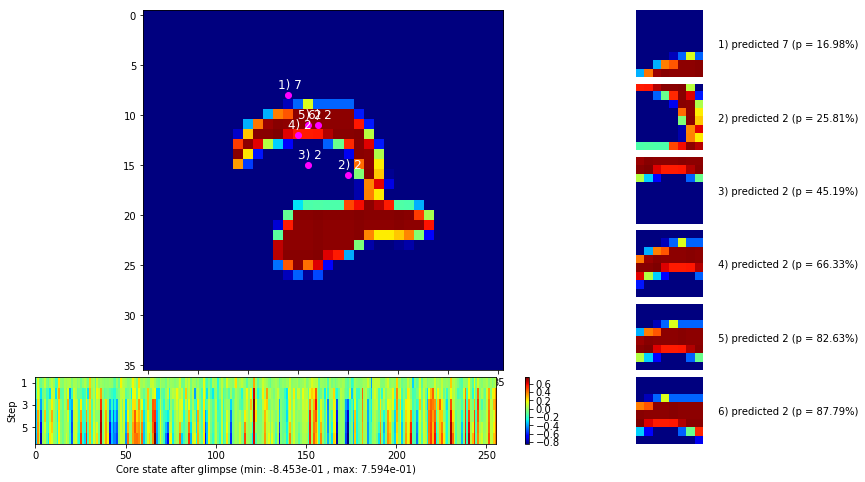


	Target class: 8  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


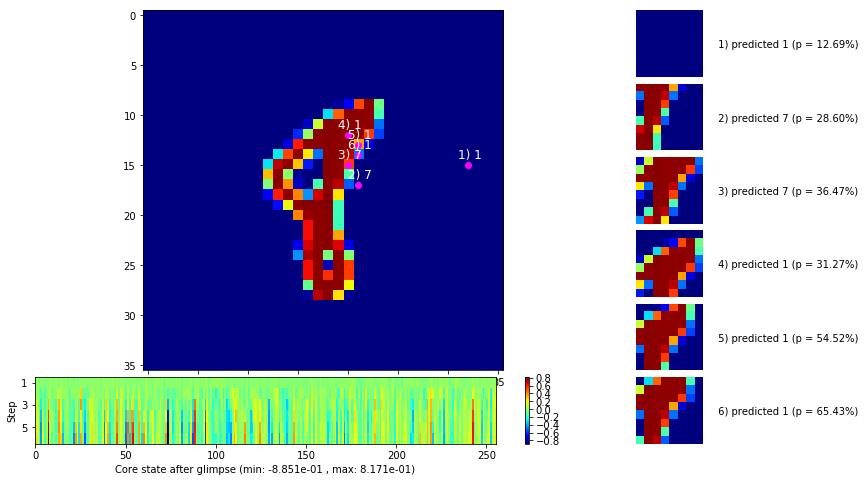

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


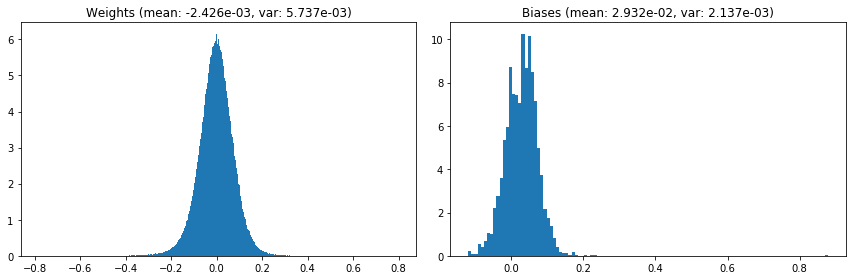

                                      Location network weights and biases


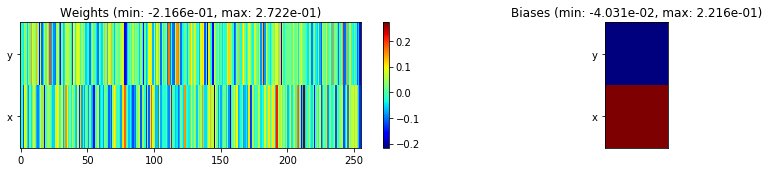

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.37 sec | TRAIN >> class loss: 0.3442 | steps:  2.534 :( | reward:  0.8853 :( | acc.: 88.533% :(
                          | VAL   >> class loss: 0.2879 | steps:  2.265 :( | reward:  0.9078 :( | acc.: 90.780% :(


Epoch  31/400) lr = 1.536e-05
 b    500/  3000 >> 132.7 ms/b | lr: 1.52e-05 | grad 2norm:  6.63 | grad inf norm:  1.540
       Weights || abs max:  0.80 (92305.88) | mean: -2.42e-03 ( 0.31) | var: 5.74e-03 (727961.06)
        Biases || abs max:  0.88 ( 4994.43) | mean:  2.93e-02 ( 3.70) | var: 2.14e-03 (245605.05)
                  class loss: 0.340 | steps: 2.513 | reward:  0.886 | acc.: 88.64%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.51e-05 | grad 2norm:  6.59 | grad inf norm:  1.590
       Weights || abs max:  0.80 (35237.33) | mean: -2.42e-03 ( 0.20)

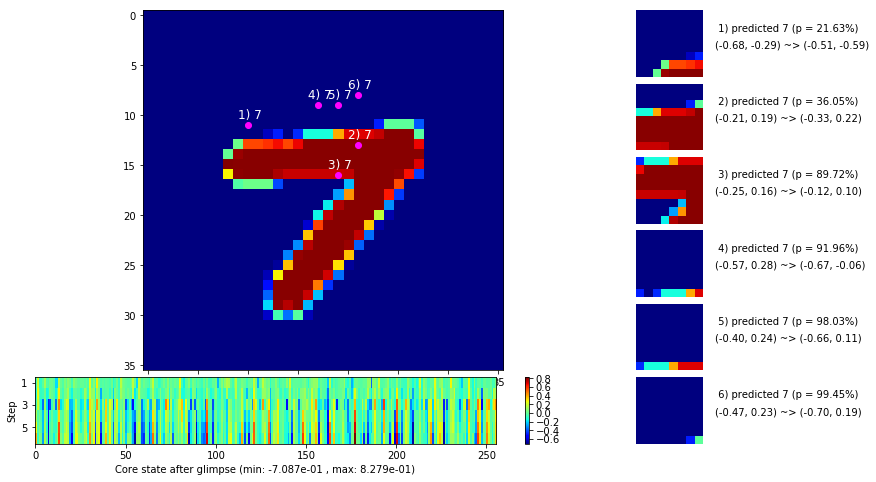

 b   1500/  3000 >> 134.4 ms/b | lr: 1.49e-05 | grad 2norm:  6.79 | grad inf norm:  1.655
       Weights || abs max:  0.80 (63432.04) | mean: -2.42e-03 ( 0.25) | var: 5.74e-03 (374628.78)
        Biases || abs max:  0.88 ( 4140.31) | mean:  2.94e-02 ( 3.29) | var: 2.14e-03 (266942.22)
                  class loss: 0.353 | steps: 2.546 | reward:  0.883 | acc.: 88.31%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.5 ms/b | lr: 1.48e-05 | grad 2norm:  6.82 | grad inf norm:  1.554
       Weights || abs max:  0.80 (82014.67) | mean: -2.42e-03 ( 0.28) | var: 5.75e-03 (1431593.12)
        Biases || abs max:  0.88 ( 5050.73) | mean:  2.94e-02 ( 4.07) | var: 2.14e-03 (627092.12)
                  class loss: 0.350 | steps: 2.543 | reward:  0.883 | acc.: 88.30%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

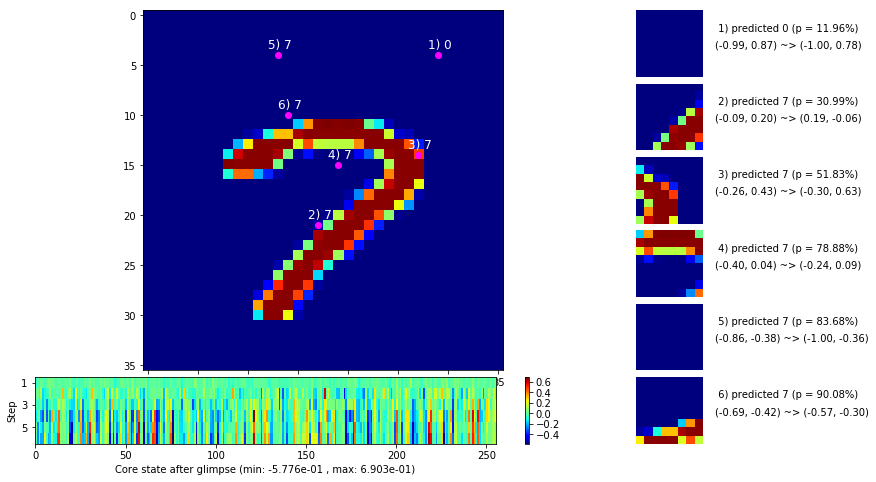

 b   2500/  3000 >> 134.0 ms/b | lr: 1.46e-05 | grad 2norm:  6.76 | grad inf norm:  1.614
       Weights || abs max:  0.80 (92135.01) | mean: -2.43e-03 ( 0.30) | var: 5.75e-03 (2235299.00)
        Biases || abs max:  0.88 ( 2587.95) | mean:  2.93e-02 ( 3.15) | var: 2.15e-03 (22338.52)
                  class loss: 0.363 | steps: 2.527 | reward:  0.880 | acc.: 87.96%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.1 ms/b | lr: 1.45e-05 | grad 2norm:  6.67 | grad inf norm:  1.541
       Weights || abs max:  0.80 (52684.14) | mean: -2.44e-03 ( 0.24) | var: 5.75e-03 (98600.08)
        Biases || abs max:  0.88 ( 5729.80) | mean:  2.93e-02 ( 4.63) | var: 2.14e-03 (386611.88)
                  class loss: 0.350 | steps: 2.544 | reward:  0.884 | acc.: 88.45%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

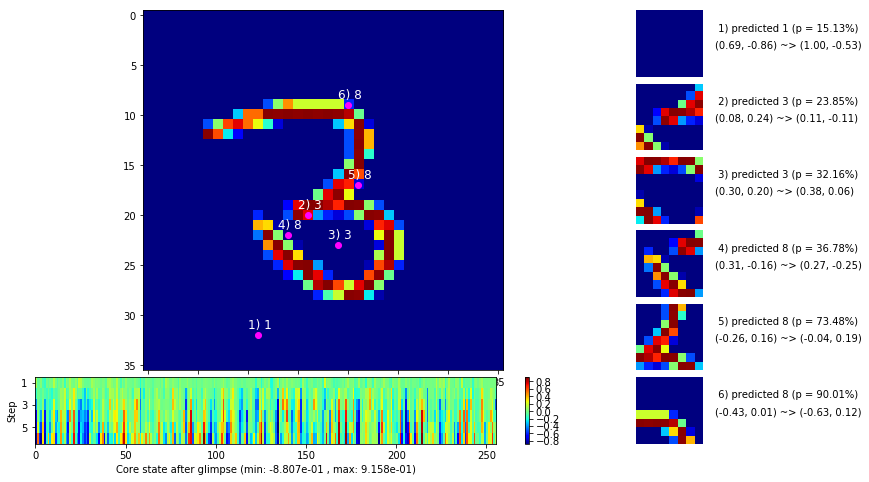

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


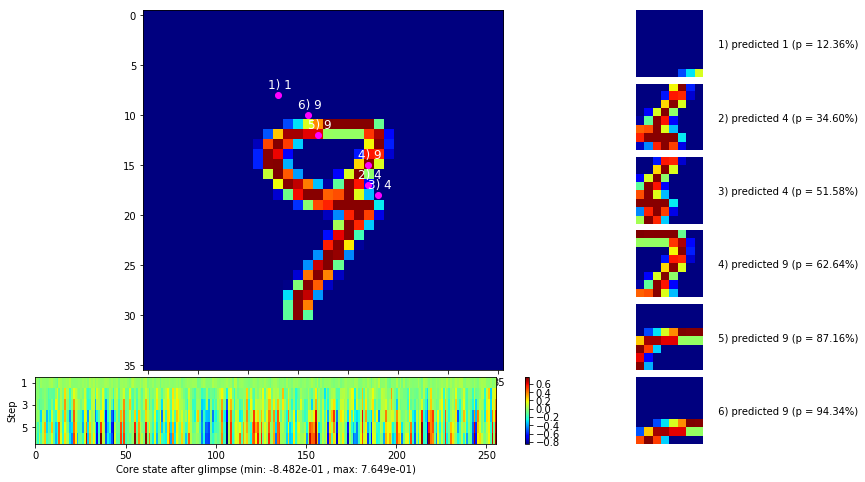


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


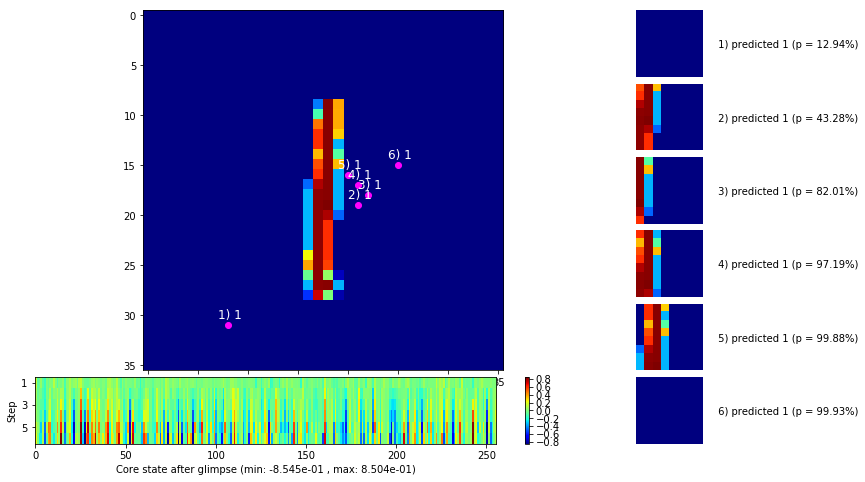

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


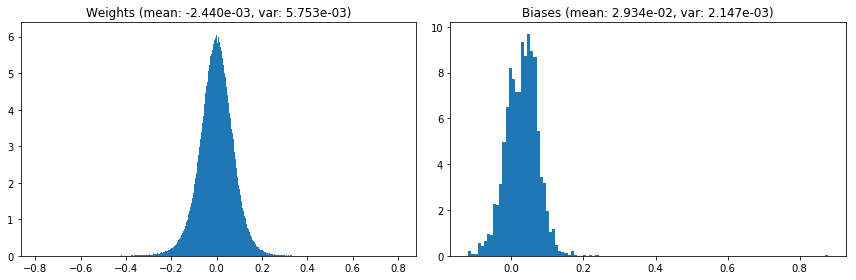

                                      Location network weights and biases


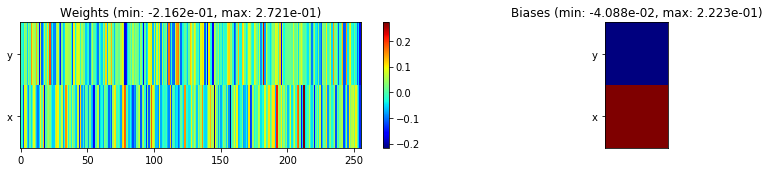

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.35 sec | TRAIN >> class loss: 0.3492 | steps:  2.532 :( | reward:  0.8845 :( | acc.: 88.448% :(
                          | VAL   >> class loss: 0.2731 | steps:  2.262 :( | reward:  0.9116 :( | acc.: 91.160% :(


Epoch  32/400) lr = 1.439e-05
 b    500/  3000 >> 133.5 ms/b | lr: 1.43e-05 | grad 2norm:  6.56 | grad inf norm:  1.577
       Weights || abs max:  0.80 (36606.66) | mean: -2.44e-03 ( 0.21) | var: 5.75e-03 (20320.68)
        Biases || abs max:  0.88 ( 6111.08) | mean:  2.93e-02 ( 4.90) | var: 2.15e-03 (509954.19)
                  class loss: 0.340 | steps: 2.533 | reward:  0.889 | acc.: 88.91%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.6 ms/b | lr: 1.41e-05 | grad 2norm:  6.52 | grad inf norm:  1.529
       Weights || abs max:  0.80 (41120.96) | mean: -2.43e-03 ( 0.22) 

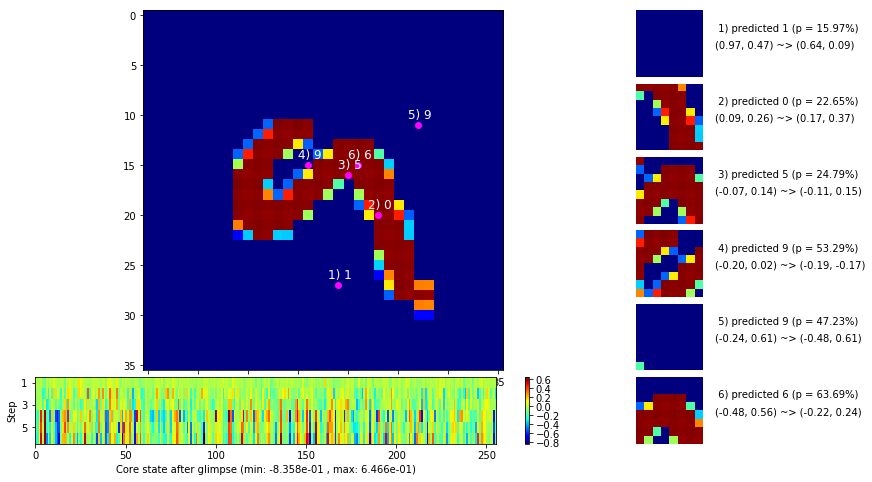

 b   1500/  3000 >> 131.9 ms/b | lr: 1.40e-05 | grad 2norm:  6.79 | grad inf norm:  1.588
       Weights || abs max:  0.80 (44561.58) | mean: -2.42e-03 ( 0.22) | var: 5.76e-03 (53181.55)
        Biases || abs max:  0.88 ( 3297.94) | mean:  2.94e-02 ( 3.17) | var: 2.15e-03 (85129.31)
                  class loss: 0.354 | steps: 2.536 | reward:  0.881 | acc.: 88.14%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.8 ms/b | lr: 1.39e-05 | grad 2norm:  6.57 | grad inf norm:  1.538
       Weights || abs max:  0.80 (60468.65) | mean: -2.42e-03 ( 0.26) | var: 5.76e-03 (98020.21)
        Biases || abs max:  0.88 (11102.20) | mean:  2.94e-02 ( 6.16) | var: 2.15e-03 (10692222.00)
                  class loss: 0.341 | steps: 2.513 | reward:  0.887 | acc.: 88.68%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

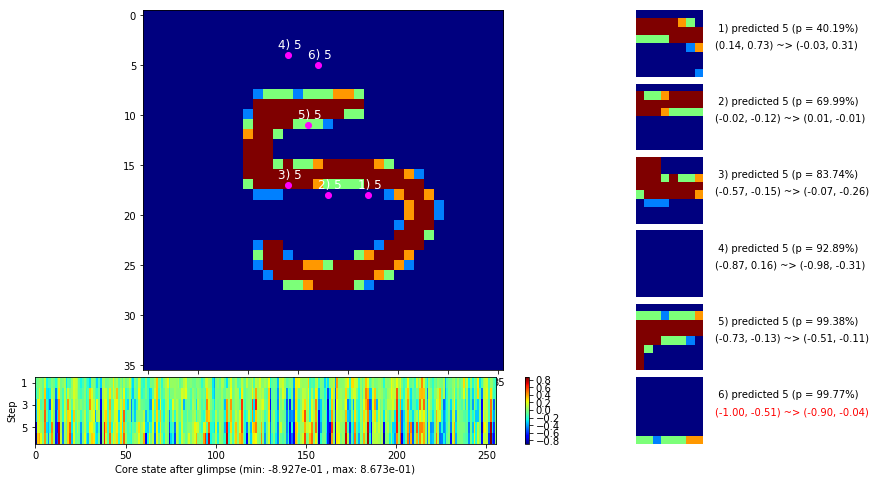

 b   2500/  3000 >> 133.2 ms/b | lr: 1.37e-05 | grad 2norm:  6.71 | grad inf norm:  1.648
       Weights || abs max:  0.80 (151616.80) | mean: -2.42e-03 ( 0.40) | var: 5.77e-03 (6669919.00)
        Biases || abs max:  0.88 (15211.61) | mean:  2.94e-02 ( 7.59) | var: 2.16e-03 (19873238.00)
                  class loss: 0.345 | steps: 2.550 | reward:  0.886 | acc.: 88.61%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 1.36e-05 | grad 2norm:  6.70 | grad inf norm:  1.600
       Weights || abs max:  0.80 (59479.57) | mean: -2.41e-03 ( 0.24) | var: 5.77e-03 (433239.03)
        Biases || abs max:  0.88 ( 6302.94) | mean:  2.95e-02 ( 4.26) | var: 2.16e-03 (1251784.50)
                  class loss: 0.341 | steps: 2.560 | reward:  0.887 | acc.: 88.66%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

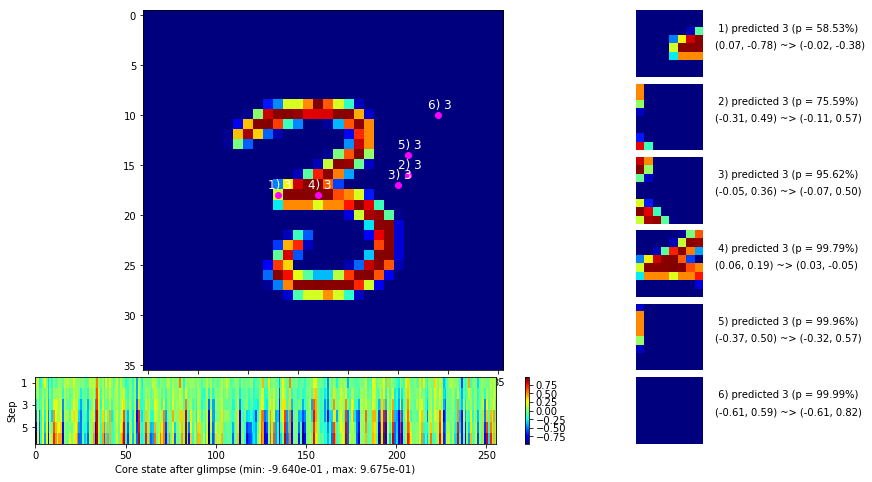

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


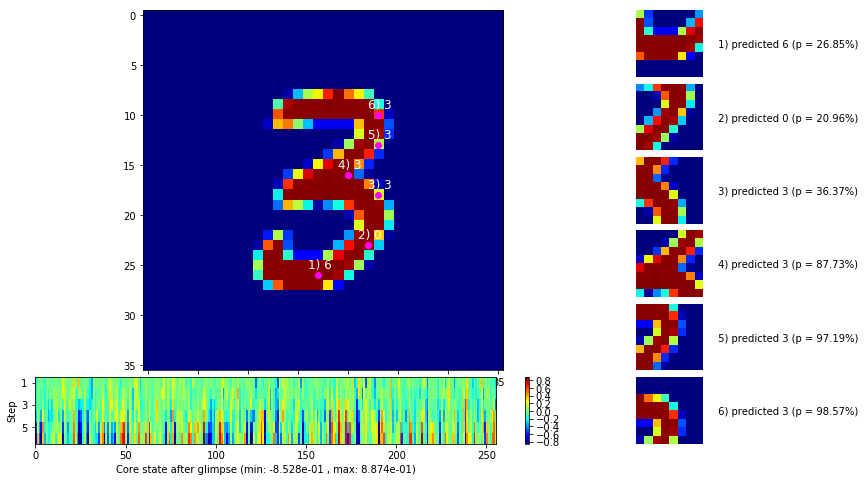


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


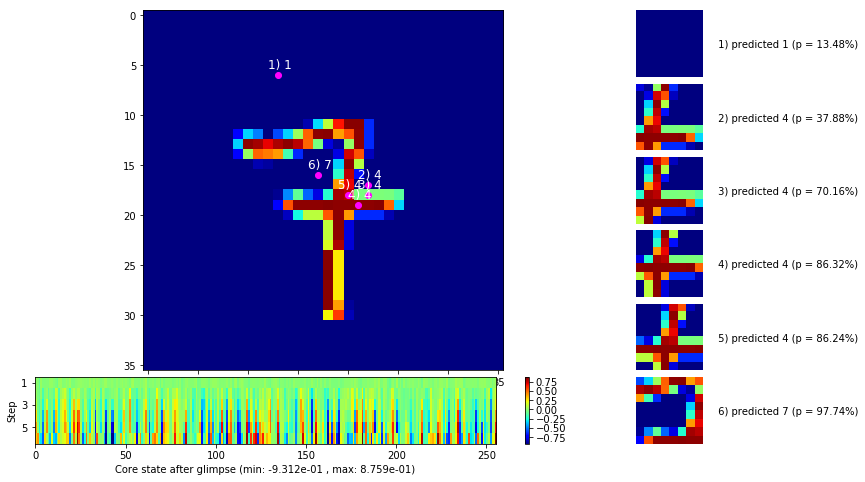

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


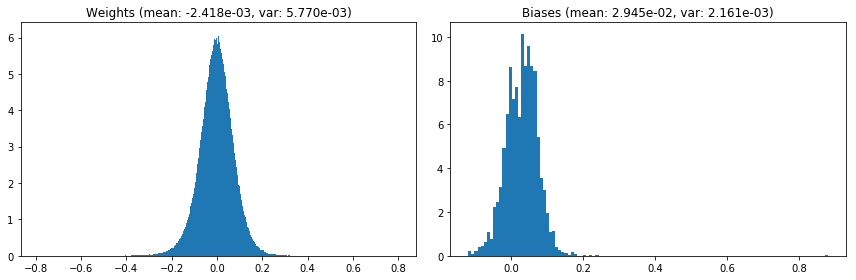

                                      Location network weights and biases


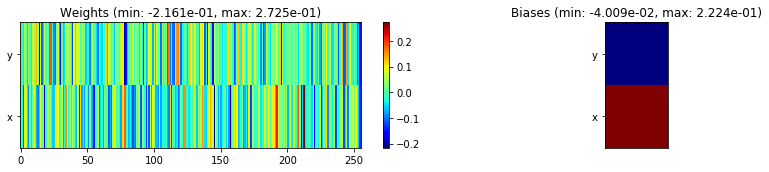

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.37 sec | TRAIN >> class loss: 0.3433 | steps:  2.534 :( | reward:  0.8868 :( | acc.: 88.680% :(
                          | VAL   >> class loss: 0.2916 | steps:  2.279 :( | reward:  0.9064 :( | acc.: 90.640% :(


Epoch  33/400) lr = 1.351e-05
 b    500/  3000 >> 131.9 ms/b | lr: 1.34e-05 | grad 2norm:  6.53 | grad inf norm:  1.598
       Weights || abs max:  0.80 (45446.40) | mean: -2.42e-03 ( 0.23) | var: 5.77e-03 (27925.54)
        Biases || abs max:  0.88 ( 5527.61) | mean:  2.95e-02 ( 4.12) | var: 2.16e-03 (130078.38)
                  class loss: 0.338 | steps: 2.535 | reward:  0.887 | acc.: 88.73%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.0 ms/b | lr: 1.33e-05 | grad 2norm:  6.66 | grad inf norm:  1.601
       Weights || abs max:  0.80 (59402.54) | mean: -2.41e-03 ( 0.26) 

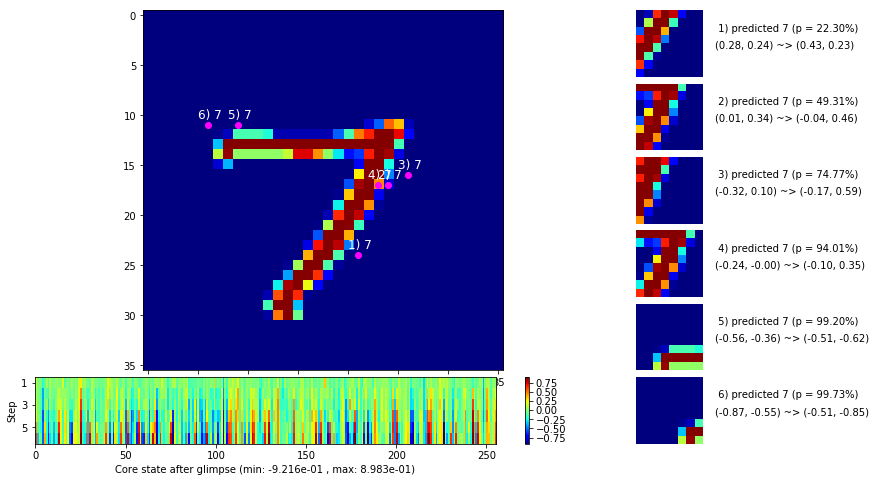

 b   1500/  3000 >> 143.7 ms/b | lr: 1.31e-05 | grad 2norm:  6.77 | grad inf norm:  1.610
       Weights || abs max:  0.80 (71931.09) | mean: -2.41e-03 ( 0.27) | var: 5.78e-03 (402314.56)
        Biases || abs max:  0.88 ( 3871.76) | mean:  2.95e-02 ( 3.27) | var: 2.16e-03 (67485.56)
                  class loss: 0.346 | steps: 2.530 | reward:  0.886 | acc.: 88.57%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.9 ms/b | lr: 1.30e-05 | grad 2norm:  6.73 | grad inf norm:  1.578
       Weights || abs max:  0.80 (149715.62) | mean: -2.41e-03 ( 0.40) | var: 5.78e-03 (2631755.00)
        Biases || abs max:  0.88 (18728.64) | mean:  2.95e-02 ( 8.98) | var: 2.16e-03 (33303016.00)
                  class loss: 0.347 | steps: 2.510 | reward:  0.885 | acc.: 88.48%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

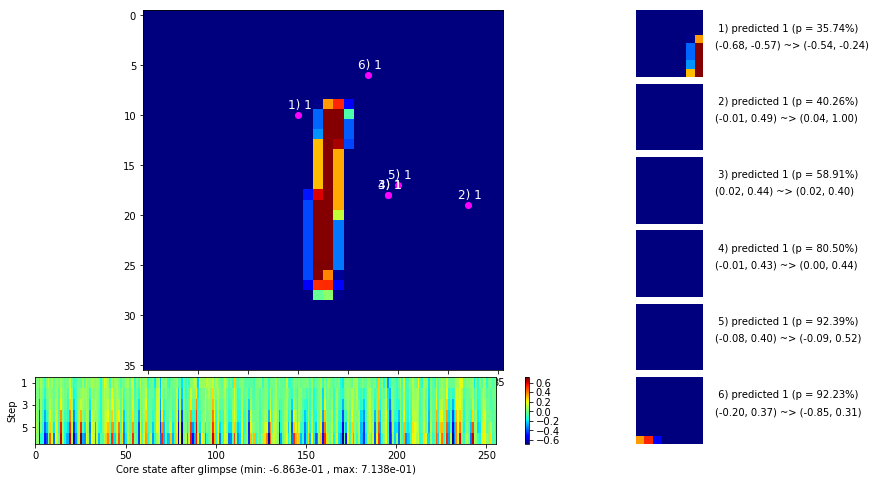

 b   2500/  3000 >> 133.8 ms/b | lr: 1.29e-05 | grad 2norm:  6.56 | grad inf norm:  1.596
       Weights || abs max:  0.80 (106436.10) | mean: -2.41e-03 ( 0.32) | var: 5.78e-03 (2356257.75)
        Biases || abs max:  0.88 ( 4439.91) | mean:  2.95e-02 ( 3.55) | var: 2.16e-03 (281215.56)
                  class loss: 0.336 | steps: 2.517 | reward:  0.889 | acc.: 88.91%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.2 ms/b | lr: 1.28e-05 | grad 2norm:  6.71 | grad inf norm:  1.523
       Weights || abs max:  0.80 (52889.08) | mean: -2.41e-03 ( 0.24) | var: 5.78e-03 (190568.12)
        Biases || abs max:  0.88 ( 1743.99) | mean:  2.95e-02 ( 2.25) | var: 2.17e-03 (22523.25)
                  class loss: 0.353 | steps: 2.546 | reward:  0.886 | acc.: 88.59%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

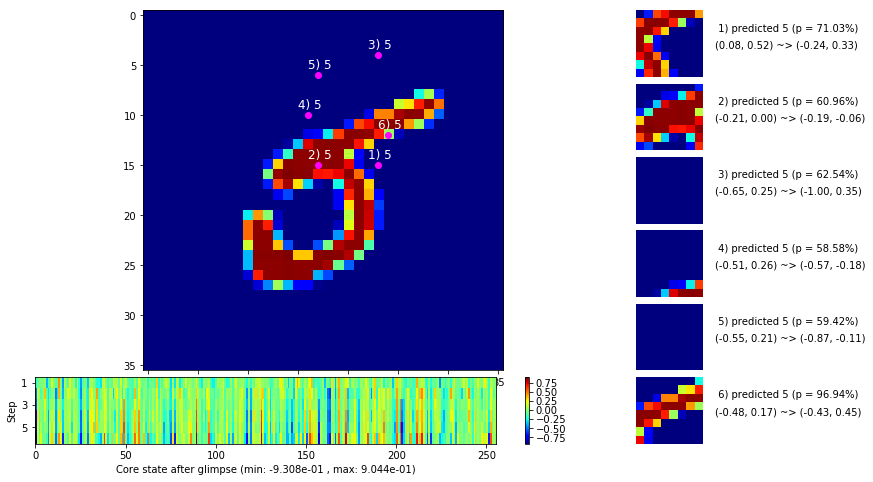

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


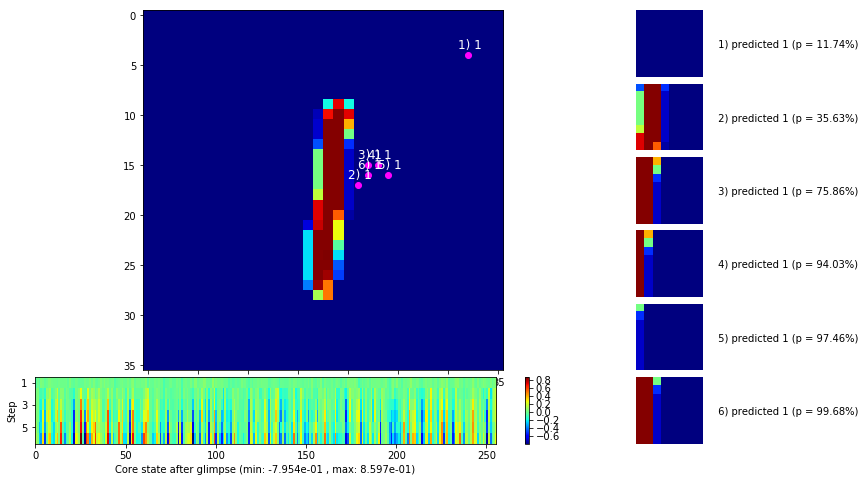


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


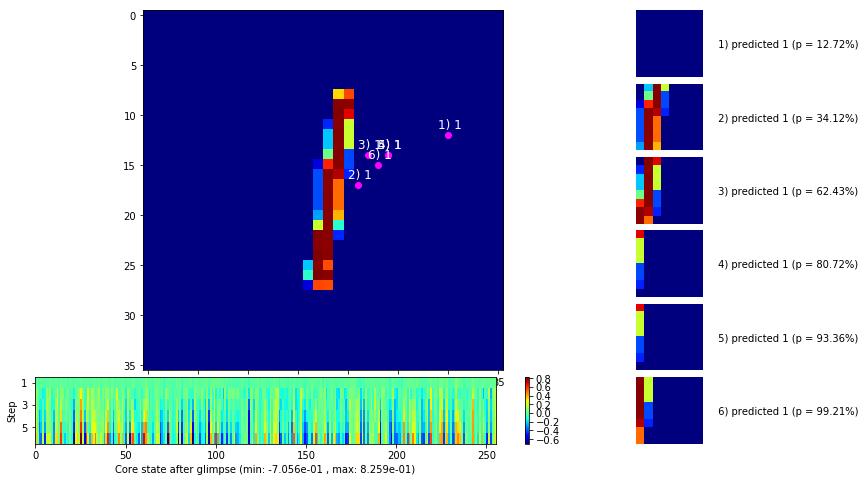

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


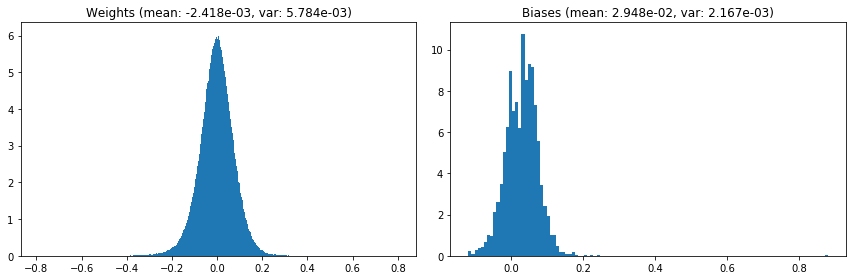

                                      Location network weights and biases


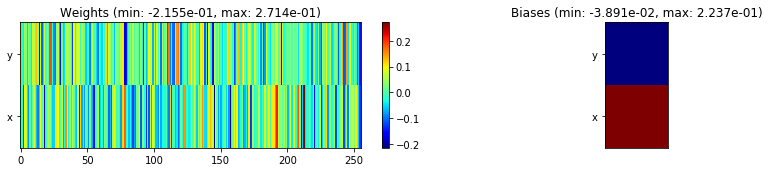

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.38 sec | TRAIN >> class loss: 0.3449 | steps:  2.526 :( | reward:  0.8867 :( | acc.: 88.672% :(
                          | VAL   >> class loss: 0.2945 | steps:  2.280 :( | reward:  0.9040 :( | acc.: 90.400% :(


Epoch  34/400) lr = 1.27e-05
 b    500/  3000 >> 134.0 ms/b | lr: 1.26e-05 | grad 2norm:  6.69 | grad inf norm:  1.596
       Weights || abs max:  0.80 (44910.72) | mean: -2.42e-03 ( 0.23) | var: 5.79e-03 (33254.62)
        Biases || abs max:  0.88 ( 1327.36) | mean:  2.95e-02 ( 1.97) | var: 2.17e-03 ( 8322.94)
                  class loss: 0.347 | steps: 2.522 | reward:  0.889 | acc.: 88.87%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.2 ms/b | lr: 1.25e-05 | grad 2norm:  6.67 | grad inf norm:  1.571
       Weights || abs max:  0.80 (42429.04) | mean: -2.42e-03 ( 0.22) | 

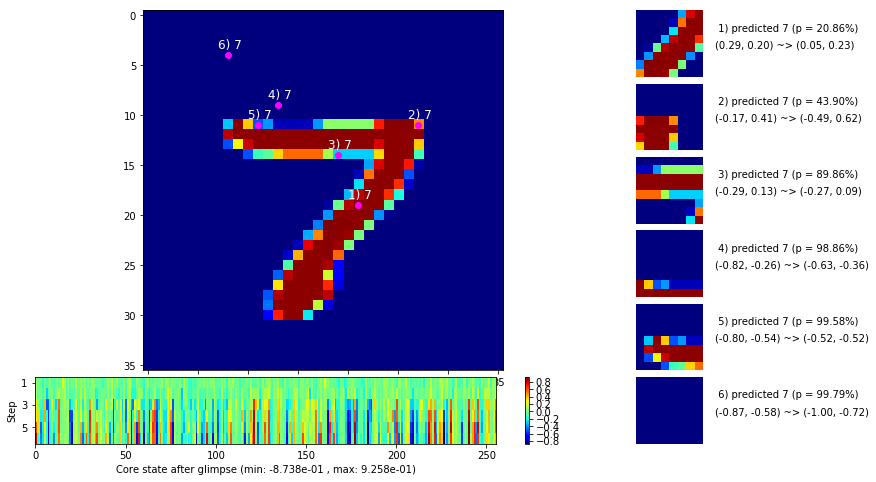

 b   1500/  3000 >> 133.6 ms/b | lr: 1.24e-05 | grad 2norm:  6.56 | grad inf norm:  1.618
       Weights || abs max:  0.80 (72609.41) | mean: -2.42e-03 ( 0.27) | var: 5.79e-03 (350480.16)
        Biases || abs max:  0.88 ( 9383.59) | mean:  2.95e-02 ( 5.12) | var: 2.17e-03 (9128914.00)
                  class loss: 0.332 | steps: 2.510 | reward:  0.890 | acc.: 88.97%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.2 ms/b | lr: 1.23e-05 | grad 2norm:  6.75 | grad inf norm:  1.627
       Weights || abs max:  0.80 (73918.15) | mean: -2.41e-03 ( 0.27) | var: 5.79e-03 (1209086.50)
        Biases || abs max:  0.88 ( 4216.13) | mean:  2.95e-02 ( 3.35) | var: 2.17e-03 (78454.64)
                  class loss: 0.354 | steps: 2.538 | reward:  0.885 | acc.: 88.49%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

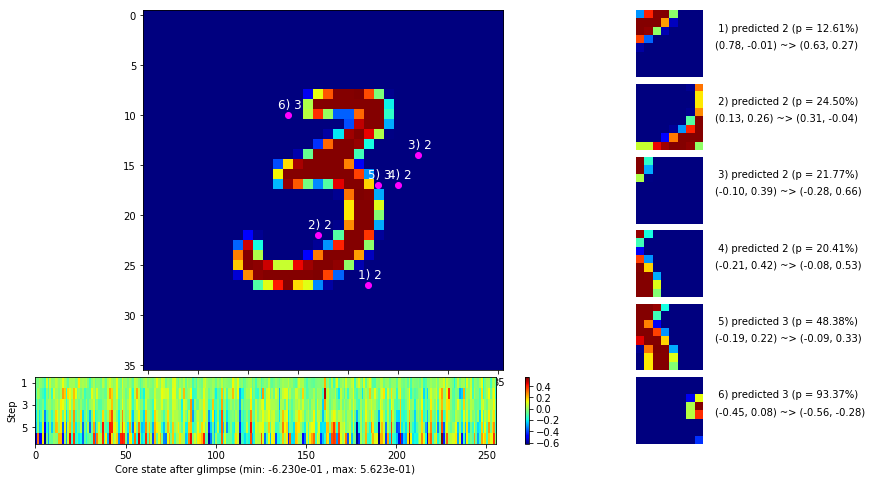

 b   2500/  3000 >> 136.6 ms/b | lr: 1.21e-05 | grad 2norm:  6.58 | grad inf norm:  1.543
       Weights || abs max:  0.80 (38054.99) | mean: -2.42e-03 ( 0.21) | var: 5.80e-03 (54562.49)
        Biases || abs max:  0.88 ( 2221.69) | mean:  2.95e-02 ( 2.51) | var: 2.17e-03 (21558.21)
                  class loss: 0.347 | steps: 2.511 | reward:  0.888 | acc.: 88.79%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 145.5 ms/b | lr: 1.20e-05 | grad 2norm:  6.75 | grad inf norm:  1.616
       Weights || abs max:  0.80 (43642.95) | mean: -2.42e-03 ( 0.21) | var: 5.80e-03 (73140.32)
        Biases || abs max:  0.88 ( 3480.97) | mean:  2.95e-02 ( 3.05) | var: 2.17e-03 (269608.38)
                  class loss: 0.357 | steps: 2.534 | reward:  0.884 | acc.: 88.38%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

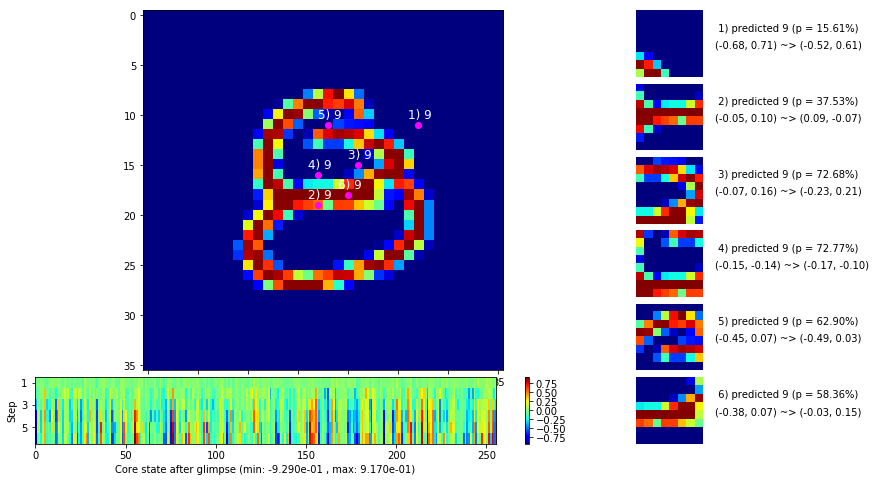

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


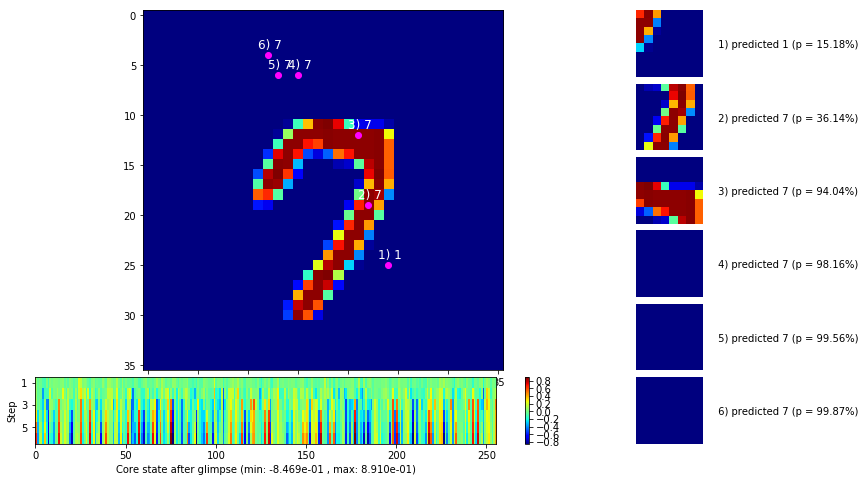


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


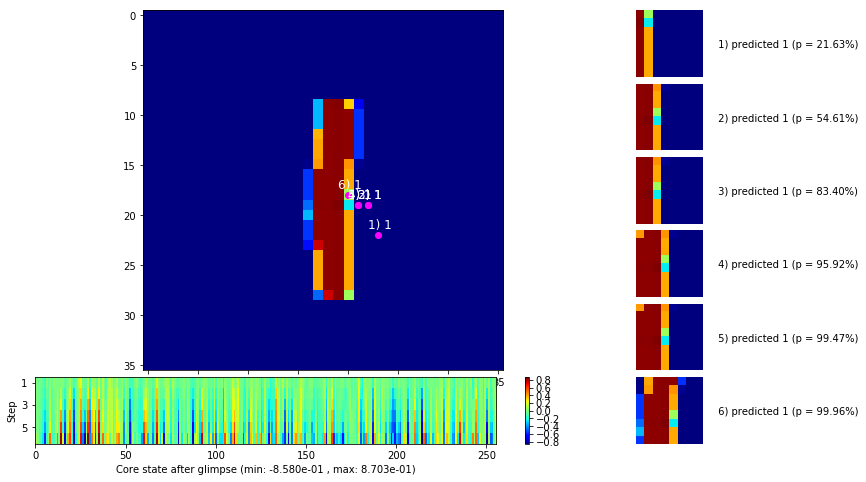

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


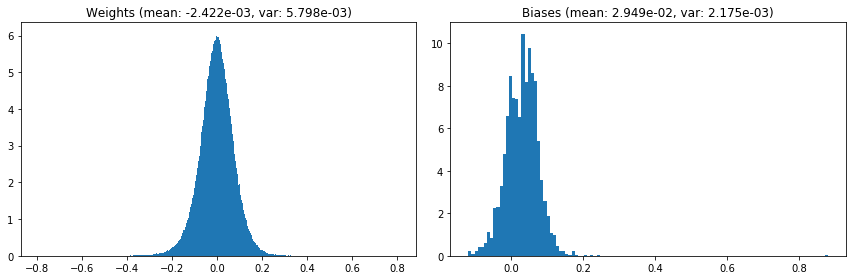

                                      Location network weights and biases


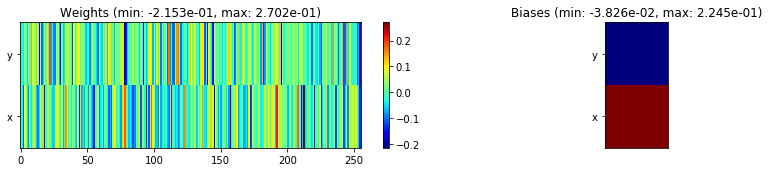

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.56 sec | TRAIN >> class loss: 0.3457 | steps:  2.526 :( | reward:  0.8864 :( | acc.: 88.645% :(
                          | VAL   >> class loss: 0.2919 | steps:  2.282 :( | reward:  0.9052 :( | acc.: 90.520% :(


Epoch  35/400) lr = 1.197e-05
 b    500/  3000 >> 137.3 ms/b | lr: 1.19e-05 | grad 2norm:  6.61 | grad inf norm:  1.556
       Weights || abs max:  0.80 (28001.51) | mean: -2.42e-03 ( 0.19) | var: 5.80e-03 ( 8677.46)
        Biases || abs max:  0.88 ( 7655.74) | mean:  2.95e-02 ( 5.58) | var: 2.18e-03 (361653.03)
                  class loss: 0.329 | steps: 2.519 | reward:  0.891 | acc.: 89.06%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.6 ms/b | lr: 1.18e-05 | grad 2norm:  6.64 | grad inf norm:  1.553
       Weights || abs max:  0.80 (44262.48) | mean: -2.41e-03 ( 0.21) 

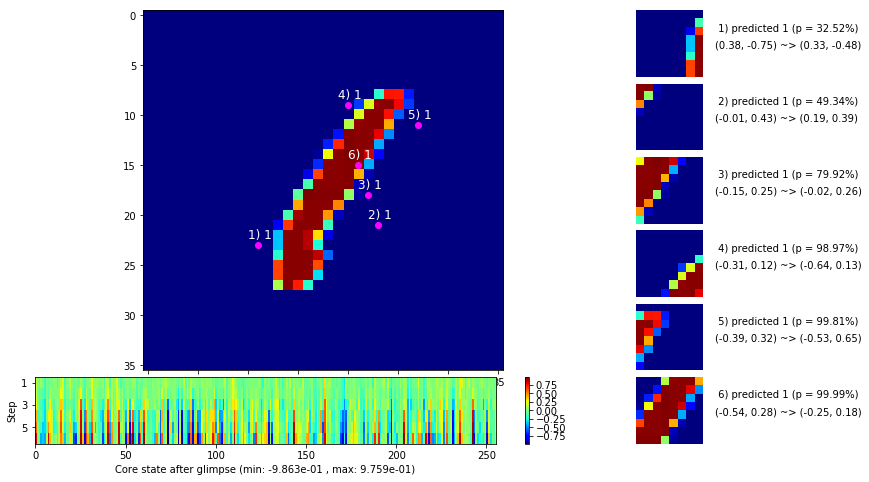

 b   1500/  3000 >> 135.5 ms/b | lr: 1.16e-05 | grad 2norm:  6.91 | grad inf norm:  1.647
       Weights || abs max:  0.80 (154982.22) | mean: -2.42e-03 ( 0.40) | var: 5.80e-03 (11821309.00)
        Biases || abs max:  0.88 ( 5858.76) | mean:  2.95e-02 ( 4.58) | var: 2.18e-03 (343980.03)
                  class loss: 0.358 | steps: 2.513 | reward:  0.878 | acc.: 87.78%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.5 ms/b | lr: 1.16e-05 | grad 2norm:  6.68 | grad inf norm:  1.542
       Weights || abs max:  0.80 (29990.82) | mean: -2.42e-03 ( 0.19) | var: 5.81e-03 (10188.49)
        Biases || abs max:  0.88 ( 4422.00) | mean:  2.96e-02 ( 3.79) | var: 2.18e-03 (90653.00)
                  class loss: 0.340 | steps: 2.512 | reward:  0.889 | acc.: 88.86%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

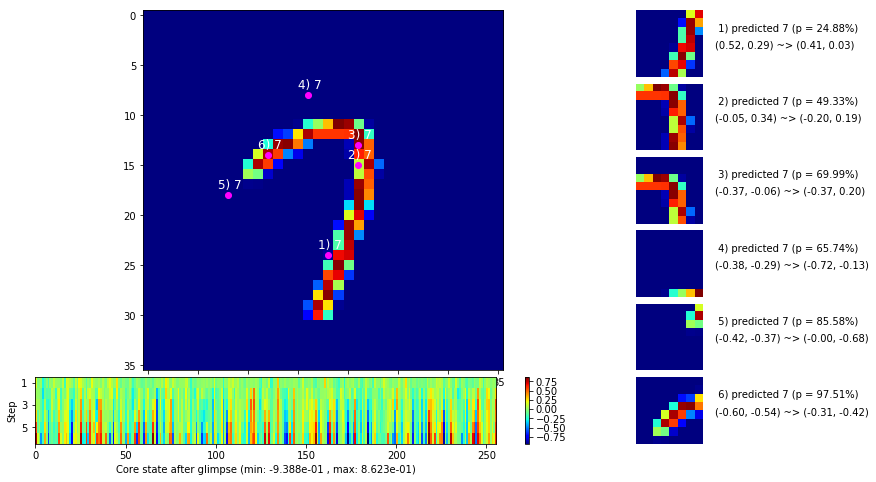

 b   2500/  3000 >> 133.2 ms/b | lr: 1.14e-05 | grad 2norm:  6.80 | grad inf norm:  1.633
       Weights || abs max:  0.80 (35987.21) | mean: -2.42e-03 ( 0.20) | var: 5.81e-03 (62143.84)
        Biases || abs max:  0.88 (16542.32) | mean:  2.96e-02 ( 8.20) | var: 2.18e-03 (34846748.00)
                  class loss: 0.355 | steps: 2.526 | reward:  0.883 | acc.: 88.31%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.1 ms/b | lr: 1.13e-05 | grad 2norm:  6.57 | grad inf norm:  1.589
       Weights || abs max:  0.80 (31445.57) | mean: -2.43e-03 ( 0.20) | var: 5.81e-03 (16200.67)
        Biases || abs max:  0.88 ( 5258.04) | mean:  2.96e-02 ( 3.93) | var: 2.18e-03 (429400.88)
                  class loss: 0.336 | steps: 2.512 | reward:  0.891 | acc.: 89.14%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

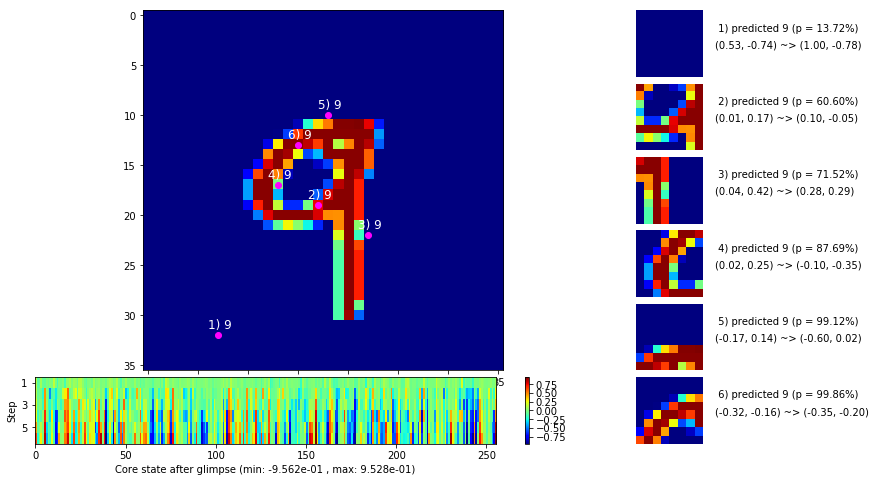

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


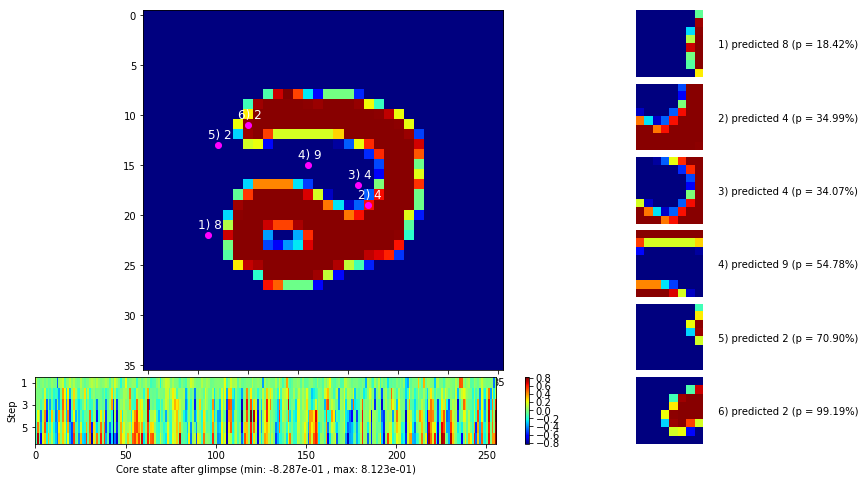


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


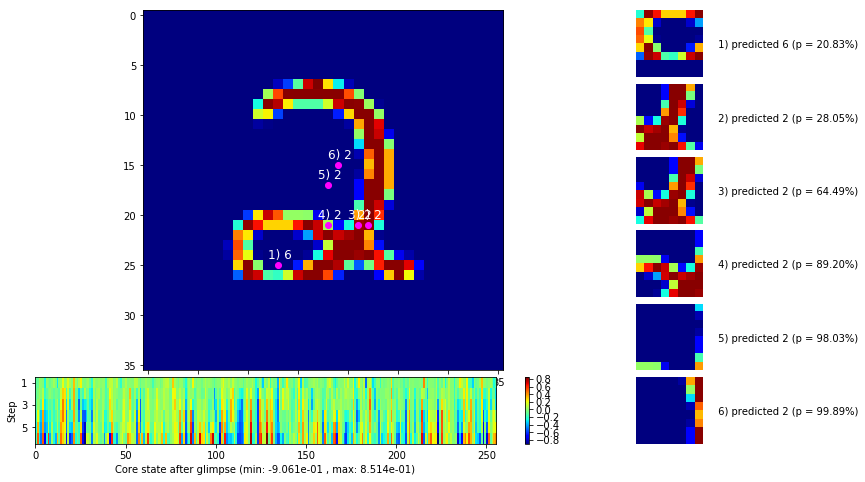

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


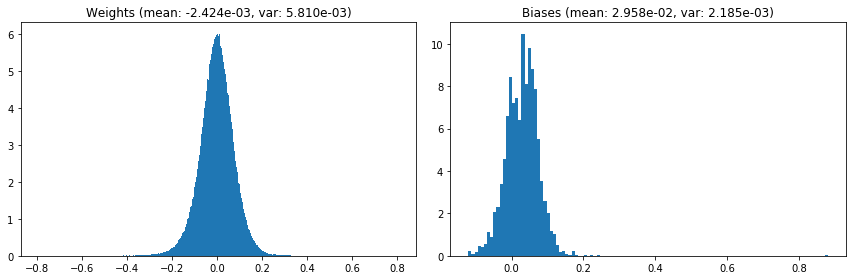

                                      Location network weights and biases


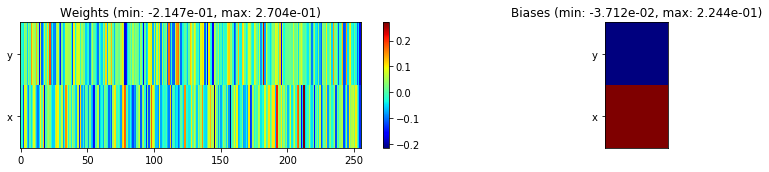

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.19 sec | TRAIN >> class loss: 0.3438 | steps:  2.518    | reward:  0.8865 :( | acc.: 88.648% :(
                          | VAL   >> class loss: 0.2835 | steps:  2.261 :( | reward:  0.9066 :( | acc.: 90.660% :(


Epoch  36/400) lr = 1.129e-05
 b    500/  3000 >> 134.8 ms/b | lr: 1.12e-05 | grad 2norm:  6.70 | grad inf norm:  1.575
       Weights || abs max:  0.80 (59615.44) | mean: -2.43e-03 ( 0.24) | var: 5.81e-03 (286089.16)
        Biases || abs max:  0.88 ( 6577.07) | mean:  2.96e-02 ( 4.99) | var: 2.18e-03 (147766.55)
                  class loss: 0.339 | steps: 2.535 | reward:  0.886 | acc.: 88.64%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 141.6 ms/b | lr: 1.11e-05 | grad 2norm:  6.54 | grad inf norm:  1.531
       Weights || abs max:  0.80 (67799.12) | mean: -2.43e-03 ( 0.26)

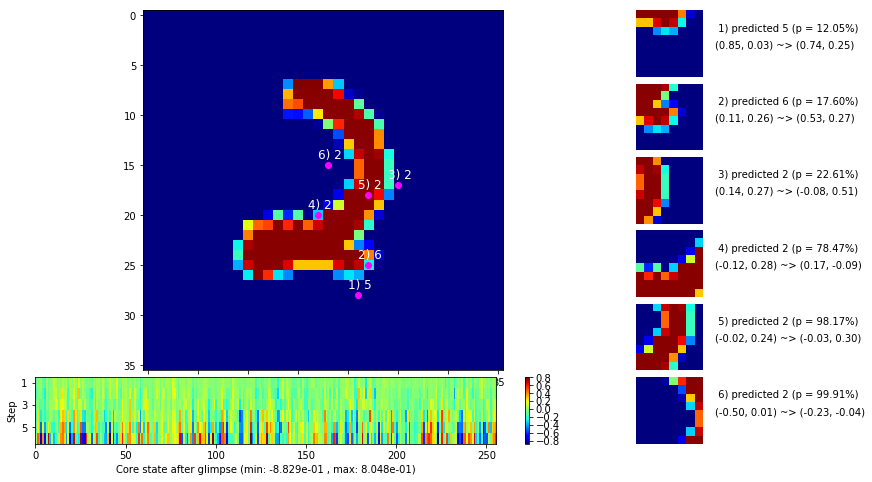

 b   1500/  3000 >> 136.7 ms/b | lr: 1.10e-05 | grad 2norm:  6.76 | grad inf norm:  1.609
       Weights || abs max:  0.81 (63366.68) | mean: -2.43e-03 ( 0.26) | var: 5.82e-03 (336026.84)
        Biases || abs max:  0.88 (13380.86) | mean:  2.96e-02 ( 6.98) | var: 2.19e-03 (15106481.00)
                  class loss: 0.348 | steps: 2.548 | reward:  0.883 | acc.: 88.26%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.6 ms/b | lr: 1.09e-05 | grad 2norm:  6.62 | grad inf norm:  1.540
       Weights || abs max:  0.81 (32501.23) | mean: -2.43e-03 ( 0.19) | var: 5.82e-03 (12607.72)
        Biases || abs max:  0.88 ( 1962.02) | mean:  2.96e-02 ( 2.55) | var: 2.19e-03 ( 7601.73)
                  class loss: 0.341 | steps: 2.508 | reward:  0.889 | acc.: 88.89%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

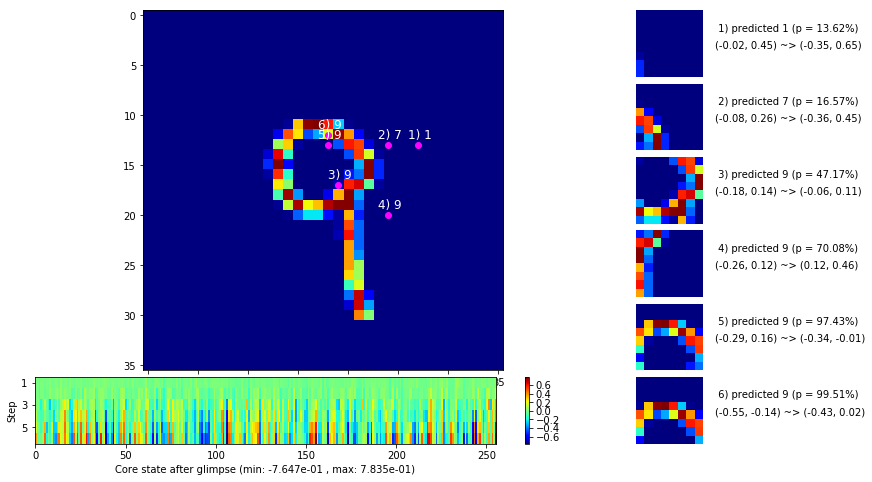

 b   2500/  3000 >> 135.9 ms/b | lr: 1.08e-05 | grad 2norm:  6.64 | grad inf norm:  1.624
       Weights || abs max:  0.81 (1129233.25) | mean: -2.43e-03 ( 2.03) | var: 5.82e-03 (965263296.00)
        Biases || abs max:  0.88 ( 2272.38) | mean:  2.96e-02 ( 2.75) | var: 2.19e-03 (19338.61)
                  class loss: 0.337 | steps: 2.534 | reward:  0.887 | acc.: 88.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.6 ms/b | lr: 1.07e-05 | grad 2norm:  6.64 | grad inf norm:  1.579
       Weights || abs max:  0.81 (47595.46) | mean: -2.43e-03 ( 0.23) | var: 5.82e-03 (66577.52)
        Biases || abs max:  0.88 ( 2719.41) | mean:  2.96e-02 ( 2.77) | var: 2.19e-03 (51482.86)
                  class loss: 0.333 | steps: 2.528 | reward:  0.888 | acc.: 88.81%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

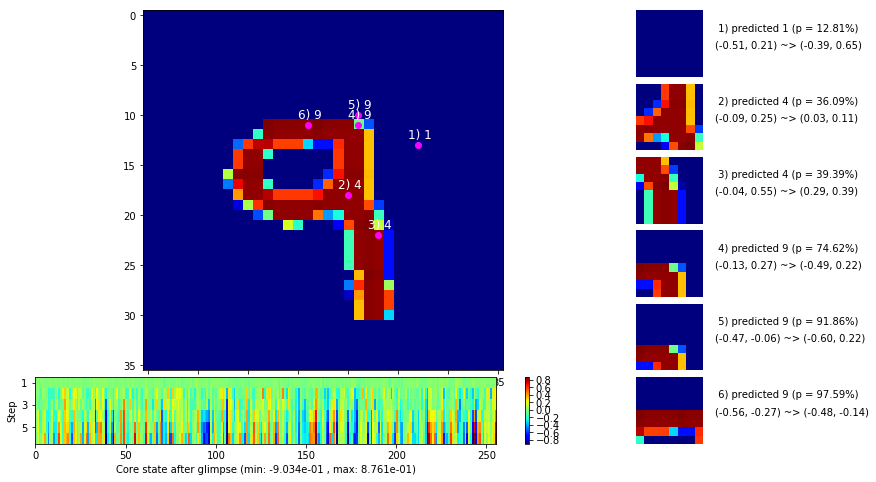

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


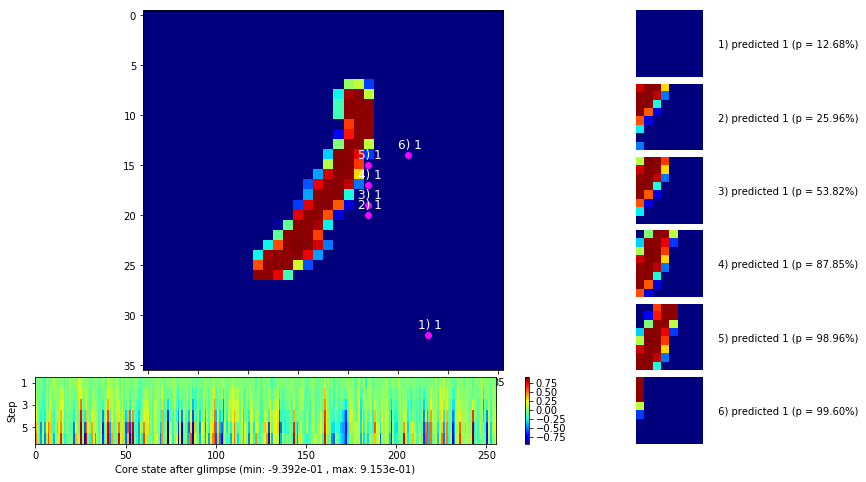


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


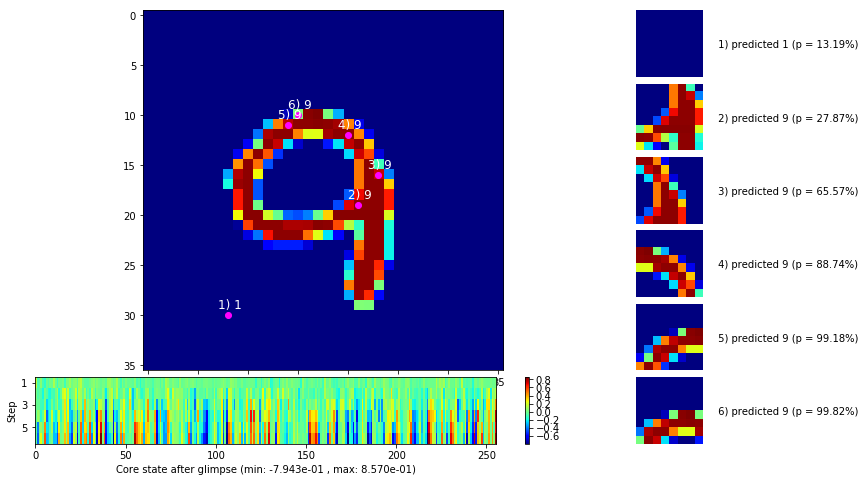

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


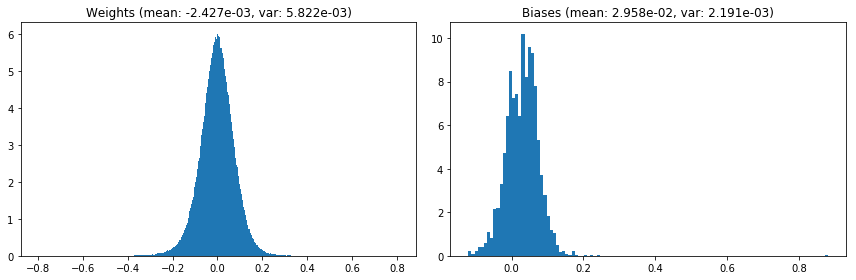

                                      Location network weights and biases


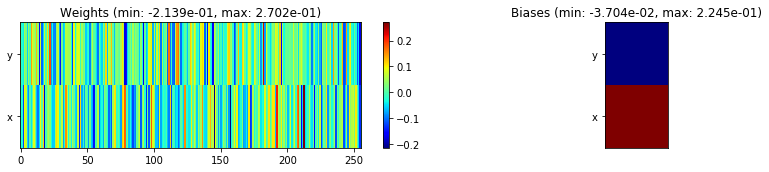

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.20 sec | TRAIN >> class loss: 0.3395 | steps:  2.530 :( | reward:  0.8872 :( | acc.: 88.720% :(
                          | VAL   >> class loss: 0.2882 | steps:  2.279 :( | reward:  0.9050 :( | acc.: 90.500% :(


Epoch  37/400) lr = 1.068e-05
 b    500/  3000 >> 133.0 ms/b | lr: 1.06e-05 | grad 2norm:  6.69 | grad inf norm:  1.612
       Weights || abs max:  0.81 (171583.25) | mean: -2.43e-03 ( 0.43) | var: 5.82e-03 (10331414.00)
        Biases || abs max:  0.88 ( 5954.50) | mean:  2.96e-02 ( 4.16) | var: 2.19e-03 (682209.44)
                  class loss: 0.349 | steps: 2.530 | reward:  0.886 | acc.: 88.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 1.05e-05 | grad 2norm:  6.69 | grad inf norm:  1.618
       Weights || abs max:  0.81 (55863.70) | mean: -2.42e-03 ( 0.

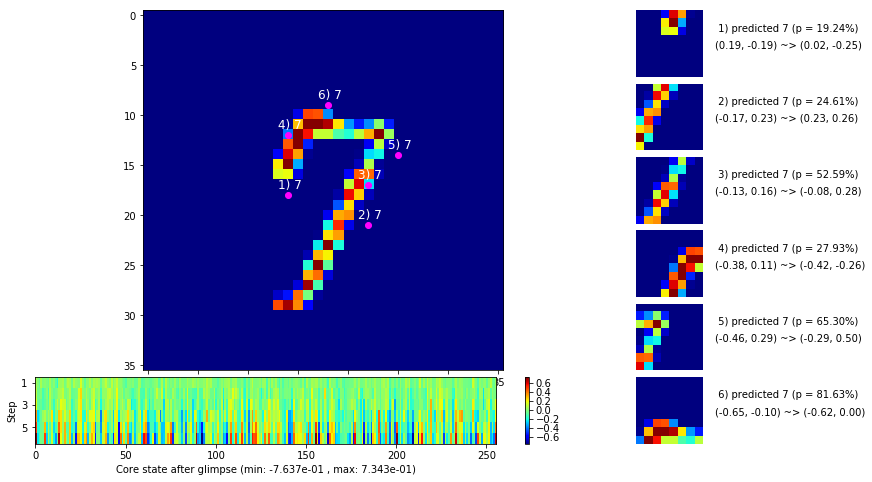

 b   1500/  3000 >> 133.7 ms/b | lr: 1.04e-05 | grad 2norm:  6.59 | grad inf norm:  1.569
       Weights || abs max:  0.81 (45740.28) | mean: -2.42e-03 ( 0.22) | var: 5.83e-03 (114988.04)
        Biases || abs max:  0.88 (23400.20) | mean:  2.96e-02 (11.36) | var: 2.19e-03 (22619446.00)
                  class loss: 0.342 | steps: 2.523 | reward:  0.890 | acc.: 88.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.8 ms/b | lr: 1.03e-05 | grad 2norm:  6.63 | grad inf norm:  1.528
       Weights || abs max:  0.81 (36897.51) | mean: -2.42e-03 ( 0.21) | var: 5.83e-03 (32752.72)
        Biases || abs max:  0.88 (13609.34) | mean:  2.96e-02 ( 7.68) | var: 2.20e-03 (1907906.50)
                  class loss: 0.341 | steps: 2.529 | reward:  0.888 | acc.: 88.77%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

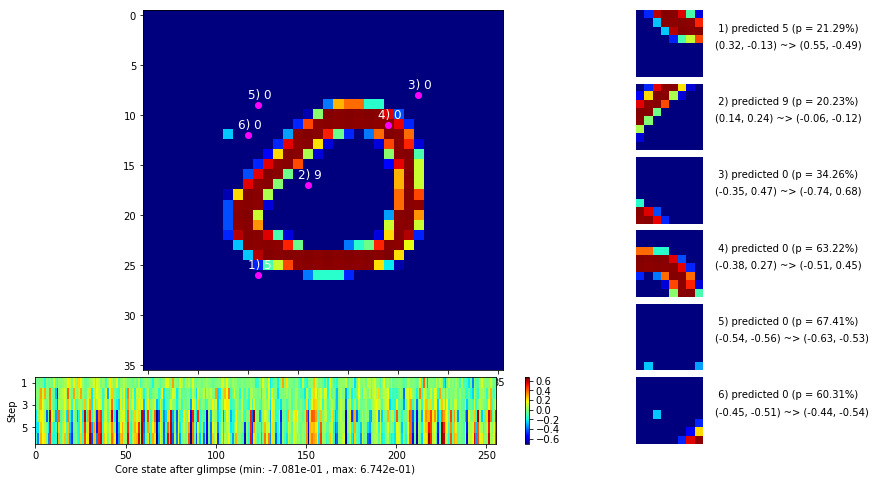

 b   2500/  3000 >> 143.5 ms/b | lr: 1.02e-05 | grad 2norm:  6.59 | grad inf norm:  1.547
       Weights || abs max:  0.81 (71245.14) | mean: -2.42e-03 ( 0.27) | var: 5.83e-03 (347521.69)
        Biases || abs max:  0.88 ( 9367.63) | mean:  2.96e-02 ( 5.75) | var: 2.20e-03 (1335196.62)
                  class loss: 0.342 | steps: 2.526 | reward:  0.890 | acc.: 89.00%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.3 ms/b | lr: 1.01e-05 | grad 2norm:  6.62 | grad inf norm:  1.593
       Weights || abs max:  0.81 (69123.26) | mean: -2.42e-03 ( 0.26) | var: 5.83e-03 (1156920.25)
        Biases || abs max:  0.88 ( 6638.98) | mean:  2.96e-02 ( 5.11) | var: 2.20e-03 (236569.28)
                  class loss: 0.338 | steps: 2.542 | reward:  0.887 | acc.: 88.75%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

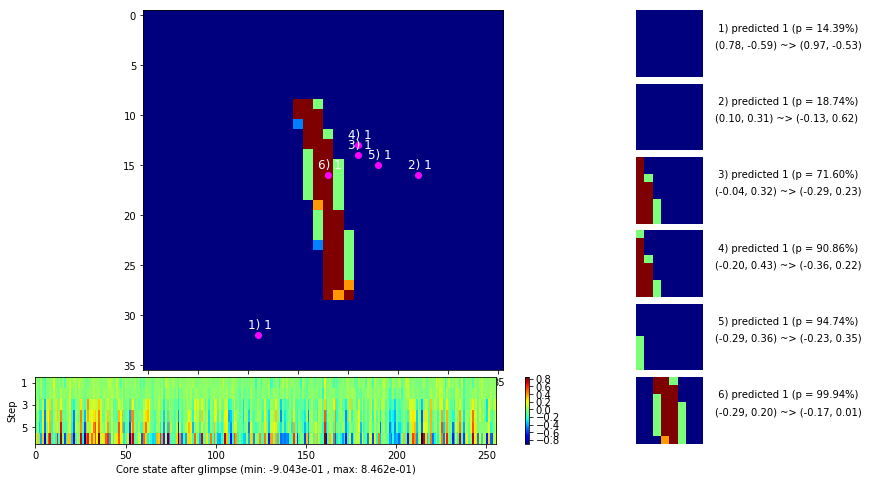

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


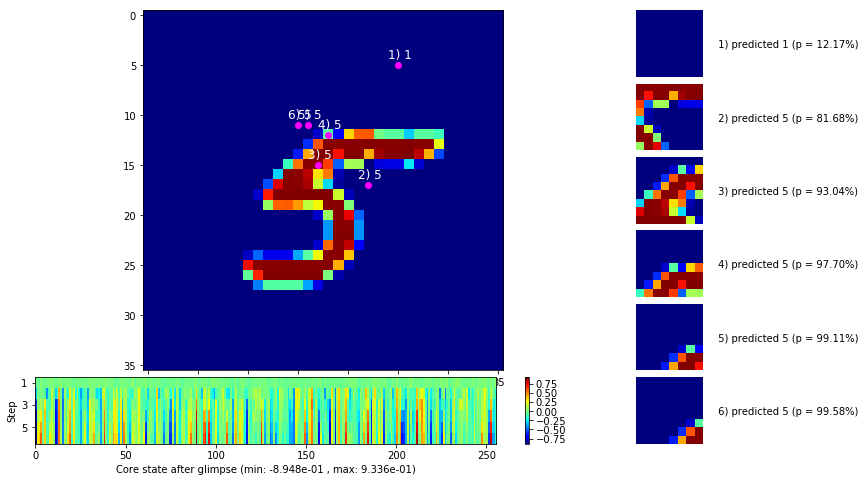


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


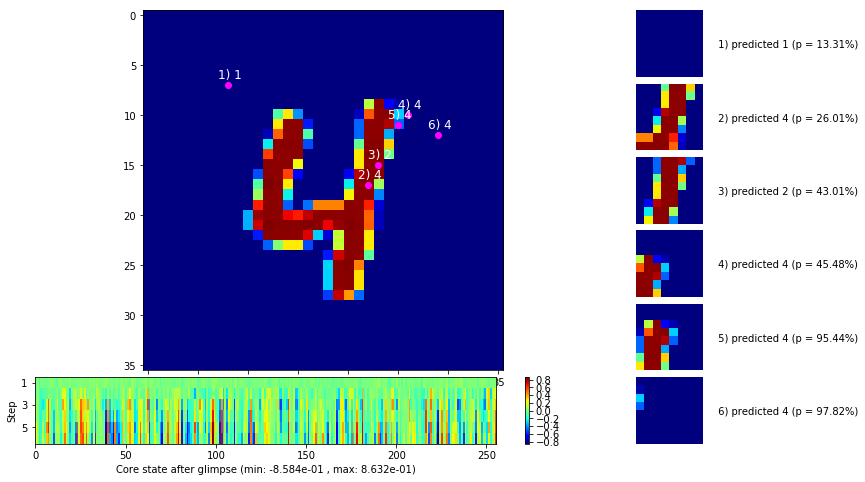

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


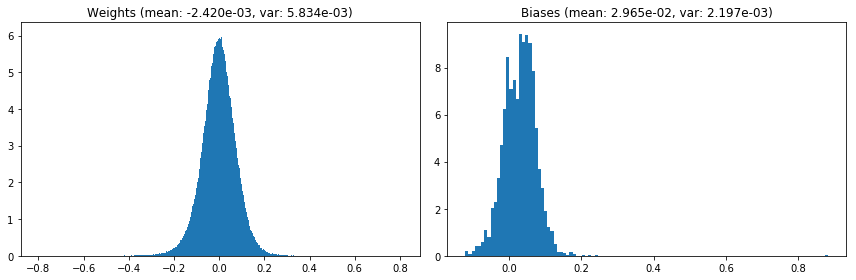

                                      Location network weights and biases


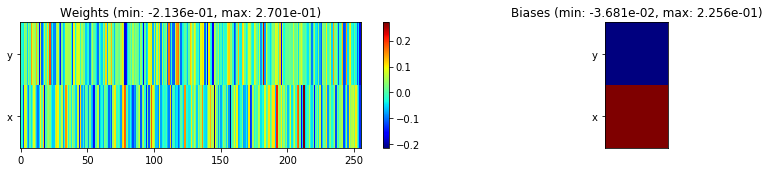

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.36 sec | TRAIN >> class loss: 0.3422 | steps:  2.529 :( | reward:  0.8880 :( | acc.: 88.798% :(
                          | VAL   >> class loss: 0.2873 | steps:  2.275 :( | reward:  0.9034 :( | acc.: 90.340% :(


Epoch  38/400) lr = 1.011e-05
 b    500/  3000 >> 135.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.49 | grad inf norm:  1.531
       Weights || abs max:  0.81 (45525.80) | mean: -2.42e-03 ( 0.21) | var: 5.84e-03 (123844.00)
        Biases || abs max:  0.88 ( 4649.78) | mean:  2.97e-02 ( 3.76) | var: 2.20e-03 (456586.62)
                  class loss: 0.335 | steps: 2.508 | reward:  0.891 | acc.: 89.06%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.73 | grad inf norm:  1.588
       Weights || abs max:  0.81 (32205.62) | mean: -2.42e-03 ( 0.20)

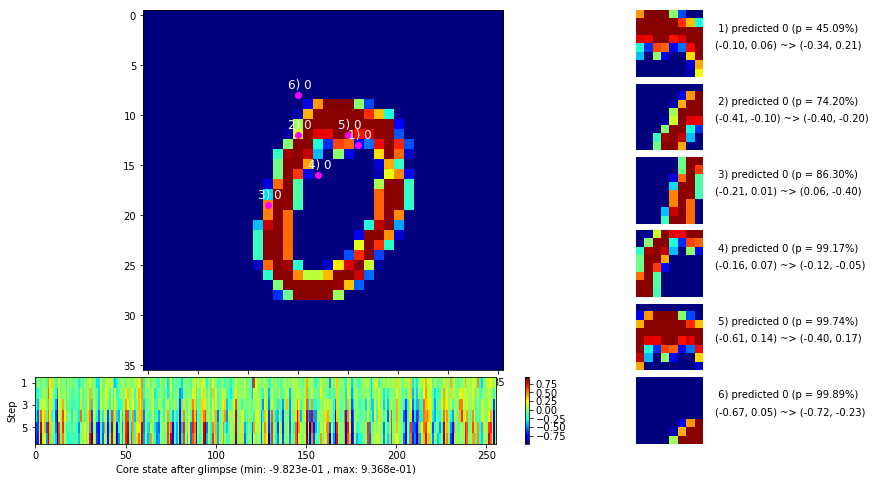

 b   1500/  3000 >> 135.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.52 | grad inf norm:  1.547
       Weights || abs max:  0.81 (74777.17) | mean: -2.42e-03 ( 0.27) | var: 5.84e-03 (760911.12)
        Biases || abs max:  0.88 (148286.14) | mean:  2.97e-02 (60.60) | var: 2.20e-03 (3451256832.00)
                  class loss: 0.336 | steps: 2.515 | reward:  0.891 | acc.: 89.11%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.63 | grad inf norm:  1.589
       Weights || abs max:  0.81 (149530.23) | mean: -2.42e-03 ( 0.39) | var: 5.84e-03 (10979644.00)
        Biases || abs max:  0.88 (11188.04) | mean:  2.96e-02 ( 8.05) | var: 2.20e-03 (969153.69)
                  class loss: 0.339 | steps: 2.541 | reward:  0.887 | acc.: 88.69%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.

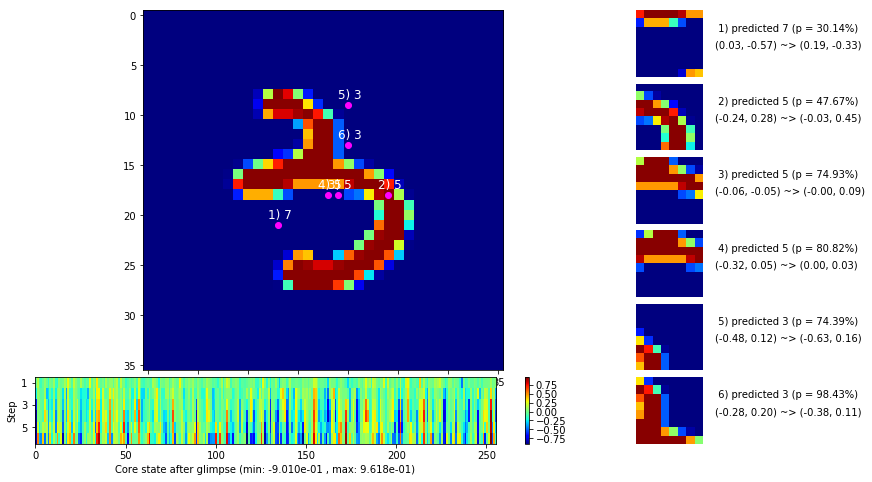

 b   2500/  3000 >> 133.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.72 | grad inf norm:  1.664
       Weights || abs max:  0.81 (104392.99) | mean: -2.42e-03 ( 0.32) | var: 5.84e-03 (1709790.25)
        Biases || abs max:  0.88 ( 4094.76) | mean:  2.97e-02 ( 4.00) | var: 2.20e-03 (85008.06)
                  class loss: 0.347 | steps: 2.526 | reward:  0.887 | acc.: 88.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.84 | grad inf norm:  1.578
       Weights || abs max:  0.81 (62105.98) | mean: -2.42e-03 ( 0.26) | var: 5.84e-03 (117931.20)
        Biases || abs max:  0.88 (10497.47) | mean:  2.97e-02 ( 8.46) | var: 2.20e-03 (3570150.00)
                  class loss: 0.342 | steps: 2.537 | reward:  0.882 | acc.: 88.24%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

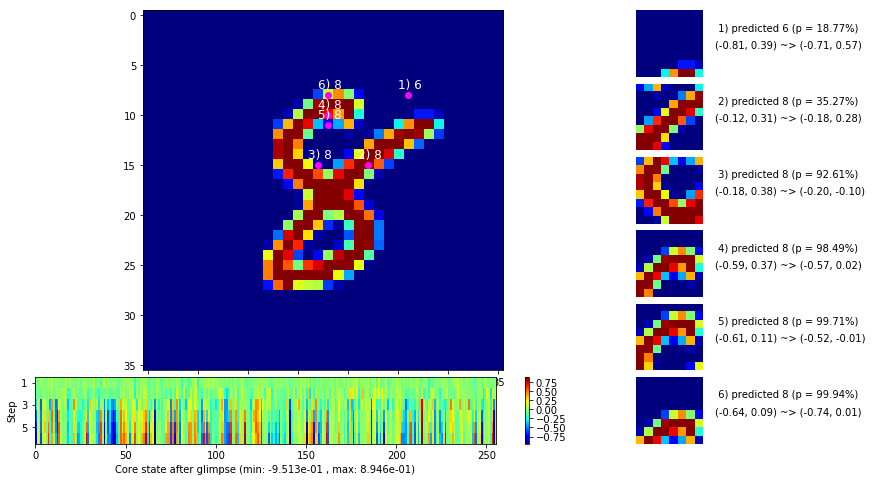

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


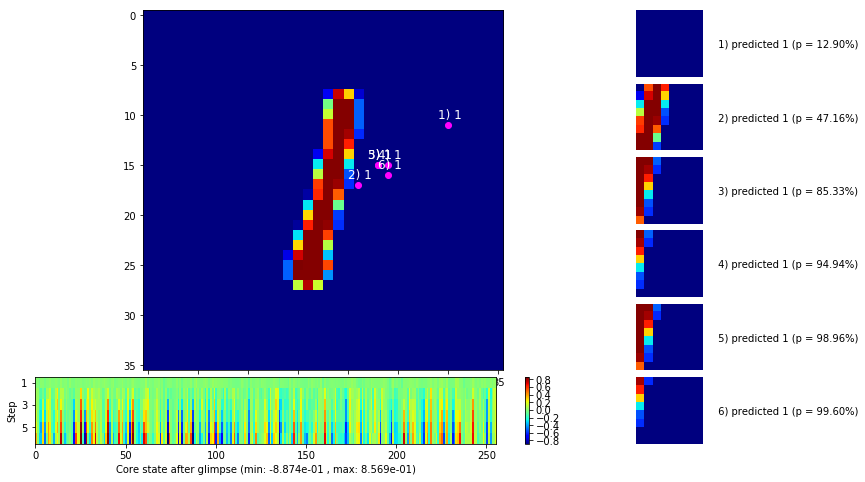


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


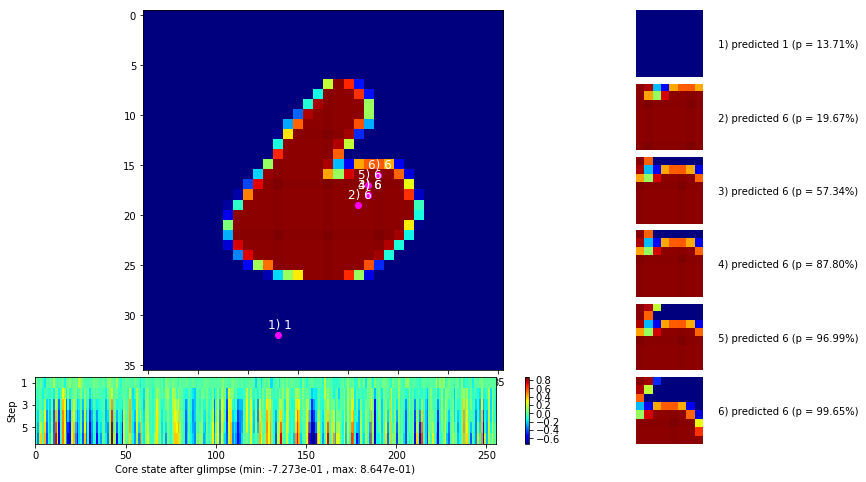

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


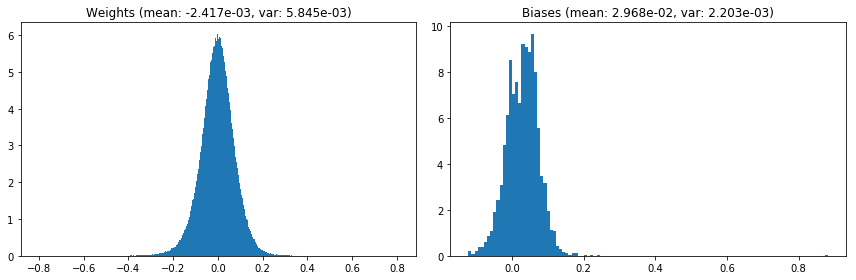

                                      Location network weights and biases


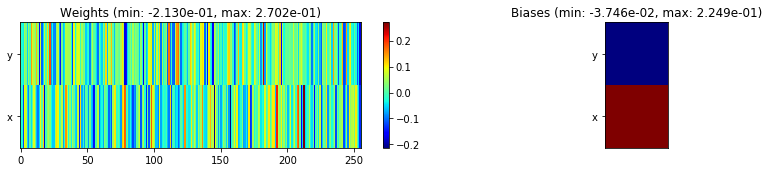

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.55 sec | TRAIN >> class loss: 0.3420 | steps:  2.528 :( | reward:  0.8871 :( | acc.: 88.707% :(
                          | VAL   >> class loss: 0.2877 | steps:  2.286 :( | reward:  0.9062 :( | acc.: 90.620% :(


Epoch  39/400) lr = 1e-05
 b    500/  3000 >> 132.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.65 | grad inf norm:  1.561
       Weights || abs max:  0.81 (110804.70) | mean: -2.42e-03 ( 0.34) | var: 5.85e-03 (1863647.25)
        Biases || abs max:  0.88 ( 5852.58) | mean:  2.97e-02 ( 4.86) | var: 2.20e-03 (290176.38)
                  class loss: 0.336 | steps: 2.531 | reward:  0.888 | acc.: 88.78%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 141.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.64 | grad inf norm:  1.583
       Weights || abs max:  0.81 (113170.70) | mean: -2.42e-03 ( 0.34) 

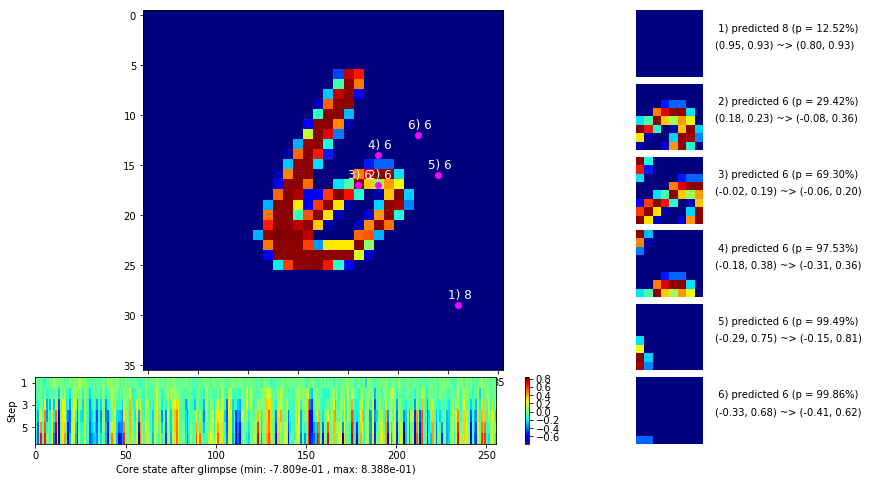

 b   1500/  3000 >> 134.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.53 | grad inf norm:  1.523
       Weights || abs max:  0.81 (44769.78) | mean: -2.43e-03 ( 0.22) | var: 5.85e-03 (85338.75)
        Biases || abs max:  0.88 ( 5317.84) | mean:  2.97e-02 ( 4.53) | var: 2.20e-03 (256328.12)
                  class loss: 0.329 | steps: 2.519 | reward:  0.892 | acc.: 89.18%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.53 | grad inf norm:  1.560
       Weights || abs max:  0.81 (42214.05) | mean: -2.43e-03 ( 0.21) | var: 5.85e-03 (51577.57)
        Biases || abs max:  0.88 (14013.17) | mean:  2.97e-02 ( 8.93) | var: 2.21e-03 (4419349.00)
                  class loss: 0.340 | steps: 2.519 | reward:  0.891 | acc.: 89.07%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

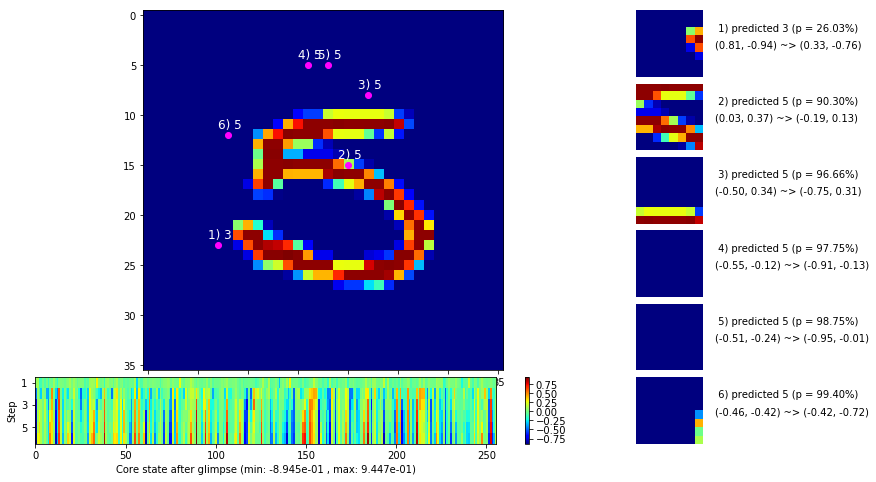

 b   2500/  3000 >> 133.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.64 | grad inf norm:  1.593
       Weights || abs max:  0.81 (55201.71) | mean: -2.43e-03 ( 0.25) | var: 5.85e-03 (208954.67)
        Biases || abs max:  0.88 ( 7013.81) | mean:  2.97e-02 ( 5.30) | var: 2.21e-03 (236396.80)
                  class loss: 0.343 | steps: 2.526 | reward:  0.886 | acc.: 88.60%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.71 | grad inf norm:  1.639
       Weights || abs max:  0.81 (42798.10) | mean: -2.44e-03 ( 0.21) | var: 5.85e-03 (76637.44)
        Biases || abs max:  0.88 ( 9553.79) | mean:  2.97e-02 ( 6.13) | var: 2.21e-03 (1153935.25)
                  class loss: 0.340 | steps: 2.518 | reward:  0.885 | acc.: 88.53%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

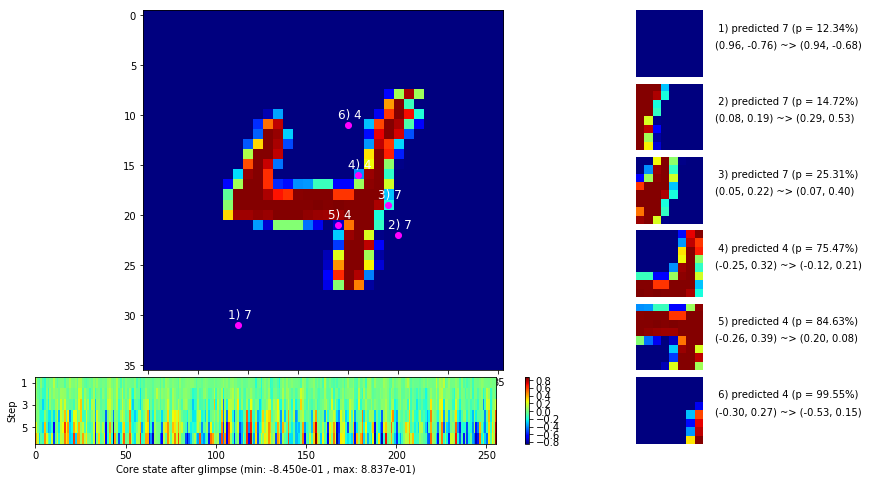

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


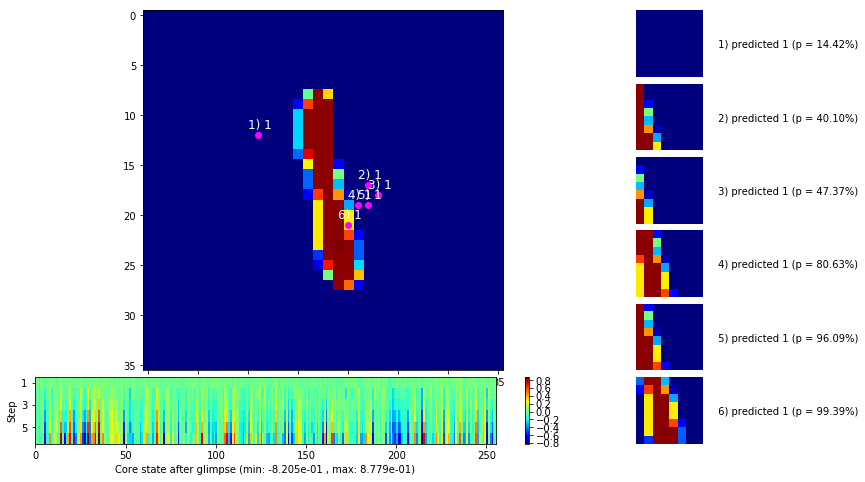


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


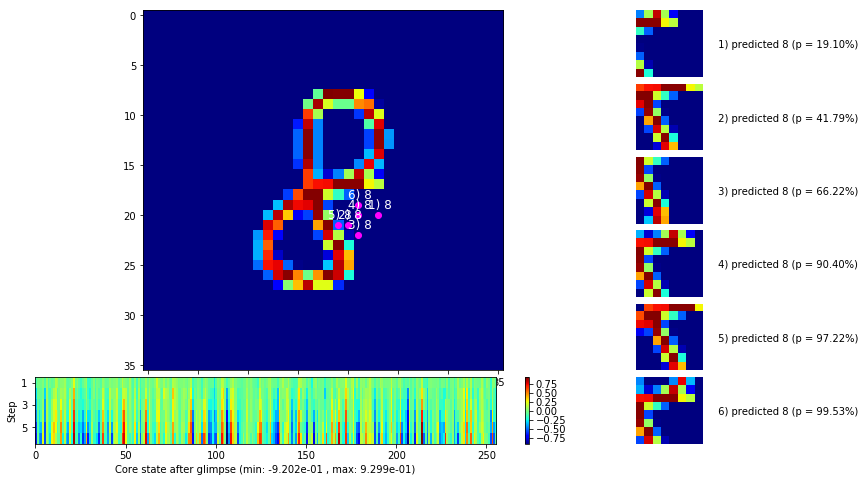

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


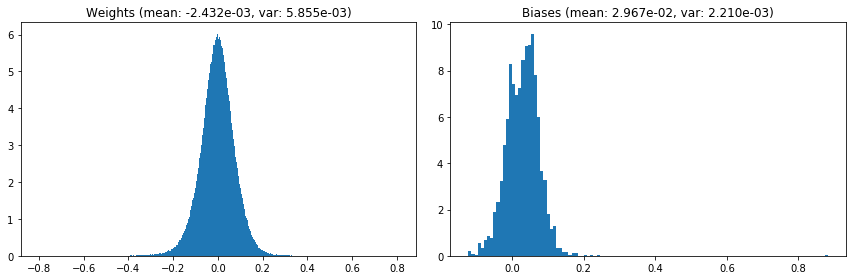

                                      Location network weights and biases


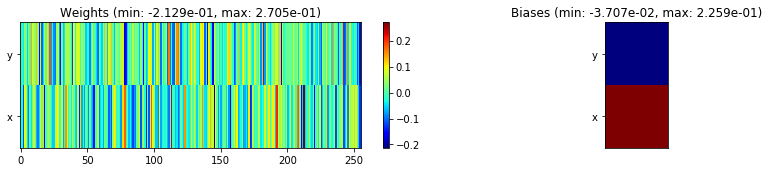

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.25 sec | TRAIN >> class loss: 0.3375 | steps:  2.523 :( | reward:  0.8882 :( | acc.: 88.825% :(
                          | VAL   >> class loss: 0.2818 | steps:  2.293 :( | reward:  0.9084 :( | acc.: 90.840% :(


Epoch  40/400) lr = 1e-05
 b    500/  3000 >> 131.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.79 | grad inf norm:  1.609
       Weights || abs max:  0.81 (49472.55) | mean: -2.43e-03 ( 0.23) | var: 5.86e-03 (307104.84)
        Biases || abs max:  0.88 ( 8428.19) | mean:  2.97e-02 ( 6.39) | var: 2.21e-03 (1042405.00)
                  class loss: 0.348 | steps: 2.554 | reward:  0.881 | acc.: 88.15%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.73 | grad inf norm:  1.657
       Weights || abs max:  0.81 (48197.84) | mean: -2.43e-03 ( 0.23) | 

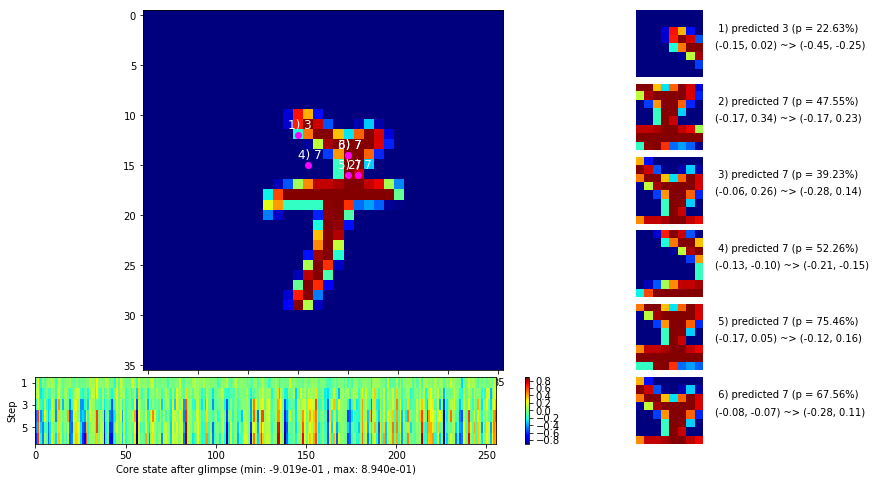

 b   1500/  3000 >> 132.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.69 | grad inf norm:  1.596
       Weights || abs max:  0.81 (43753.45) | mean: -2.44e-03 ( 0.22) | var: 5.86e-03 (41201.92)
        Biases || abs max:  0.88 ( 9214.46) | mean:  2.97e-02 ( 5.95) | var: 2.21e-03 (2036359.25)
                  class loss: 0.339 | steps: 2.536 | reward:  0.886 | acc.: 88.61%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.52 | grad inf norm:  1.531
       Weights || abs max:  0.81 (43808.16) | mean: -2.44e-03 ( 0.22) | var: 5.86e-03 (49358.92)
        Biases || abs max:  0.88 ( 4720.92) | mean:  2.97e-02 ( 3.70) | var: 2.21e-03 (582227.81)
                  class loss: 0.325 | steps: 2.491 | reward:  0.893 | acc.: 89.34%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

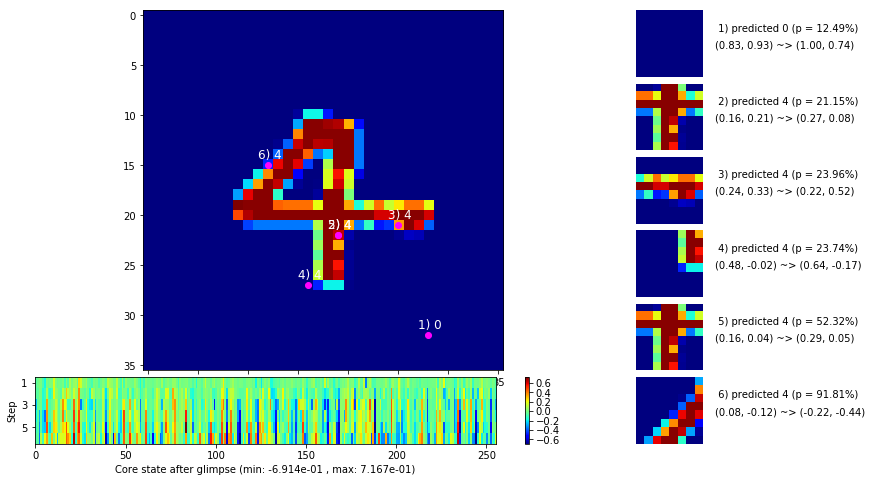

 b   2500/  3000 >> 140.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.53 | grad inf norm:  1.581
       Weights || abs max:  0.81 (48527.72) | mean: -2.44e-03 ( 0.23) | var: 5.86e-03 (269530.78)
        Biases || abs max:  0.88 ( 5811.43) | mean:  2.97e-02 ( 4.24) | var: 2.22e-03 (104669.65)
                  class loss: 0.334 | steps: 2.519 | reward:  0.890 | acc.: 89.05%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.62 | grad inf norm:  1.555
       Weights || abs max:  0.81 (115913.23) | mean: -2.44e-03 ( 0.34) | var: 5.87e-03 (1096544.88)
        Biases || abs max:  0.88 ( 3723.93) | mean:  2.97e-02 ( 3.76) | var: 2.22e-03 (286436.28)
                  class loss: 0.343 | steps: 2.510 | reward:  0.891 | acc.: 89.12%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

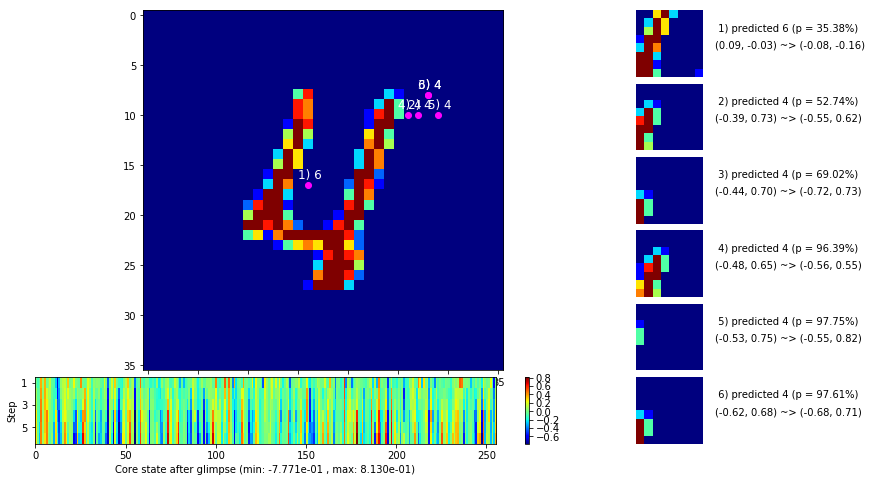

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


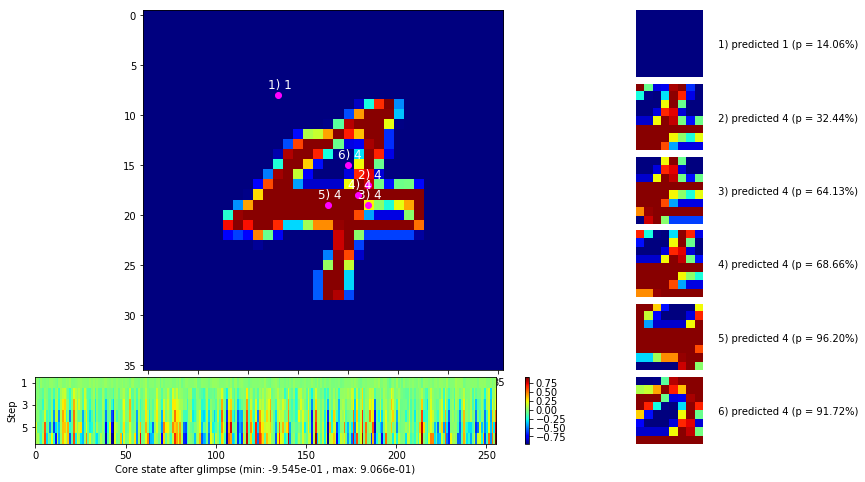


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


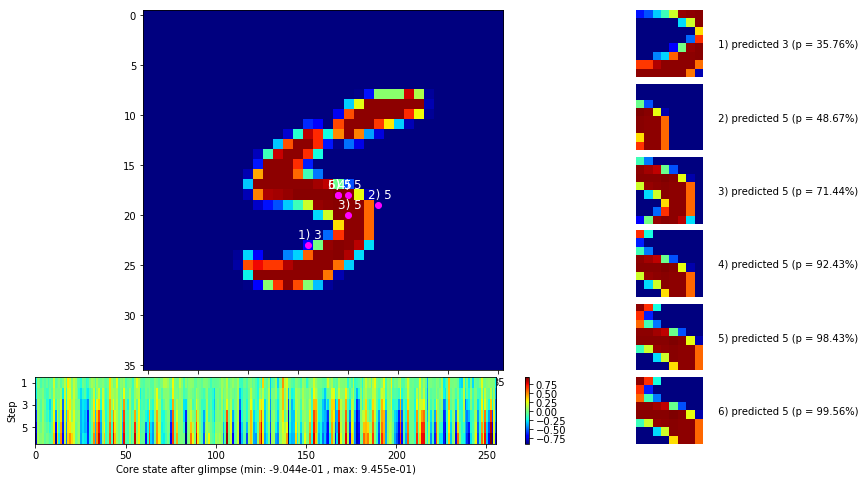

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


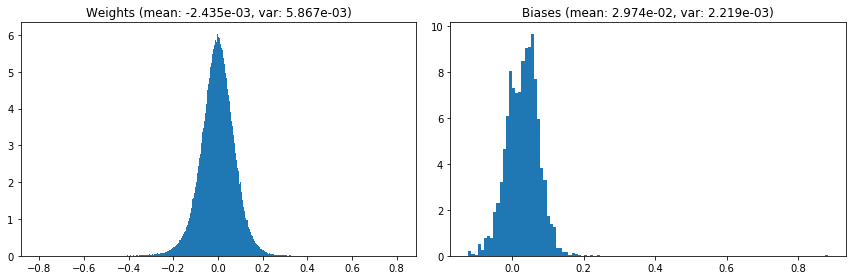

                                      Location network weights and biases


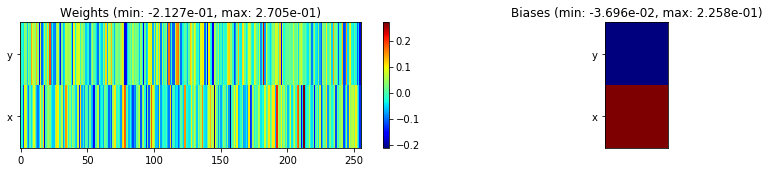

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.49 sec | TRAIN >> class loss: 0.3393 | steps:  2.523 :( | reward:  0.8880 :( | acc.: 88.797% :(
                          | VAL   >> class loss: 0.2799 | steps:  2.260 :( | reward:  0.9082 :( | acc.: 90.820% :(


Epoch  41/400) lr = 1e-05
 b    500/  3000 >> 132.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.66 | grad inf norm:  1.551
       Weights || abs max:  0.81 (58181.77) | mean: -2.44e-03 ( 0.24) | var: 5.87e-03 (390133.09)
        Biases || abs max:  0.88 ( 3586.66) | mean:  2.97e-02 ( 3.23) | var: 2.22e-03 (41703.69)
                  class loss: 0.347 | steps: 2.511 | reward:  0.887 | acc.: 88.72%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.63 | grad inf norm:  1.601
       Weights || abs max:  0.81 (52722.22) | mean: -2.44e-03 ( 0.23) | va

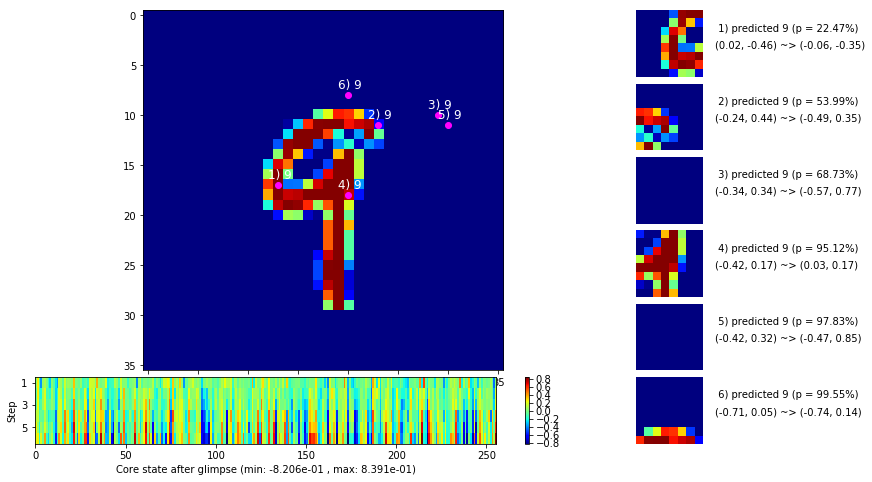

 b   1500/  3000 >> 134.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.49 | grad inf norm:  1.546
       Weights || abs max:  0.81 (68652.87) | mean: -2.44e-03 ( 0.27) | var: 5.87e-03 (262713.88)
        Biases || abs max:  0.88 (13348.28) | mean:  2.97e-02 (11.59) | var: 2.22e-03 (39165220.00)
                  class loss: 0.327 | steps: 2.502 | reward:  0.893 | acc.: 89.34%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.72 | grad inf norm:  1.567
       Weights || abs max:  0.81 (55850.50) | mean: -2.43e-03 ( 0.26) | var: 5.87e-03 (48462.77)
        Biases || abs max:  0.88 ( 5927.53) | mean:  2.98e-02 ( 5.68) | var: 2.22e-03 (418237.19)
                  class loss: 0.345 | steps: 2.534 | reward:  0.887 | acc.: 88.70%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

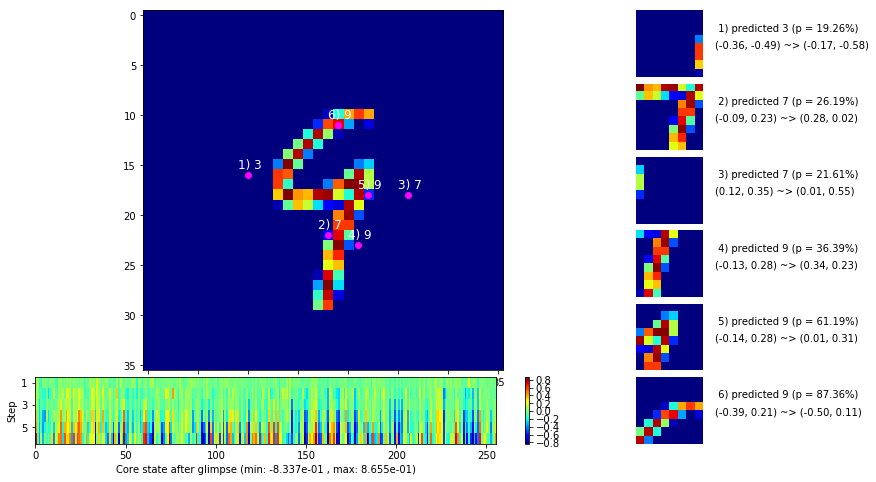

 b   2500/  3000 >> 133.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.59 | grad inf norm:  1.568
       Weights || abs max:  0.81 (38901.84) | mean: -2.44e-03 ( 0.21) | var: 5.88e-03 (30227.04)
        Biases || abs max:  0.88 ( 4820.27) | mean:  2.98e-02 ( 4.77) | var: 2.22e-03 (277566.53)
                  class loss: 0.338 | steps: 2.522 | reward:  0.889 | acc.: 88.88%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.56 | grad inf norm:  1.547
       Weights || abs max:  0.81 (37409.52) | mean: -2.44e-03 ( 0.22) | var: 5.88e-03 (21583.71)
        Biases || abs max:  0.88 ( 6734.45) | mean:  2.98e-02 ( 4.82) | var: 2.23e-03 (1345653.38)
                  class loss: 0.338 | steps: 2.537 | reward:  0.889 | acc.: 88.94%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

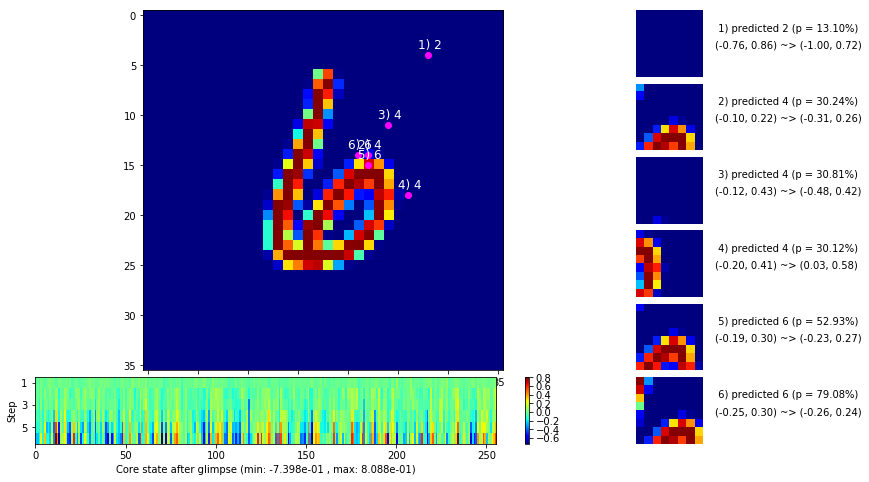

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


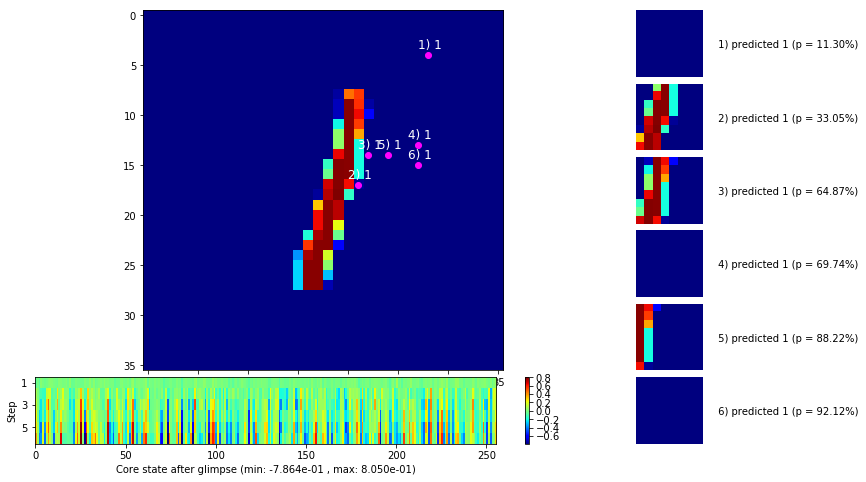


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


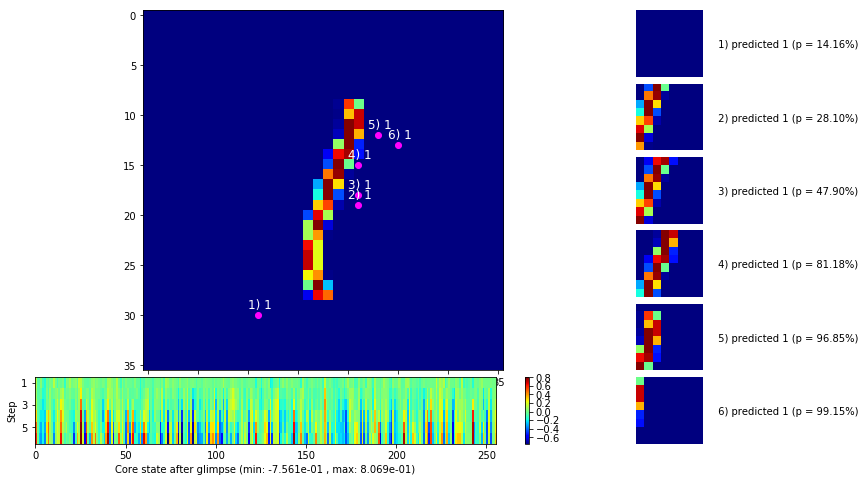

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


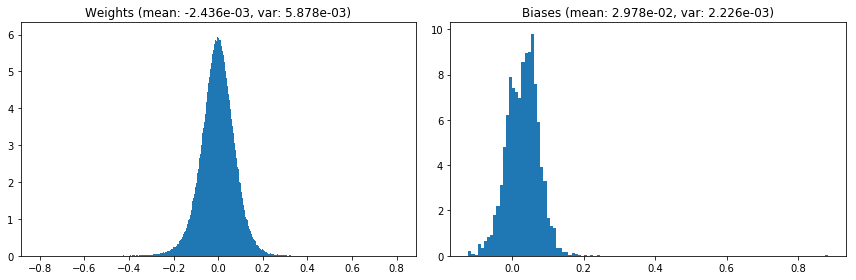

                                      Location network weights and biases


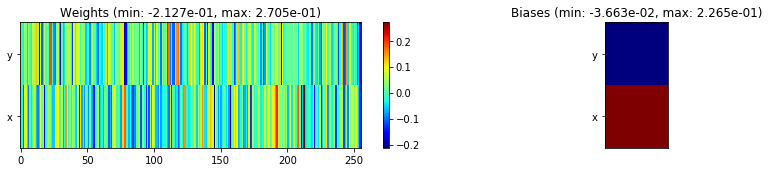

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.15 sec | TRAIN >> class loss: 0.3407 | steps:  2.524 :( | reward:  0.8891 :( | acc.: 88.908% :(
                          | VAL   >> class loss: 0.2899 | steps:  2.239    | reward:  0.9062 :( | acc.: 90.620% :(


Epoch  42/400) lr = 1e-05
 b    500/  3000 >> 141.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.56 | grad inf norm:  1.438
       Weights || abs max:  0.81 (133544.53) | mean: -2.44e-03 ( 0.37) | var: 5.88e-03 (4743091.00)
        Biases || abs max:  0.88 ( 7420.28) | mean:  2.98e-02 ( 5.36) | var: 2.23e-03 (2069731.88)
                  class loss: 0.333 | steps: 2.506 | reward:  0.892 | acc.: 89.16%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.74 | grad inf norm:  1.585
       Weights || abs max:  0.81 (32500.08) | mean: -2.44e-03 ( 0.20) 

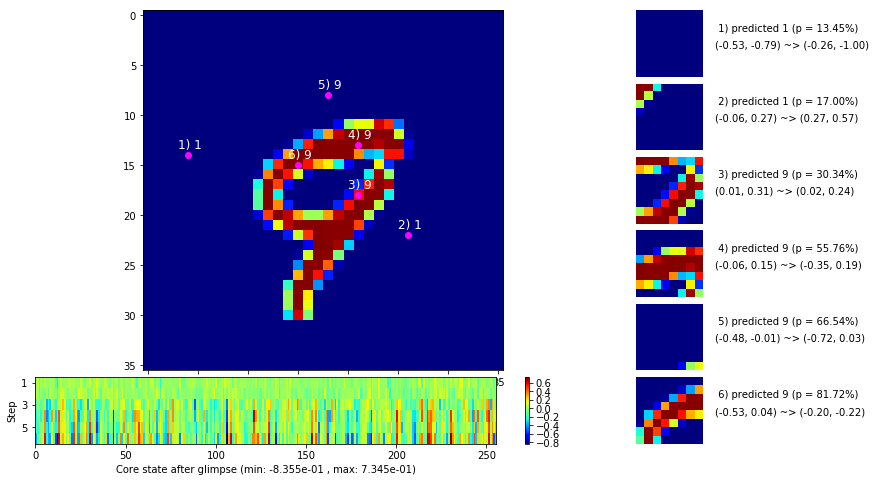

 b   1500/  3000 >> 134.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.51 | grad inf norm:  1.551
       Weights || abs max:  0.81 (57622.61) | mean: -2.43e-03 ( 0.25) | var: 5.88e-03 (155951.59)
        Biases || abs max:  0.88 ( 4620.23) | mean:  2.98e-02 ( 3.70) | var: 2.23e-03 (246142.17)
                  class loss: 0.326 | steps: 2.485 | reward:  0.894 | acc.: 89.40%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.60 | grad inf norm:  1.565
       Weights || abs max:  0.81 (91421.35) | mean: -2.43e-03 ( 0.30) | var: 5.88e-03 (1267768.12)
        Biases || abs max:  0.88 (15754.91) | mean:  2.98e-02 (11.36) | var: 2.23e-03 (10511711.00)
                  class loss: 0.340 | steps: 2.512 | reward:  0.890 | acc.: 88.96%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

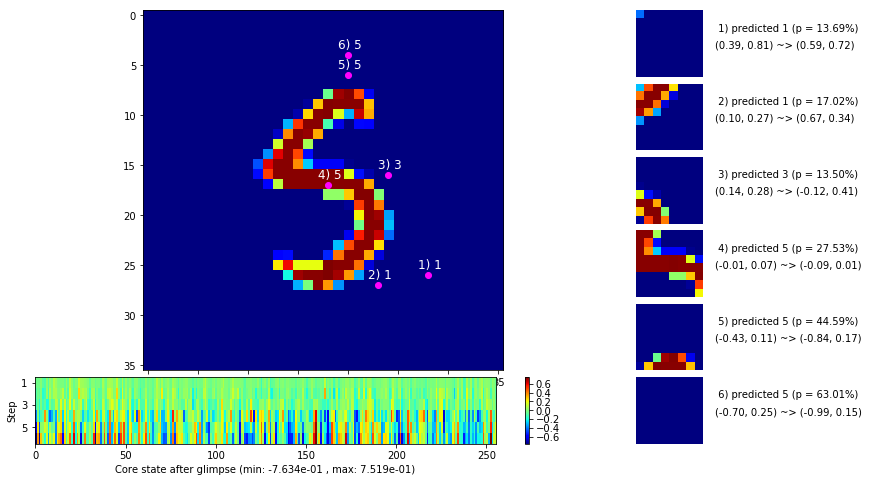

 b   2500/  3000 >> 135.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.59 | grad inf norm:  1.507
       Weights || abs max:  0.81 (85581.09) | mean: -2.43e-03 ( 0.29) | var: 5.89e-03 (783034.25)
        Biases || abs max:  0.88 ( 6117.44) | mean:  2.98e-02 ( 5.95) | var: 2.23e-03 (245105.47)
                  class loss: 0.334 | steps: 2.518 | reward:  0.889 | acc.: 88.94%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.65 | grad inf norm:  1.533
       Weights || abs max:  0.81 (137487.77) | mean: -2.44e-03 ( 0.38) | var: 5.89e-03 (5909153.00)
        Biases || abs max:  0.88 (16158.10) | mean:  2.98e-02 ( 9.06) | var: 2.23e-03 (20695230.00)
                  class loss: 0.352 | steps: 2.529 | reward:  0.885 | acc.: 88.54%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

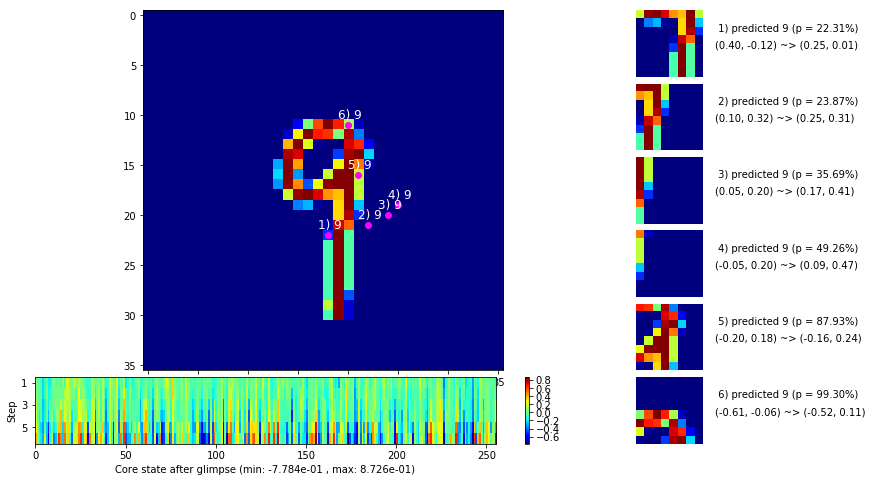

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


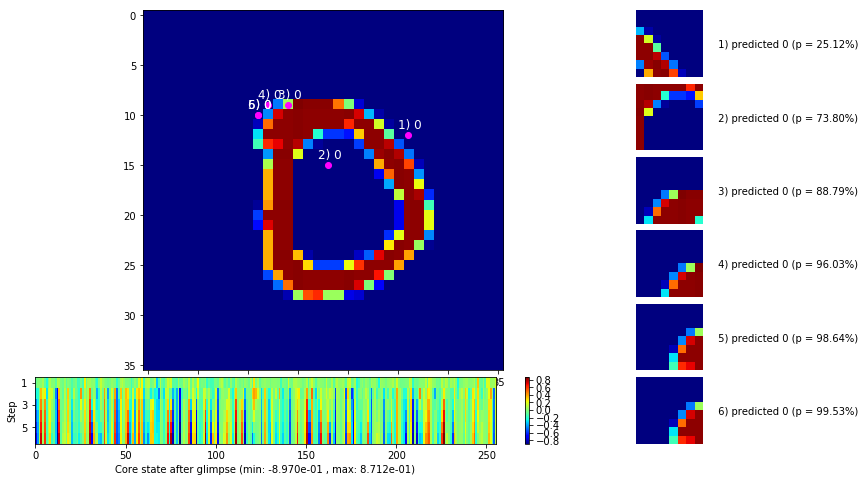


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


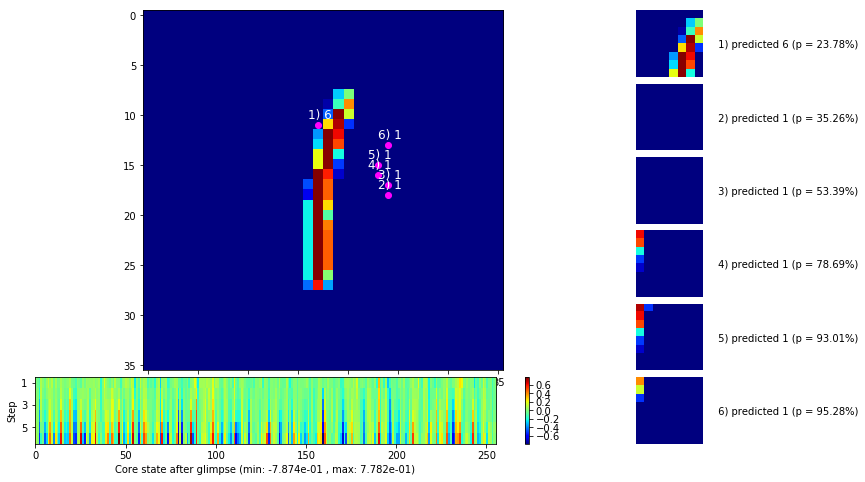

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


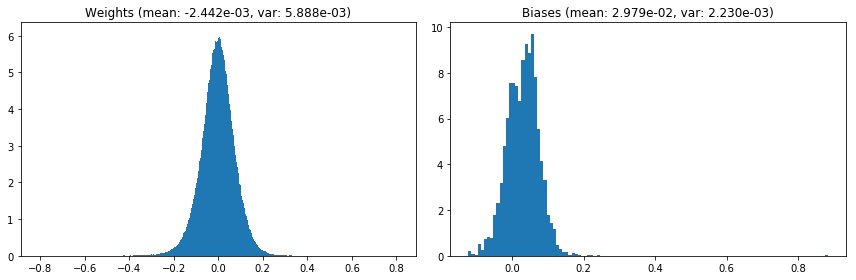

                                      Location network weights and biases


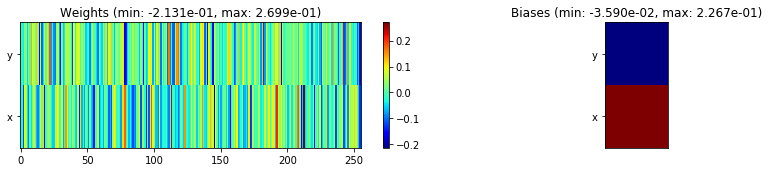

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.74 sec | TRAIN >> class loss: 0.3385 | steps:  2.509    | reward:  0.8894 :( | acc.: 88.942% :(
                          | VAL   >> class loss: 0.2861 | steps:  2.265 :( | reward:  0.9036 :( | acc.: 90.360% :(


Epoch  43/400) lr = 1e-05
 b    500/  3000 >> 131.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.50 | grad inf norm:  1.539
       Weights || abs max:  0.81 (56738.00) | mean: -2.44e-03 ( 0.25) | var: 5.89e-03 (129087.91)
        Biases || abs max:  0.88 ( 8487.71) | mean:  2.98e-02 ( 6.61) | var: 2.23e-03 (997551.81)
                  class loss: 0.334 | steps: 2.532 | reward:  0.891 | acc.: 89.13%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.70 | grad inf norm:  1.580
       Weights || abs max:  0.81 (47143.82) | mean: -2.44e-03 ( 0.23) | v

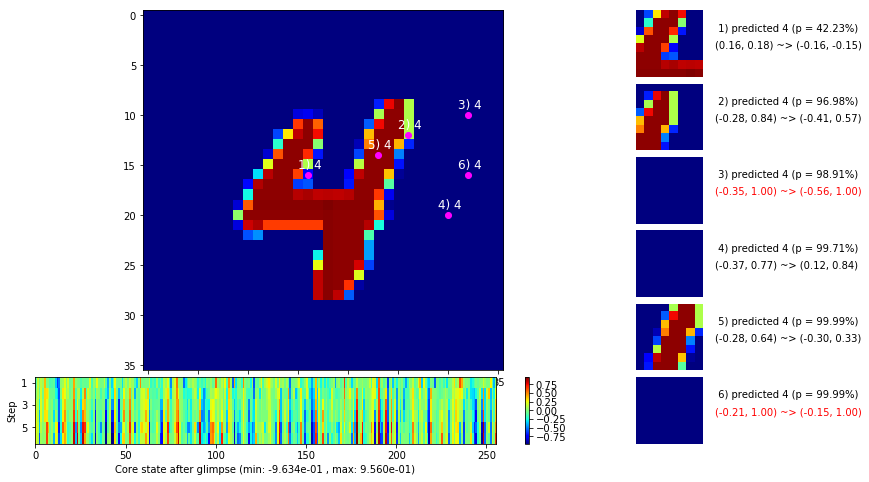

 b   1500/  3000 >> 133.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.61 | grad inf norm:  1.610
       Weights || abs max:  0.81 (62714.60) | mean: -2.44e-03 ( 0.26) | var: 5.89e-03 (227652.25)
        Biases || abs max:  0.88 ( 7969.66) | mean:  2.98e-02 ( 7.33) | var: 2.23e-03 (858171.56)
                  class loss: 0.339 | steps: 2.506 | reward:  0.887 | acc.: 88.67%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 141.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.69 | grad inf norm:  1.585
       Weights || abs max:  0.81 (43877.77) | mean: -2.44e-03 ( 0.23) | var: 5.89e-03 (25961.80)
        Biases || abs max:  0.88 ( 3292.26) | mean:  2.98e-02 ( 4.15) | var: 2.23e-03 (66917.64)
                  class loss: 0.343 | steps: 2.522 | reward:  0.887 | acc.: 88.74%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

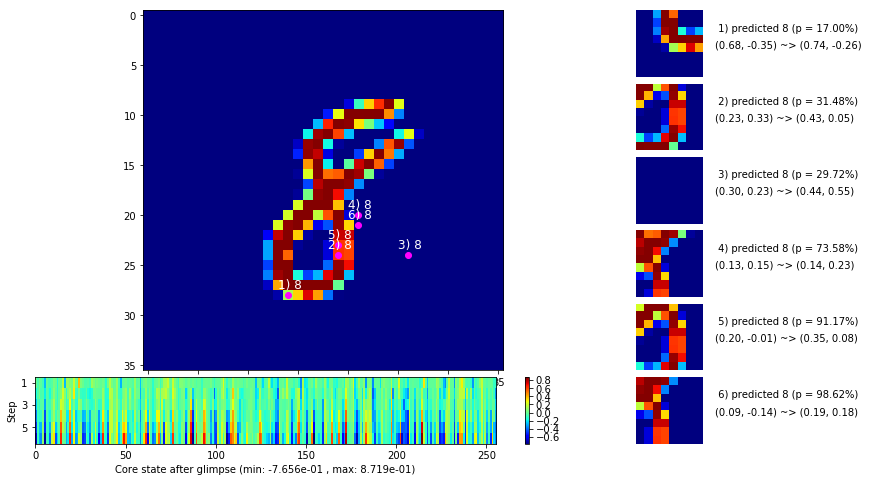

 b   2500/  3000 >> 135.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.47 | grad inf norm:  1.459
       Weights || abs max:  0.81 (67027.78) | mean: -2.44e-03 ( 0.27) | var: 5.90e-03 (329516.25)
        Biases || abs max:  0.88 ( 7291.72) | mean:  2.98e-02 ( 6.11) | var: 2.24e-03 (625348.31)
                  class loss: 0.321 | steps: 2.477 | reward:  0.895 | acc.: 89.50%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.55 | grad inf norm:  1.497
       Weights || abs max:  0.81 (498484.31) | mean: -2.43e-03 ( 0.99) | var: 5.90e-03 (175293088.00)
        Biases || abs max:  0.88 ( 2566.83) | mean:  2.99e-02 ( 3.01) | var: 2.24e-03 (63178.49)
                  class loss: 0.325 | steps: 2.492 | reward:  0.892 | acc.: 89.23%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

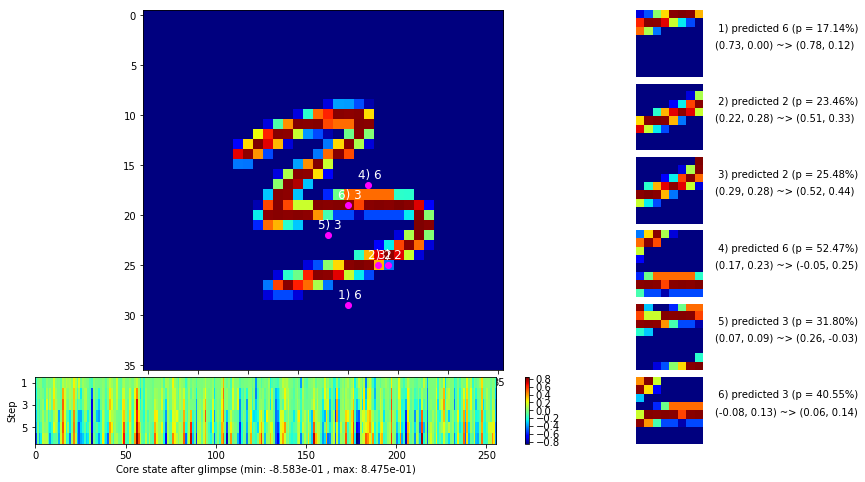

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


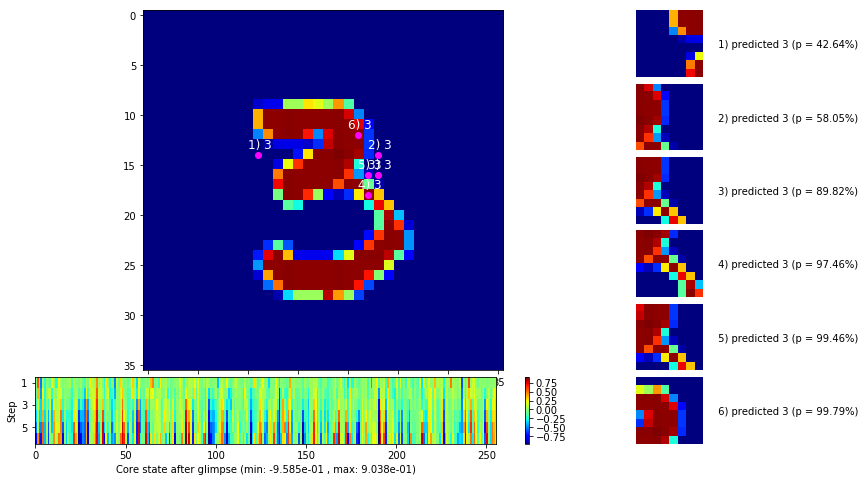


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


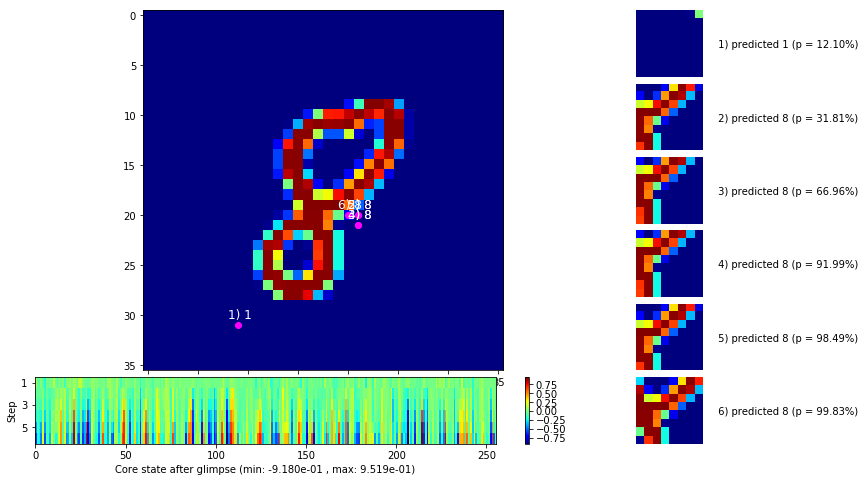

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


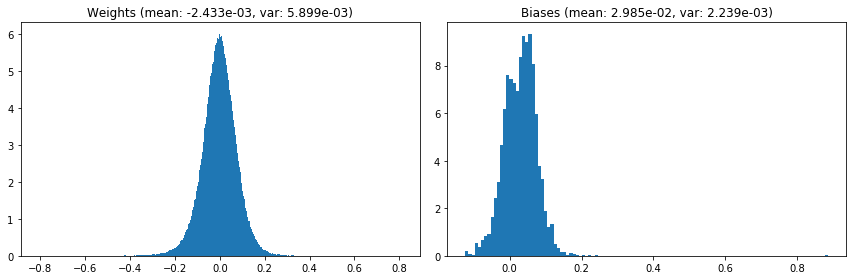

                                      Location network weights and biases


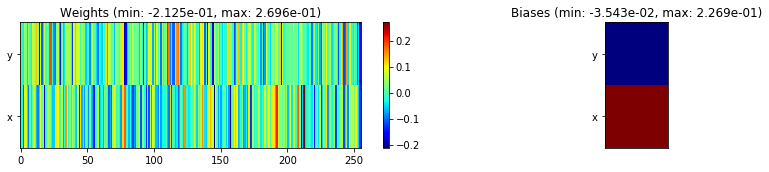

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.31 sec | TRAIN >> class loss: 0.3327 | steps:  2.502    | reward:  0.8901 :( | acc.: 89.007% :(
                          | VAL   >> class loss: 0.2766 | steps:  2.243 :( | reward:  0.9082 :( | acc.: 90.820% :(


Epoch  44/400) lr = 1e-05
 b    500/  3000 >> 130.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.65 | grad inf norm:  1.573
       Weights || abs max:  0.81 (45089.45) | mean: -2.44e-03 ( 0.22) | var: 5.90e-03 (62128.53)
        Biases || abs max:  0.89 ( 3523.16) | mean:  2.99e-02 ( 3.09) | var: 2.24e-03 (339542.47)
                  class loss: 0.327 | steps: 2.512 | reward:  0.890 | acc.: 88.96%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.64 | grad inf norm:  1.553
       Weights || abs max:  0.81 (40902.03) | mean: -2.44e-03 ( 0.22) | va

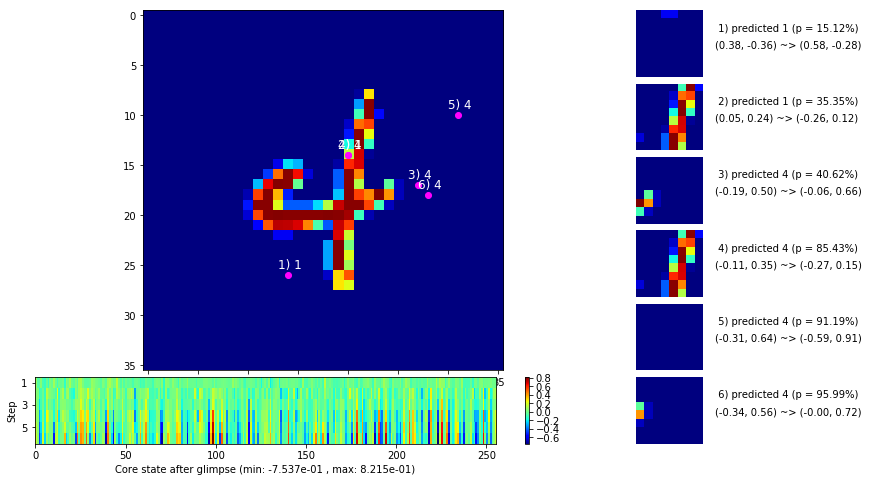

 b   1500/  3000 >> 133.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.68 | grad inf norm:  1.555
       Weights || abs max:  0.81 (92576.77) | mean: -2.44e-03 ( 0.31) | var: 5.90e-03 (1654890.88)
        Biases || abs max:  0.89 ( 2082.94) | mean:  2.99e-02 ( 2.79) | var: 2.24e-03 (51458.96)
                  class loss: 0.336 | steps: 2.507 | reward:  0.891 | acc.: 89.07%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.42 | grad inf norm:  1.532
       Weights || abs max:  0.81 (234934.23) | mean: -2.44e-03 ( 0.54) | var: 5.91e-03 (27590682.00)
        Biases || abs max:  0.89 ( 1747.92) | mean:  2.99e-02 ( 2.76) | var: 2.24e-03 (14191.96)
                  class loss: 0.310 | steps: 2.500 | reward:  0.900 | acc.: 90.00%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

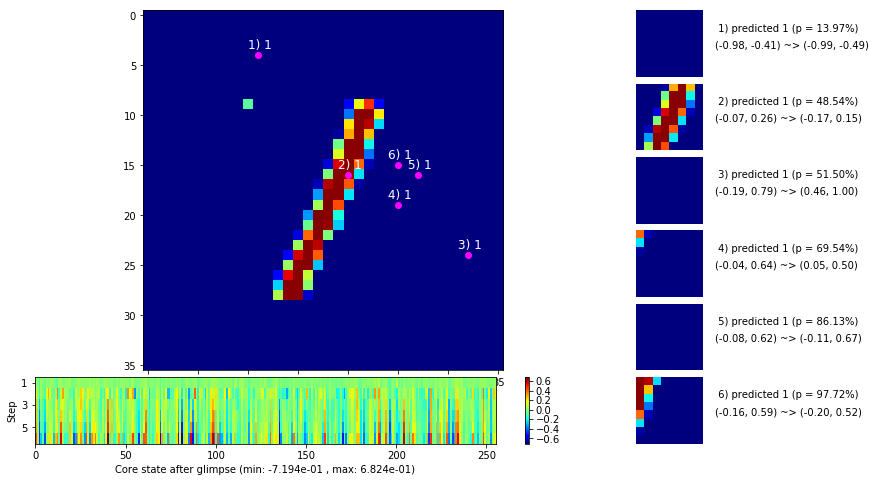

 b   2500/  3000 >> 132.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.75 | grad inf norm:  1.547
       Weights || abs max:  0.81 (43907.52) | mean: -2.44e-03 ( 0.22) | var: 5.91e-03 (46717.68)
        Biases || abs max:  0.89 ( 2781.21) | mean:  2.99e-02 ( 2.86) | var: 2.24e-03 (42676.57)
                  class loss: 0.337 | steps: 2.531 | reward:  0.887 | acc.: 88.74%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.75 | grad inf norm:  1.570
       Weights || abs max:  0.81 (383694.00) | mean: -2.45e-03 ( 0.79) | var: 5.91e-03 (84273704.00)
        Biases || abs max:  0.89 (18154.58) | mean:  2.99e-02 ( 8.83) | var: 2.24e-03 (22608440.00)
                  class loss: 0.345 | steps: 2.511 | reward:  0.887 | acc.: 88.75%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

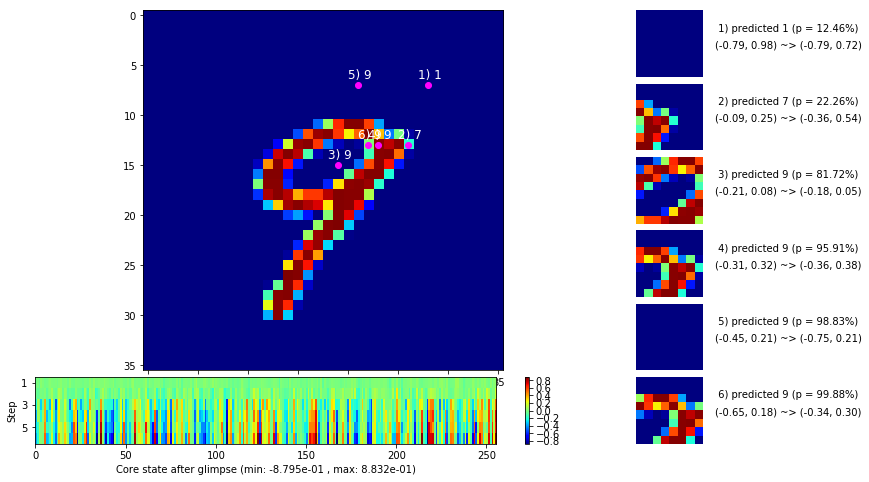

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


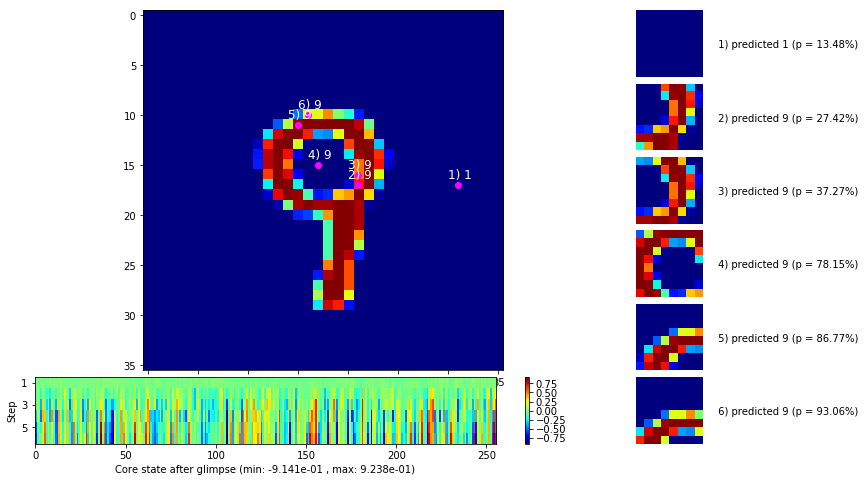


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


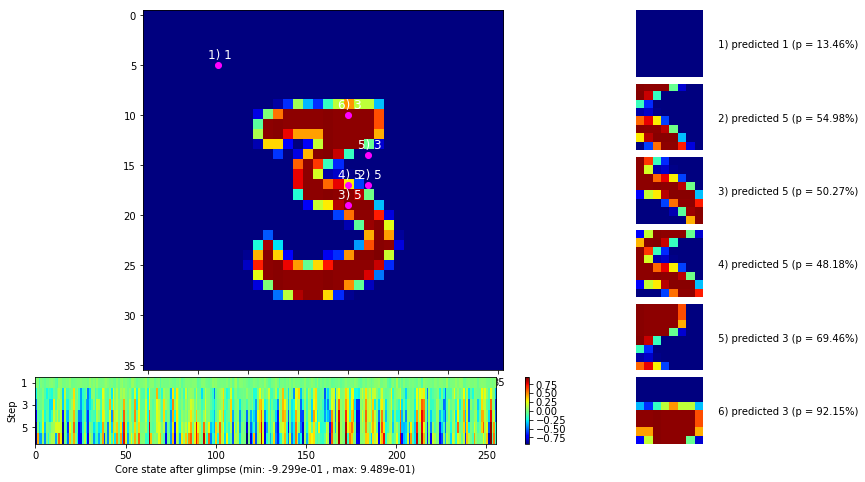

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


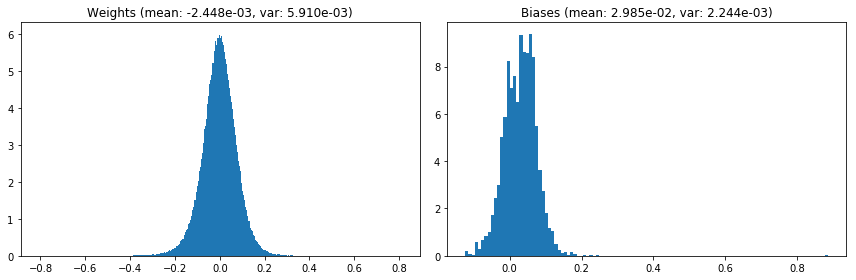

                                      Location network weights and biases


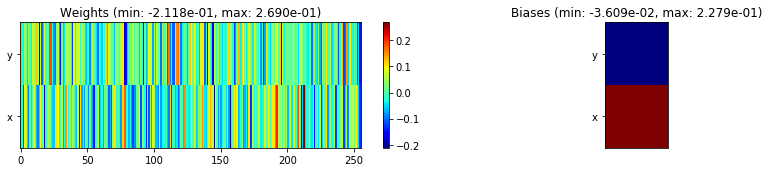

---------------------------------------------------------------------------------------------------------------
Elapsed time:  397.68 sec | TRAIN >> class loss: 0.3321 | steps:  2.516 :( | reward:  0.8905 :( | acc.: 89.053% :(
                          | VAL   >> class loss: 0.2715 | steps:  2.254 :( | reward:  0.9096 :( | acc.: 90.960% :(


Epoch  45/400) lr = 1e-05
 b    500/  3000 >> 138.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.69 | grad inf norm:  1.537
       Weights || abs max:  0.81 (57736.21) | mean: -2.45e-03 ( 0.24) | var: 5.91e-03 (356942.03)
        Biases || abs max:  0.89 ( 3258.64) | mean:  2.98e-02 ( 3.28) | var: 2.24e-03 (45743.98)
                  class loss: 0.345 | steps: 2.507 | reward:  0.887 | acc.: 88.72%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.51 | grad inf norm:  1.524
       Weights || abs max:  0.81 (79112.73) | mean: -2.45e-03 ( 0.27) | va

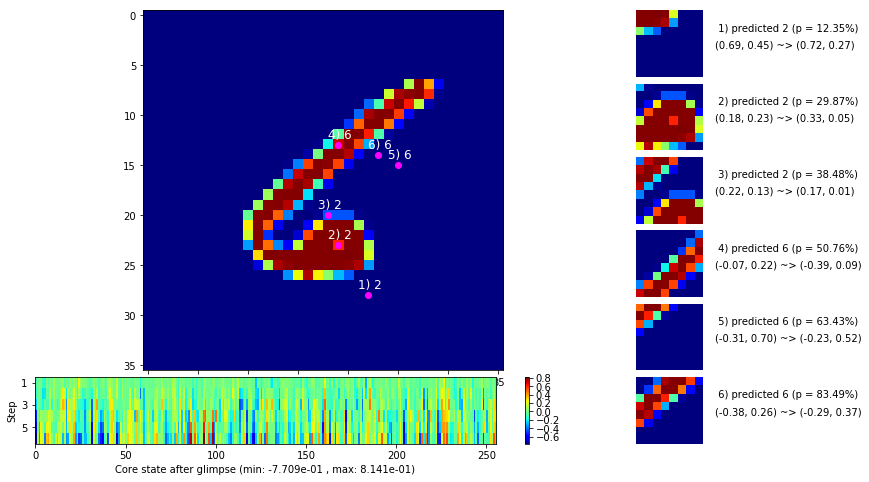

 b   1500/  3000 >> 133.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.67 | grad inf norm:  1.543
       Weights || abs max:  0.81 (66078.99) | mean: -2.44e-03 ( 0.26) | var: 5.91e-03 (160016.89)
        Biases || abs max:  0.89 (12787.78) | mean:  2.99e-02 ( 9.85) | var: 2.25e-03 (2124128.00)
                  class loss: 0.343 | steps: 2.537 | reward:  0.887 | acc.: 88.67%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.47 | grad inf norm:  1.516
       Weights || abs max:  0.81 (51814.68) | mean: -2.45e-03 ( 0.23) | var: 5.92e-03 (120058.77)
        Biases || abs max:  0.89 (11350.49) | mean:  2.99e-02 ( 7.60) | var: 2.25e-03 (6315471.50)
                  class loss: 0.335 | steps: 2.485 | reward:  0.893 | acc.: 89.30%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

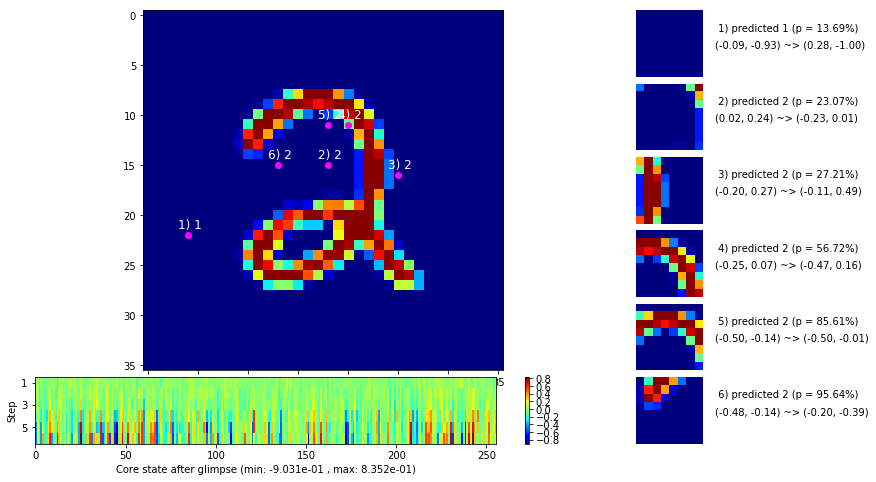

 b   2500/  3000 >> 134.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.49 | grad inf norm:  1.516
       Weights || abs max:  0.81 (38237.75) | mean: -2.44e-03 ( 0.21) | var: 5.92e-03 (35704.30)
        Biases || abs max:  0.89 ( 9011.28) | mean:  2.99e-02 ( 6.04) | var: 2.25e-03 (964884.31)
                  class loss: 0.328 | steps: 2.534 | reward:  0.892 | acc.: 89.23%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.74 | grad inf norm:  1.527
       Weights || abs max:  0.81 (65450.84) | mean: -2.44e-03 ( 0.26) | var: 5.92e-03 (76422.64)
        Biases || abs max:  0.89 (12508.44) | mean:  2.99e-02 ( 7.39) | var: 2.25e-03 (2110059.75)
                  class loss: 0.350 | steps: 2.531 | reward:  0.888 | acc.: 88.83%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

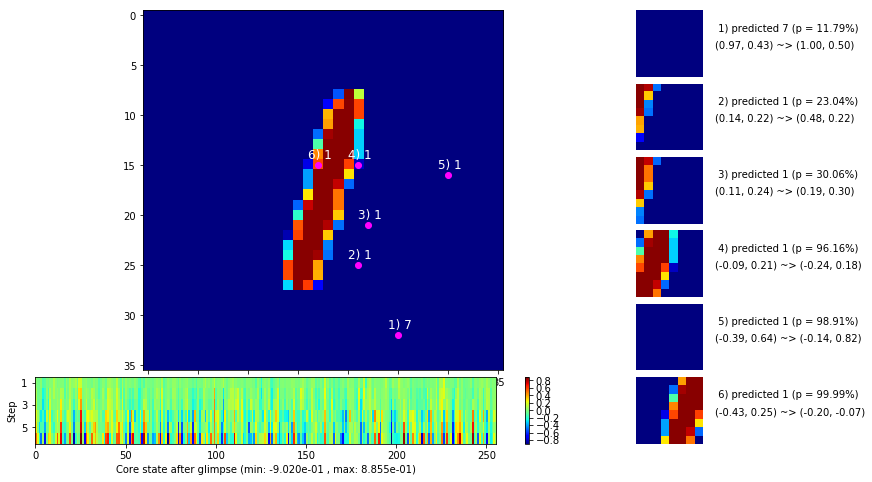

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


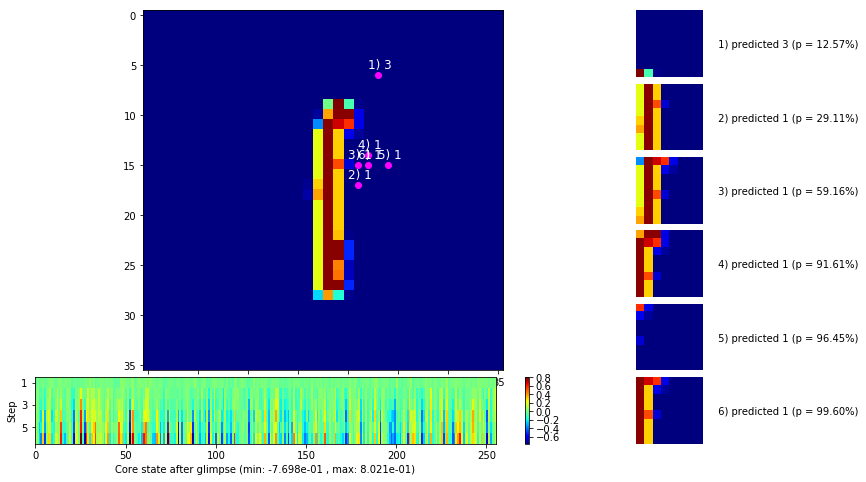


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


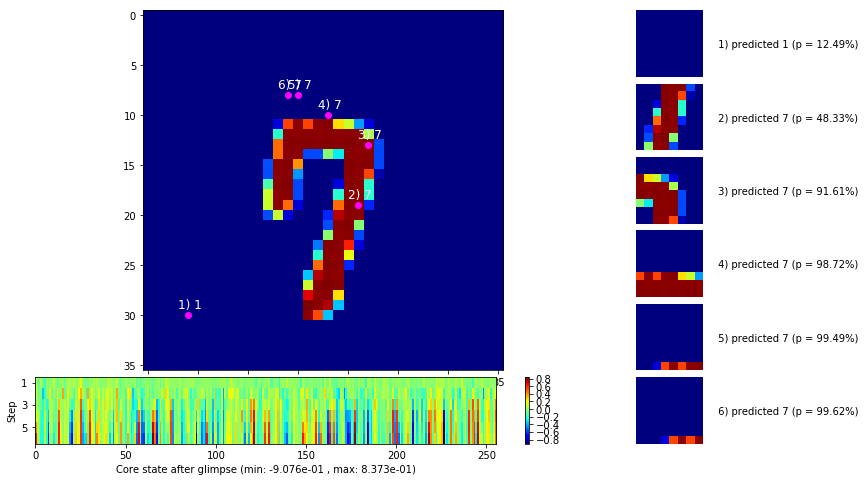

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


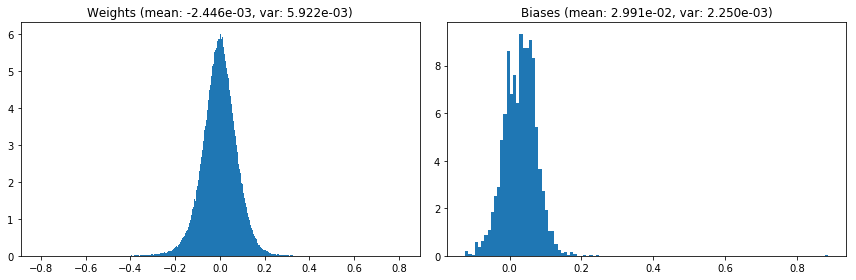

                                      Location network weights and biases


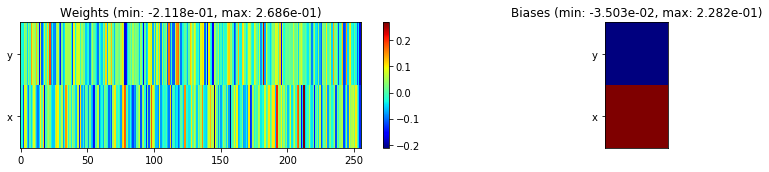

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.11 sec | TRAIN >> class loss: 0.3386 | steps:  2.513 :( | reward:  0.8897 :( | acc.: 88.972% :(
                          | VAL   >> class loss: 0.2822 | steps:  2.246 :( | reward:  0.9078 :( | acc.: 90.780% :(


Epoch  46/400) lr = 1e-05
 b    500/  3000 >> 132.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.77 | grad inf norm:  1.610
       Weights || abs max:  0.81 (55683.83) | mean: -2.44e-03 ( 0.24) | var: 5.92e-03 (105755.30)
        Biases || abs max:  0.89 ( 2784.65) | mean:  2.99e-02 ( 3.16) | var: 2.25e-03 (30684.12)
                  class loss: 0.332 | steps: 2.541 | reward:  0.886 | acc.: 88.56%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.70 | grad inf norm:  1.583
       Weights || abs max:  0.81 (73394.06) | mean: -2.44e-03 ( 0.28) | va

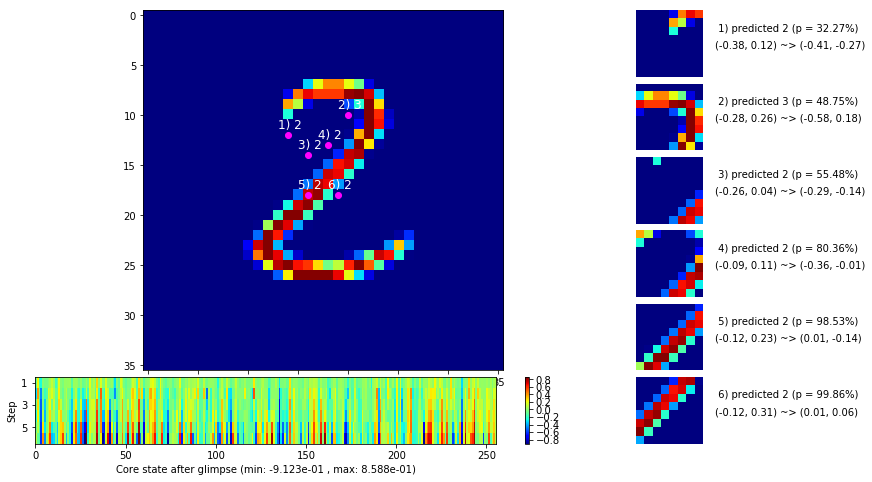

 b   1500/  3000 >> 134.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.68 | grad inf norm:  1.578
       Weights || abs max:  0.81 (52347.65) | mean: -2.44e-03 ( 0.24) | var: 5.93e-03 (85219.04)
        Biases || abs max:  0.89 ( 8894.16) | mean:  3.00e-02 ( 6.30) | var: 2.26e-03 (292829.31)
                  class loss: 0.320 | steps: 2.500 | reward:  0.890 | acc.: 89.05%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 139.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.74 | grad inf norm:  1.577
       Weights || abs max:  0.81 (87527.98) | mean: -2.44e-03 ( 0.29) | var: 5.93e-03 (1391181.88)
        Biases || abs max:  0.89 ( 5853.20) | mean:  3.00e-02 ( 4.52) | var: 2.25e-03 (376625.75)
                  class loss: 0.333 | steps: 2.508 | reward:  0.886 | acc.: 88.64%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

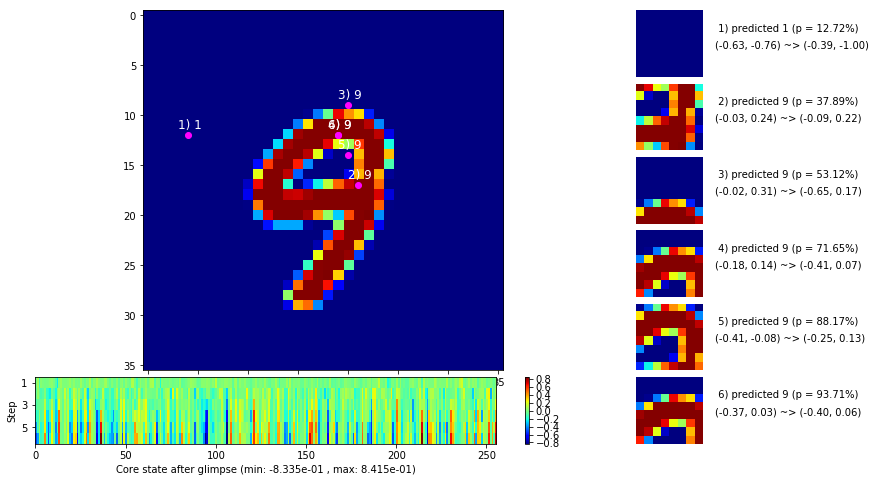

 b   2500/  3000 >> 137.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.87 | grad inf norm:  1.637
       Weights || abs max:  0.81 (44045.91) | mean: -2.45e-03 ( 0.22) | var: 5.93e-03 (32320.77)
        Biases || abs max:  0.89 ( 4390.52) | mean:  2.99e-02 ( 3.80) | var: 2.25e-03 (84365.88)
                  class loss: 0.353 | steps: 2.548 | reward:  0.879 | acc.: 87.95%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.45 | grad inf norm:  1.601
       Weights || abs max:  0.81 (335809.56) | mean: -2.45e-03 ( 0.70) | var: 5.93e-03 (72598856.00)
        Biases || abs max:  0.89 ( 7621.12) | mean:  2.99e-02 ( 5.34) | var: 2.26e-03 (534609.50)
                  class loss: 0.334 | steps: 2.501 | reward:  0.894 | acc.: 89.36%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

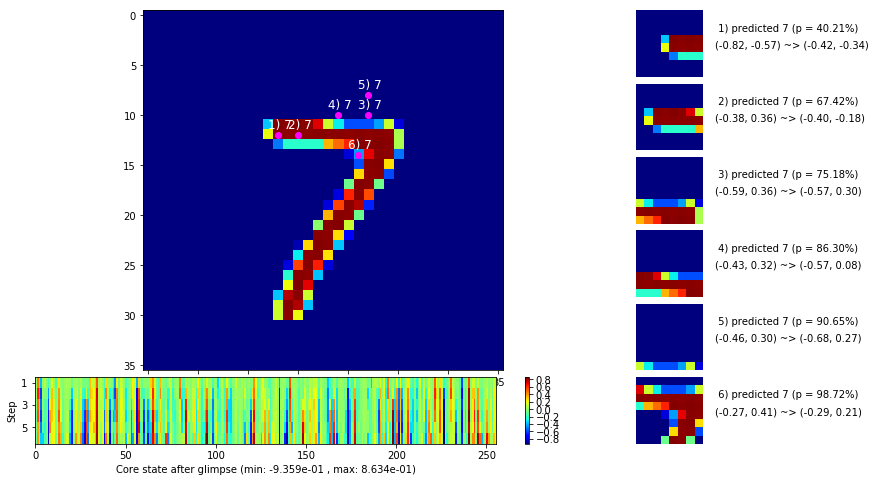

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


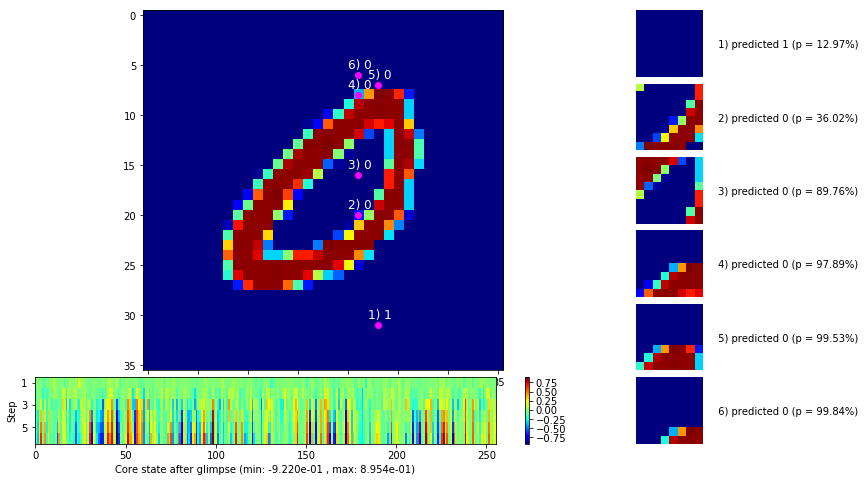


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


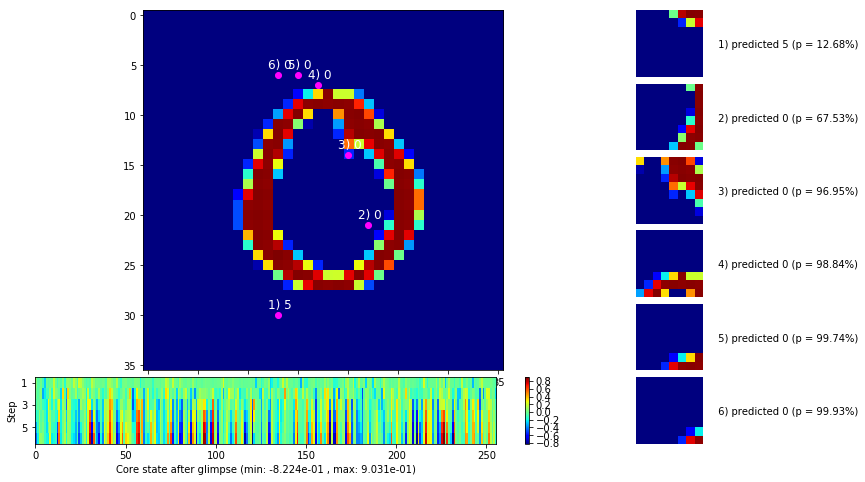

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


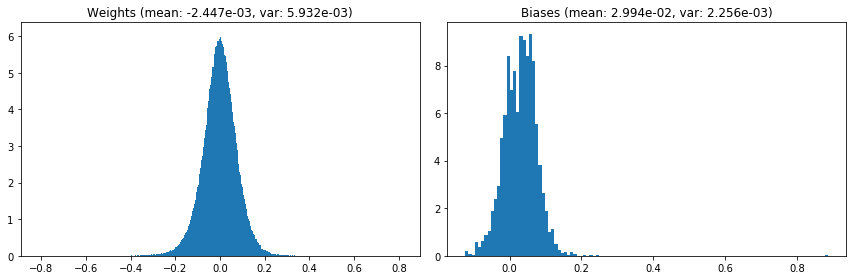

                                      Location network weights and biases


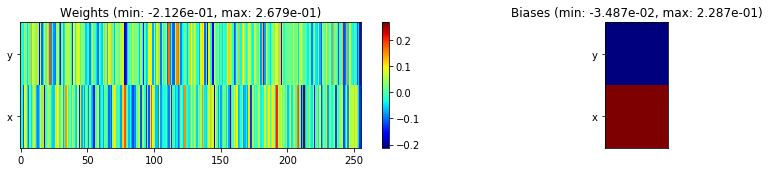

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.36 sec | TRAIN >> class loss: 0.3350 | steps:  2.522 :( | reward:  0.8874 :( | acc.: 88.745% :(
                          | VAL   >> class loss: 0.2844 | steps:  2.309 :( | reward:  0.9052 :( | acc.: 90.520% :(


Epoch  47/400) lr = 1e-05
 b    500/  3000 >> 132.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.77 | grad inf norm:  1.619
       Weights || abs max:  0.81 (57611.46) | mean: -2.45e-03 ( 0.24) | var: 5.93e-03 (170242.75)
        Biases || abs max:  0.89 (11287.74) | mean:  2.99e-02 ( 7.71) | var: 2.26e-03 (2186844.25)
                  class loss: 0.343 | steps: 2.534 | reward:  0.883 | acc.: 88.35%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.51 | grad inf norm:  1.520
       Weights || abs max:  0.81 (36951.29) | mean: -2.45e-03 ( 0.20) | 

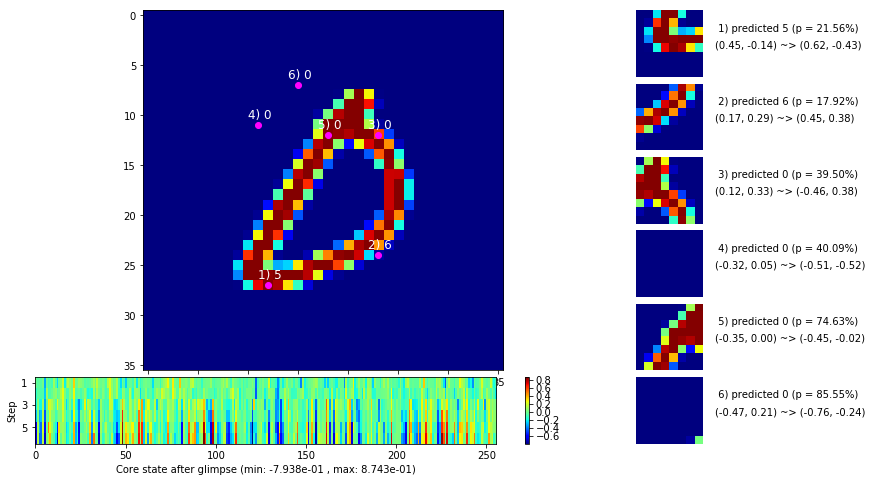

 b   1500/  3000 >> 133.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.65 | grad inf norm:  1.621
       Weights || abs max:  0.81 (84192.80) | mean: -2.45e-03 ( 0.29) | var: 5.94e-03 (504680.38)
        Biases || abs max:  0.89 (68527.77) | mean:  3.00e-02 (28.94) | var: 2.26e-03 (361488896.00)
                  class loss: 0.347 | steps: 2.507 | reward:  0.886 | acc.: 88.64%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.53 | grad inf norm:  1.497
       Weights || abs max:  0.81 (98780.09) | mean: -2.45e-03 ( 0.31) | var: 5.94e-03 (1671505.62)
        Biases || abs max:  0.89 ( 4347.52) | mean:  3.00e-02 ( 3.79) | var: 2.26e-03 (91338.74)
                  class loss: 0.334 | steps: 2.500 | reward:  0.893 | acc.: 89.31%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

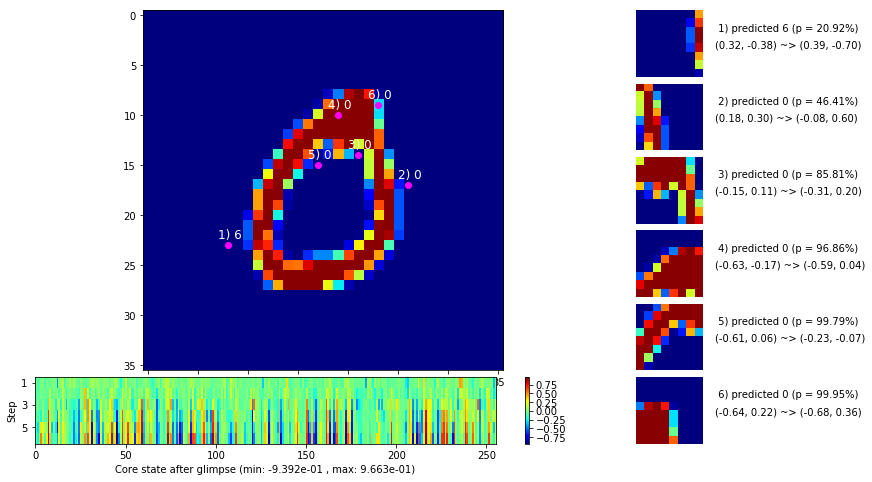

 b   2500/  3000 >> 134.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.58 | grad inf norm:  1.558
       Weights || abs max:  0.81 (85772.41) | mean: -2.44e-03 ( 0.29) | var: 5.94e-03 (1012634.75)
        Biases || abs max:  0.89 ( 1889.03) | mean:  3.00e-02 ( 2.75) | var: 2.26e-03 (32803.46)
                  class loss: 0.335 | steps: 2.522 | reward:  0.890 | acc.: 89.04%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.70 | grad inf norm:  1.536
       Weights || abs max:  0.81 (91851.12) | mean: -2.45e-03 ( 0.30) | var: 5.94e-03 (858192.62)
        Biases || abs max:  0.89 (53994.00) | mean:  3.00e-02 (42.61) | var: 2.26e-03 (896691712.00)
                  class loss: 0.350 | steps: 2.534 | reward:  0.886 | acc.: 88.61%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

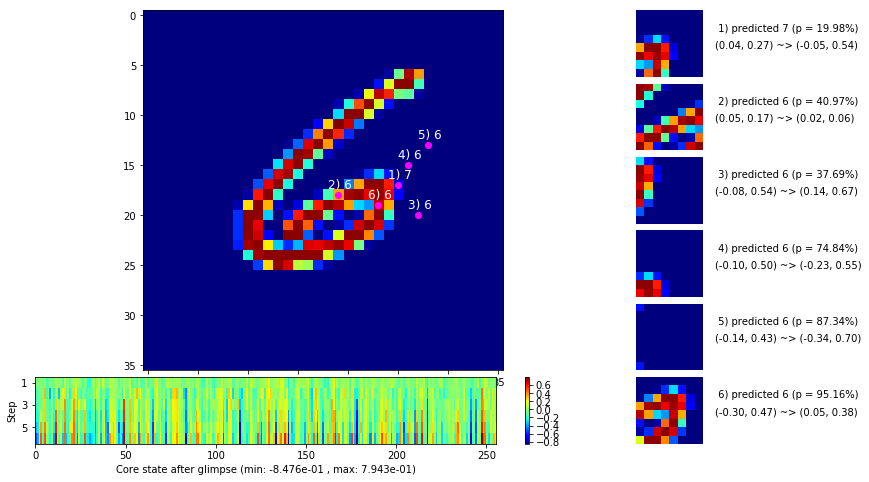

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


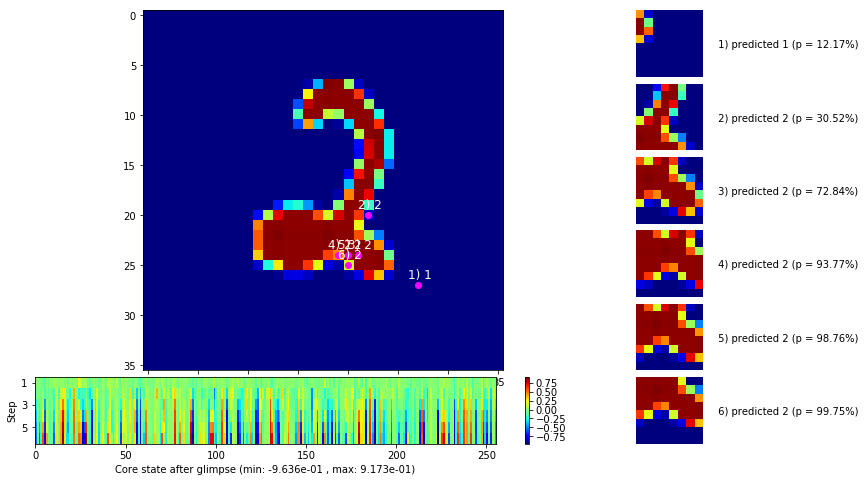


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


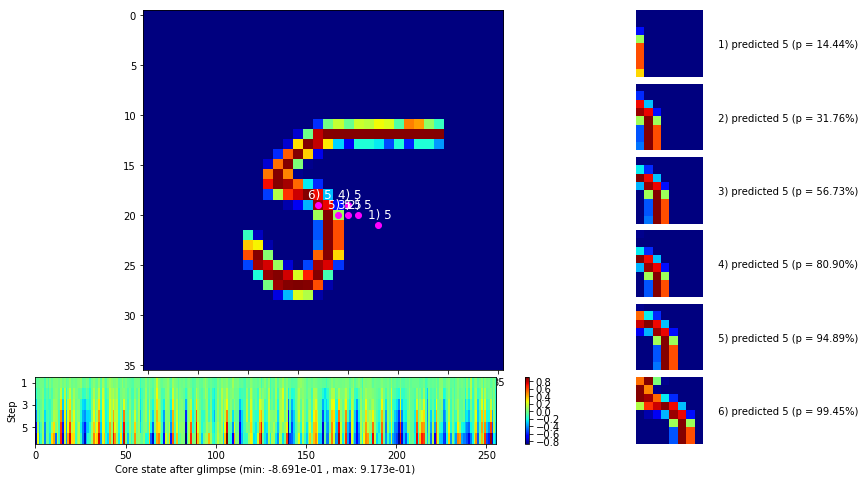

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


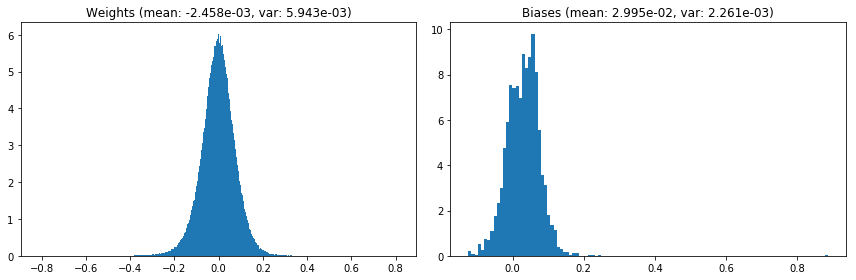

                                      Location network weights and biases


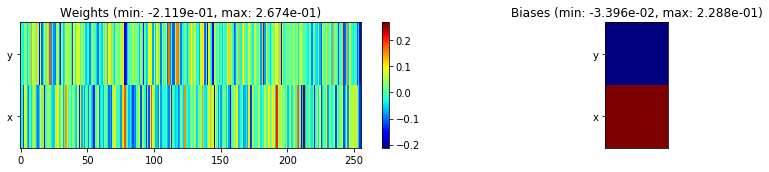

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.01 sec | TRAIN >> class loss: 0.3392 | steps:  2.516 :( | reward:  0.8891 :( | acc.: 88.913% :(
                          | VAL   >> class loss: 0.2807 | steps:  2.285 :( | reward:  0.9104 :( | acc.: 91.040% :(


Epoch  48/400) lr = 1e-05
 b    500/  3000 >> 142.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.56 | grad inf norm:  1.519
       Weights || abs max:  0.81 (72360.90) | mean: -2.46e-03 ( 0.27) | var: 5.94e-03 (448489.16)
        Biases || abs max:  0.89 ( 8288.48) | mean:  3.00e-02 ( 5.19) | var: 2.26e-03 (1069264.25)
                  class loss: 0.338 | steps: 2.497 | reward:  0.889 | acc.: 88.92%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.60 | grad inf norm:  1.537
       Weights || abs max:  0.81 (60295.57) | mean: -2.46e-03 ( 0.25) | 

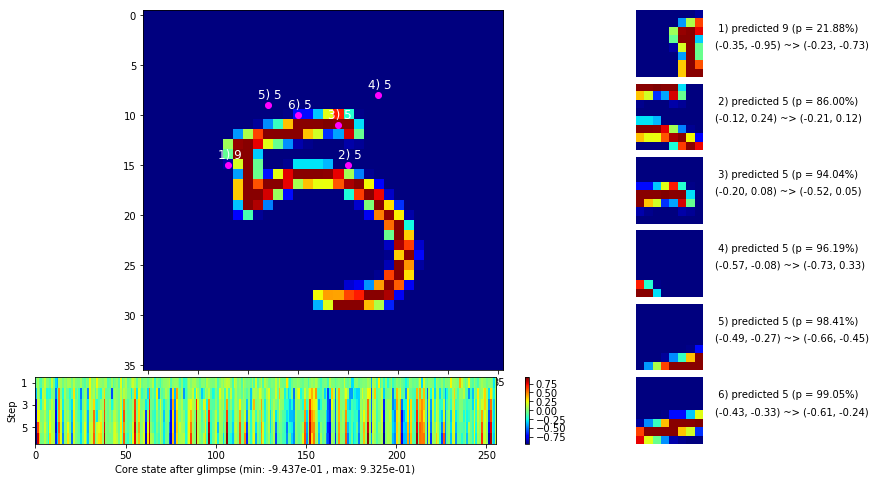

 b   1500/  3000 >> 134.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.61 | grad inf norm:  1.521
       Weights || abs max:  0.81 (84166.74) | mean: -2.45e-03 ( 0.29) | var: 5.95e-03 (1448829.88)
        Biases || abs max:  0.89 ( 7839.43) | mean:  3.00e-02 ( 5.89) | var: 2.27e-03 (279068.47)
                  class loss: 0.326 | steps: 2.491 | reward:  0.892 | acc.: 89.19%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 1.00e-05 | grad 2norm:  6.61 | grad inf norm:  1.590
       Weights || abs max:  0.81 (1244250.75) | mean: -2.44e-03 ( 2.22) | var: 5.95e-03 (1122103296.00)
        Biases || abs max:  0.89 ( 6838.55) | mean:  3.00e-02 ( 5.90) | var: 2.27e-03 (253544.70)
                  class loss: 0.337 | steps: 2.517 | reward:  0.892 | acc.: 89.24%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0

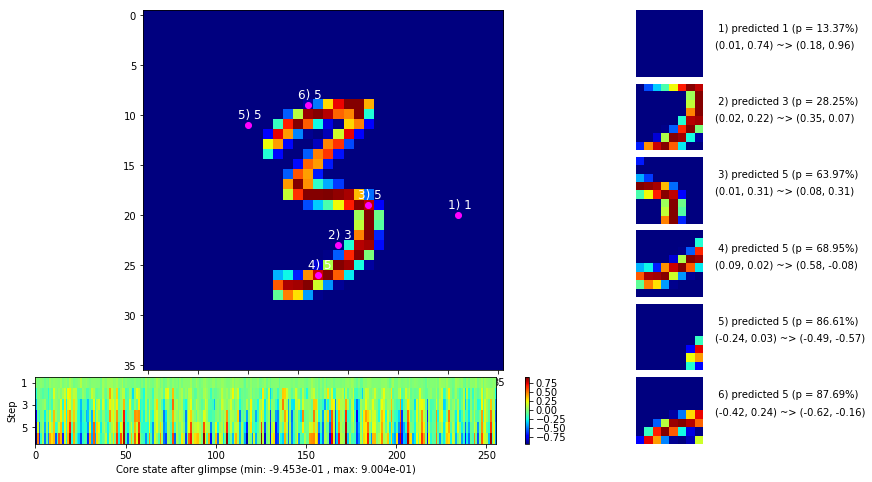

 b   2500/  3000 >> 133.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.75 | grad inf norm:  1.607
       Weights || abs max:  0.81 (33392.61) | mean: -2.44e-03 ( 0.20) | var: 5.95e-03 (26284.29)
        Biases || abs max:  0.89 ( 5802.27) | mean:  3.00e-02 ( 5.28) | var: 2.27e-03 (131088.75)
                  class loss: 0.341 | steps: 2.512 | reward:  0.888 | acc.: 88.78%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.54 | grad inf norm:  1.486
       Weights || abs max:  0.81 (29965.33) | mean: -2.44e-03 ( 0.19) | var: 5.95e-03 (11526.51)
        Biases || abs max:  0.89 (11022.32) | mean:  3.00e-02 ( 7.64) | var: 2.27e-03 (1577363.50)
                  class loss: 0.327 | steps: 2.515 | reward:  0.894 | acc.: 89.41%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

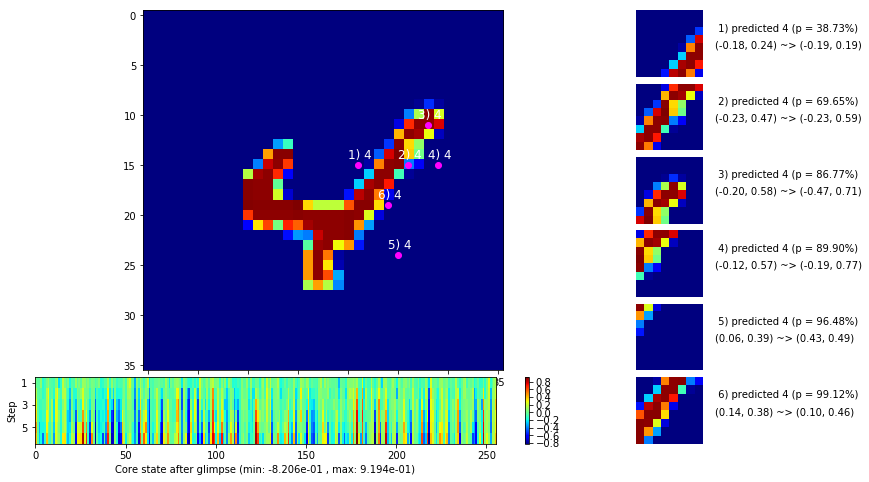

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


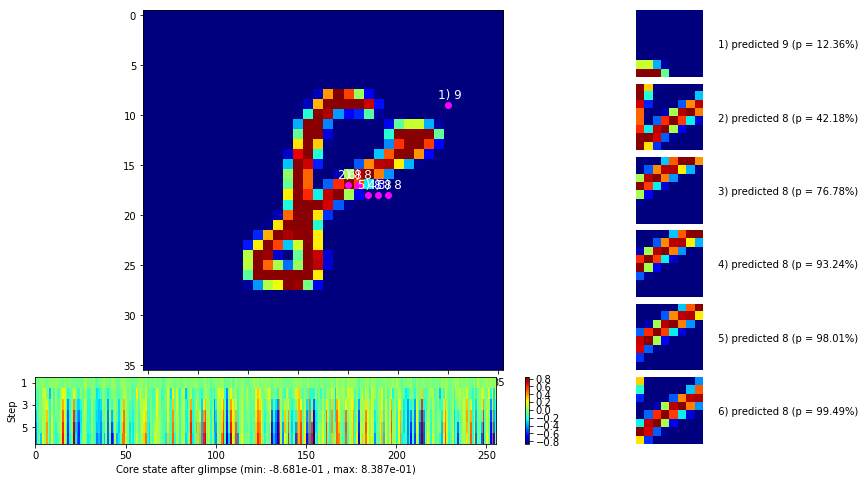


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


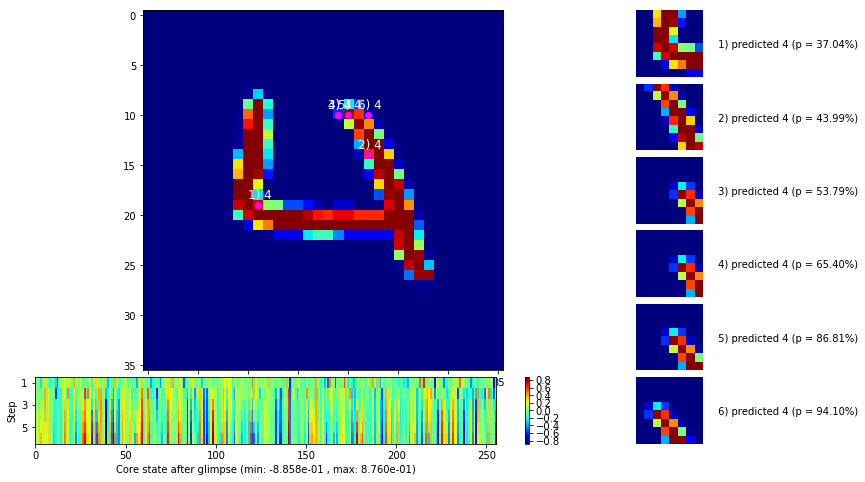

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


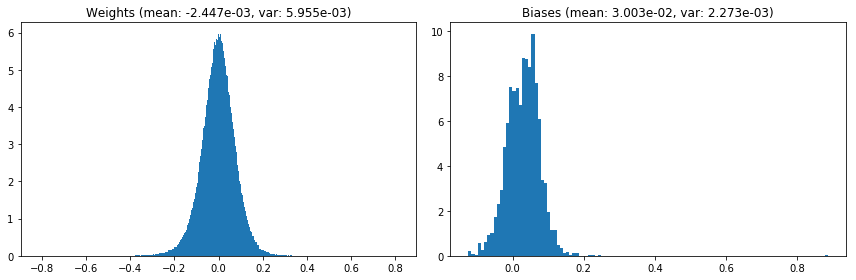

                                      Location network weights and biases


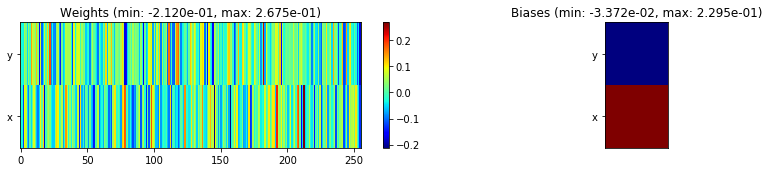

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.70 sec | TRAIN >> class loss: 0.3337 | steps:  2.508 :( | reward:  0.8913 :( | acc.: 89.128% :(
                          | VAL   >> class loss: 0.2896 | steps:  2.275 :( | reward:  0.9046 :( | acc.: 90.460% :(


Epoch  49/400) lr = 1e-05
 b    500/  3000 >> 132.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.67 | grad inf norm:  1.526
       Weights || abs max:  0.81 (47747.37) | mean: -2.45e-03 ( 0.22) | var: 5.95e-03 (87130.00)
        Biases || abs max:  0.89 ( 3497.55) | mean:  3.00e-02 ( 3.71) | var: 2.27e-03 (43576.08)
                  class loss: 0.342 | steps: 2.516 | reward:  0.888 | acc.: 88.76%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.48 | grad inf norm:  1.542
       Weights || abs max:  0.81 (48777.69) | mean: -2.45e-03 ( 0.23) | var

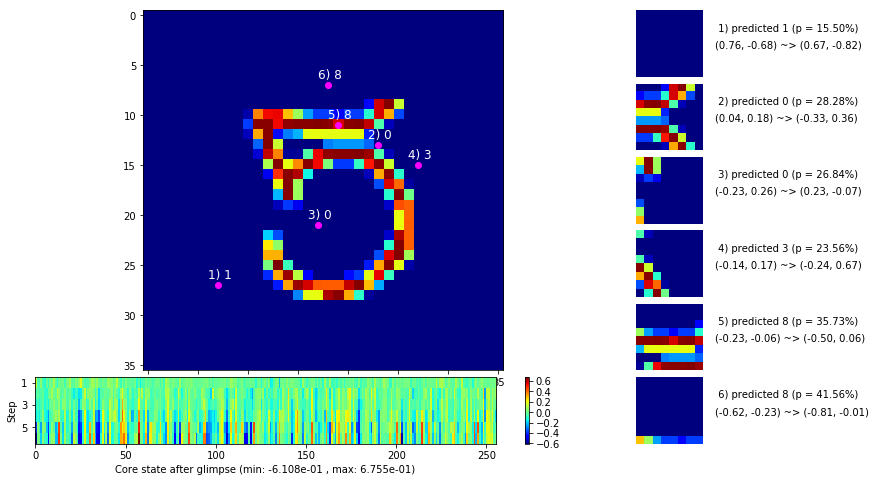

 b   1500/  3000 >> 135.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.59 | grad inf norm:  1.559
       Weights || abs max:  0.82 (599169.12) | mean: -2.45e-03 ( 1.14) | var: 5.96e-03 (236059600.00)
        Biases || abs max:  0.89 (13537.95) | mean:  3.00e-02 (10.88) | var: 2.27e-03 (2859513.50)
                  class loss: 0.339 | steps: 2.506 | reward:  0.891 | acc.: 89.06%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.57 | grad inf norm:  1.538
       Weights || abs max:  0.82 (58291.27) | mean: -2.45e-03 ( 0.25) | var: 5.96e-03 (84476.17)
        Biases || abs max:  0.89 (12005.97) | mean:  3.00e-02 ( 9.94) | var: 2.28e-03 (3127531.75)
                  class loss: 0.340 | steps: 2.492 | reward:  0.891 | acc.: 89.10%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

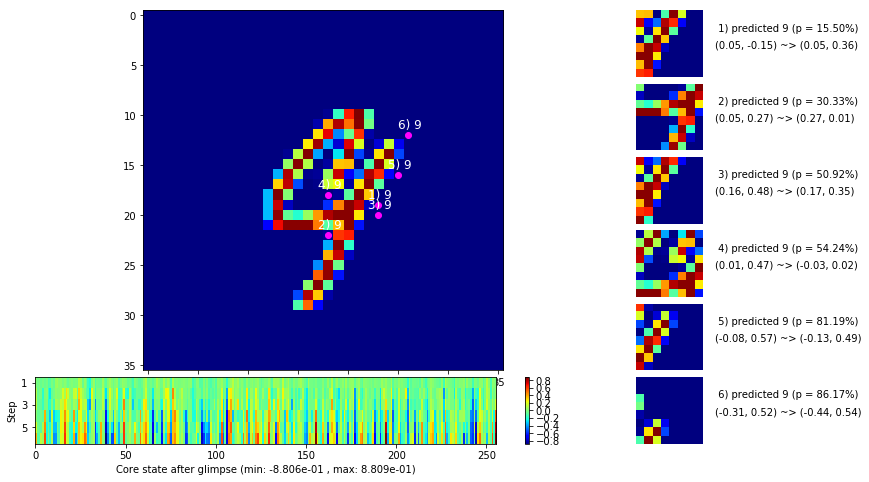

 b   2500/  3000 >> 139.7 ms/b | lr: 1.00e-05 | grad 2norm:  6.47 | grad inf norm:  1.508
       Weights || abs max:  0.82 (104369.01) | mean: -2.45e-03 ( 0.33) | var: 5.96e-03 (1545326.50)
        Biases || abs max:  0.89 ( 5692.09) | mean:  3.01e-02 ( 4.69) | var: 2.28e-03 (234290.48)
                  class loss: 0.325 | steps: 2.522 | reward:  0.896 | acc.: 89.58%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.70 | grad inf norm:  1.573
       Weights || abs max:  0.82 (48266.11) | mean: -2.45e-03 ( 0.23) | var: 5.96e-03 (123368.38)
        Biases || abs max:  0.89 ( 8530.39) | mean:  3.01e-02 ( 6.46) | var: 2.28e-03 (210910.69)
                  class loss: 0.336 | steps: 2.502 | reward:  0.888 | acc.: 88.82%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

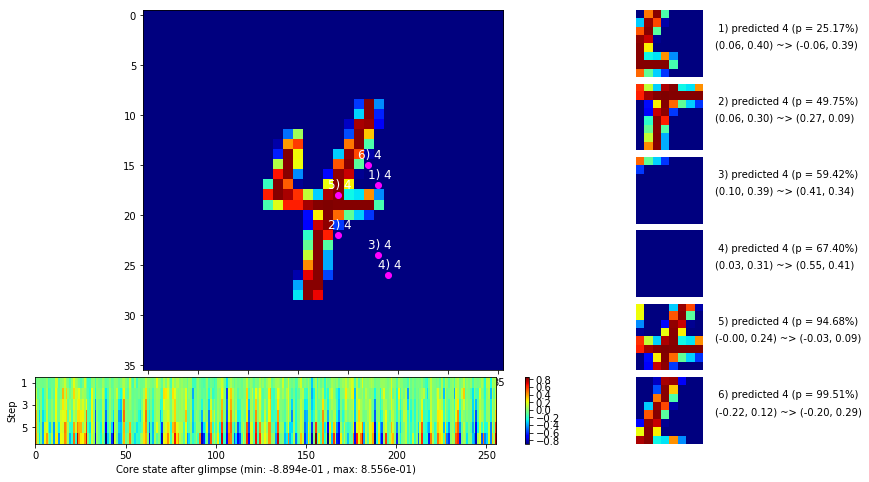

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


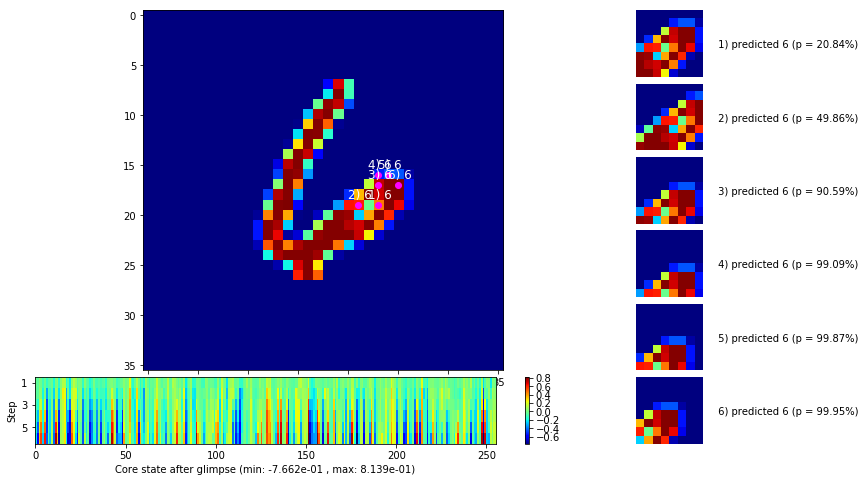


	Target class: 6  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


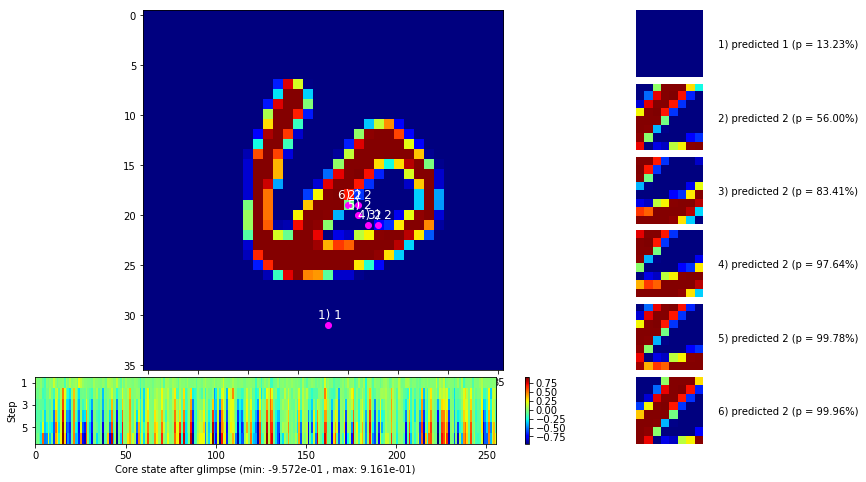

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


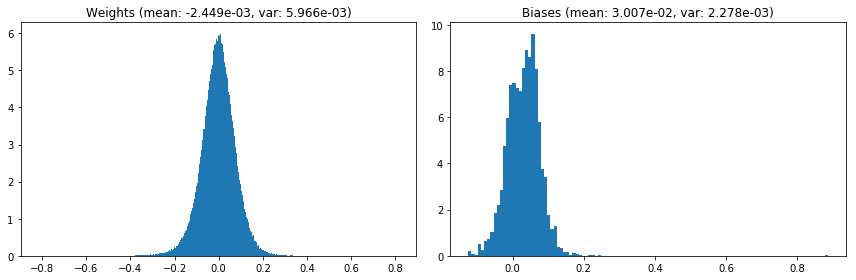

                                      Location network weights and biases


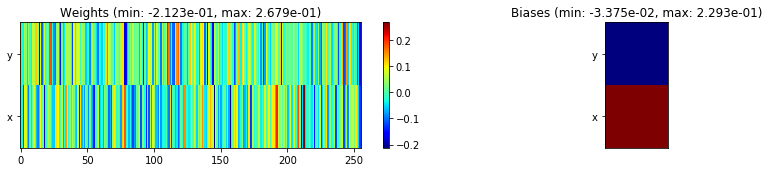

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.33 sec | TRAIN >> class loss: 0.3342 | steps:  2.507 :( | reward:  0.8912 :( | acc.: 89.118% :(
                          | VAL   >> class loss: 0.2827 | steps:  2.242 :( | reward:  0.9052 :( | acc.: 90.520% :(


Epoch  50/400) lr = 1e-05
 b    500/  3000 >> 132.6 ms/b | lr: 1.00e-05 | grad 2norm:  6.72 | grad inf norm:  1.582
       Weights || abs max:  0.82 (46511.10) | mean: -2.45e-03 ( 0.24) | var: 5.97e-03 (36434.45)
        Biases || abs max:  0.89 (17894.48) | mean:  3.01e-02 (13.05) | var: 2.28e-03 (5645665.50)
                  class loss: 0.338 | steps: 2.533 | reward:  0.885 | acc.: 88.54%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.0 ms/b | lr: 1.00e-05 | grad 2norm:  6.63 | grad inf norm:  1.576
       Weights || abs max:  0.82 (101761.12) | mean: -2.45e-03 ( 0.32) | 

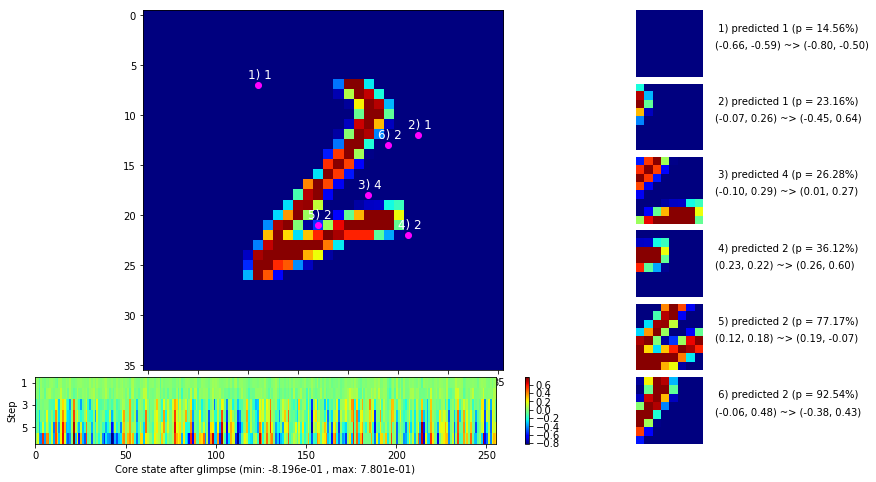

 b   1500/  3000 >> 134.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.58 | grad inf norm:  1.518
       Weights || abs max:  0.82 (30946.03) | mean: -2.46e-03 ( 0.19) | var: 5.97e-03 (16003.24)
        Biases || abs max:  0.89 (11183.01) | mean:  3.01e-02 ( 7.08) | var: 2.28e-03 (1777756.00)
                  class loss: 0.335 | steps: 2.524 | reward:  0.892 | acc.: 89.16%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 1.00e-05 | grad 2norm:  6.68 | grad inf norm:  1.504
       Weights || abs max:  0.82 (68635.52) | mean: -2.46e-03 ( 0.26) | var: 5.97e-03 (1143899.00)
        Biases || abs max:  0.89 (21526.83) | mean:  3.01e-02 (11.38) | var: 2.28e-03 (18790626.00)
                  class loss: 0.337 | steps: 2.539 | reward:  0.889 | acc.: 88.86%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.

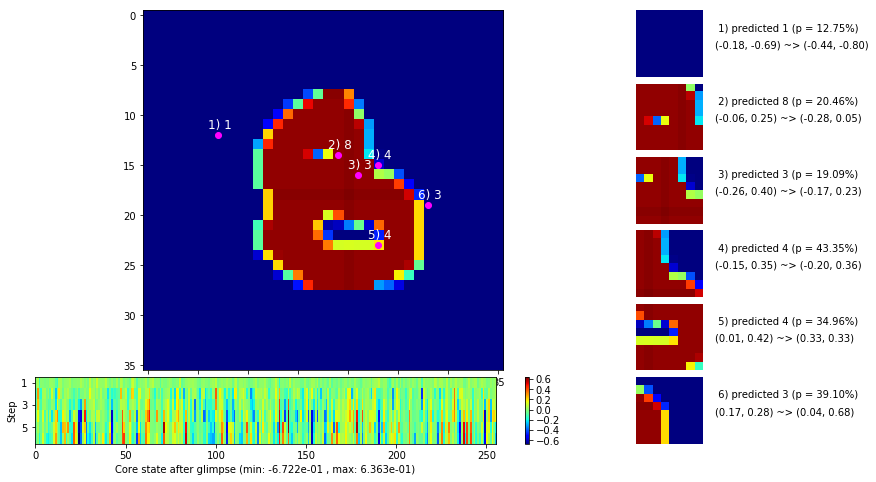

 b   2500/  3000 >> 133.4 ms/b | lr: 1.00e-05 | grad 2norm:  6.61 | grad inf norm:  1.558
       Weights || abs max:  0.82 (91068.73) | mean: -2.45e-03 ( 0.31) | var: 5.97e-03 (984815.38)
        Biases || abs max:  0.89 (16722.08) | mean:  3.01e-02 (10.45) | var: 2.29e-03 (4942113.50)
                  class loss: 0.332 | steps: 2.510 | reward:  0.893 | acc.: 89.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.72 | grad inf norm:  1.585
       Weights || abs max:  0.82 (61041.19) | mean: -2.45e-03 ( 0.25) | var: 5.98e-03 (243826.47)
        Biases || abs max:  0.89 (25318.12) | mean:  3.01e-02 (13.77) | var: 2.29e-03 (61941876.00)
                  class loss: 0.338 | steps: 2.556 | reward:  0.888 | acc.: 88.77%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

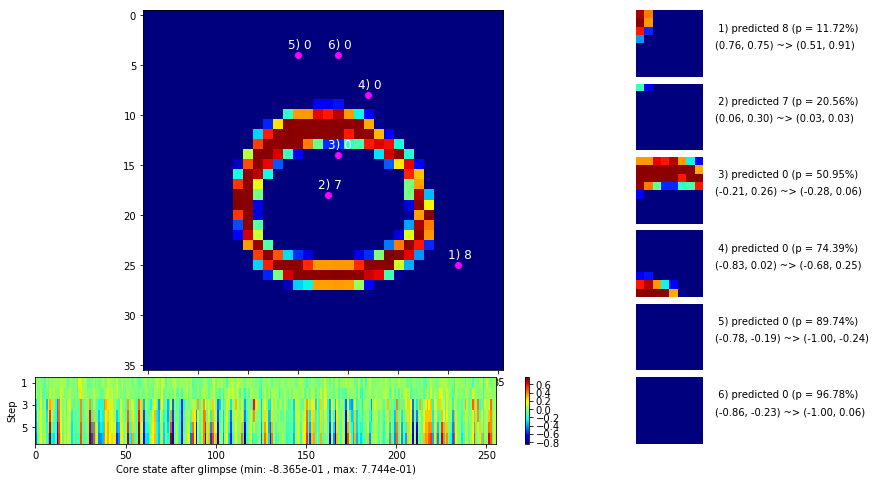

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


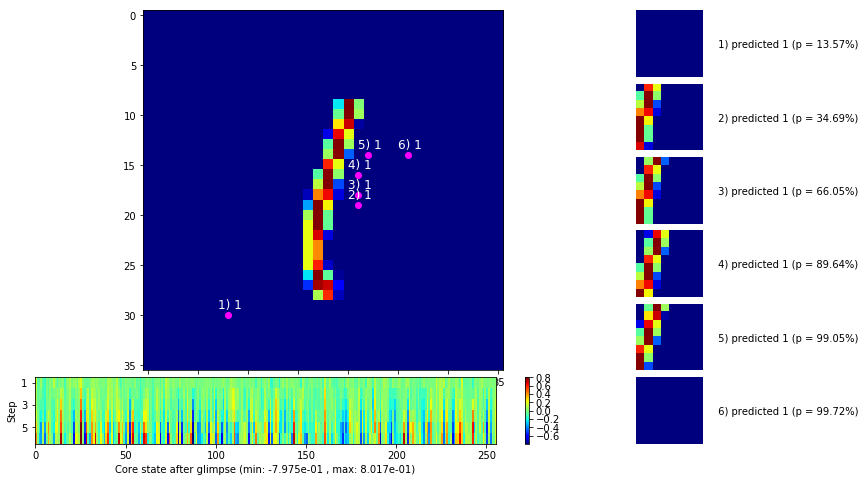


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


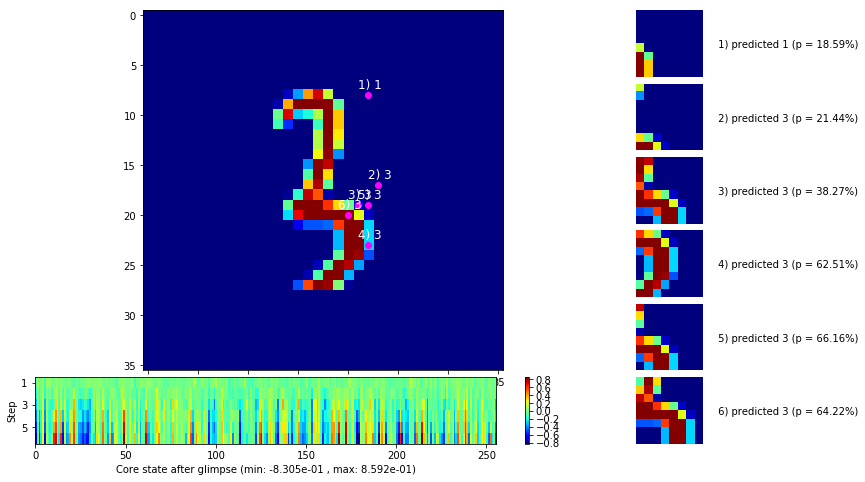

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


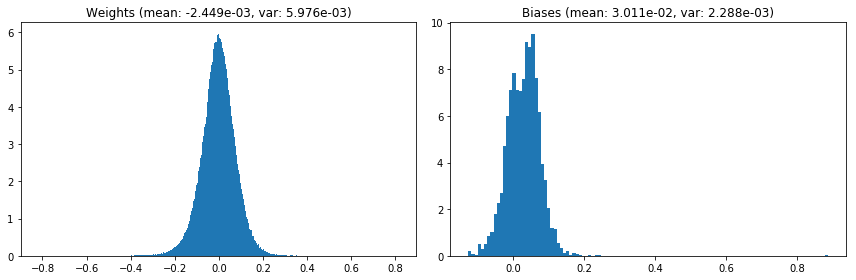

                                      Location network weights and biases


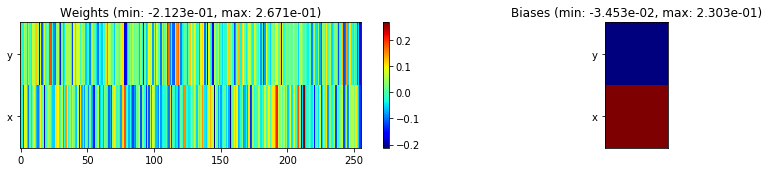

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.61 sec | TRAIN >> class loss: 0.3363 | steps:  2.528 :( | reward:  0.8892 :( | acc.: 88.918% :(
                          | VAL   >> class loss: 0.2867 | steps:  2.301 :( | reward:  0.9058 :( | acc.: 90.580% :(


Epoch  51/400) lr = 1e-05
 b    500/  3000 >> 142.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.67 | grad inf norm:  1.554
       Weights || abs max:  0.82 (60517.75) | mean: -2.45e-03 ( 0.26) | var: 5.98e-03 (214819.38)
        Biases || abs max:  0.89 ( 3720.73) | mean:  3.01e-02 ( 3.84) | var: 2.29e-03 (115520.68)
                  class loss: 0.339 | steps: 2.511 | reward:  0.888 | acc.: 88.79%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.3 ms/b | lr: 1.00e-05 | grad 2norm:  6.61 | grad inf norm:  1.510
       Weights || abs max:  0.82 (79962.64) | mean: -2.45e-03 ( 0.29) | v

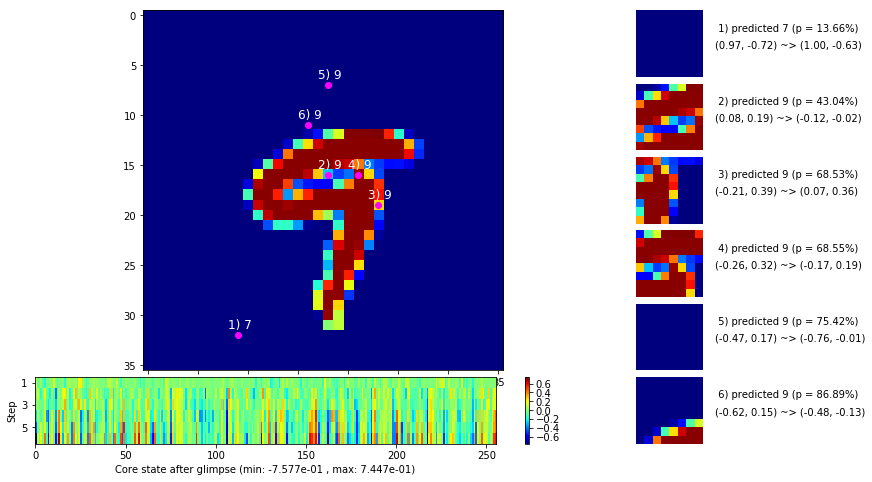

 b   1500/  3000 >> 133.1 ms/b | lr: 1.00e-05 | grad 2norm:  6.67 | grad inf norm:  1.626
       Weights || abs max:  0.82 (59676.89) | mean: -2.45e-03 ( 0.24) | var: 5.98e-03 (223975.11)
        Biases || abs max:  0.89 ( 5110.05) | mean:  3.01e-02 ( 5.15) | var: 2.29e-03 (757936.88)
                  class loss: 0.332 | steps: 2.503 | reward:  0.890 | acc.: 88.97%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.74 | grad inf norm:  1.581
       Weights || abs max:  0.82 (42483.95) | mean: -2.45e-03 ( 0.22) | var: 5.98e-03 (107141.62)
        Biases || abs max:  0.89 (12259.32) | mean:  3.01e-02 ( 9.26) | var: 2.29e-03 (3280243.25)
                  class loss: 0.345 | steps: 2.536 | reward:  0.887 | acc.: 88.70%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

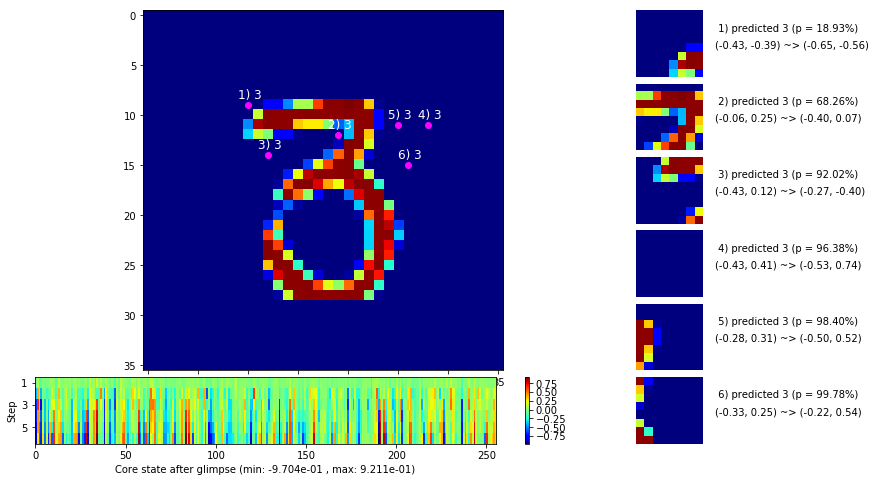

 b   2500/  3000 >> 132.5 ms/b | lr: 1.00e-05 | grad 2norm:  6.81 | grad inf norm:  1.677
       Weights || abs max:  0.82 (42040.86) | mean: -2.45e-03 ( 0.21) | var: 5.98e-03 (114187.87)
        Biases || abs max:  0.89 ( 5620.64) | mean:  3.01e-02 ( 6.22) | var: 2.29e-03 (135332.22)
                  class loss: 0.349 | steps: 2.522 | reward:  0.884 | acc.: 88.39%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.9 ms/b | lr: 1.00e-05 | grad 2norm:  6.80 | grad inf norm:  1.599
       Weights || abs max:  0.82 (53462.29) | mean: -2.46e-03 ( 0.23) | var: 5.99e-03 (138171.23)
        Biases || abs max:  0.89 ( 5838.70) | mean:  3.01e-02 ( 5.82) | var: 2.29e-03 (984457.75)
                  class loss: 0.346 | steps: 2.517 | reward:  0.886 | acc.: 88.59%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

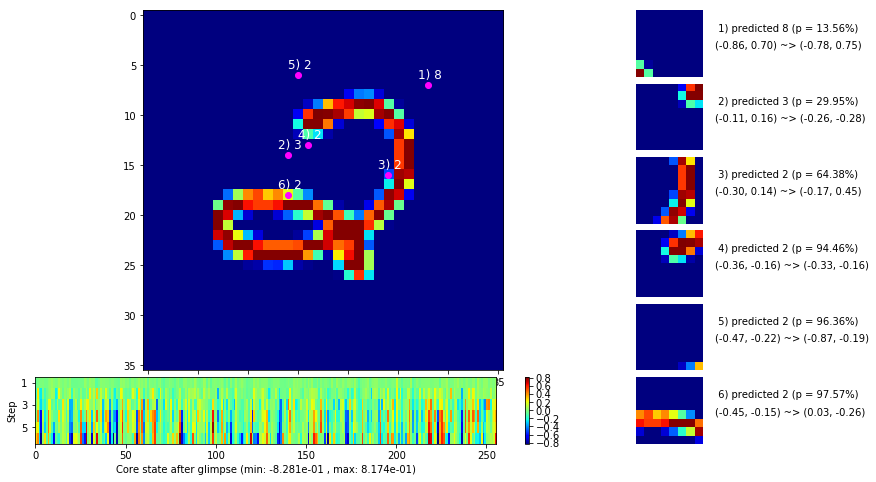

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


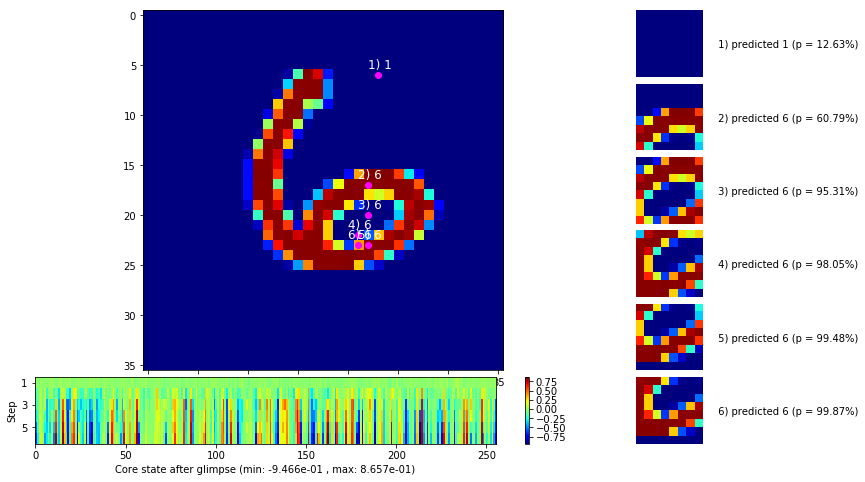


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


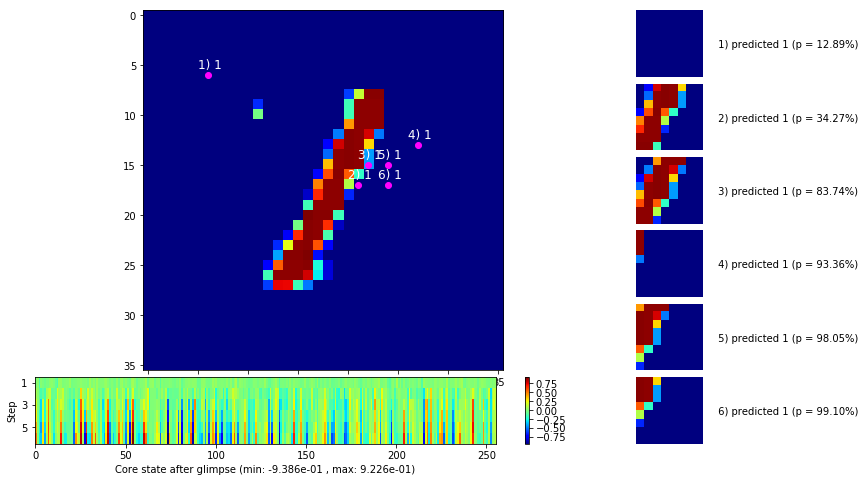

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


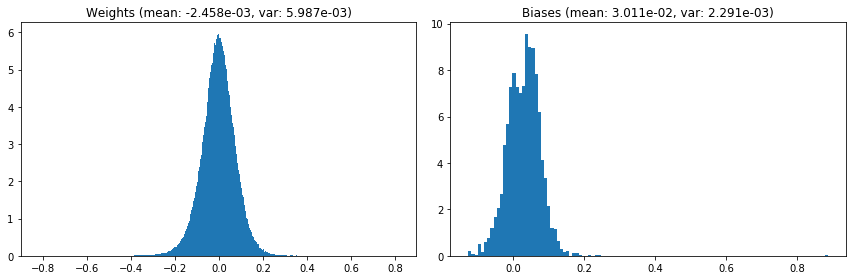

                                      Location network weights and biases


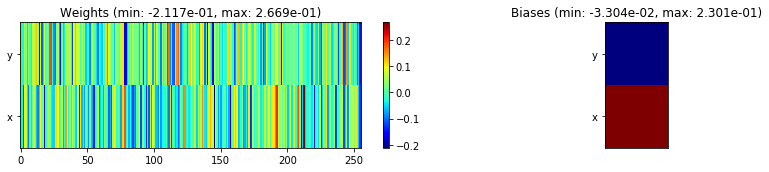

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.65 sec | TRAIN >> class loss: 0.3396 | steps:  2.517 :( | reward:  0.8873 :( | acc.: 88.733% :(
                          | VAL   >> class loss: 0.2997 | steps:  2.265 :( | reward:  0.8978 :( | acc.: 89.780% :(



			---~~~=== End of training ===~~~---

Evaluating on the TEST dataset...

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


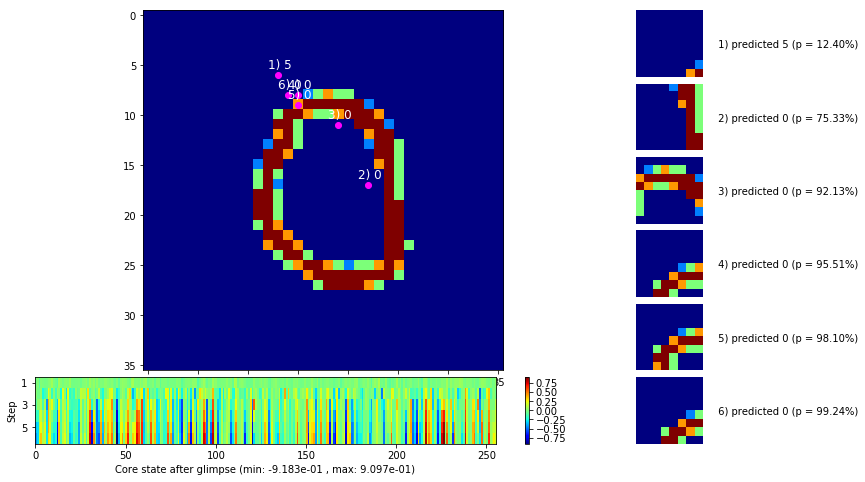


	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


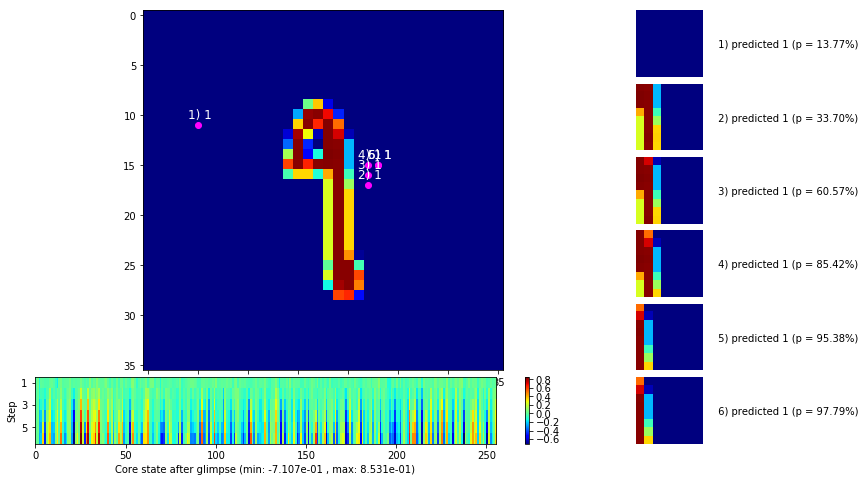

	>> class loss: 0.3003 | steps:  2.303 | reward:  0.9012 | acc.: 90.120%


In [8]:
model_info, train_info, val_info, test_info, epochs = train_eval_loop(
    model = model, epochs = num_epochs, image_size = image_size,
    train_data = train_data, val_data = val_data, test_data = test_data,
    padding = padding, optimizer = optimizer, lr_scheduler = lr_scheduler,
    class_criterion = class_criterion, error_penalty = error_penalty,
    loc_std = loc_std, random_start_loc = random_start_loc, gamma = gamma,
    grad_clip = grad_clip, steps_per_epoch = steps_per_epoch,
    max_ep_len = max_ep_len, log_freq = log_freq, viz_freq = viz_freq,
    early_stopping = early_stopping, eval_viz_freq = eval_viz_freq
)

In [9]:
print('Trained over %d epochs\n' % epochs)

for name, best_stats in zip(['train', 'val'], [train_info['bests'], val_info['bests']]):
    print('Best %s stats:' % name)
    for k, v in best_stats.items():
        print('    %s: %.2f (epoch %d)' % (k, v[k], v['epoch']))
    print('')

Trained over 51 epochs

Best train stats:
    steps: 2.50 (epoch 43)
    reward: 0.89 (epoch 19)
    accuracy: 0.89 (epoch 19)

Best val stats:
    steps: 2.24 (epoch 41)
    reward: 0.92 (epoch 19)
    accuracy: 0.92 (epoch 19)



### Training curves

In [10]:
epoch_range = range(1, epochs+1)
train_col = (1, 0, 0); train_err_col = (1, 0.1, 0.1)
val_col = (0, 0, 1); val_err_col = (0.1, 0.1, 1)

Text(0.5,1,'Weight and bias values over training time')

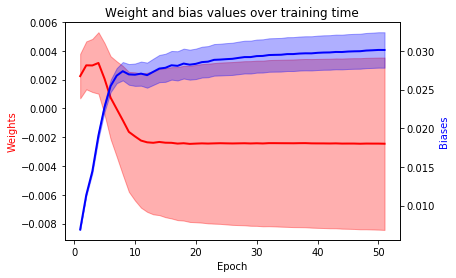

In [11]:
wts_mean = np.array(model_info['weights']['mean'])
wts_var = np.array(model_info['weights']['var'])
bias_mean = np.array(model_info['biases']['mean'])
bias_var = np.array(model_info['biases']['var'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_mean, color = train_col, linewidth = 2)
wts_ax.fill_between(epoch_range,
    wts_mean - wts_var, wts_mean + wts_var,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_mean, color = val_col, linewidth = 2)
bias_ax.fill_between(epoch_range,
    bias_mean - bias_var, bias_mean + bias_var,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Weight and bias values over training time')

Text(0.5,1,'Max absolute weight and bias values over training time')

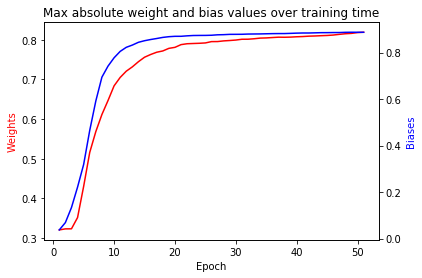

In [12]:
wts_absmax = np.array(model_info['weights']['abs max'])
bias_absmax = np.array(model_info['biases']['abs max'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_absmax, color = train_col)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_absmax, color = val_col)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Max absolute weight and bias values over training time')

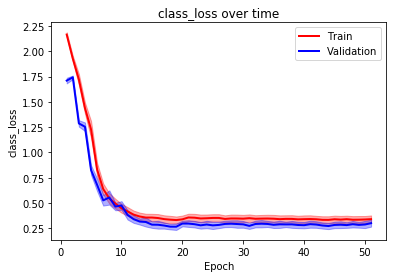

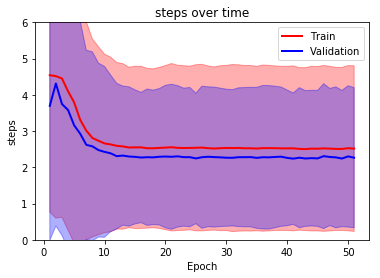

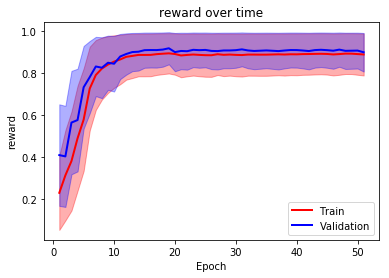

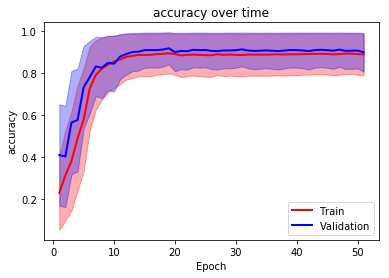

In [13]:
things_to_plot = ['class_loss', 'steps', 'reward', 'accuracy']
for thing in things_to_plot:
    train_avg = np.array([info['averages'][thing] for info in train_info['stats']])
    train_err = np.array([np.var(info['histories'][thing]) for info in train_info['stats']])
    
    val_avg = np.array([info['averages'][thing] for info in val_info['stats']])
    val_err = np.array([np.var(info['histories'][thing]) for info in val_info['stats']])
    
    plt.plot(epoch_range, train_avg, color = train_col, linewidth = 2)
    plt.plot(epoch_range, val_avg, color = val_col, linewidth = 2)
    plt.fill_between(epoch_range,
        train_avg - train_err, train_avg + train_err, alpha = 0.35,
        edgecolor = train_col, facecolor = train_err_col
    )
    plt.fill_between(epoch_range,
        val_avg - val_err, val_avg + val_err, alpha = 0.35,
        edgecolor = val_col, facecolor = val_err_col
    )
    if thing == 'steps':
        plt.ylim([0, 6])
    plt.legend(['Train', 'Validation'], loc = 'upper right' if thing in ['class_loss', 'steps'] else 'lower right')
    plt.xlabel('Epoch'); plt.ylabel(thing)
    plt.title('%s over time' % thing)
    plt.show()
    print('')

Text(0.5,1,'Gradient norms over training time')

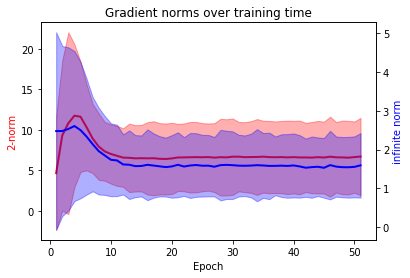

In [14]:
# Gradient stats
grad_2norm = np.array([info['averages']['grad_2norm'] for info in train_info['stats']])
grad_inf_norm = np.array([info['averages']['grad_inf_norm'] for info in train_info['stats']])
grad_2norm_err = np.array([np.var(info['histories']['grad_2norm']) for info in train_info['stats']])
grad_inf_norm_err = np.array([np.var(info['histories']['grad_inf_norm']) for info in train_info['stats']])

fig, pnorm_ax = plt.subplots()
pnorm_ax.plot(epoch_range, grad_2norm, color = train_col, linewidth = 2)
pnorm_ax.fill_between(epoch_range,
    grad_2norm - grad_2norm_err, grad_2norm + grad_2norm_err,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
pnorm_ax.set_xlabel('Epoch');
pnorm_ax.set_ylabel('2-norm', color = train_col)

infnorm_ax = pnorm_ax.twinx()
infnorm_ax.plot(epoch_range, grad_inf_norm, color = val_col, linewidth = 2)
infnorm_ax.fill_between(epoch_range,
    grad_inf_norm - grad_inf_norm_err, grad_inf_norm + grad_inf_norm_err,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
infnorm_ax.set_ylabel('infinite norm', color = val_col)

plt.title('Gradient norms over training time')